In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#imports for k-means
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

from MissingValues_2 import remove_missing_values
from outliers import countOutliers
from outliers import removeOutliers
from formula_1_2_correction import correct_ps_values

from sklearn.metrics import *
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from scipy.stats import mode
from scipy.spatial.distance import pdist,squareform
from scipy.cluster.hierarchy import linkage, dendrogram

from itertools import combinations

from scipy.cluster.hierarchy import fcluster

import matplotlib.cm as cm
import pickle

import ipympl
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

C:\Users\madda\Desktop\Magistrale\Secondo Anno\DataMining\outliers.py:3: UserWarning: 
This call to matplotlib.use() has no effect because the backend has already
been chosen; matplotlib.use() must be called *before* pylab, matplotlib.pyplot,
or matplotlib.backends is imported for the first time.

The backend was *originally* set to 'module://ipykernel.pylab.backend_inline' by the following code:
  File "C:\Users\madda\Anaconda3\lib\runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "C:\Users\madda\Anaconda3\lib\runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "C:\Users\madda\Anaconda3\lib\site-packages\traitlets\config\application.py", line 658, in launch_instance
    app.start()
  File "C:\Users\madda\Anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 486, in start
    self.io_loop.start()
  File "C:\Users\ma

In [23]:
def barChart(df, title_, xlabel_, ylabel_, legend, legend_title, xticks_, save, rotation_,yscale=False,yaxis=[]):
    ax=df.plot(kind='bar', figsize=(10,6), width=0.9, fontsize=14)
    ax.set_title(title_, {'fontsize':20})
    ax.set_xlabel(xlabel_, { 'size'   : 17})
    ax.set_ylabel(ylabel_,  {'size'   : 17})
    if(len(xticks_)>0):
        x_pos = [i for i, _ in enumerate(xticks_)]
        plt.xticks(x_pos, xticks_, rotation=rotation_)
    if(yscale):
        plt.yscale('log')
    if(len(yaxis)>0):
        ax.yaxis.set_ticks(yaxis)
    if legend:
        leg=ax.legend(fontsize=12, loc='center left', bbox_to_anchor=(1, 0.7))
        leg.set_title(title=legend_title,  prop = {'size':'x-large'})
    else:
        leg=ax.legend()
        leg.set_visible(False)
    plt.grid(color='grey', linestyle='--', linewidth=0.5)
    if save : 
        plt.savefig(title_+'.pdf', dpi=1000, bbox_inches = "tight", pad_inches = 1)
    plt.show()

def kmeans(data, min_k, max_k): #wantSil = True if i want also the silhouette
               
    X = scaler.fit_transform(data.values)
    sse_list = list()
    sil = list()
    labels_=list()
    centers_=list()
    
    for k in range(min_k,max_k):
        kmeans = KMeans(init='k-means++', n_clusters=k, n_init=10, max_iter=100)
        kmeans.fit(X)
        sse = kmeans.inertia_
        sse_list.append(sse)
        labels_.append(kmeans.labels_)
        centers_.append(kmeans.cluster_centers_)
        sil.append(silhouette_score(X, kmeans.labels_))
        
    return sse_list,sil,labels_,centers_

def plot_sse(sse):
    
    plt.plot(sse)
    plt.ylabel('SSE', fontsize=22)
    plt.xlabel('K', fontsize=22)
    plt.tick_params(axis='both', which='major', labelsize=22)
    plt.show()
    
def analyze_km(df,labels,centers_,sil):
        
        print('Silhouette: ',sil)
        hist, bins = np.histogram(labels, bins=range(0, len(set(labels)) + 1))
        d=dict(zip(bins, hist))
        print(d)

        td=scaler.fit_transform(df.values)
        
        centers=centers_
        #centers = scaler.inverse_transform(centers_)

        n_clusters=len(centers)
        
        fig, (ax1) = plt.subplots(1, 1)
        fig.set_size_inches(15, 6)

        ax1.set_xlim([-0.5, 1])
        ax1.set_ylim([0, len(df) + (n_clusters + 1) * 10])

        silhouette_avg = sil
        
        cluster_labels=labels
        sample_silhouette_values = silhouette_samples(td, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()
            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-1,-0.9,-0.8,-0.7,-0.6,-0.5,-0.4,-0.3,-0.2,-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        
        plt.figure(figsize=(15, 6))
        for i in range(0, len(centers)):
            plt.plot(centers[i], marker='o', label='Cluster %s' % i)
        plt.tick_params(axis='both', which='major', labelsize=22)
                
        plt.xticks(range(0,len(df.columns)), df.columns, fontsize=18)
        plt.legend(fontsize=20)
        plt.show()

def plotbar(df1,labels_,title,yscale=False):
    
    labels=labels_
    df1['Lab']=labels
    dts=[]
    for i in range(0, len(set(df1['Lab'].values))):
        dts.append(df1.loc[df1['Lab']==i].drop("Lab", axis=1))
        
    s=[]
    for i in range(0,len(dts)):
        s.append(pd.DataFrame(dts[i].agg({#'limit':np.mean,
                'ps_m':np.mean,
                #'ba_m':np.mean,
                #'pa_m':np.mean,
                'age':np.mean,
                
                
                }),columns=['Cluster '+str(i)]))
    result = pd.concat(s, axis=1, sort=False)

    barChart(result.T,title,"Clusters","Values",True,'Crimes',result.T.index,0,90,yscale)
    df1.drop('Lab',axis=1,inplace=True)
    return result        
        
def figure3d(df,labels):
    
    Xlab=df.columns[0]
    Ylab=df.columns[1]
    Zlab=df.columns[2]
    
    X=scaler.fit_transform(df[[Xlab]])
    Y=scaler.fit_transform(df[[Ylab]])
    Z=scaler.fit_transform(df[[Zlab]])
    
    X=X.reshape(1,len(X))
    Y=Y.reshape(1,len(Y))
    Z=Z.reshape(1,len(Z))
    
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X[0],Y[0],Z[0], c=labels)
    ax.set_xlabel(Xlab)
    ax.set_ylabel(Ylab)
    ax.set_zlabel(Zlab)
    
    plt.show()

In [5]:
#load dataset into a dataframe
credit_cards = pd.read_csv("credit_default_train.csv")

data = remove_missing_values(credit_cards)

In [92]:
data=correct_ps_values(data)
data.head()

,limit,sex,education,status,age,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,...,ba-jun,ba-may,ba-apr,pa-sep,pa-aug,pa-jul,pa-jun,pa-may,pa-apr,credit_default
0,50000,male,graduate school,single,25,2,0,0,0,0,...,49535,30358,30302,2130,1905,1811,1100,1100,1200,no
1,200000,male,university,married,54,-1,-1,-1,-1,-1,...,6335,4616,7956,10120,7852,6336,4622,7956,5499,no
2,30000,female,high school,married,39,2,3,2,2,2,...,30496,29731,29047,0,1700,1100,3,1053,1303,no
3,140000,female,university,single,31,0,0,0,0,0,...,25224,26855,23783,2000,2000,900,2000,10000,5000,no
4,60000,female,high school,married,36,1,2,2,0,0,...,48738,49601,52773,1788,0,1894,1801,3997,0,yes


In [6]:
scaler=MinMaxScaler()

In [318]:
data['ps_m']=(data['ps-aug']+data['ps-jul']+data['ps-jun']+data['ps-may']+data['ps-apr'])/5

In [319]:
data.head()

,limit,sex,education,status,age,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,...,ba-may,ba-apr,pa-sep,pa-aug,pa-jul,pa-jun,pa-may,pa-apr,credit_default,ps_m
0,50000,male,graduate school,single,25,2,0,0,0,0,...,30358,30302,2130,1905,1811,1100,1100,1200,no,0.0
1,200000,male,university,married,54,-1,-1,-1,-1,-1,...,4616,7956,10120,7852,6336,4622,7956,5499,no,-1.0
2,30000,female,high school,married,39,2,3,2,2,2,...,29731,29047,0,1700,1100,3,1053,1303,no,1.8
3,140000,female,university,single,31,0,0,0,0,0,...,26855,23783,2000,2000,900,2000,10000,5000,no,0.0
4,60000,female,high school,married,36,1,2,2,0,0,...,49601,52773,1788,0,1894,1801,3997,0,yes,0.8


In [320]:
data['ba_m']=(data['ba-aug']+data['ba-jul']+data['ba-jun']+data['ba-may']+data['ba-apr'])/5

In [321]:
data['pa_m']=(data['pa-sep']+data['pa-aug']+data['pa-jul']+data['pa-jun']+data['pa-may']+data['pa-apr'])/6

In [322]:
df=data[['limit','ps-sep','ba-sep','ps_m','ba_m','pa_m','age']]

In [323]:
df.head()

,limit,ps-sep,ba-sep,ps_m,ba_m,pa_m,age
0,50000,2,48966,0.0,42188.0,1541.000000,25
1,200000,-1,10755,-1.0,7346.2,7064.166667,54
2,30000,2,30057,1.8,29752.0,859.833333,39
3,140000,0,56426,0.0,32080.4,3650.000000,31
4,60000,1,47987,0.8,49492.0,1580.000000,36


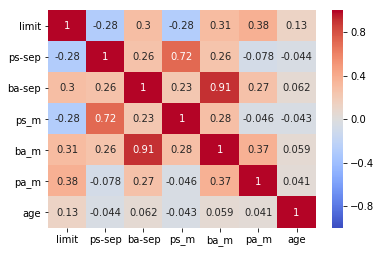

In [165]:
corr=df.corr()
ax = plt.axes()
sns.heatmap(corr, ax = ax,
                xticklabels=corr.columns.values, annot=True,
                yticklabels=corr.columns.values, cmap="coolwarm", vmax=1, vmin=-1)

In [324]:
sse,sil,lab,cent=kmeans(df,2,20)

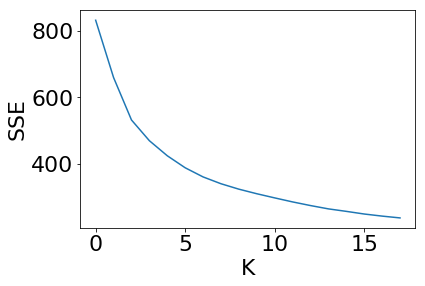

In [325]:
plot_sse(sse)

Sse:  469.73456326708856
Silhouette:  0.2507398864962809
{0: 2060, 1: 1812, 2: 1622, 3: 992, 4: 3514}


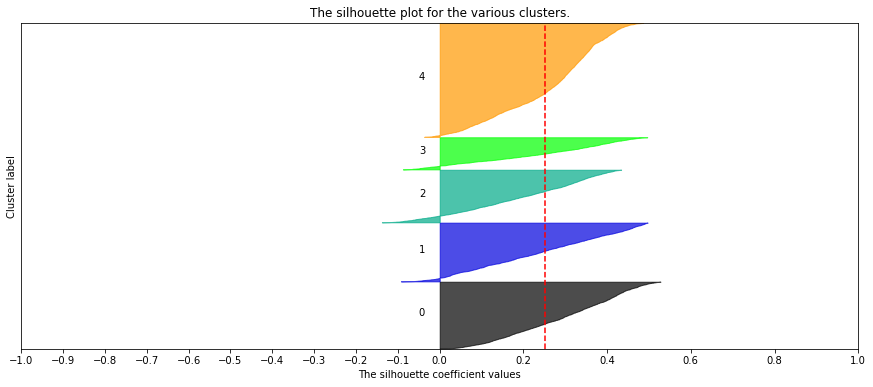

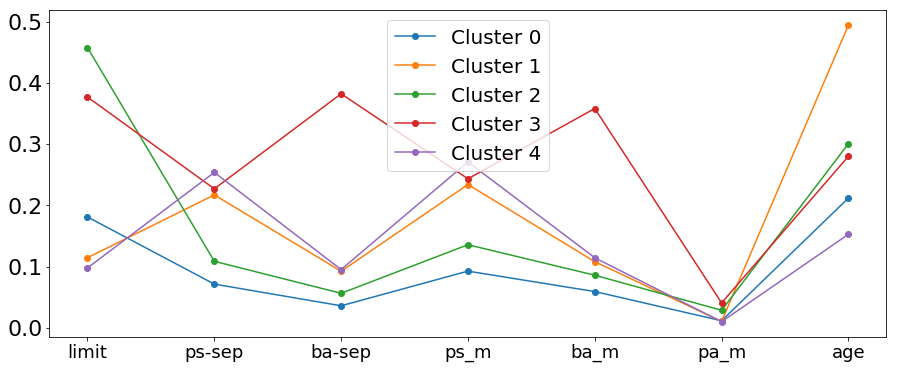

In [326]:
print('Sse: ',sse[3])
analyze_km(df,lab[3],cent[3],sil[3])

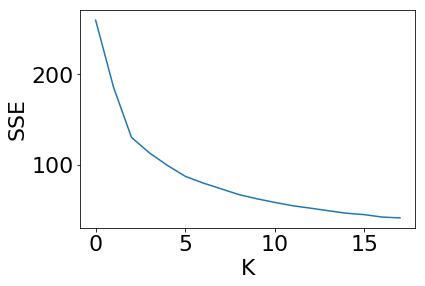

In [289]:
sse15,sil15,lab15,cent15=kmeans(df[['ps_m','ps-sep','ba-sep','pa_m']],2,20)
plot_sse(sse15)

Sse:  113.32236077258362
Silhouette:  0.4232579345014179
{0: 4056, 1: 1262, 2: 3073, 3: 1295, 4: 314}


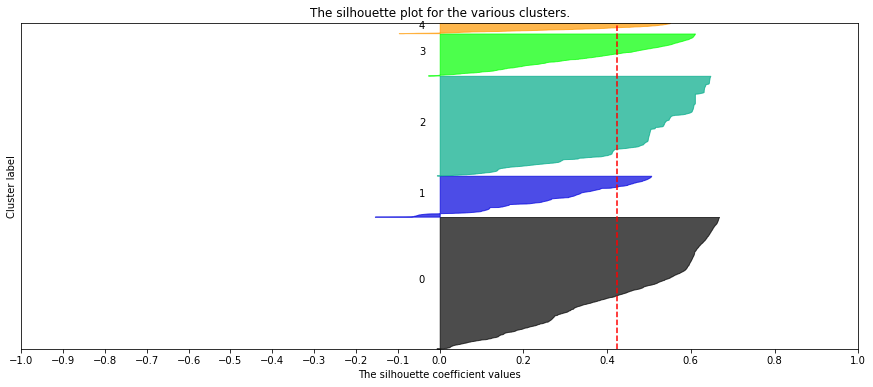

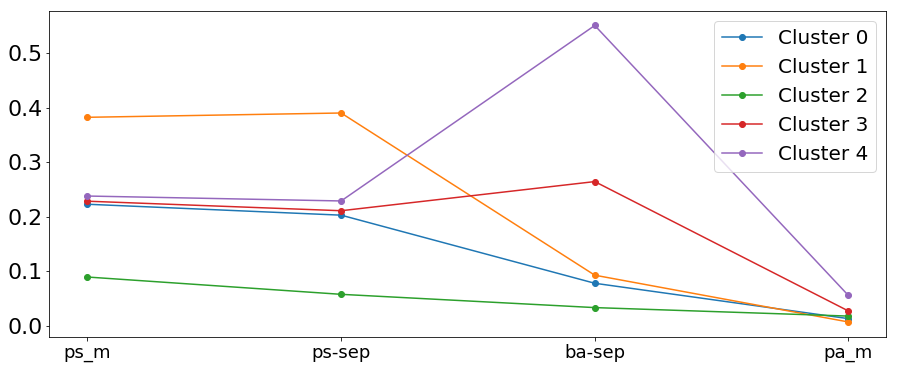

In [291]:
print('Sse: ',sse15[3])
analyze_km(df[['ps_m','ps-sep','ba-sep','pa_m']],lab15[3],cent15[3],sil15[3])

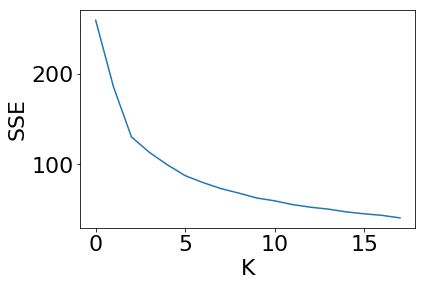

In [293]:
sse16,sil16,lab16,cent16=kmeans(data[['ps-sep','ba-sep','pa_m','ps_m']],2,20)
plot_sse(sse16)

Sse:  113.32345433875977
Silhouette:  0.4229896951168659
{0: 3074, 1: 4057, 2: 1293, 3: 1262, 4: 314}


<IPython.core.display.Javascript object>


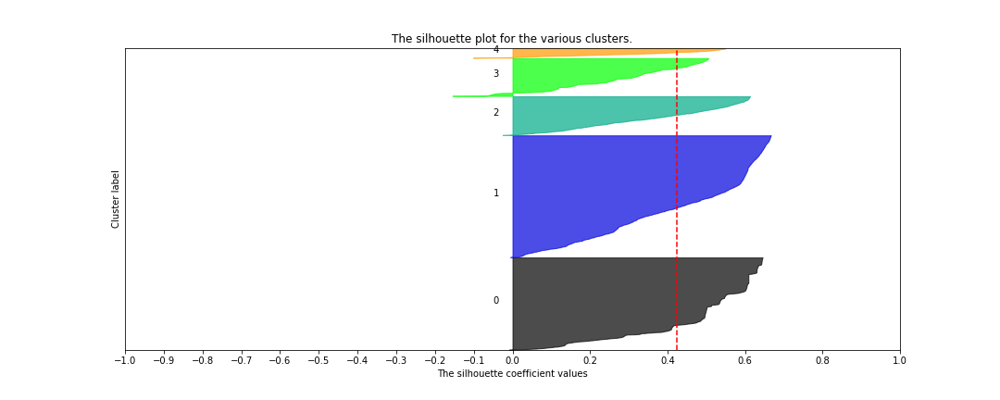

<IPython.core.display.Javascript object>


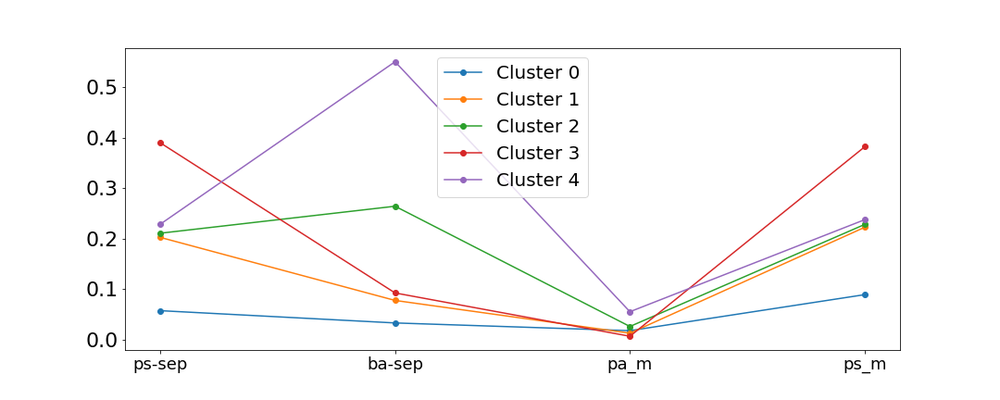

In [306]:
print('Sse: ',sse16[3])
analyze_km(data[['ps-sep','ba-sep','pa_m','ps_m']],lab16[3],cent16[3],sil16[3])

In [224]:
df1=df[['limit', 'ba-sep','ps-sep']].copy()

In [171]:
sse1,sil1,lab1,cent1=kmeans(df1,2,20)

C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


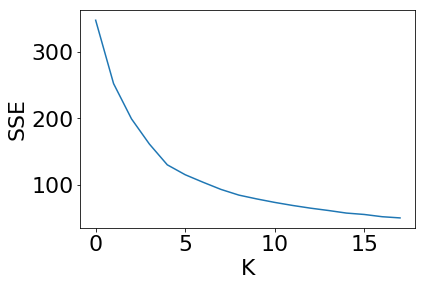

In [59]:
plot_sse(sse1)

Sse:  161.18028478346625
Silhouette:  0.3673241502115657
{0: 2333, 1: 1569, 2: 1288, 3: 3744, 4: 1066}


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


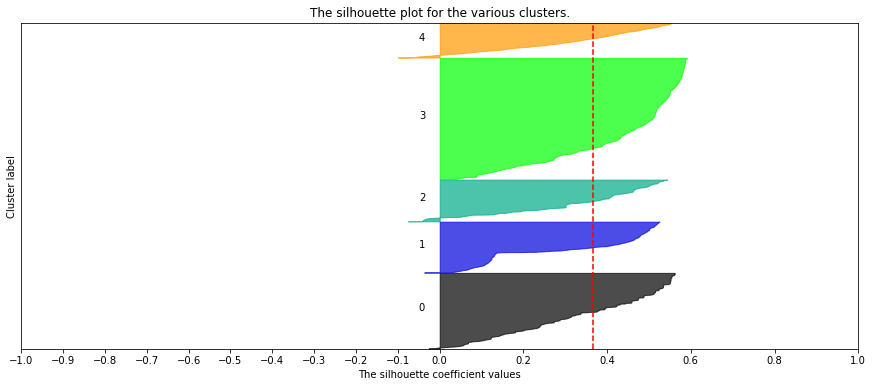

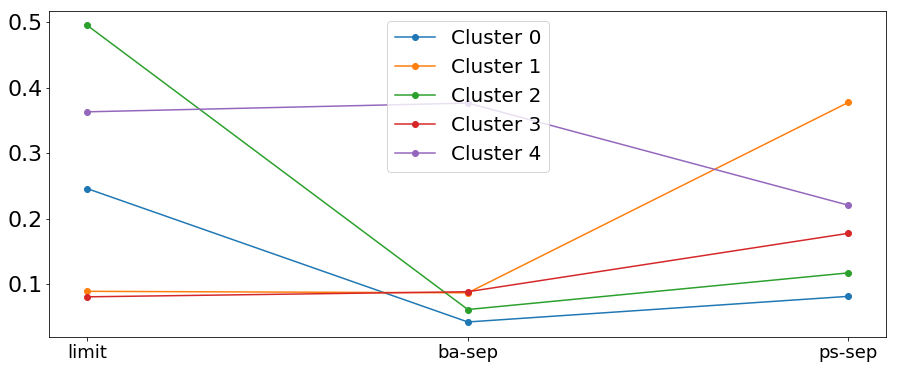

In [172]:
print('Sse: ',sse1[3])
analyze_km(df1,lab1[3],cent1[3],sil1[3])

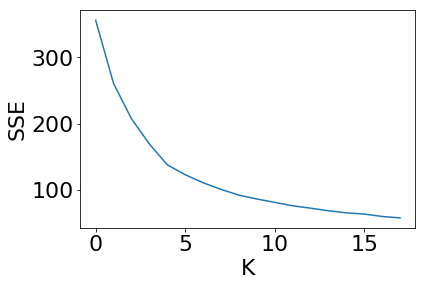

In [225]:
df2=df[['limit', 'ba-sep','ps-sep', 'pa_m']].copy()
sse2,sil2,lab2,cent2=kmeans(df2,2,20)
plot_sse(sse2)

SSe:  137.98739599197694
Silhouette:  0.38150020149155833
{0: 3274, 1: 1253, 2: 2092, 3: 1489, 4: 1461, 5: 431}


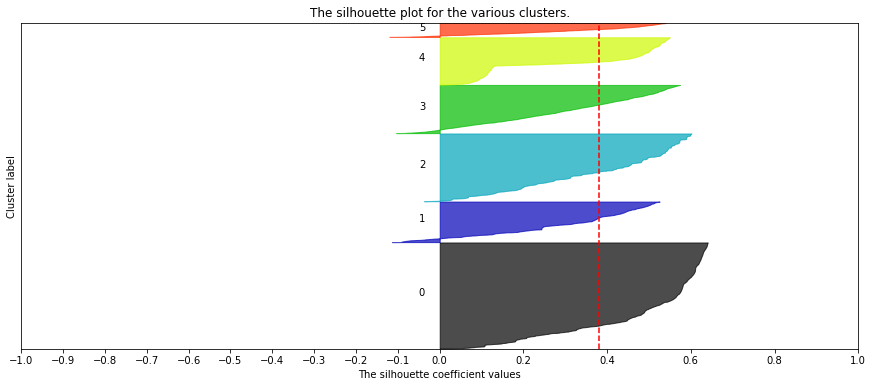

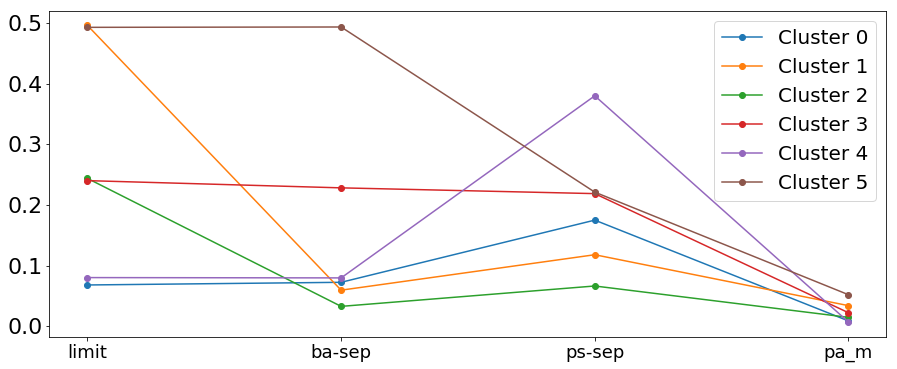

In [244]:
print('SSe: ',sse2[4])
analyze_km(df2,lab2[4],cent2[4],sil2[4])

In [230]:
df3=df2.copy()

In [231]:
df3['age']=data['age']
#df3.drop(['credit_default','Label'],axis=1,inplace=True)

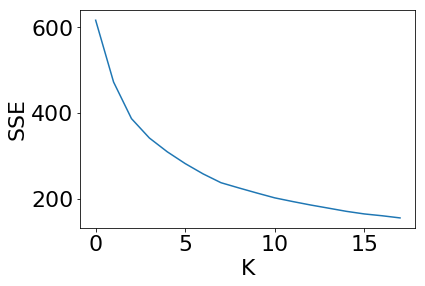

In [180]:
sse3,sil3,lab3,cent3=kmeans(df3,2,20)
plot_sse(sse3)

Sse:  281.82413314713585
Silhouette:  0.26935981566897854
{0: 1001, 1: 2628, 2: 1173, 3: 1191, 4: 1776, 5: 414, 6: 1817}


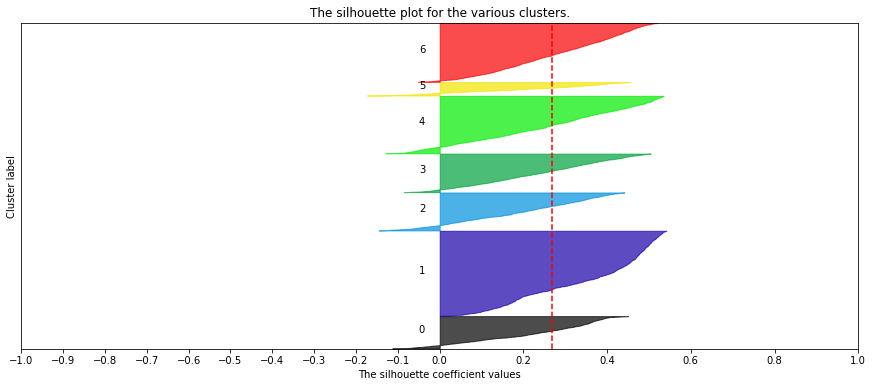

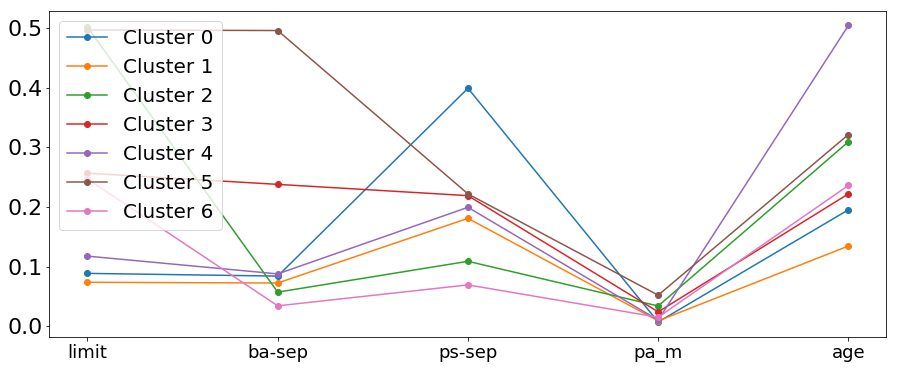

In [245]:
print('Sse: ',sse3[5])
analyze_km(df3,lab3[5],cent3[5],sil3[5])

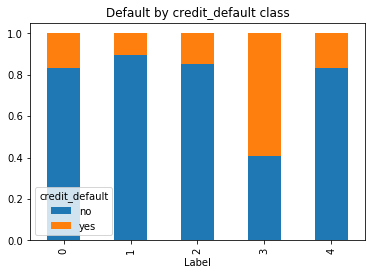

In [119]:
df3['Label'] = lab2[3]
df3['credit_default']=data['credit_default']
#pd.crosstab(credit_cards['credit_default'], credit_cards['Label'])
crosstab = pd.crosstab( df3['Label'], df3['credit_default'])
#crosstab_normalized = crosstab.div(crosstab.sum(1).astype(float), axis=0)
crosstab_normalized.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')

In [232]:
df4=df2.copy()
df4['ps_m']=data['ps_m']
df4.drop('pa_m',axis=1,inplace=True)
df4.head()

,limit,ba-sep,ps-sep,ps_m
0,50000,48966,2,0.0
1,200000,10755,-1,-1.0
2,30000,30057,2,1.8
3,140000,56426,0,0.0
4,60000,47987,1,0.8


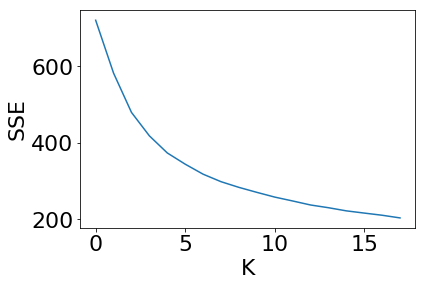

In [185]:
sse4,sil4,lab4,cent4=kmeans(df4,2,20)
plot_sse(sse4)

Sse:  192.52184510660652
Silhouette:  0.34442266120088266
{0: 3200, 1: 1319, 2: 460, 3: 2108, 4: 1703, 5: 1210}


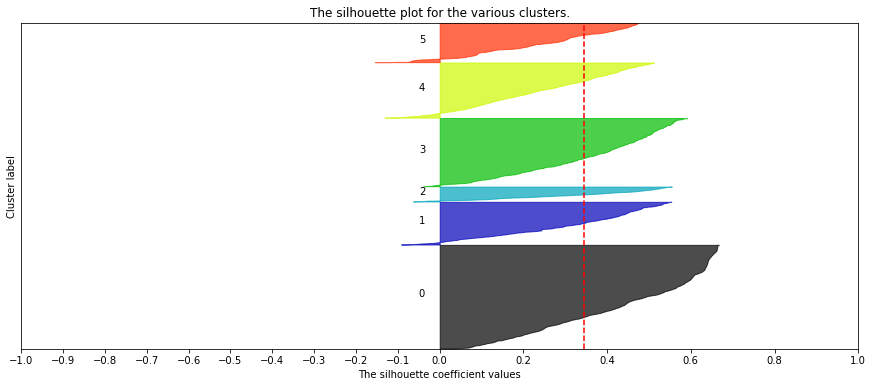

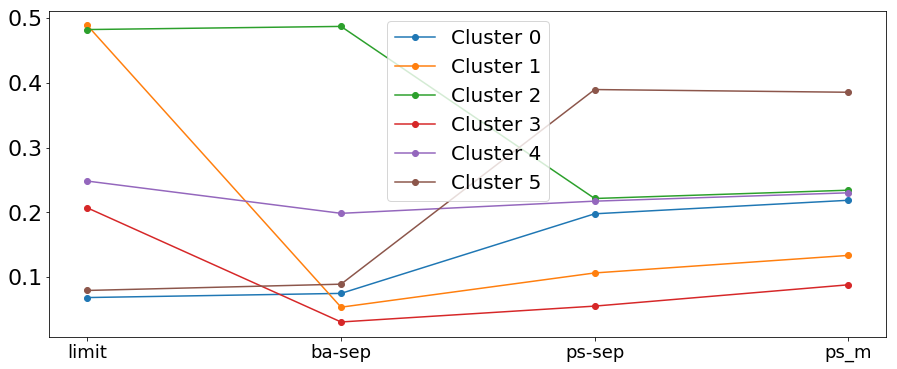

In [234]:
print('Sse: ',sse4[4])
analyze_km(df4,lab4[4],cent4[4],sil4[4])

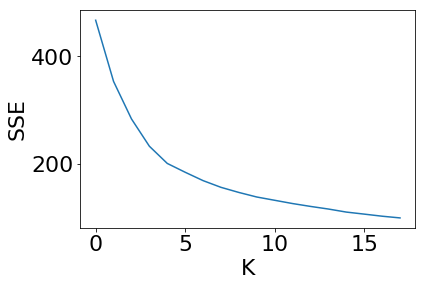

In [328]:
sse5,sil5,lab5,cent5=kmeans(df[['limit','ba-sep','ps-sep','ps_m','pa_m']],2,20)
plot_sse(sse5)

Sse:  232.60709300205642
Silhouette:  0.3385138970942769
{0: 4036, 1: 1500, 2: 2147, 3: 1018, 4: 1299}


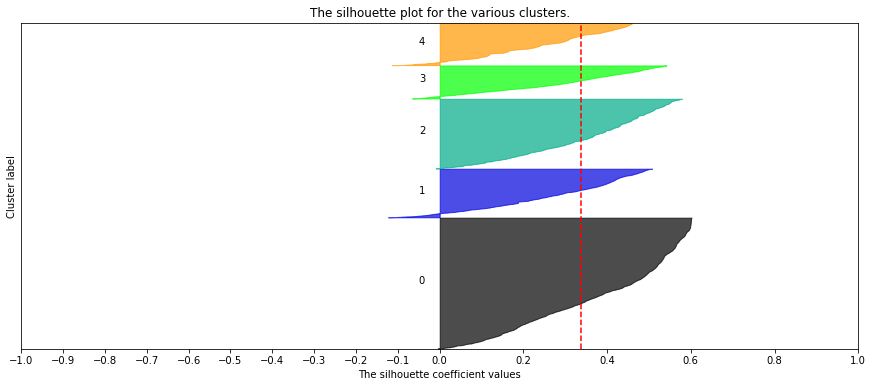

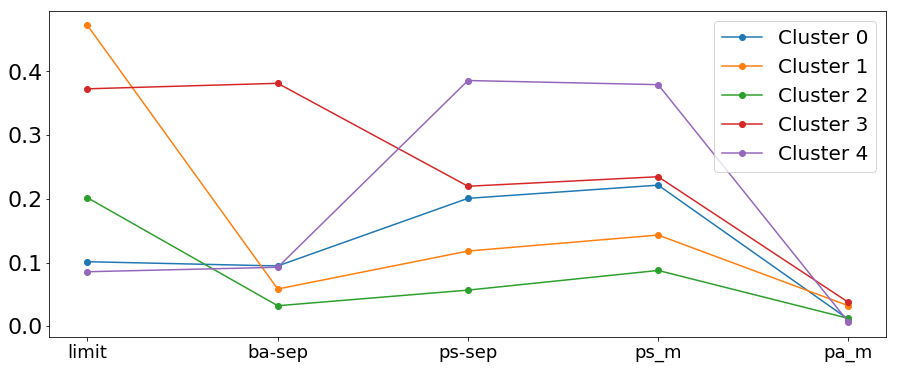

In [329]:
print("Sse: ",sse5[3])
analyze_km(df[['limit','ba-sep','ps-sep','ps_m','pa_m']],lab5[3],cent5[3],sil5[3])

In [331]:
education = sorted(data['education'].unique())
education_mapping = dict(zip(education, range(0, len(education) + 1)))
education_mapping

{'graduate school': 0, 'high school': 1, 'others': 2, 'university': 3}

In [332]:
data['Ed_map'] = data['education'].map(education_mapping).astype(int)

C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


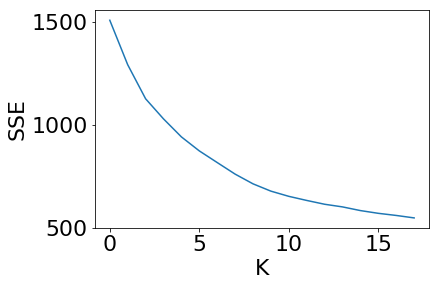

In [333]:
sse19,sil19,lab19,cent19=kmeans(data[['limit', 'ps-sep','ps-aug','ps-jul','ps-jun','ps-apr','ps-may','age','Ed_map']],2,20)
plot_sse(sse19)

Sse:  816.854496094761
Silhouette:  0.2314046266859279
{0: 547, 1: 1580, 2: 1175, 3: 472, 4: 1372, 5: 1741, 6: 1208, 7: 1905}


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


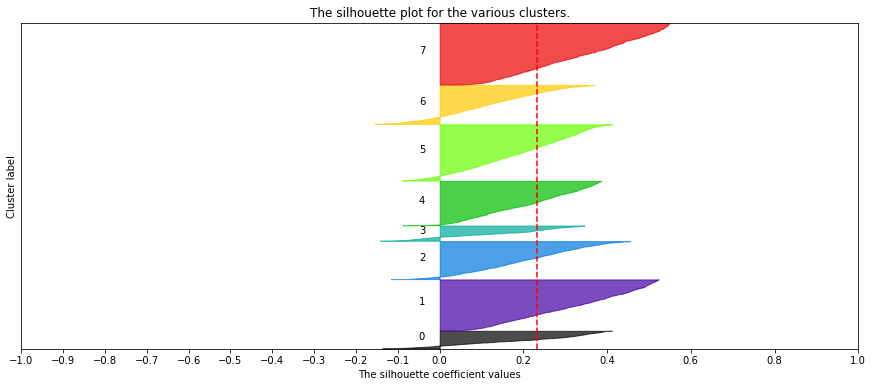

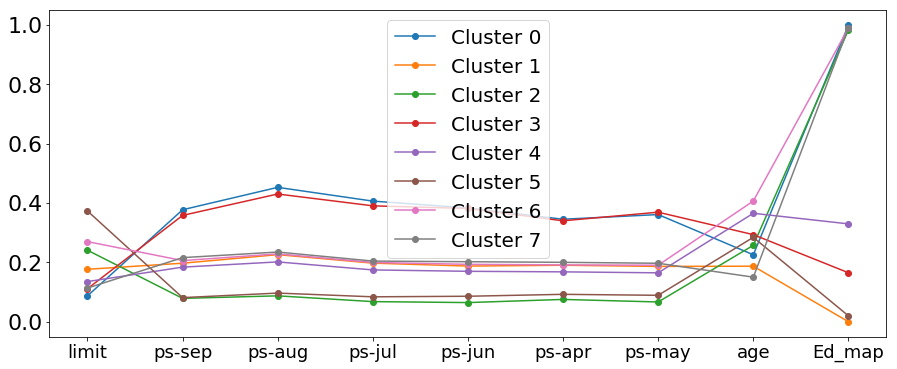

In [334]:
print("Sse: ",sse19[6])
analyze_km(data[['limit', 'ps-sep','ps-aug','ps-jul','ps-jun','ps-apr','ps-may','age','Ed_map']],lab19[6],cent19[6],sil19[6])

In [211]:
df6=df4.copy()
df6['education']=data['education']
df6['Ed_map'] = df6['education'].map(education_mapping).astype(int)
df6.drop('education',axis=1,inplace=True)

In [200]:
df6.head()

,limit,ba-sep,ps-sep,ps_m,Ed_map
0,50000,48966,2,0.0,0
1,200000,10755,-1,-1.0,3
2,30000,30057,2,1.8,1
3,140000,56426,0,0.0,3
4,60000,47987,1,0.8,1


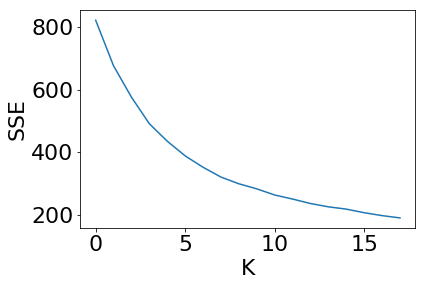

In [202]:
sse6,sil6,lab6,cent6=kmeans(df6,2,20)
plot_sse(sse6)

Sse:  434.9657309752433
Silhouette:  0.3346488013667197
{0: 1879, 1: 2674, 2: 661, 3: 1442, 4: 1711, 5: 1633}


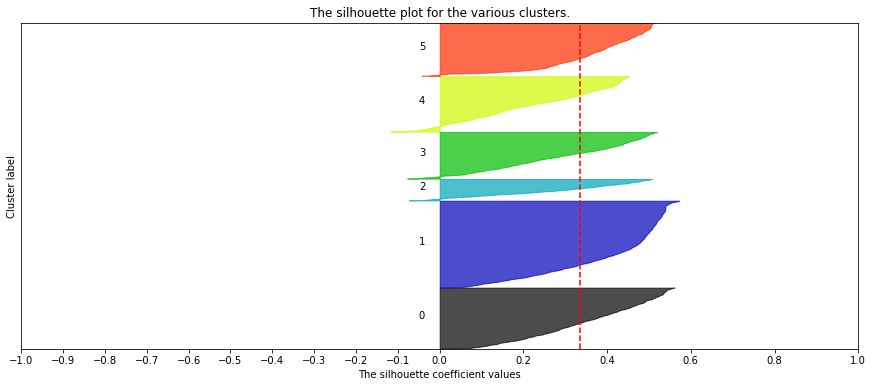

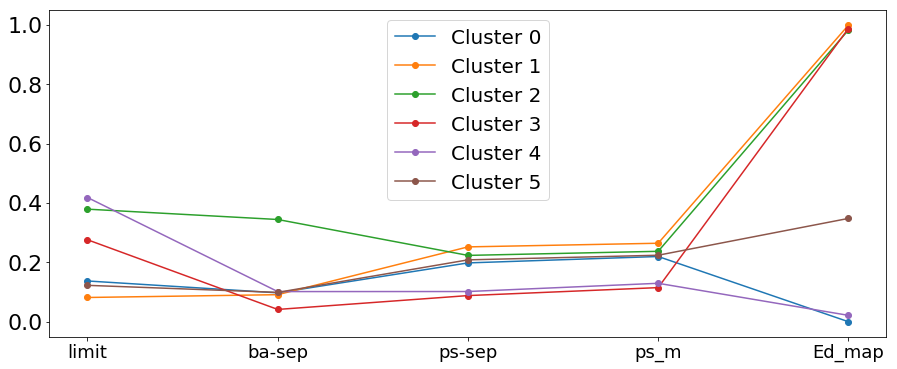

In [203]:
print("Sse: ",sse6[4])
analyze_km(df6,lab6[4],cent6[4],sil6[4])

In [239]:
df7=df4.copy()
df7['age']=data['age']

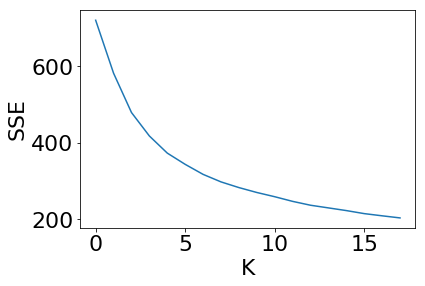

In [240]:
sse7,sil7,lab7,cent7=kmeans(df7,2,20)
plot_sse(sse7)

Sse:  343.9314965357315
Silhouette:  0.2512559187502836
{0: 1834, 1: 492, 2: 933, 3: 1247, 4: 2402, 5: 1453, 6: 1639}


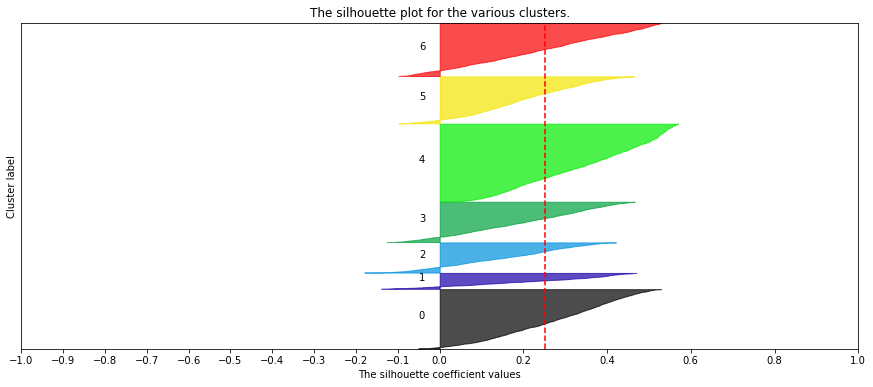

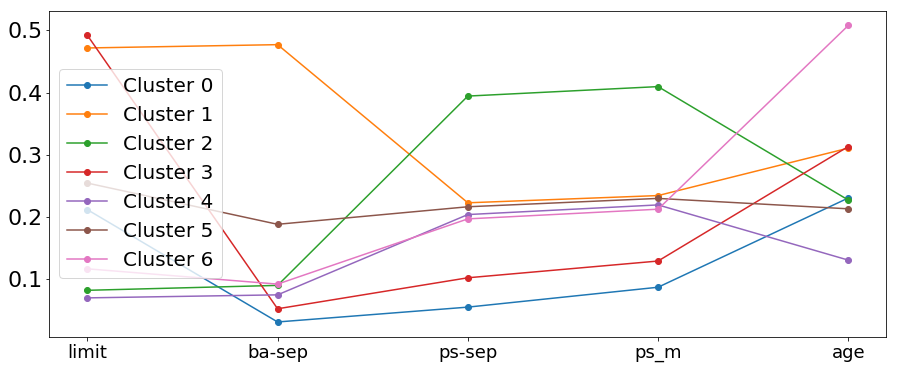

In [242]:
print("Sse: ",sse7[5])
analyze_km(df7,lab7[5],cent7[5],sil7[5])

# Media totale

In [5]:
#load dataset into a dataframe
credit_cards = pd.read_csv("credit_default_train.csv")
data1 = remove_missing_values(credit_cards)
data1=correct_ps_values(data1)

In [8]:
data1.head()

,limit,sex,education,status,age,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,...,ba-jun,ba-may,ba-apr,pa-sep,pa-aug,pa-jul,pa-jun,pa-may,pa-apr,credit_default
0,50000,male,graduate school,single,25,2,0,0,0,0,...,49535,30358,30302,2130,1905,1811,1100,1100,1200,no
1,200000,male,university,married,54,-1,-1,-1,-1,-1,...,6335,4616,7956,10120,7852,6336,4622,7956,5499,no
2,30000,female,high school,married,39,2,3,2,2,2,...,30496,29731,29047,0,1700,1100,3,1053,1303,no
3,140000,female,university,single,31,0,0,0,0,0,...,25224,26855,23783,2000,2000,900,2000,10000,5000,no
4,60000,female,high school,married,36,1,2,2,0,0,...,48738,49601,52773,1788,0,1894,1801,3997,0,yes


In [6]:
data1['ps_m']=(data1['ps-aug']+data1['ps-jul']+data1['ps-jun']+data1['ps-may']+data1['ps-apr']+data1['ps-sep'])/6
data1['ba_m']=(data1['ba-aug']+data1['ba-jul']+data1['ba-jun']+data1['ba-may']+data1['ba-apr']+data1['ba-sep'])/6
data1['pa_m']=(data1['pa-sep']+data1['pa-aug']+data1['pa-jul']+data1['pa-jun']+data1['pa-may']+data1['pa-apr'])/6

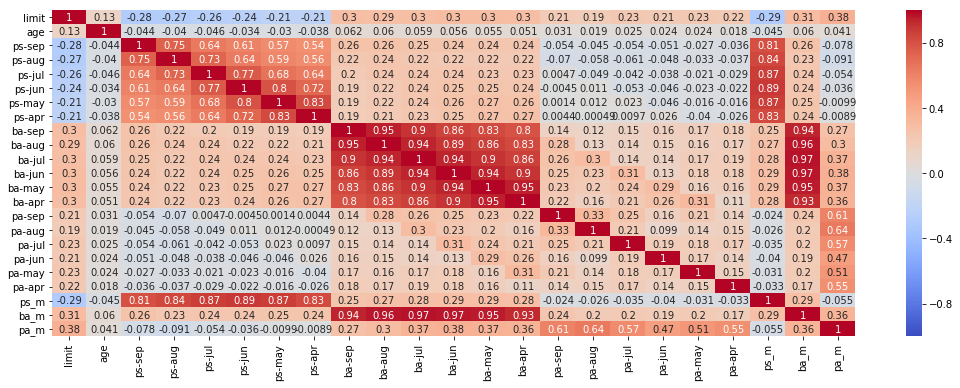

In [8]:
corr=data1.corr()
plt.subplots(figsize =(18,6))
ax = plt.axes()

sns.heatmap(corr, ax = ax,
                xticklabels=corr.columns.values, annot=True,
                yticklabels=corr.columns.values, cmap="coolwarm", vmax=1, vmin=-1)

In [94]:
sse20,sil20,lab20,cent20=kmeans(data1[['limit','ps_m','ba_m','pa_m']],2,20)

In [95]:
a=[sse20,sil20,lab20,cent20]
import pickle
pickle.dump(a,open('20','wb'))

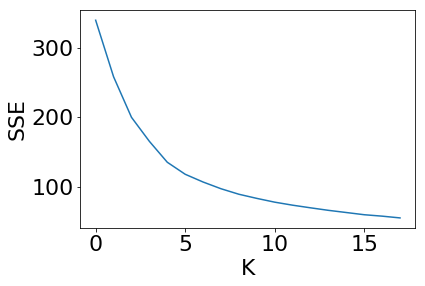

In [13]:
plot_sse(sse20)

Sse:  134.9386515322322
Silhouette:  0.38216039169176225
{0: 1395, 1: 3359, 2: 2182, 3: 897, 4: 1715, 5: 452}


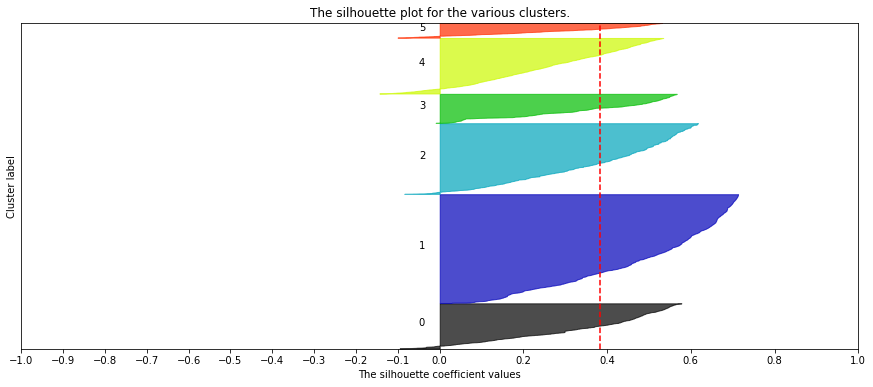

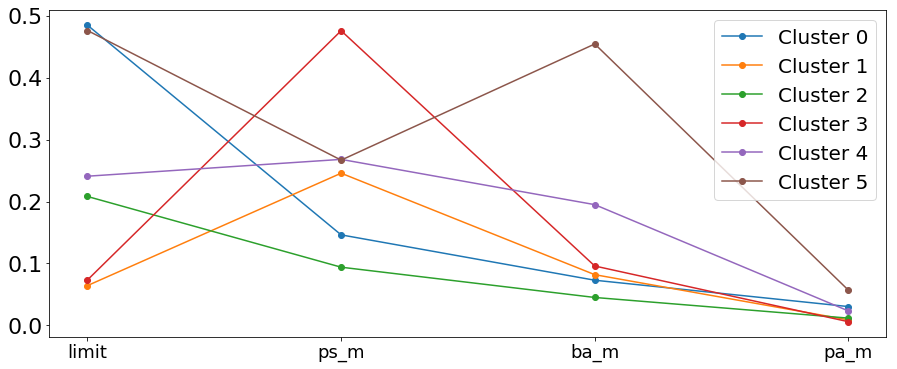

In [14]:
print('Sse: ',sse20[4])
analyze_km(data1[['limit','ps_m','ba_m','pa_m']],lab20[4],cent20[4],sil20[4])

<IPython.core.display.Javascript object>


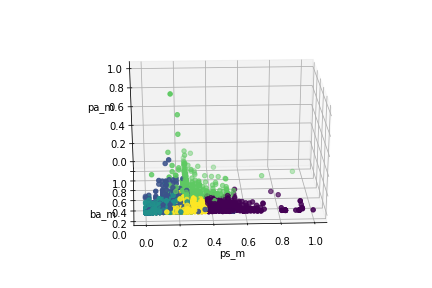

In [303]:
df=data1[['ps_m','ba_m','pa_m']]
labels=lab[3]
%matplotlib notebook

Xlab=df.columns[0]
Ylab=df.columns[1]
Zlab=df.columns[2]

X=scaler.fit_transform(df[[Xlab]])
Y=scaler.fit_transform(df[[Ylab]])
Z=scaler.fit_transform(df[[Zlab]])

X=X.reshape(1,len(X))
Y=Y.reshape(1,len(Y))
Z=Z.reshape(1,len(Z))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[0],Y[0],Z[0], c=labels)
ax.set_xlabel(Xlab)
ax.set_ylabel(Ylab)
ax.set_zlabel(Zlab)

plt.show()

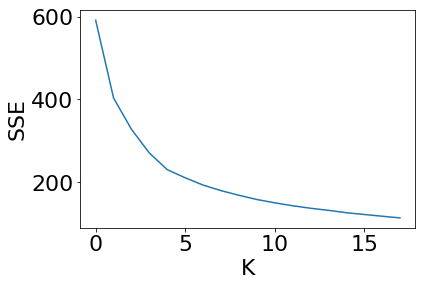

In [260]:
sse10,sil10,lab10,cent10=kmeans(data1[['limit','ps-sep','ba-sep','ps_m','ba_m','pa_m']],2,20)
plot_sse(sse10)

Sse:  270.73929112290114
Silhouette:  0.34280986615668796
{0: 1272, 1: 2208, 2: 3969, 3: 1502, 4: 1049}


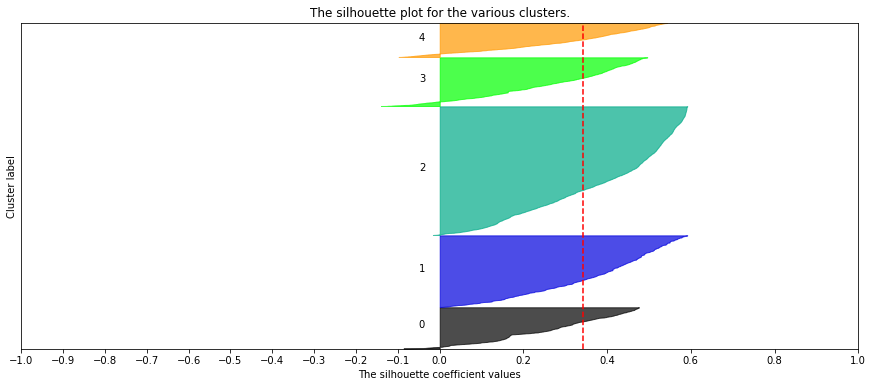

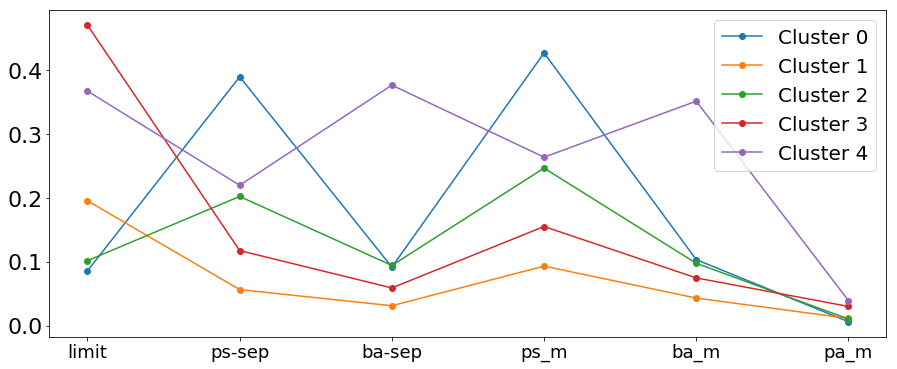

In [263]:
print('Sse: ',sse10[3])
analyze_km(data1[['limit','ps-sep','ba-sep','ps_m','ba_m','pa_m']],lab10[3],cent10[3],sil10[3])

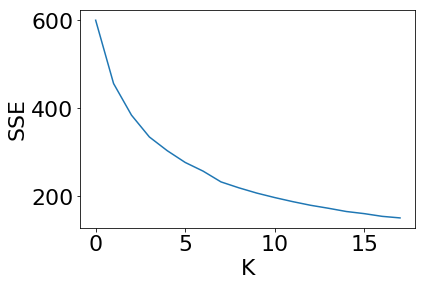

In [264]:
sse9,sil9,lab9,cent9=kmeans(data1[['limit','ps_m','ba_m','pa_m','age']],2,20)
plot_sse(sse9)

Sse:  334.92482870845805
Silhouette:  0.26895787836354484
{0: 3302, 1: 926, 2: 1484, 3: 1978, 4: 2310}


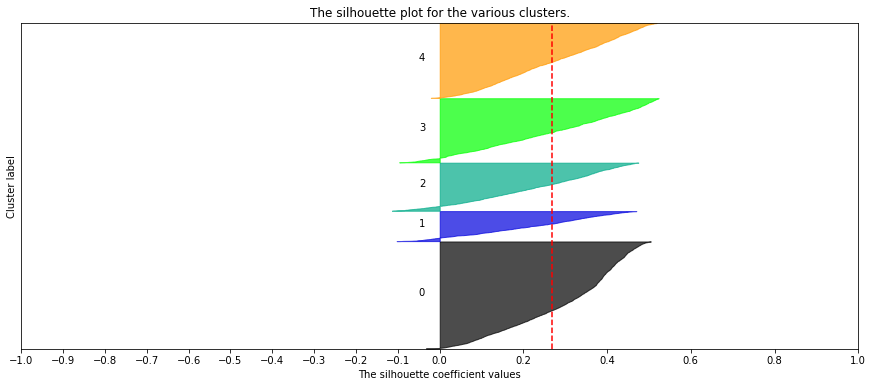

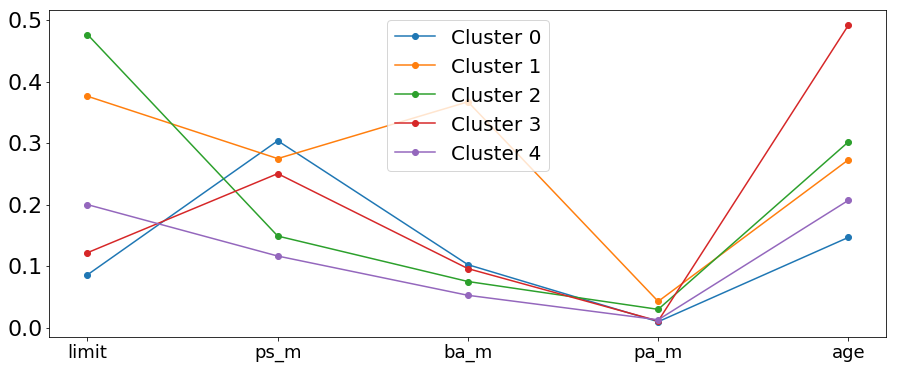

In [266]:
print('Sse: ',sse9[3])
analyze_km(data1[['limit','ps_m','ba_m','pa_m','age']],lab9[3],cent9[3],sil9[3])

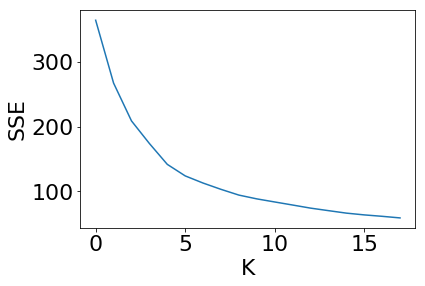

In [271]:
sse8,sil8,lab8,cent8=kmeans(data1[['limit','ps_m','ba-sep','pa_m']],2,20)
plot_sse(sse8)

Sse:  141.74366089475222
Silhouette:  0.37756285037147114
{0: 2277, 1: 1533, 2: 1412, 3: 435, 4: 3444, 5: 899}


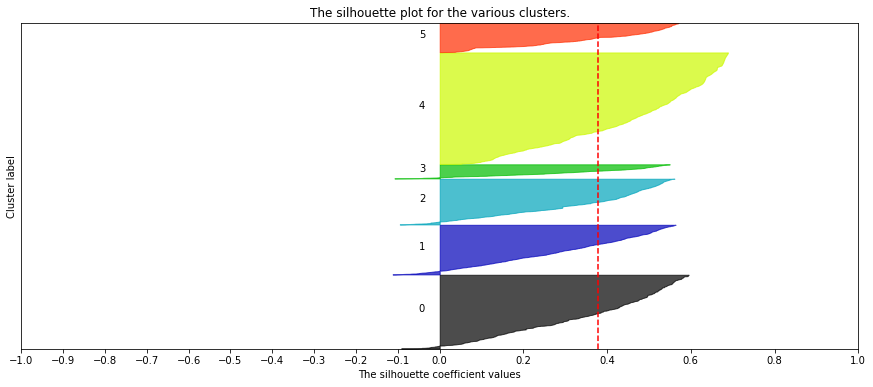

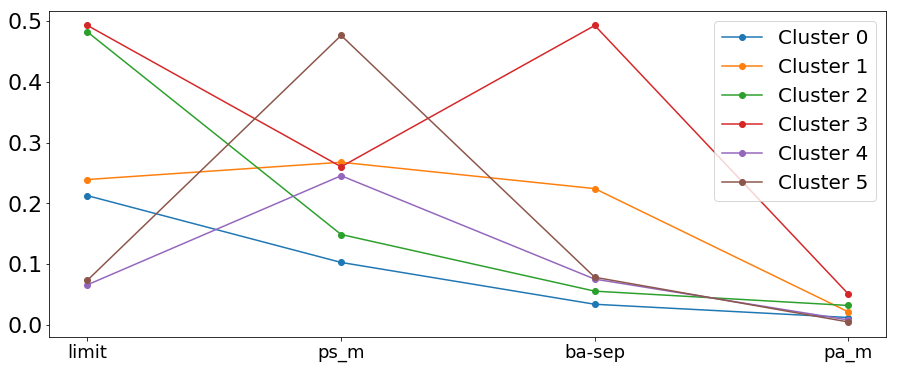

In [277]:
print('Sse: ',sse8[4])
analyze_km(data1[['limit','ps_m','ba-sep','pa_m']],lab8[4],cent8[4],sil8[4])

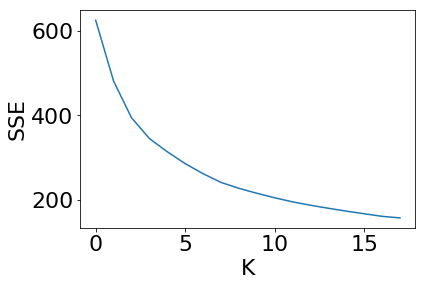

In [274]:
sse12,sil12,lab12,cent12=kmeans(data1[['limit','ps_m','ba-sep','pa_m','age']],2,20)
plot_sse(sse12)

Sse:  313.591674241659
Silhouette:  0.26371361002153665
{0: 2123, 1: 944, 2: 1228, 3: 855, 4: 1833, 5: 3017}


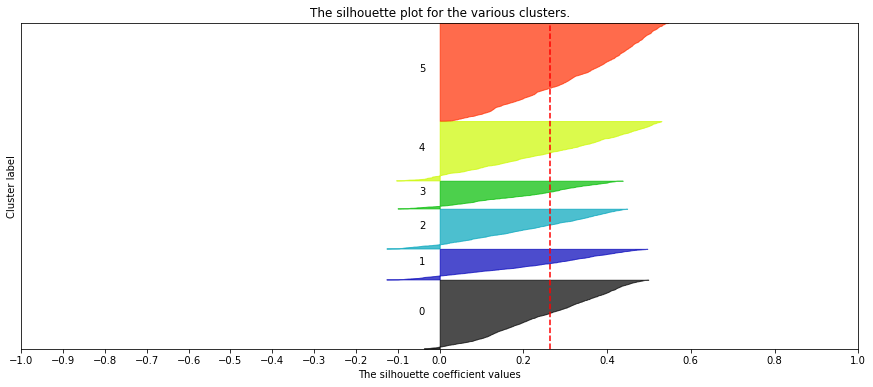

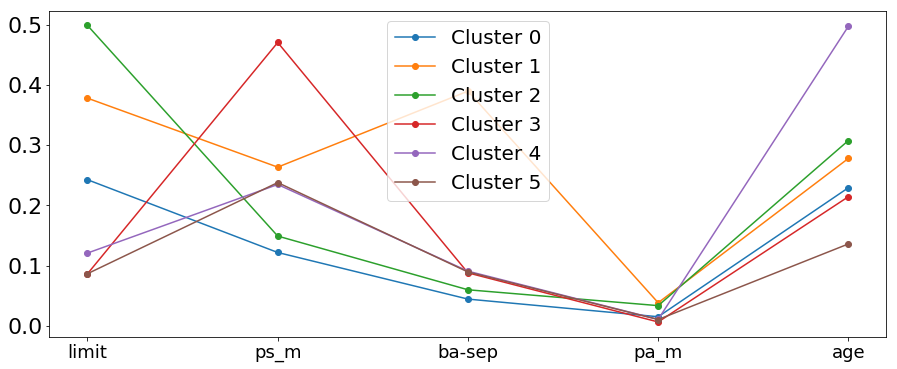

In [279]:
print('Sse: ',sse12[4])
analyze_km(data1[['limit','ps_m','ba-sep','pa_m','age']],lab12[4],cent12[4],sil12[4])

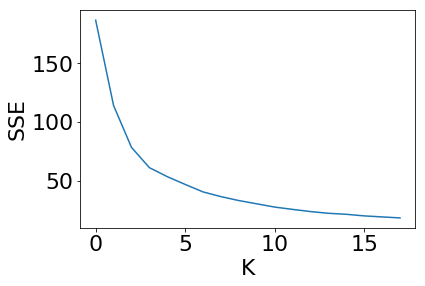

In [280]:
sse13,sil13,lab13,cent13=kmeans(data1[['ps_m','ba-sep','pa_m']],2,20)
plot_sse(sse13)

Sse:  61.09455776750343
Silhouette:  0.48463665461702177
{0: 4068, 1: 358, 2: 1380, 3: 977, 4: 3217}


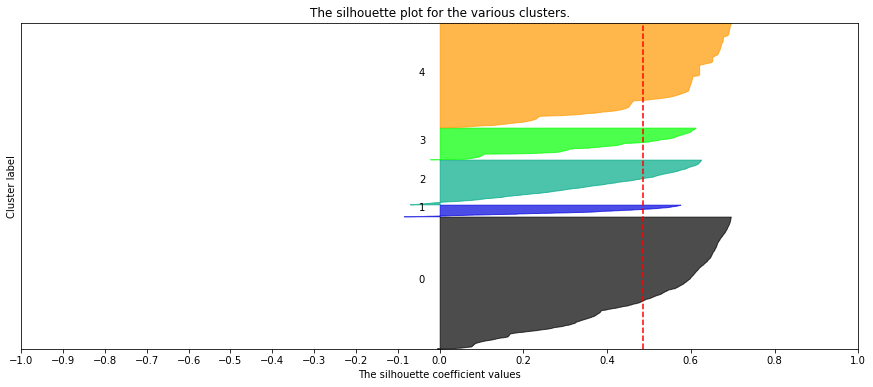

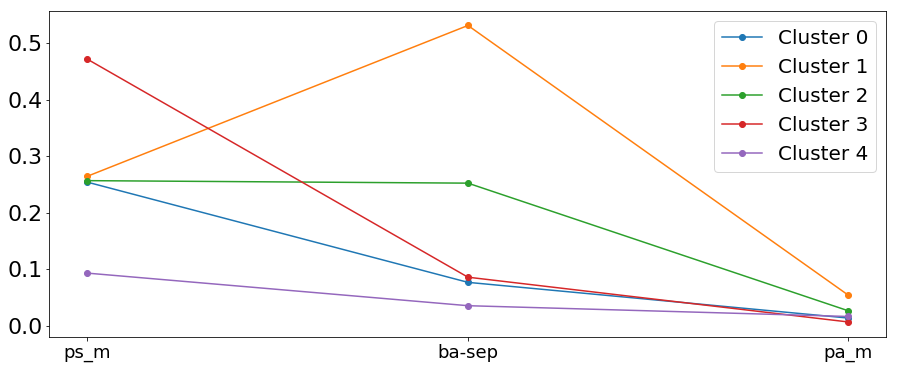

In [284]:
print('Sse: ',sse13[3])
analyze_km(data1[['ps_m','ba-sep','pa_m']],lab13[3],cent13[3],sil13[3])

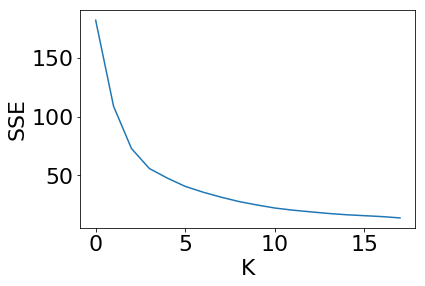

In [282]:
sse14,sil14,lab14,cent14=kmeans(data1[['ps-sep','ba-sep','pa_m']],2,20)
plot_sse(sse14)

Sse:  55.933479775030506
Silhouette:  0.5302612536214577
{0: 999, 1: 3272, 2: 1314, 3: 354, 4: 4061}


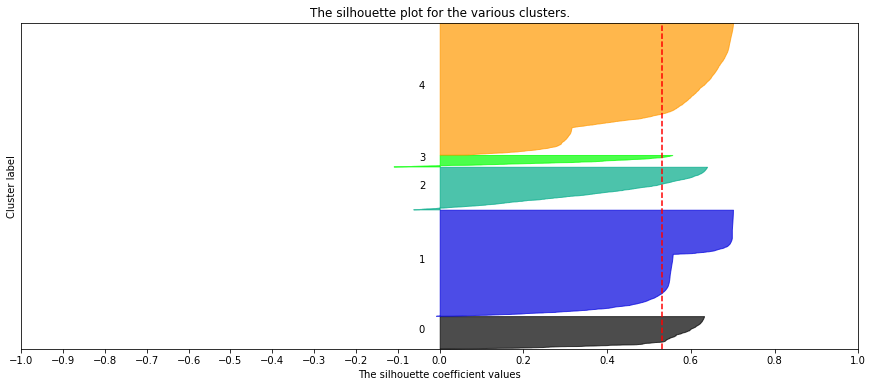

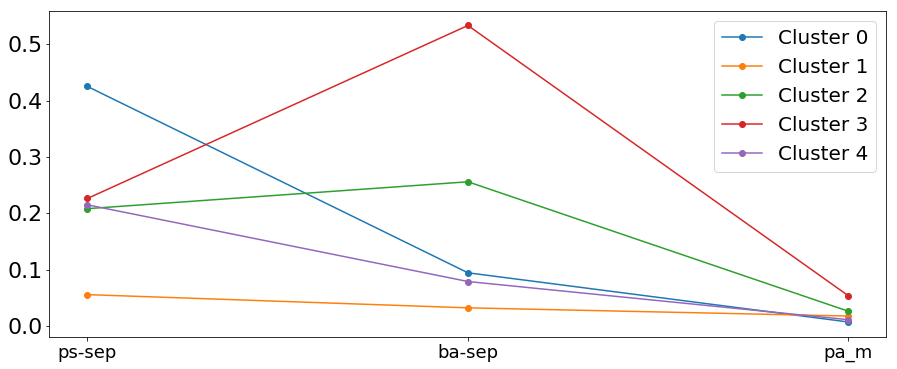

In [287]:
print('Sse: ',sse14[3])
analyze_km(data1[['ps-sep','ba-sep','pa_m']],lab14[3],cent14[3],sil14[3])

<IPython.core.display.Javascript object>


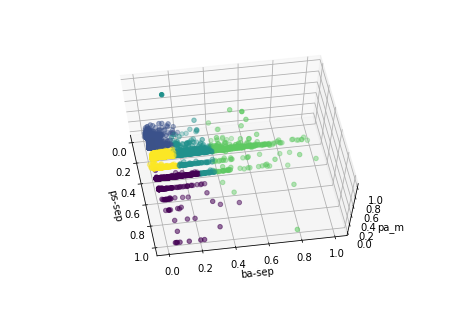

In [302]:
df=data1[['ps-sep','ba-sep','pa_m']]
labels=lab14[3]
%matplotlib notebook

Xlab=df.columns[0]
Ylab=df.columns[1]
Zlab=df.columns[2]

X=scaler.fit_transform(df[[Xlab]])
Y=scaler.fit_transform(df[[Ylab]])
Z=scaler.fit_transform(df[[Zlab]])

X=X.reshape(1,len(X))
Y=Y.reshape(1,len(Y))
Z=Z.reshape(1,len(Z))

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X[0],Y[0],Z[0], c=labels)
ax.set_xlabel(Xlab)
ax.set_ylabel(Ylab)
ax.set_zlabel(Zlab)

plt.show()

C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


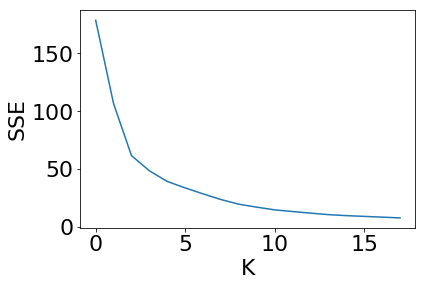

In [339]:
sse17,sil17,lab17,cent17=kmeans(data1[['ps-aug','ba-aug','pa-sep']],2,20)
plot_sse(sse17)

Sse:  48.52406491031195
Silhouette:  0.6046292713482044
{0: 3340, 1: 1423, 2: 1235, 3: 339, 4: 3663}


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


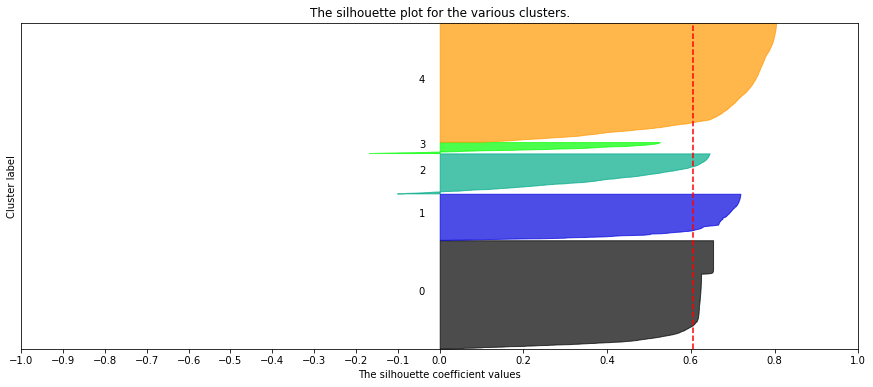

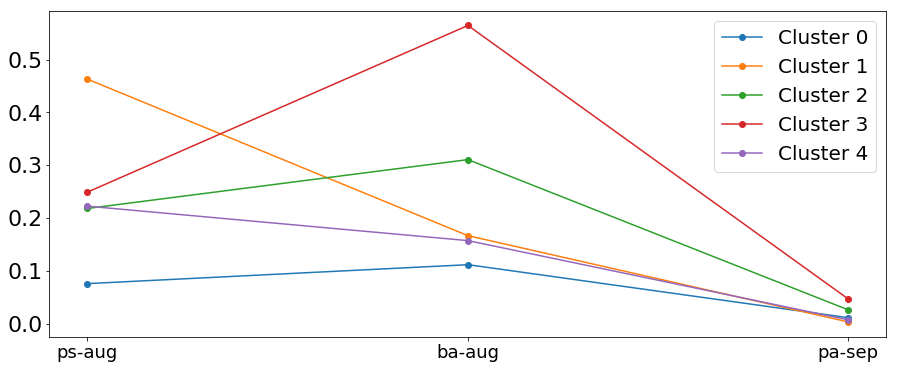

In [340]:
print('Sse: ',sse17[3])
analyze_km(data1[['ps-aug','ba-aug','pa-sep']],lab17[3],cent17[3],sil17[3])

C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


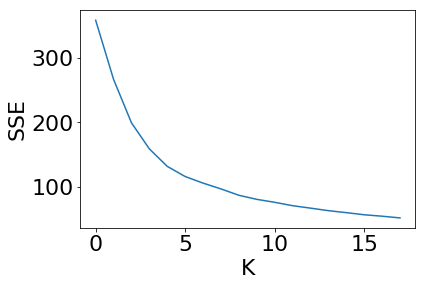

In [337]:
sse18,sil18,lab18,cent18=kmeans(data1[['limit','ps-aug','ba-aug','pa-sep']],2,20)
plot_sse(sse18)

Sse:  158.68740509449106
Silhouette:  0.4155144070303727
{0: 3975, 1: 1222, 2: 2472, 3: 1351, 4: 980}


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


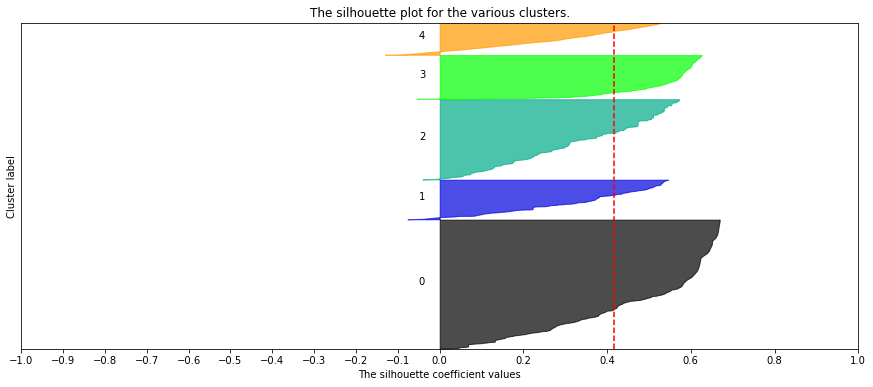

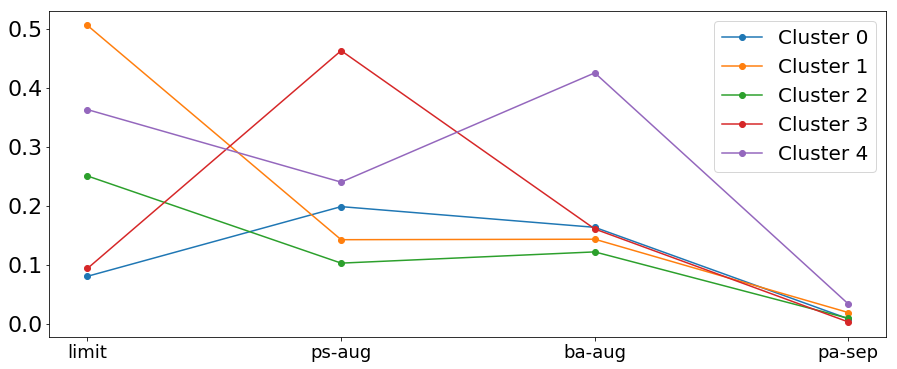

In [341]:
print('Sse: ',sse18[3])
analyze_km(data1[['limit','ps-aug','ba-aug','pa-sep']],lab18[3],cent18[3],sil18[3])

In [342]:
obj=[[sse,sil,lab,cent],[sse1,sil1,lab1,cent1],[sse2,sil2,lab2,cent2],[sse3,sil3,lab3,cent3],[sse4,sil4,lab4,cent4],[sse5,sil5,lab5,cent5],[sse6,sil6,lab6,cent6],[sse7,sil7,lab7,cent7],[sse8,sil8,lab8,cent8],[sse9,sil9,lab9,cent9],[sse10,sil10,lab10,cent10],[sse12,sil12,lab12,cent12],[sse13,sil13,lab13,cent13],[sse14,sil14,lab14,cent14],[sse15,sil15,lab15,cent15],[sse16,sil16,lab16,cent16],[sse17,sil17,lab17,cent17],[sse18,sil18,lab18,cent18],[sse19,sil19,lab19,cent19]]

In [343]:
import pickle
pickle.dump(obj,open('DMClustering','wb'))

In [348]:
obj2=({'0':[sse,sil,lab,cent],
       '1':[sse1,sil1,lab1,cent1],
       '2':[sse2,sil2,lab2,cent2],
       '3':[sse3,sil3,lab3,cent3],
       '4':[sse4,sil4,lab4,cent4],
       '5':[sse5,sil5,lab5,cent5],
       '6':[sse6,sil6,lab6,cent6],
       '7':[sse7,sil7,lab7,cent7],
       '8':[sse8,sil8,lab8,cent8],
       '9':[sse9,sil9,lab9,cent9],
       '10':[sse10,sil10,lab10,cent10],
       '12':[sse12,sil12,lab12,cent12],
       '13':[sse13,sil13,lab13,cent13],
       '14':[sse14,sil14,lab14,cent14],
       '15':[sse15,sil15,lab15,cent15],
       '16':[sse16,sil16,lab16,cent16],
       '17':[sse17,sil17,lab17,cent17],
       '18':[sse18,sil18,lab18,cent18],
       '19':[sse19,sil19,lab19,cent19]})

In [349]:
import pickle
pickle.dump(obj2,open('DMClustering2','wb'))

In [118]:
import pickle
obj=pickle.load(open('DMClustering2','rb'))

# Limit, PSM, BAM, PAM

In [2]:
credit_cards = pd.read_csv("credit_default_train.csv")


NameError: name 'pd' is not defined

In [20]:
data1 = remove_missing_values(credit_cards)
data1=correct_ps_values(data1)
data1['ps_m']=(data1['ps-aug']+data1['ps-jul']+data1['ps-jun']+data1['ps-may']+data1['ps-apr']+data1['ps-sep'])/6
data1['ba_m']=(data1['ba-aug']+data1['ba-jul']+data1['ba-jun']+data1['ba-may']+data1['ba-apr']+data1['ba-sep'])/6
data1['pa_m']=(data1['pa-sep']+data1['pa-aug']+data1['pa-jul']+data1['pa-jun']+data1['pa-may']+data1['pa-apr'])/6

In [204]:
data1['Lab']=lab20[4]

C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: pandas.scatter_matrix is deprecated, use pandas.plotting.scatter_matrix instead
  """Entry point for launching an IPython kernel.


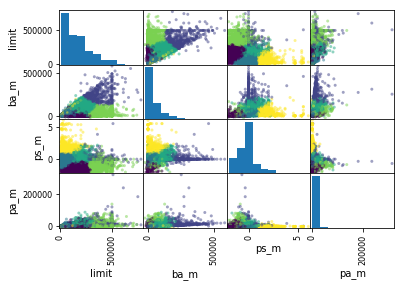

In [206]:
pd.scatter_matrix(data1[['limit', 'ba_m', 'ps_m', 'pa_m']], c=lab20[4])
plt.show()

In [183]:
sil20[4]

0.38216039169176225

In [104]:
crosstab

credit_default,no,yes
Lab,,
0,1813,369
1,372,80
2,2597,762
3,1446,269
4,1242,153
5,318,579


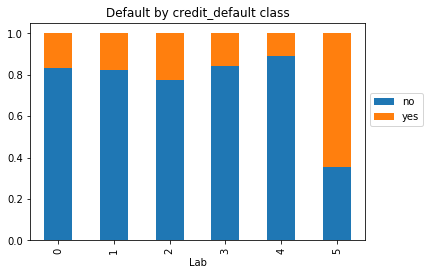

In [182]:
#fig=plt.figure()
crosstab =pd.crosstab(data1['Lab'], data1['credit_default'],normalize='index')
ax=crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')
ax.legend(bbox_to_anchor=(1, 0.7))

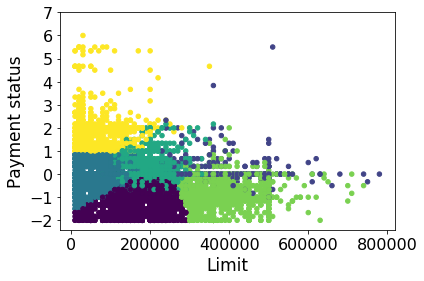

In [209]:
%matplotlib inline
plt.scatter(data1['limit'],data1['ps_m'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.yticks(np.arange(-2,8,1))
plt.xlabel('Limit',{ 'size'   : 17})
plt.ylabel('Payment status',{ 'size'   : 17})
plt.show()

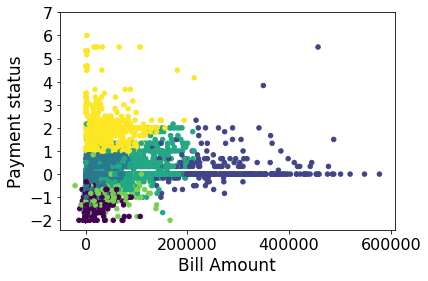

In [211]:
%matplotlib inline
plt.scatter(data1['ba_m'],data1['ps_m'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=16)
plt.yticks(np.arange(-2,8,1))
plt.xlabel('Bill Amount',{ 'size'   : 17})
plt.ylabel('Payment status',{ 'size'   : 17})
plt.show()

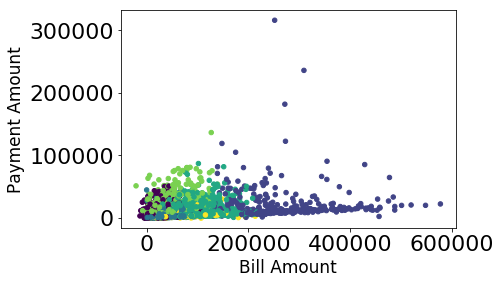

In [212]:
%matplotlib inline
plt.scatter(data1['ba_m'],data1['pa_m'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xlabel('Bill Amount',{ 'size'   : 17})
plt.ylabel('Payment Amount',{ 'size'   : 17})
plt.show()

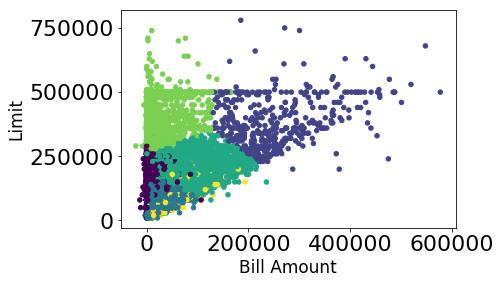

In [210]:
%matplotlib inline
plt.scatter(data1['ba_m'],data1['limit'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.xlabel('Bill Amount',{ 'size'   : 17})
plt.ylabel('Limit',{ 'size'   : 17})
plt.show()

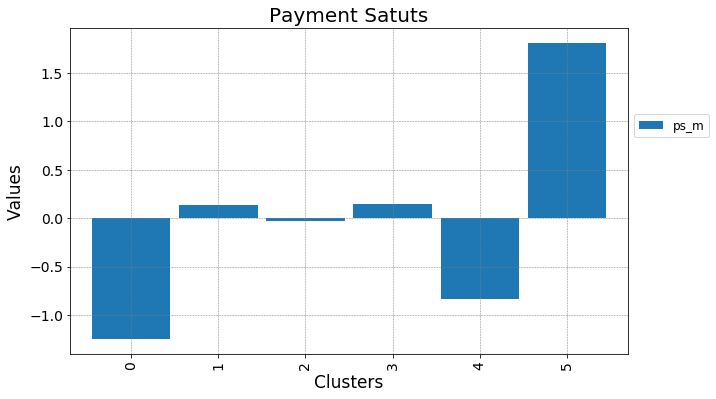

In [177]:
result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

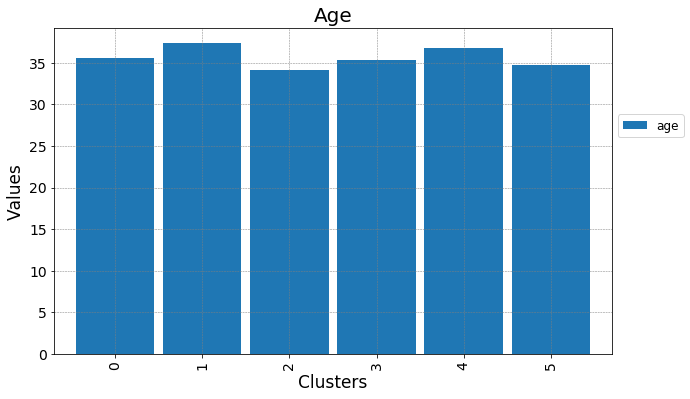

In [180]:
result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'age':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Age","Clusters","Values",True,"",result.index,0,90,False)

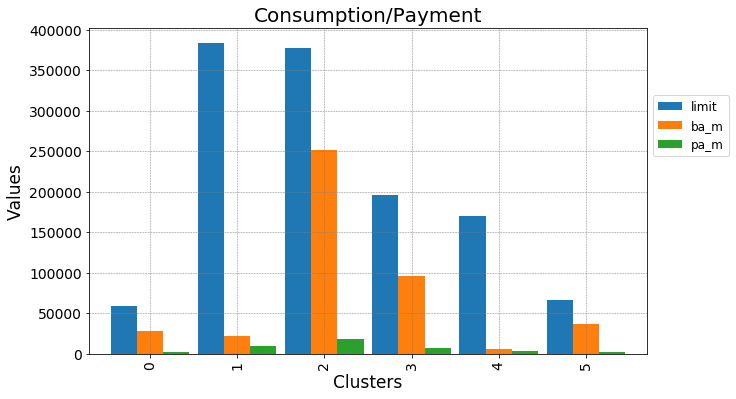

In [189]:
result=pd.DataFrame(dts.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                'ba_m':np.mean,
                'pa_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Consumption/Payment","Clusters","Values",True,"",result.index,0,90,False)

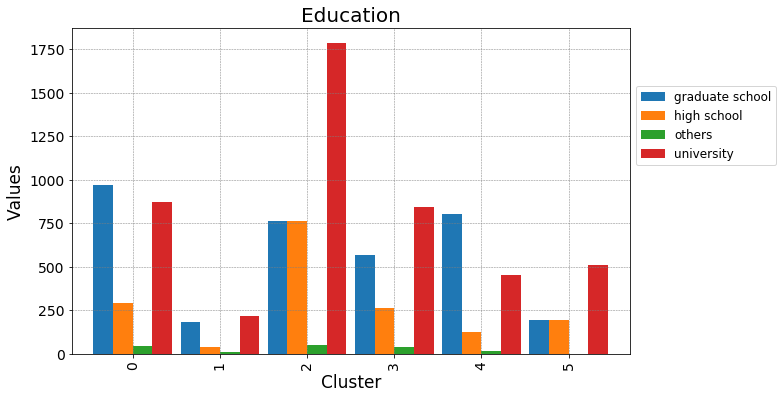

In [192]:
cross=pd.crosstab(data1['Lab'],data1['education'])
barChart(cross,'Education','Cluster','Values',True,"",cross.index,0,90,False)

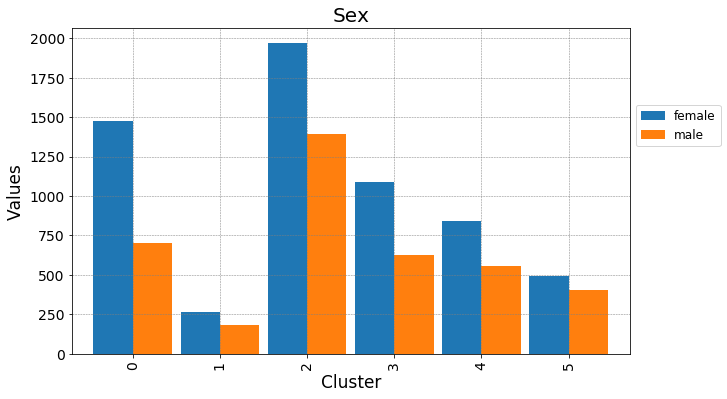

In [198]:
cross=pd.crosstab(data1['Lab'],data1['sex'])
barChart(cross,'Sex','Cluster','Values',True,"",cross.index,0,90,False)

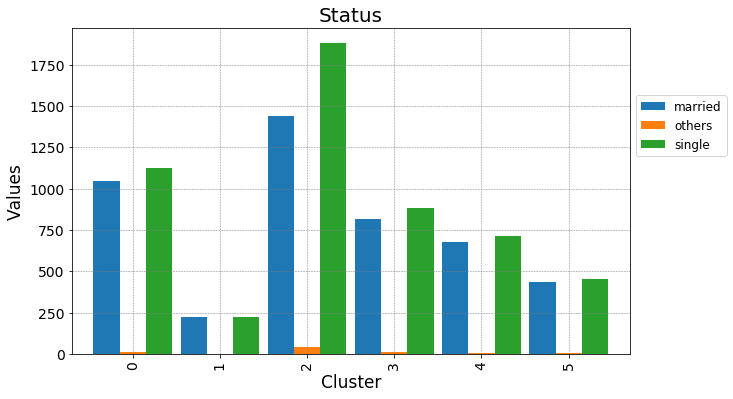

In [197]:
cross=pd.crosstab(data1['Lab'],data1['status'])
barChart(cross,'Status','Cluster','Values',True,"",cross.index,0,90,False)

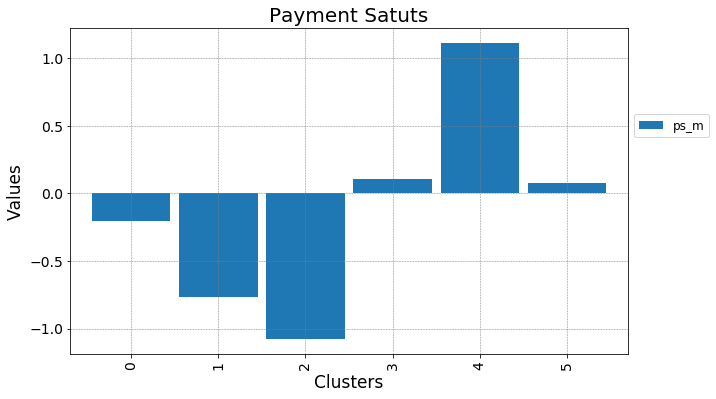

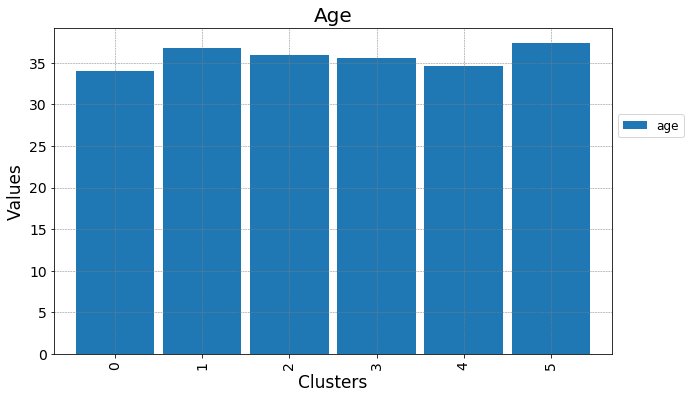

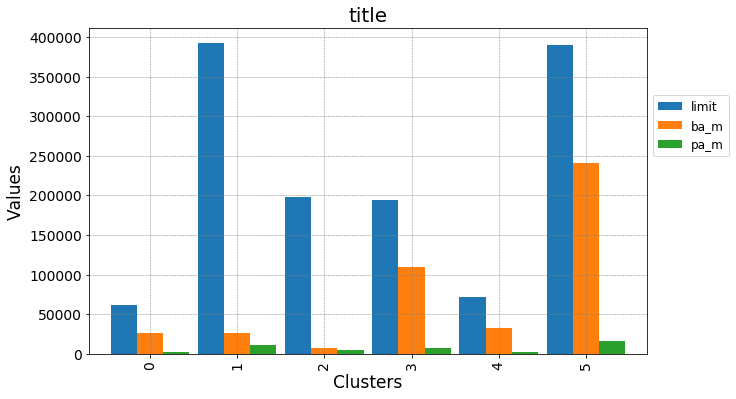

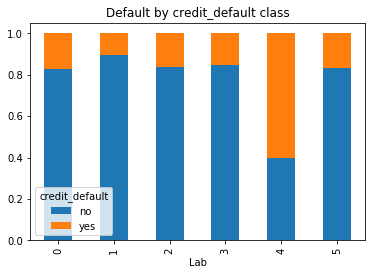

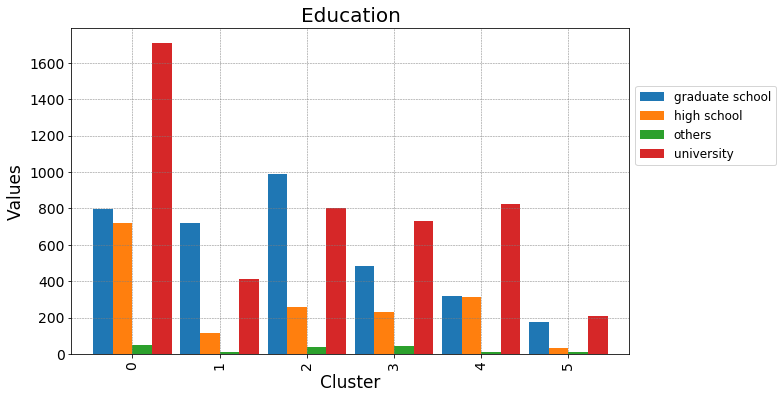

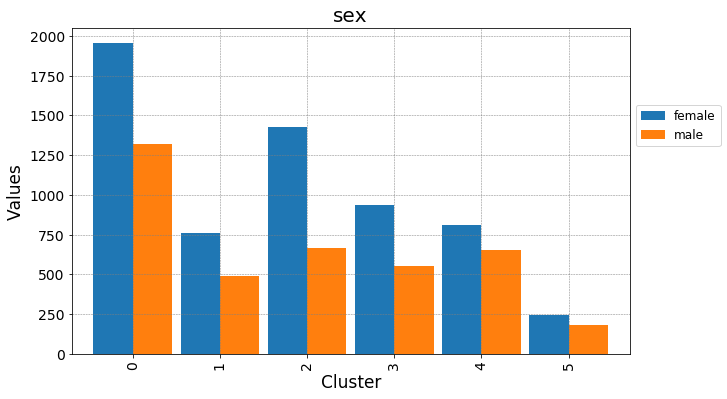

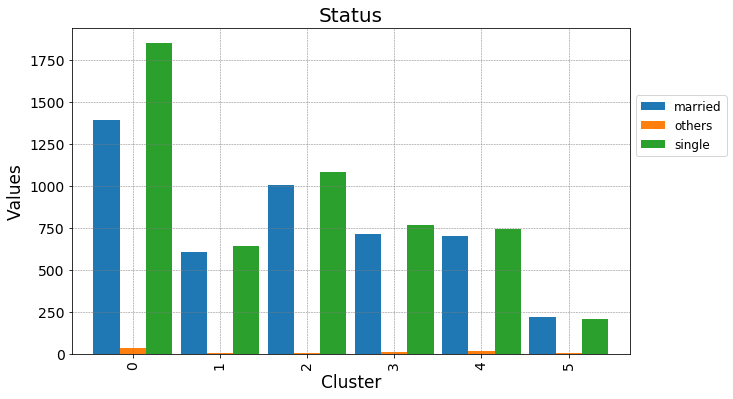

In [155]:
lab=obj['2'][2][4]
data1['Lab']=lab

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'age':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Age","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                'ba_m':np.mean,
                'pa_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')

cross=pd.crosstab(data1['Lab'],data1['education'])
barChart(cross,'Education','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['sex'])
barChart(cross,'sex','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['status'])
barChart(cross,'Status','Cluster','Values',True,"",cross.index,0,90,False)

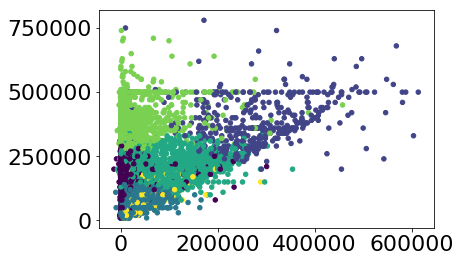

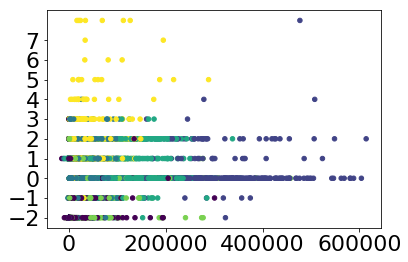

In [166]:
%matplotlib inline
plt.scatter(data1['ba-sep'],data1['limit'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.show()

plt.scatter(data1['ba-sep'],data1['ps-sep'],  c=lab20[4], 
            s=20)
plt.tick_params(axis='both', which='major', labelsize=22)
plt.yticks(np.arange(-2,8,1))
plt.show()

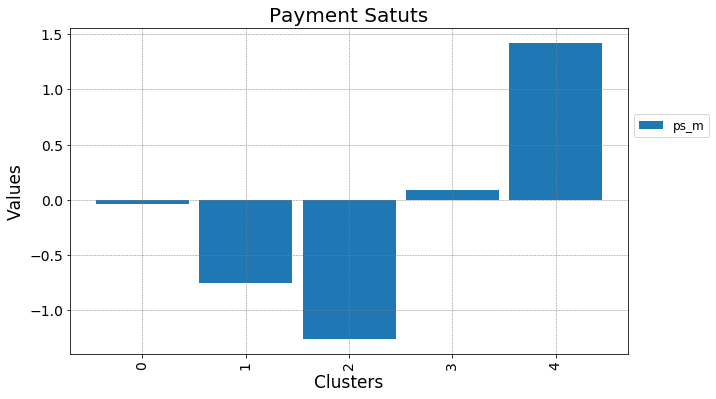

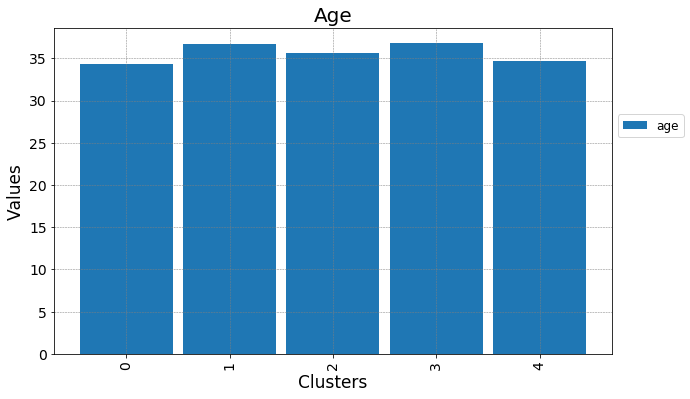

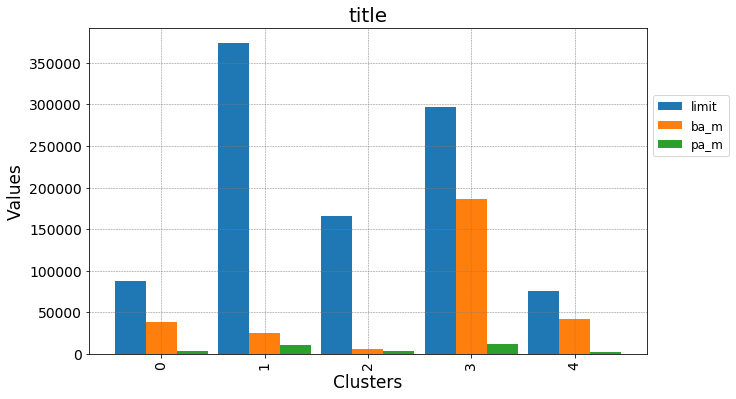

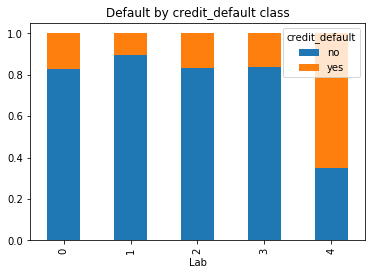

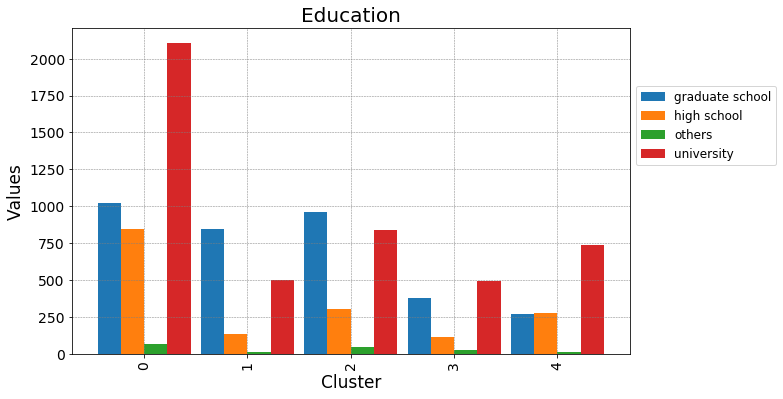

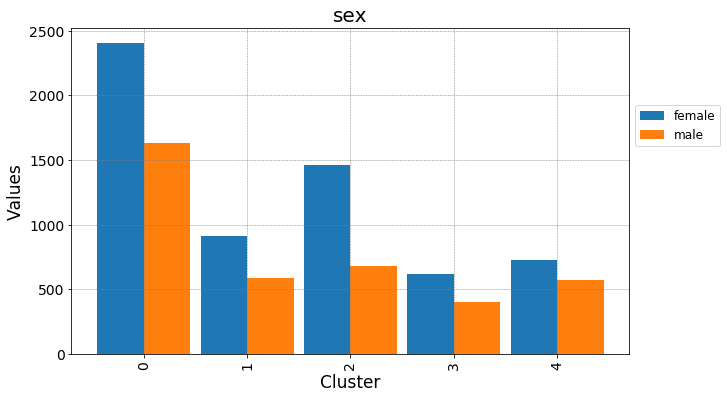

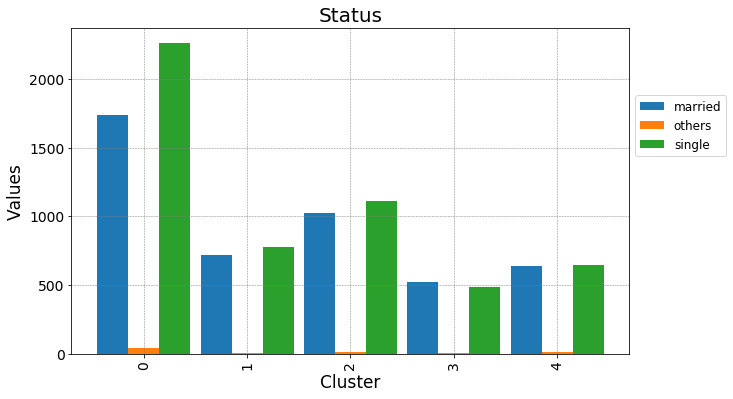

In [124]:
lab=obj['5'][2][3]
data1['Lab']=lab

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'age':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Age","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                'ba_m':np.mean,
                'pa_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')

cross=pd.crosstab(data1['Lab'],data1['education'])
barChart(cross,'Education','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['sex'])
barChart(cross,'sex','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['status'])
barChart(cross,'Status','Cluster','Values',True,"",cross.index,0,90,False)

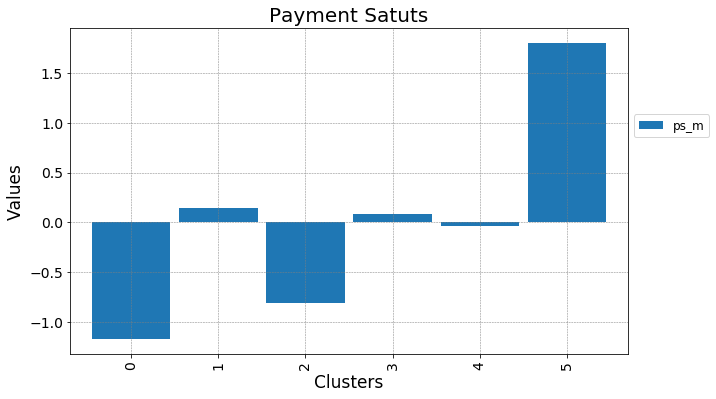

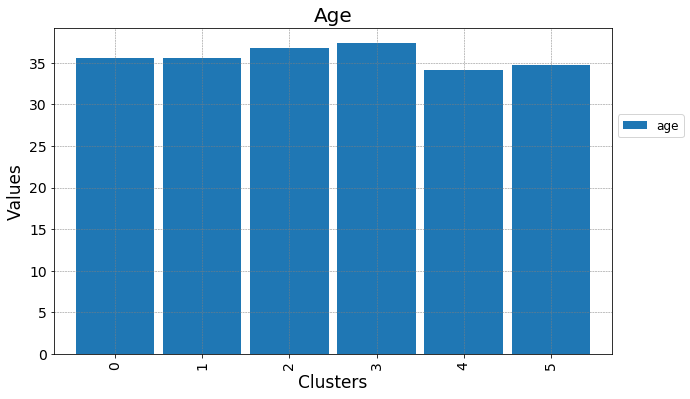

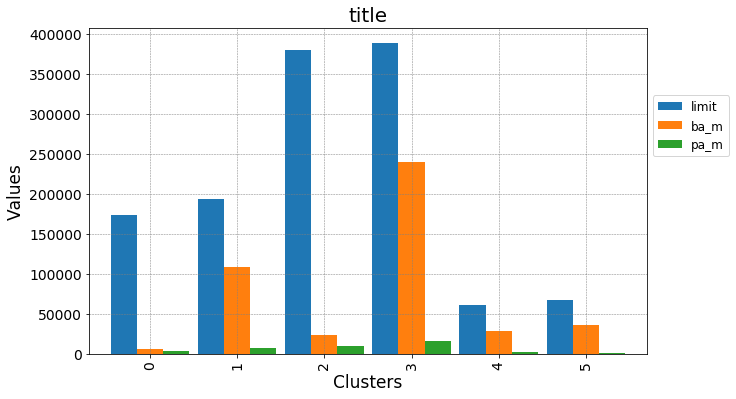

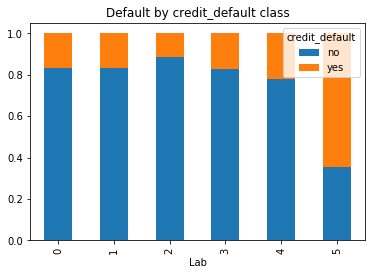

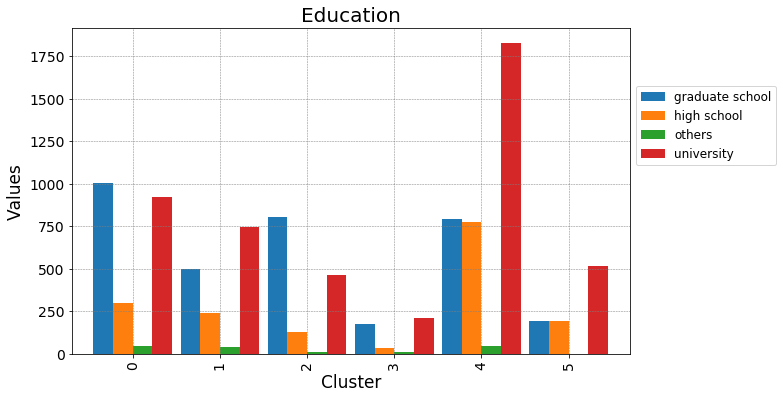

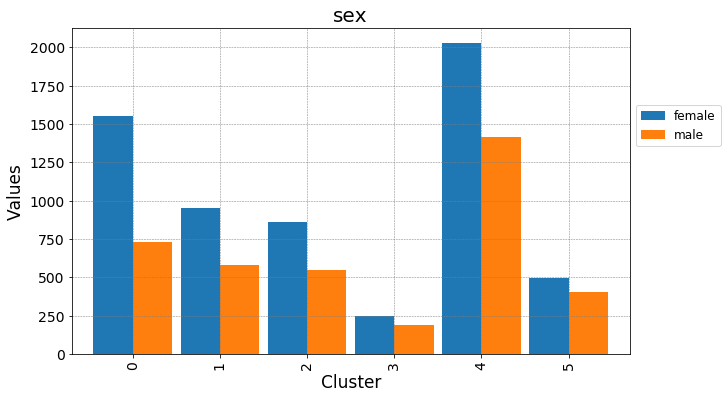

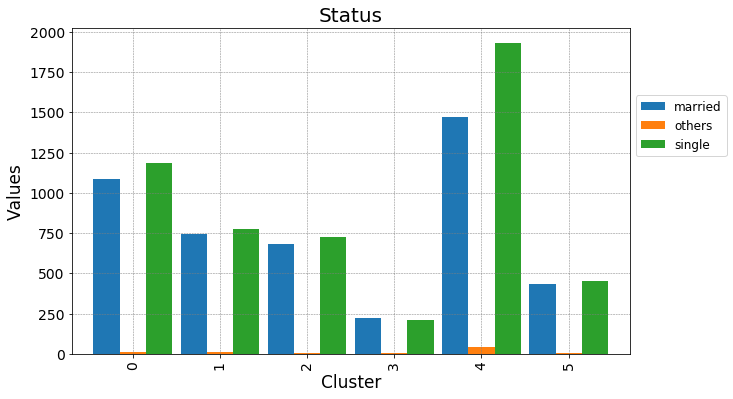

In [125]:
lab=obj['8'][2][4]
data1['Lab']=lab

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'age':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"Age","Clusters","Values",True,"",result.index,0,90,False)

result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                'ba_m':np.mean,
                'pa_m':np.mean}))
result.drop('Lab',axis=1,inplace=True)
barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')

cross=pd.crosstab(data1['Lab'],data1['education'])
barChart(cross,'Education','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['sex'])
barChart(cross,'sex','Cluster','Values',True,"",cross.index,0,90,False)

cross=pd.crosstab(data1['Lab'],data1['status'])
barChart(cross,'Status','Cluster','Values',True,"",cross.index,0,90,False)

# DBSCAN

In [82]:
def DBscan(df,eps_,minp):
    
    X = scaler.fit_transform(df.values)

    dbscan = DBSCAN(eps=eps_, min_samples=minp, metric="euclidean")
    dbscan.fit(X)
    
    df['Lab']=dbscan.labels_
    dfs=df[df['Lab']!=-1]
    s=scaler.fit_transform(dfs.values)
    if(len(set(dbscan.labels_))>2):
        sil=silhouette_score(s, np.asarray(list(filter(lambda x: x!=-1,dbscan.labels_))))
    else: sil=-1
    labels=dbscan.labels_
        
    print('Dbscan Silhouette with eps='+str(eps_)+' and minp='+str(minp)+': ', sil)
    clusters=np.unique(dbscan.labels_, return_counts=True)
    for i in range(0,len(clusters[0])):
        print("Cluster "+str(clusters[0][i])+": "+str(clusters[1][i]))
    return sil,labels

def plot_knn(dist,k):
    
    fig = plt.figure(figsize=(10, 10)) 
    kth_distances = list()
    for d in dist:
        index_kth_distance = np.argsort(d)[k]
        kth_distances.append(d[index_kth_distance])
    plt.plot(range(0, len(kth_distances)), sorted(kth_distances),)
    plt.ylabel('dist from %sth neighbor' % k, fontsize=18)
    plt.yticks(np.arange(0,1,0.025))
    plt.xlabel('sorted distances', fontsize=18)
    plt.tick_params(axis='both', which='major', labelsize=10)
    plt.show()
    
def Hier(df, method_):
    
    X = scaler.fit_transform(df.values)

    data_dist=pd.DataFrame(squareform(pdist(X, metric="euclidean")))
    data_link = linkage(data_dist, method=method_, metric='euclidean')
        
    return data_dist,data_link

In [9]:
att=data1[['limit','ps_m','ba_m','pa_m']].copy()

In [10]:
att_=scaler.fit_transform(att.values)
dist=squareform(pdist(att_, metric="euclidean"))

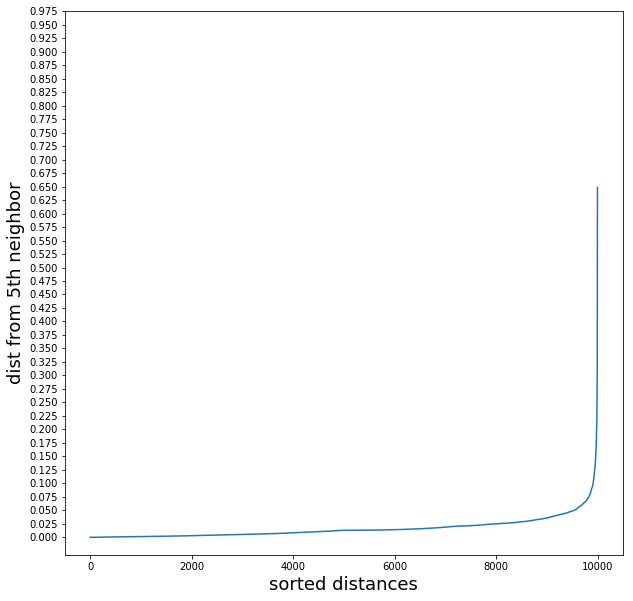

In [21]:
plot_knn(dist,5)

In [66]:
db_s10,db_l10=DBscan(att,0.06,5)

Dbscan Silhouette with eps=0.06 and minp=5:  0.6100990752639855
Cluster -1: 160
Cluster 0: 9816
Cluster 1: 12
Cluster 2: 12


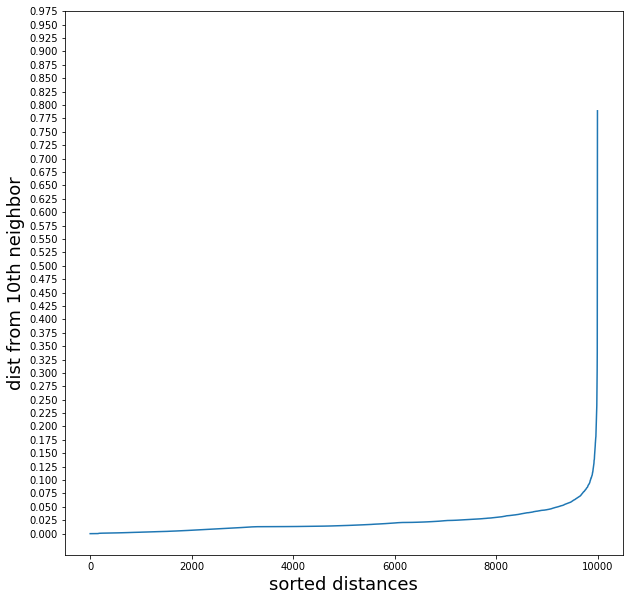

In [11]:
plot_knn(dist,10)

In [17]:
db_s10,db_l10=DBscan(att,0.07,10)

Dbscan Silhouette with eps=0.07 and minp=10:  0.4621080763143475
Cluster -1: 161
Cluster 0: 9814
Cluster 1: 25


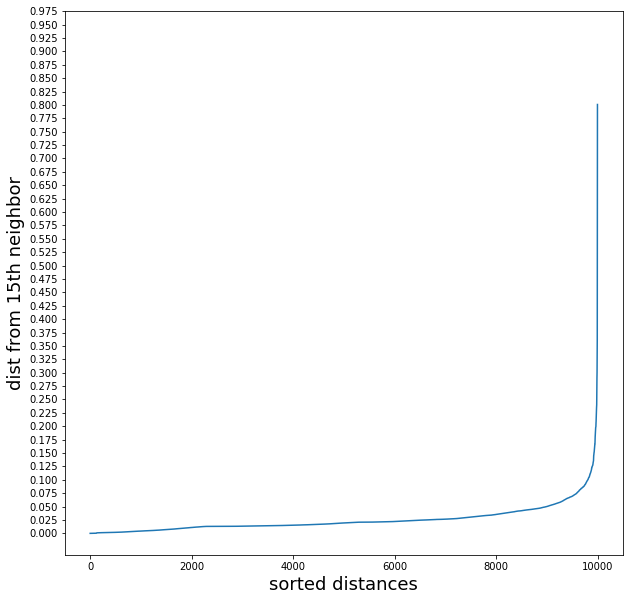

In [19]:
plot_knn(dist,15)

In [20]:
db_s20,db_l20=DBscan(att,0.075,15)

Dbscan Silhouette with eps=0.075 and minp=15:  0.4721864709646584
Cluster -1: 177
Cluster 0: 9802
Cluster 1: 21


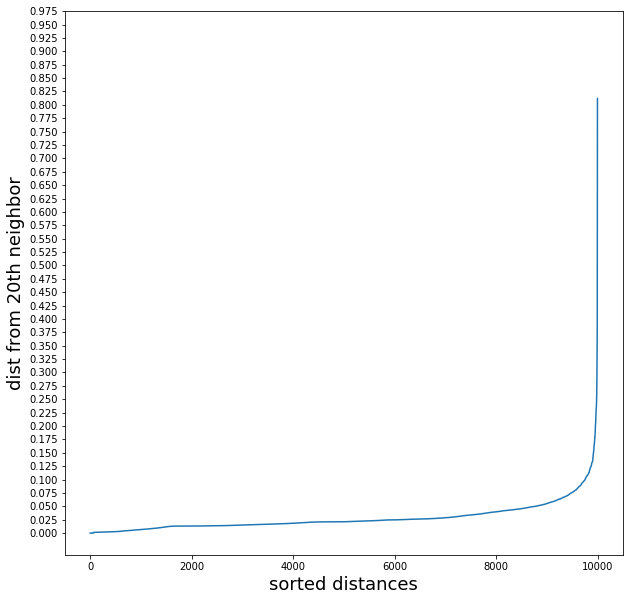

In [12]:
plot_knn(dist,20)

In [74]:
db_s20,db_l20=DBscan(att,0.075,20)

Dbscan Silhouette with eps=0.075 and minp=20:  0.6444282965910679
Cluster -1: 264
Cluster 0: 9695
Cluster 1: 20
Cluster 2: 21


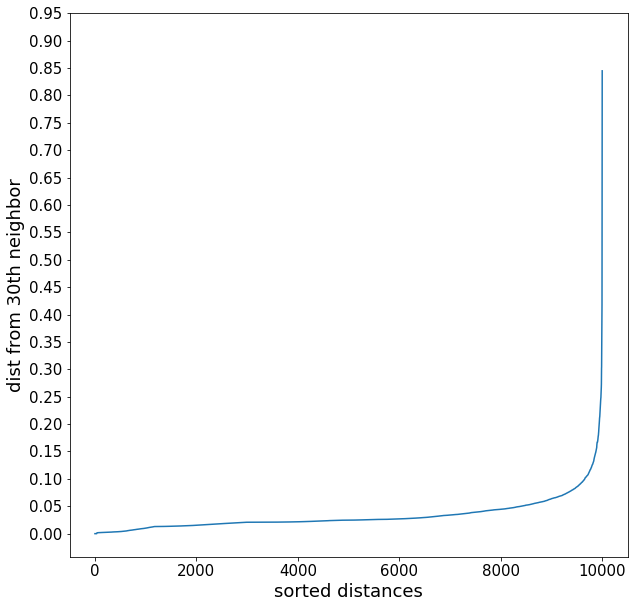

In [133]:
plot_knn(dist,30)

In [134]:
db_s20,db_l20=DBscan(att,0.085,30)

Dbscan Silhouette with eps=0.085 and minp=30:  0.5354385463168876
Cluster -1: 220
Cluster 0: 9780


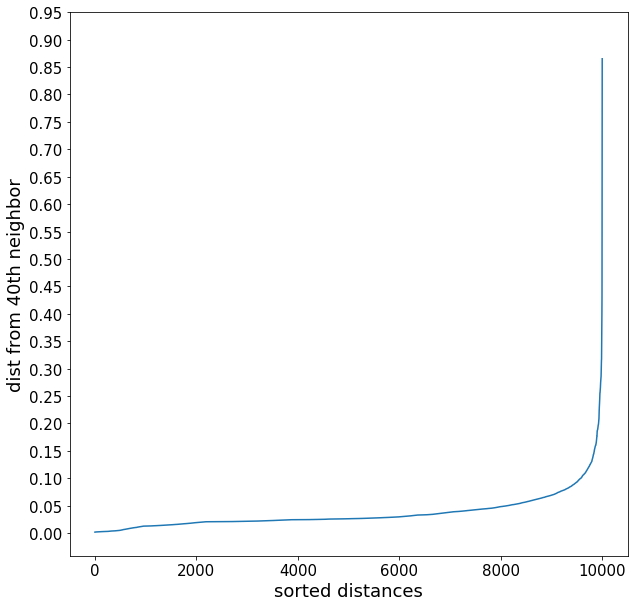

In [135]:
plot_knn(dist,40)

In [136]:
db_s20,db_l20=DBscan(att,0.085,40)

Dbscan Silhouette with eps=0.085 and minp=40:  0.5227984408032428
Cluster -1: 275
Cluster 0: 9725


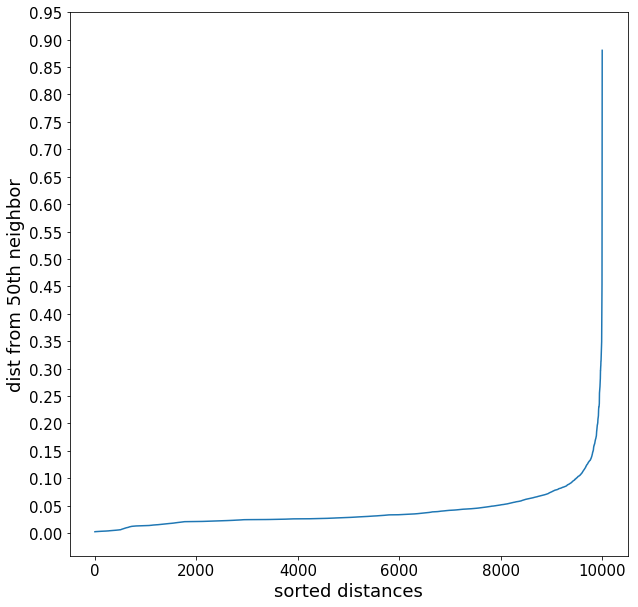

In [137]:
plot_knn(dist,50)

In [138]:
db_s20,db_l20=DBscan(att,0.1,50)

Dbscan Silhouette with eps=0.1 and minp=50:  0.5511573642664022
Cluster -1: 204
Cluster 0: 9796


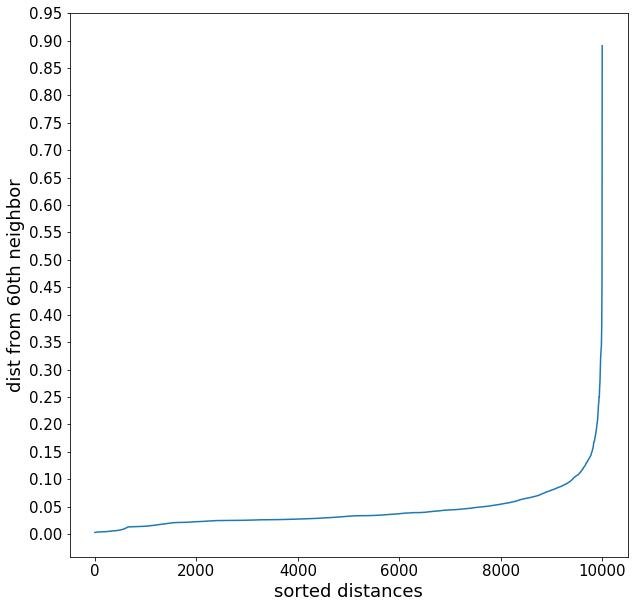

In [139]:
plot_knn(dist,60)

In [140]:
db_s20,db_l20=DBscan(att,0.11,60)

Dbscan Silhouette with eps=0.11 and minp=60:  0.5722348617556625
Cluster -1: 172
Cluster 0: 9828


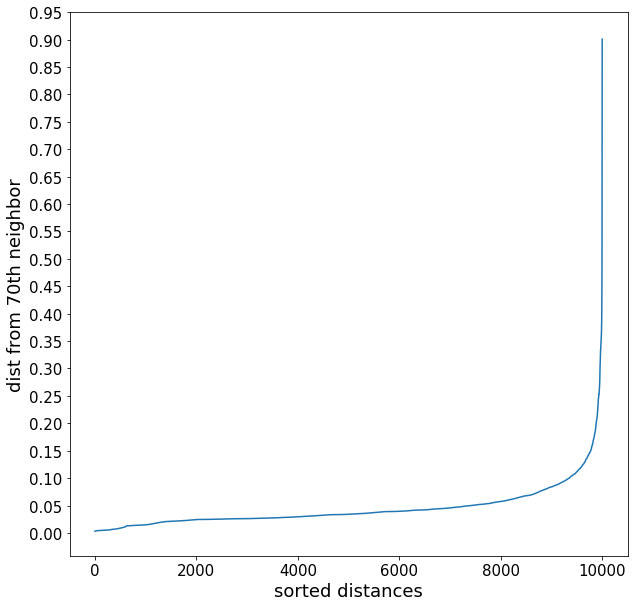

In [141]:
plot_knn(dist,70)

In [142]:
db_s20,db_l20=DBscan(att,0.12,70)

Dbscan Silhouette with eps=0.12 and minp=70:  0.5847879402271315
Cluster -1: 150
Cluster 0: 9850


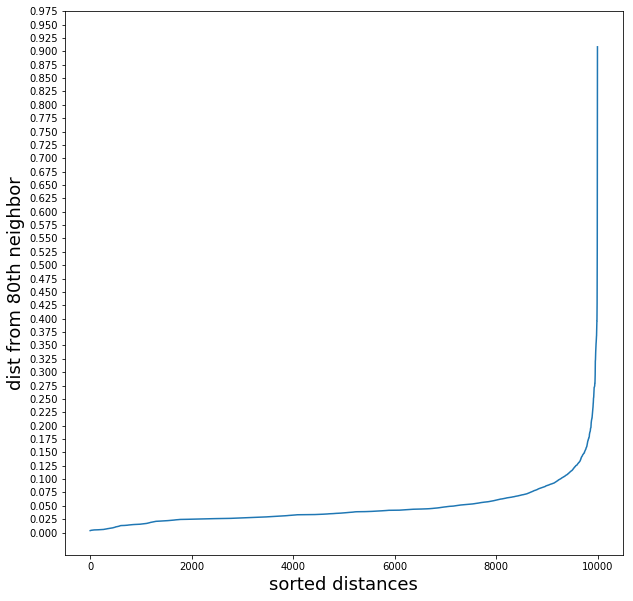

In [23]:
plot_knn(dist,80)

In [24]:
db_s20,db_l20=DBscan(att,0.125,80)

Dbscan Silhouette with eps=0.125 and minp=80:  0.5862222371273947
Cluster -1: 152
Cluster 0: 9848


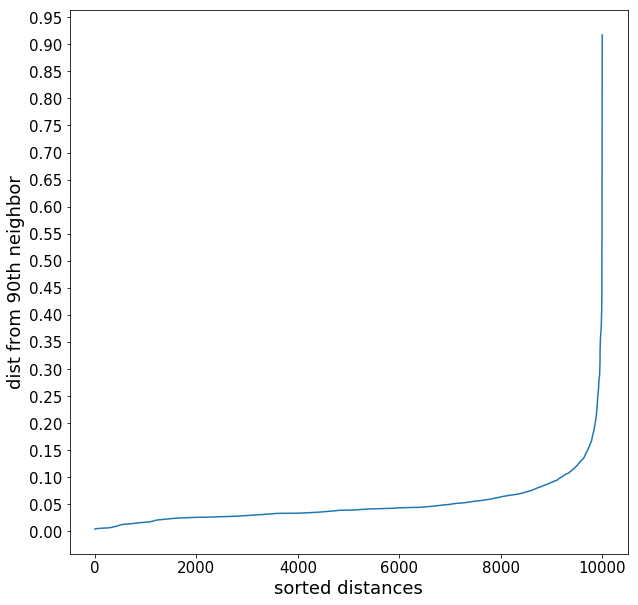

In [145]:
plot_knn(dist,90)

In [146]:
db_s20,db_l20=DBscan(att,0.125,90)

Dbscan Silhouette with eps=0.125 and minp=90:  0.581610983741427
Cluster -1: 170
Cluster 0: 9830


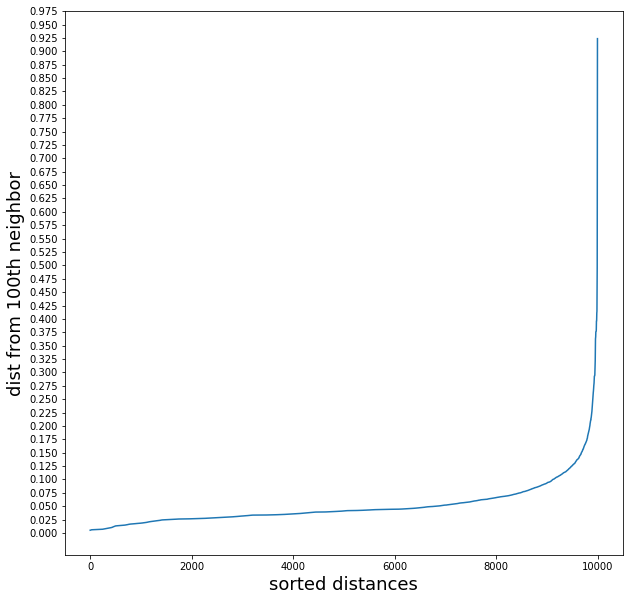

In [67]:
plot_knn(dist,100)

In [73]:
db_s20,db_l20=DBscan(att,0.12,100)

Dbscan Silhouette with eps=0.12 and minp=100:  -1
Cluster -1: 273
Cluster 0: 9727


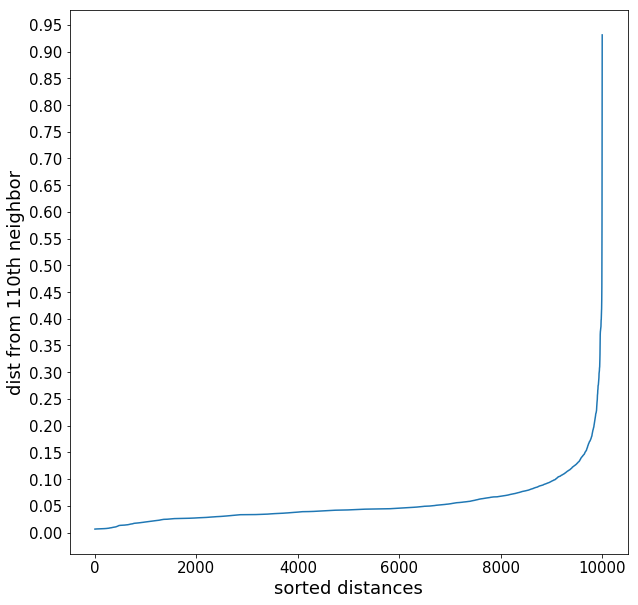

In [150]:
plot_knn(dist,110)

In [152]:
db_s20,db_l20=DBscan(att,0.125,110)

Dbscan Silhouette with eps=0.125 and minp=110:  0.5723272611530605
Cluster -1: 195
Cluster 0: 9805


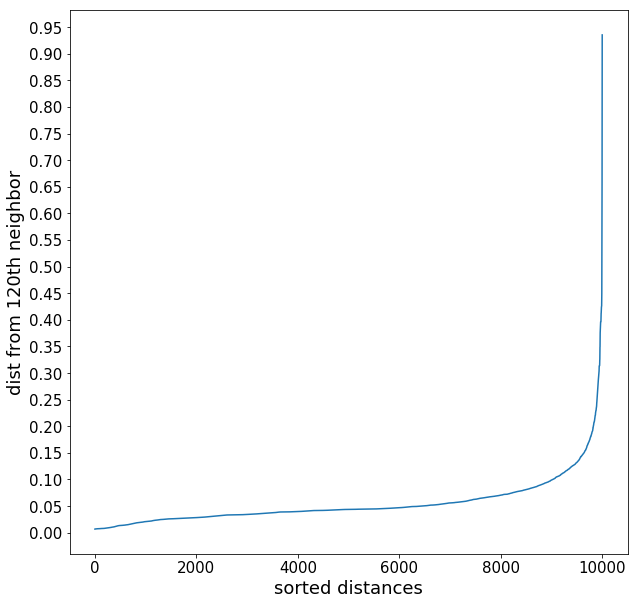

In [151]:
plot_knn(dist,120)

In [153]:
db_s20,db_l20=DBscan(att,0.125,120)

Dbscan Silhouette with eps=0.125 and minp=120:  0.5635520858141739
Cluster -1: 218
Cluster 0: 9782


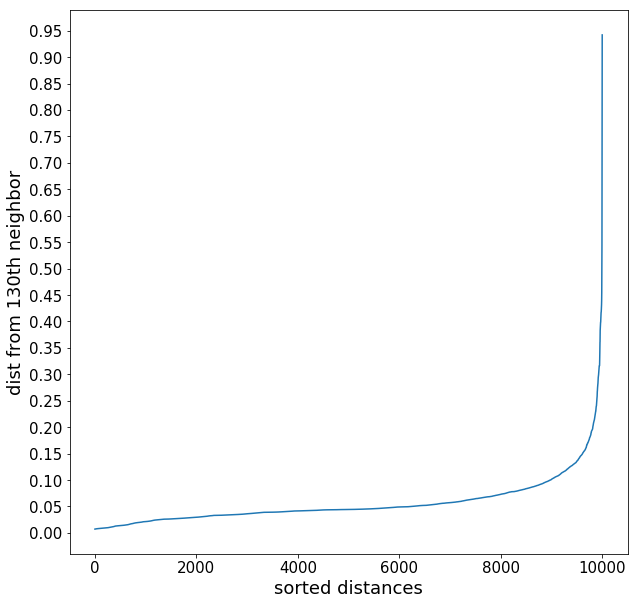

In [154]:
plot_knn(dist,130)

In [156]:
db_s20,db_l20=DBscan(att,0.125,130)

Dbscan Silhouette with eps=0.125 and minp=130:  0.5603964197900072
Cluster -1: 228
Cluster 0: 9772


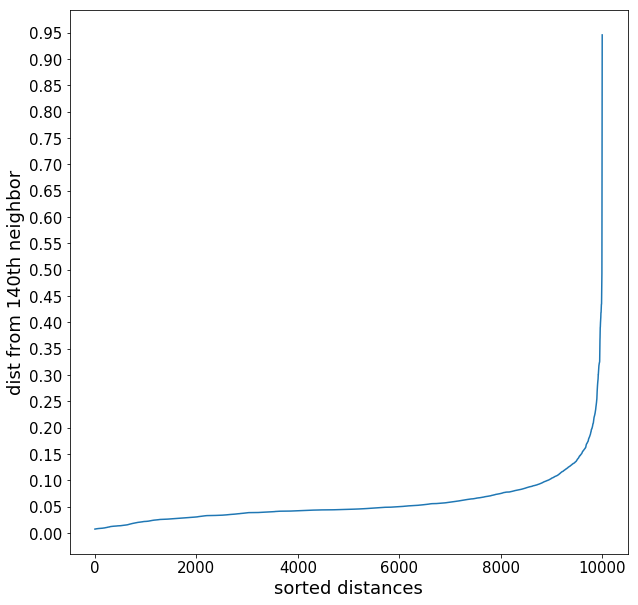

In [155]:
plot_knn(dist,140)

In [157]:
db_s20,db_l20=DBscan(att,0.125,140)

Dbscan Silhouette with eps=0.125 and minp=140:  0.5583312407934894
Cluster -1: 233
Cluster 0: 9767


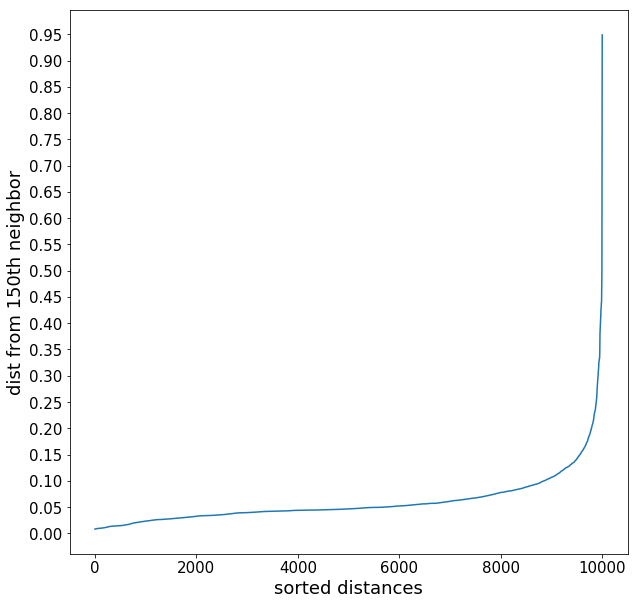

In [158]:
plot_knn(dist,150)

In [162]:
db_s20,db_l20=DBscan(att,0.125,150)

Dbscan Silhouette with eps=0.125 and minp=150:  0.5527129601300989
Cluster -1: 246
Cluster 0: 9754


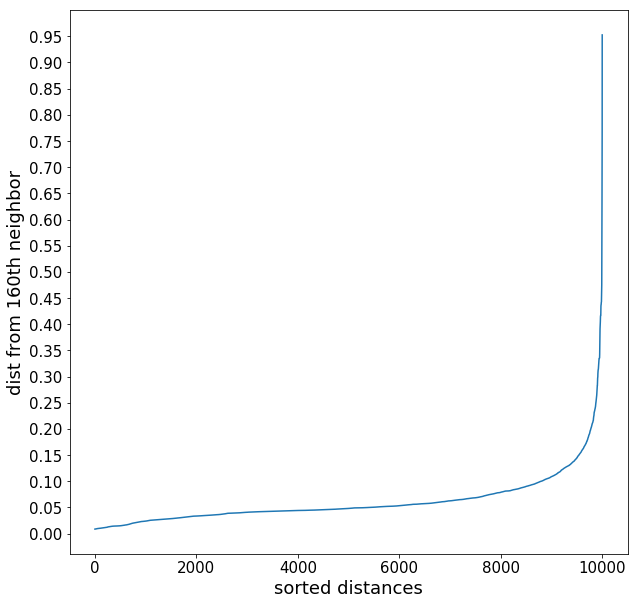

In [159]:
plot_knn(dist,160)

In [163]:
db_s20,db_l20=DBscan(att,0.125,160)

Dbscan Silhouette with eps=0.125 and minp=160:  0.5459483639600463
Cluster -1: 261
Cluster 0: 9739


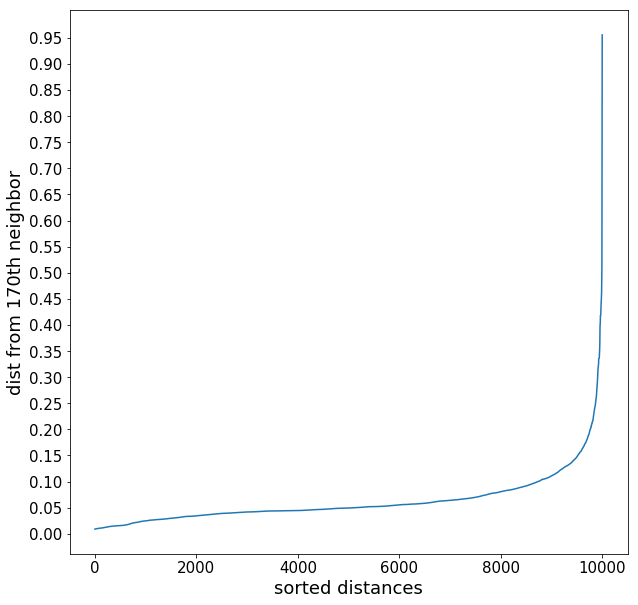

In [160]:
plot_knn(dist,170)

In [164]:
db_s20,db_l20=DBscan(att,0.125,170)

Dbscan Silhouette with eps=0.125 and minp=170:  0.5414914767747545
Cluster -1: 273
Cluster 0: 9727


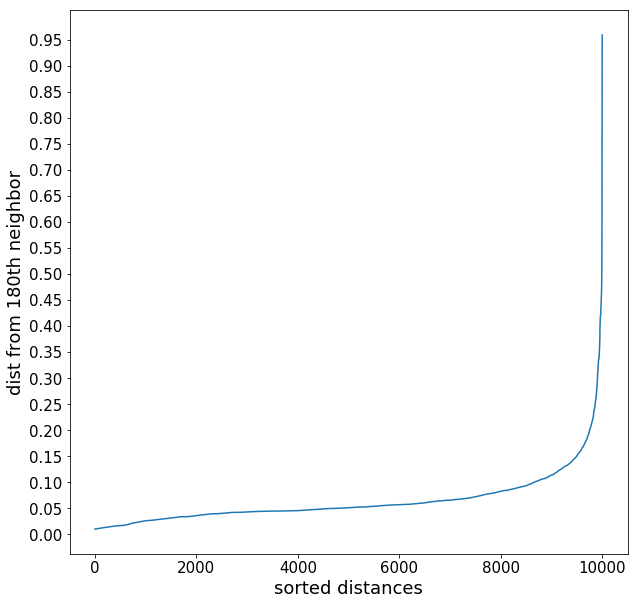

In [161]:
plot_knn(dist,180)

In [165]:
db_s20,db_l20=DBscan(att,0.14,180)

Dbscan Silhouette with eps=0.14 and minp=180:  0.5720829775292047
Cluster -1: 204
Cluster 0: 9796


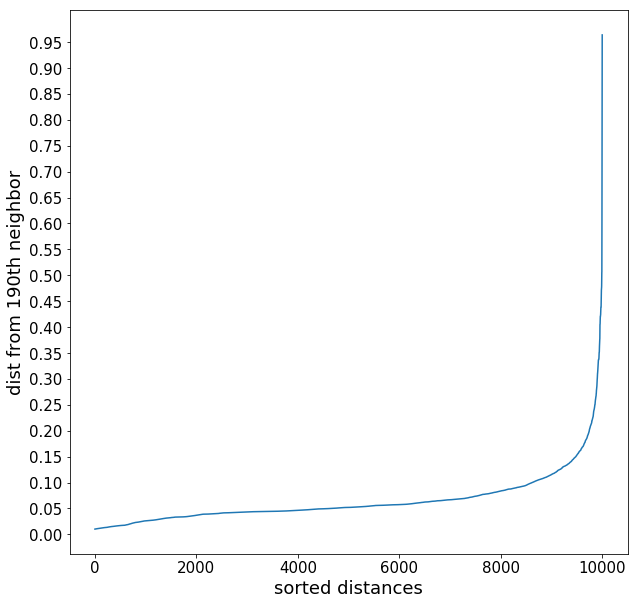

In [166]:
plot_knn(dist,190)

In [170]:
db_s20,db_l20=DBscan(att,0.14,190)

Dbscan Silhouette with eps=0.14 and minp=190:  0.5698579315827372
Cluster -1: 210
Cluster 0: 9790


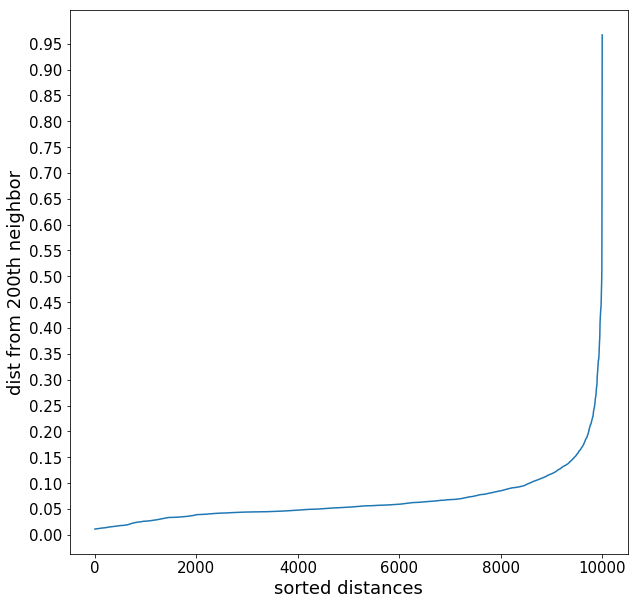

In [167]:
plot_knn(dist,200)

In [171]:
db_s20,db_l20=DBscan(att,0.14,200)

Dbscan Silhouette with eps=0.14 and minp=200:  0.5682233177774064
Cluster -1: 214
Cluster 0: 9786


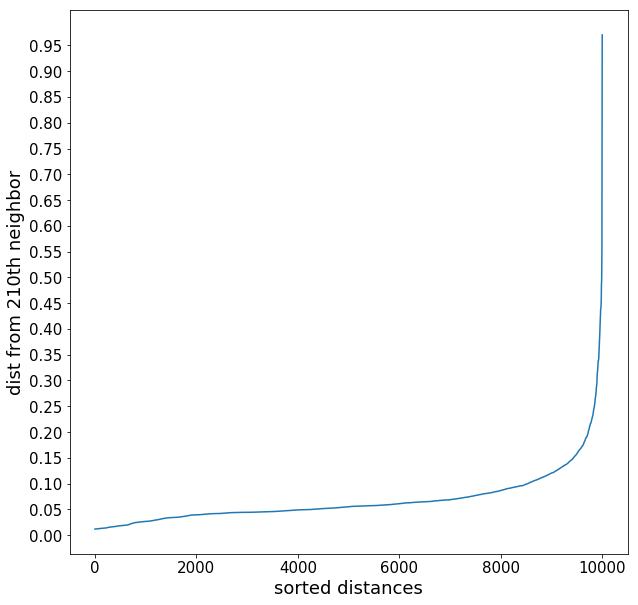

In [168]:
plot_knn(dist,210)

In [172]:
db_s20,db_l20=DBscan(att,0.14,210)

Dbscan Silhouette with eps=0.14 and minp=210:  0.5671958466511152
Cluster -1: 217
Cluster 0: 9783


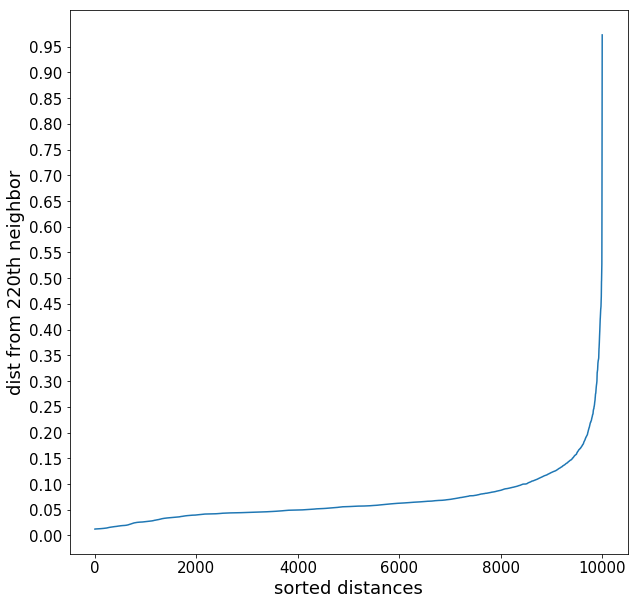

In [169]:
plot_knn(dist,220)

In [173]:
db_s20,db_l20=DBscan(att,0.15,220)

Dbscan Silhouette with eps=0.15 and minp=220:  0.5776916496763104
Cluster -1: 190
Cluster 0: 9810


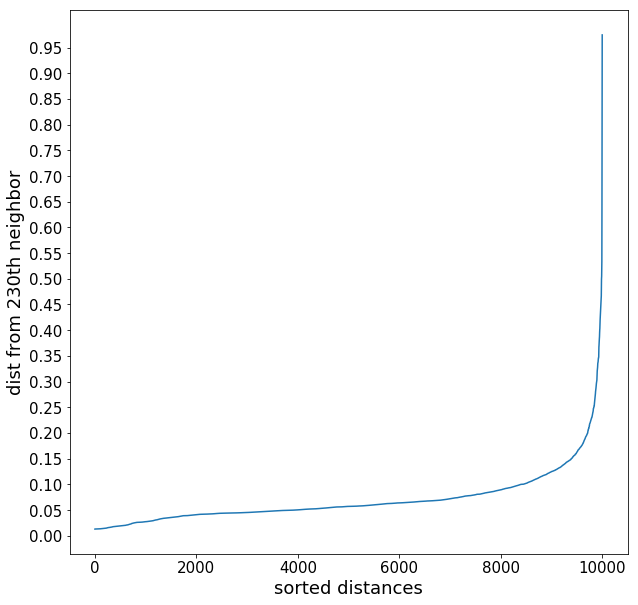

In [174]:
plot_knn(dist,230)

In [177]:
db_s20,db_l20=DBscan(att,0.15,230)

Dbscan Silhouette with eps=0.15 and minp=230:  0.5741463019955416
Cluster -1: 200
Cluster 0: 9800


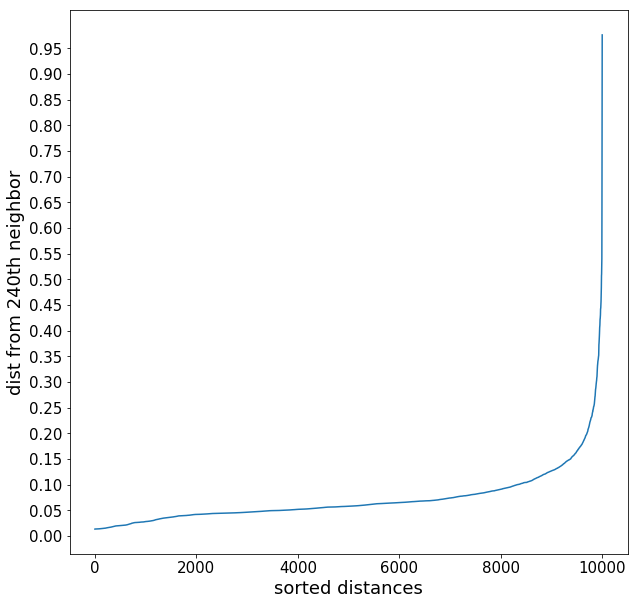

In [175]:
plot_knn(dist,240)

In [178]:
db_s20,db_l20=DBscan(att,0.15,240)

Dbscan Silhouette with eps=0.15 and minp=240:  0.5739369836692223
Cluster -1: 201
Cluster 0: 9799


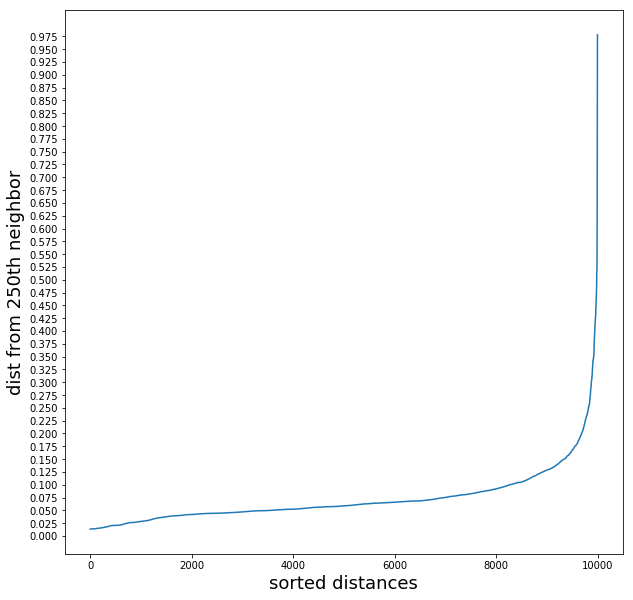

In [75]:
plot_knn(dist,250)

In [80]:
db_s20,db_l20=DBscan(att,0.160,250)

Dbscan Silhouette with eps=0.16 and minp=250:  -1
Cluster -1: 353
Cluster 0: 9647


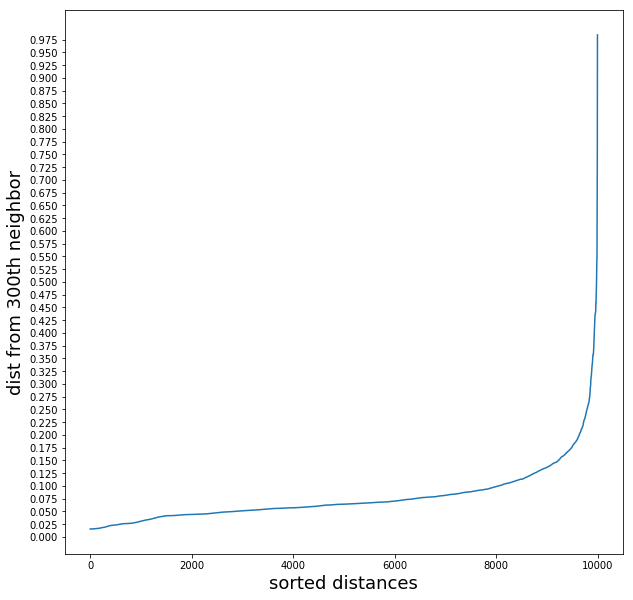

In [77]:
plot_knn(dist,300)

In [79]:
db_s20,db_l20=DBscan(att,0.160,300)

Dbscan Silhouette with eps=0.16 and minp=300:  -1
Cluster -1: 353
Cluster 0: 9647


In [83]:
c_dd,c_dl=Hier(att,'complete')
a_dd,a_dl=Hier(att,'average')
w_dd,w_dl=Hier(att,'ward')
s_dd,s_dl=Hier(att,'single')

C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
C:\Users\madda\Anaconda3\lib\site-packages\ipykernel_launcher.py:41: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


In [84]:
a=({'complete':[c_dd,c_dl],
   'average':[a_dd,a_dl],
   'ward':[w_dd,w_dl],
   'single':[s_dd,s_dl]})
import pickle
pickle.dump(a,o pen('dmhier','wb'))

In [46]:
data1.head()

,limit,sex,education,status,age,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,...,pa-sep,pa-aug,pa-jul,pa-jun,pa-may,pa-apr,credit_default,ps_m,ba_m,pa_m
0,50000,male,graduate school,single,25,2,0,0,0,0,...,2130,1905,1811,1100,1100,1200,no,0.333333,43317.666667,1541.000000
1,200000,male,university,married,54,-1,-1,-1,-1,-1,...,10120,7852,6336,4622,7956,5499,no,-1.000000,7914.333333,7064.166667
2,30000,female,high school,married,39,2,3,2,2,2,...,0,1700,1100,3,1053,1303,no,1.833333,29802.833333,859.833333
3,140000,female,university,single,31,0,0,0,0,0,...,2000,2000,900,2000,10000,5000,no,0.000000,36138.000000,3650.000000
4,60000,female,high school,married,36,1,2,2,0,0,...,1788,0,1894,1801,3997,0,yes,0.833333,49241.166667,1580.000000


In [7]:
new_data=data1.copy()

In [22]:
new_data.head()

,limit,sex,education,status,age,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,...,pa-sep,pa-aug,pa-jul,pa-jun,pa-may,pa-apr,credit_default,ps_m,ba_m,pa_m
0,50000,male,graduate school,single,25,2,0,0,0,0,...,2130,1905,1811,1100,1100,1200,no,0.333333,43317.666667,1541.000000
1,200000,male,university,married,54,-1,-1,-1,-1,-1,...,10120,7852,6336,4622,7956,5499,no,-1.000000,7914.333333,7064.166667
2,30000,female,high school,married,39,2,3,2,2,2,...,0,1700,1100,3,1053,1303,no,1.833333,29802.833333,859.833333
3,140000,female,university,single,31,0,0,0,0,0,...,2000,2000,900,2000,10000,5000,no,0.000000,36138.000000,3650.000000
4,60000,female,high school,married,36,1,2,2,0,0,...,1788,0,1894,1801,3997,0,yes,0.833333,49241.166667,1580.000000


In [8]:
new_data.drop(['sex','education','status','age','credit_default'],axis=1, inplace=True)

In [15]:
new_data.drop(['Lab'],axis=1, inplace=True)

KeyError: "labels ['Lab'] not contained in axis"

In [9]:
new_data.drop(['ps_m'],axis=1, inplace=True)

In [10]:
new_data.drop(['ba-aug','ba-jul','ba-jun','ba-may','ba-apr'],axis=1, inplace=True)

In [11]:
new_data.drop(['pa-sep','pa-aug','pa-jul','pa-jun','pa-may','pa-apr'],axis=1, inplace=True)

In [27]:
new_data.head()

,limit,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,ps-apr,ba-sep,ba_m,pa_m
0,50000,2,0,0,0,0,0,48966,43317.666667,1541.000000
1,200000,-1,-1,-1,-1,-1,-1,10755,7914.333333,7064.166667
2,30000,2,3,2,2,2,0,30057,29802.833333,859.833333
3,140000,0,0,0,0,0,0,56426,36138.000000,3650.000000
4,60000,1,2,2,0,0,0,47987,49241.166667,1580.000000


In [12]:
new_data['ps_mode']=new_data[['ps-sep','ps-aug','ps-jul','ps-jun','ps-may','ps-apr']].mode(axis=1)[0]

In [29]:
new_data.head()

,limit,ps-sep,ps-aug,ps-jul,ps-jun,ps-may,ps-apr,ba-sep,ba_m,pa_m,ps_mode
0,50000,2,0,0,0,0,0,48966,43317.666667,1541.000000,0.0
1,200000,-1,-1,-1,-1,-1,-1,10755,7914.333333,7064.166667,-1.0
2,30000,2,3,2,2,2,0,30057,29802.833333,859.833333,2.0
3,140000,0,0,0,0,0,0,56426,36138.000000,3650.000000,0.0
4,60000,1,2,2,0,0,0,47987,49241.166667,1580.000000,0.0


In [13]:
new_data.drop(['ps-aug','ps-jul','ps-jun','ps-may'],axis=1, inplace=True)

In [14]:
new_data.head()

,limit,ps-sep,ps-apr,ba-sep,ba_m,pa_m,ps_mode
0,50000,2,0,48966,43317.666667,1541.000000,0.0
1,200000,-1,-1,10755,7914.333333,7064.166667,-1.0
2,30000,2,0,30057,29802.833333,859.833333,2.0
3,140000,0,0,56426,36138.000000,3650.000000,0.0
4,60000,1,0,47987,49241.166667,1580.000000,0.0


In [32]:
new_data.to_csv("new_data.csv", sep=',', header=True, index=False)

In [16]:
data1.to_csv("data1.csv", sep=',', header=True, index=False)

In [297]:
#for each combination of num_columns columns
#we compute kmeans algorithm and we store silhouette value, Sse value, labels and Centers in dictionary d
for i in range(4, len(new_data.columns)):

    L = new_data.columns
    comb=[",".join(map(str, comb)) for comb in combinations(L, i)]
    d=({})

    for c in comb:
        if( ('ba-sep' not in c) or ('ba_m' not in c)):
            print(c)
            data=new_data[c.split(",")]
            sse, sil, lab, cent=kmeans(data,2,20)
            d[c]=({'Sil':sil,
                            'Sse':sse,
                            'Labels':lab,
                            'Centers':cent})
    pickle.dump(d,open('KM-'+str(i),'wb'))

limit,ps-sep,ps-apr,ba-sep


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


limit,ps-sep,ps-apr,ba_m
limit,ps-sep,ps-apr,pa_m
limit,ps-sep,ps-apr,ps_mode
limit,ps-sep,ba-sep,pa_m
limit,ps-sep,ba-sep,ps_mode
limit,ps-sep,ba_m,pa_m
limit,ps-sep,ba_m,ps_mode
limit,ps-sep,pa_m,ps_mode
limit,ps-apr,ba-sep,pa_m
limit,ps-apr,ba-sep,ps_mode
limit,ps-apr,ba_m,pa_m
limit,ps-apr,ba_m,ps_mode
limit,ps-apr,pa_m,ps_mode
limit,ba-sep,pa_m,ps_mode
limit,ba_m,pa_m,ps_mode
ps-sep,ps-apr,ba-sep,pa_m
ps-sep,ps-apr,ba-sep,ps_mode
ps-sep,ps-apr,ba_m,pa_m
ps-sep,ps-apr,ba_m,ps_mode
ps-sep,ps-apr,pa_m,ps_mode
ps-sep,ba-sep,pa_m,ps_mode
ps-sep,ba_m,pa_m,ps_mode
ps-apr,ba-sep,pa_m,ps_mode
ps-apr,ba_m,pa_m,ps_mode
limit,ps-sep,ps-apr,ba-sep,pa_m
limit,ps-sep,ps-apr,ba-sep,ps_mode
limit,ps-sep,ps-apr,ba_m,pa_m
limit,ps-sep,ps-apr,ba_m,ps_mode
limit,ps-sep,ps-apr,pa_m,ps_mode
limit,ps-sep,ba-sep,pa_m,ps_mode
limit,ps-sep,ba_m,pa_m,ps_mode
limit,ps-apr,ba-sep,pa_m,ps_mode
limit,ps-apr,ba_m,pa_m,ps_mode
ps-sep,ps-apr,ba-sep,pa_m,ps_mode
ps-sep,ps-apr,ba_m,pa_m,ps_mode
limit,ps-sep,ps-apr,ba

In [294]:
for i in range(3, len(new_data.columns)):
    L = new_data.columns
    comb=[",".join(map(str, comb)) for comb in combinations(L, i)]
    print(len(comb))


35
35
21
7


In [296]:
for i in range(4, len(new_data.columns)):
    L = new_data.columns
    comb=[",".join(map(str, comb)) for comb in combinations(L, i)]
    count=0
    for c in comb:
        if( ('ba-sep' not in c) or ('ba_m' not in c)):
            count+=1
    print(count)


25
11
2


In [18]:
import pickle 
dictio=pickle.load(open('KM-4','rb'))

limit,ps-sep,ps-apr,ba-sep


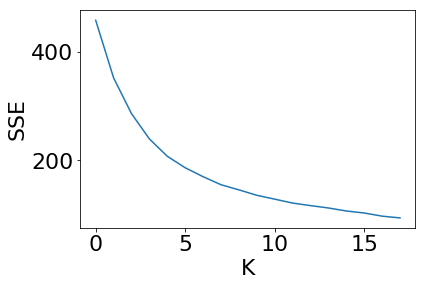

limit,ps-sep,ps-apr,ba_m


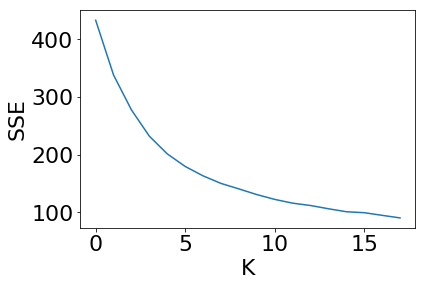

limit,ps-sep,ps-apr,pa_m


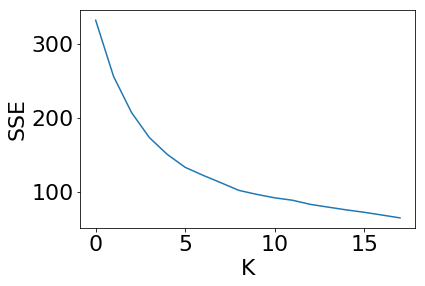

limit,ps-sep,ps-apr,ps_mode


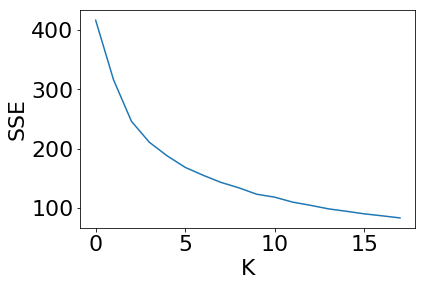

limit,ps-sep,ba-sep,pa_m


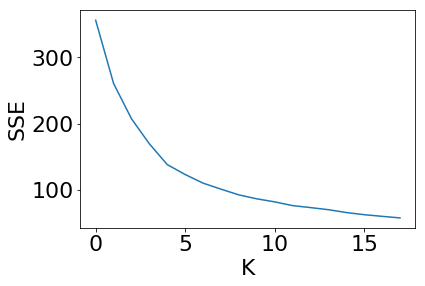

limit,ps-sep,ba-sep,ps_mode


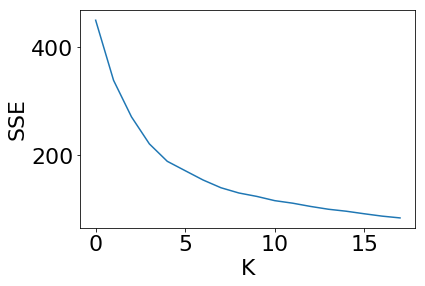

limit,ps-sep,ba_m,pa_m


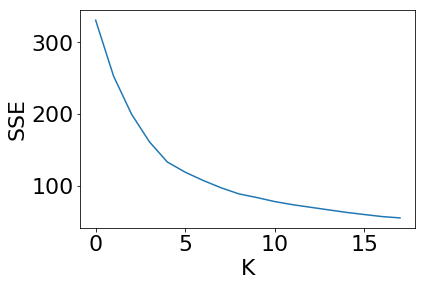

limit,ps-sep,ba_m,ps_mode


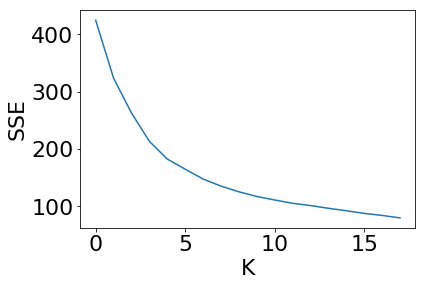

limit,ps-sep,pa_m,ps_mode


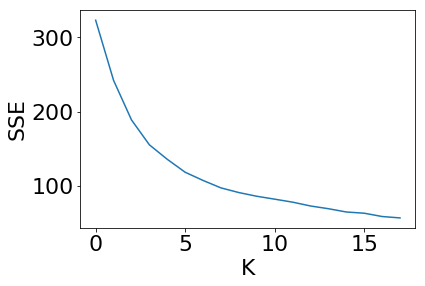

limit,ps-apr,ba-sep,pa_m


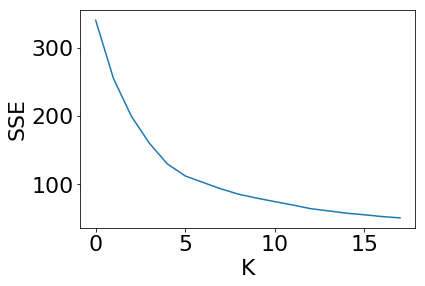

limit,ps-apr,ba-sep,ps_mode


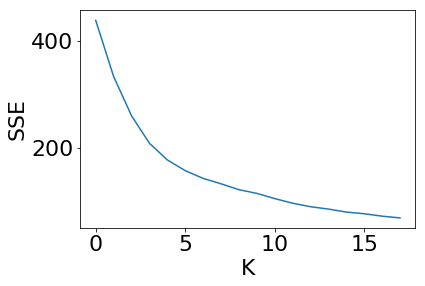

limit,ps-apr,ba_m,pa_m


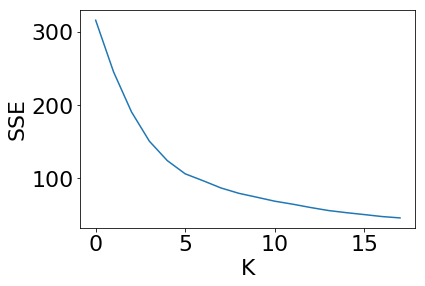

limit,ps-apr,ba_m,ps_mode


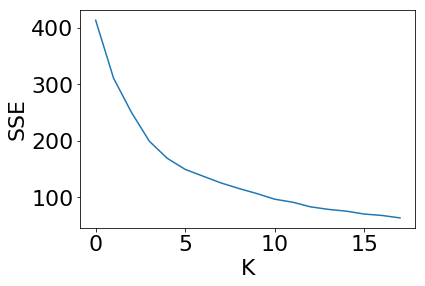

limit,ps-apr,pa_m,ps_mode


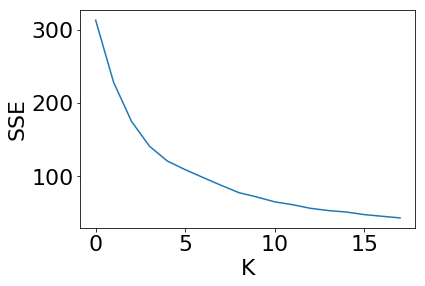

limit,ba-sep,pa_m,ps_mode


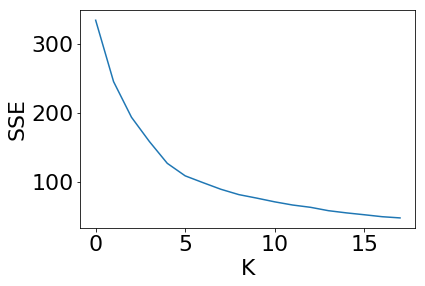

limit,ba_m,pa_m,ps_mode


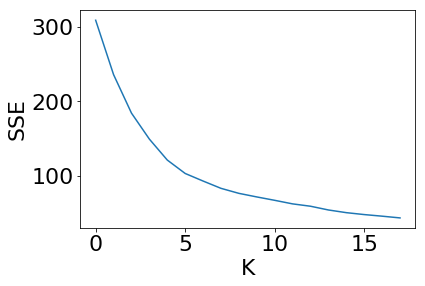

ps-sep,ps-apr,ba-sep,pa_m


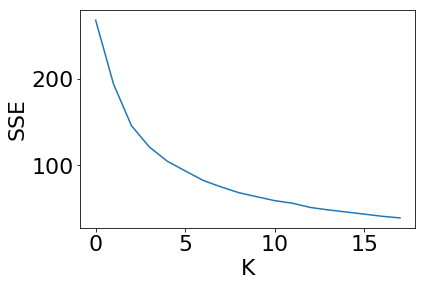

ps-sep,ps-apr,ba-sep,ps_mode


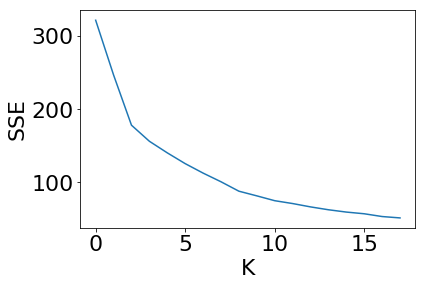

ps-sep,ps-apr,ba_m,pa_m


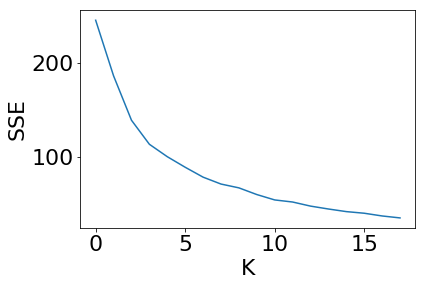

ps-sep,ps-apr,ba_m,ps_mode


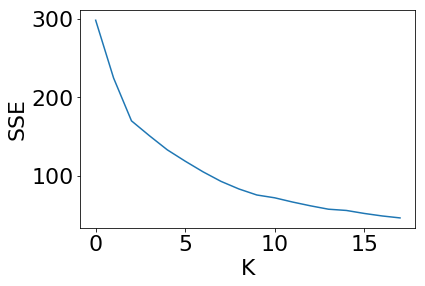

ps-sep,ps-apr,pa_m,ps_mode


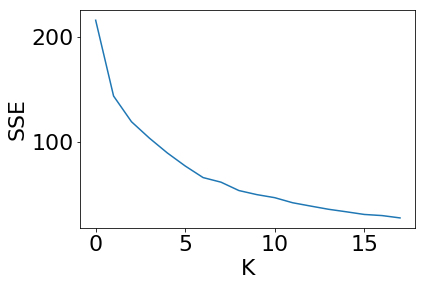

ps-sep,ba-sep,pa_m,ps_mode


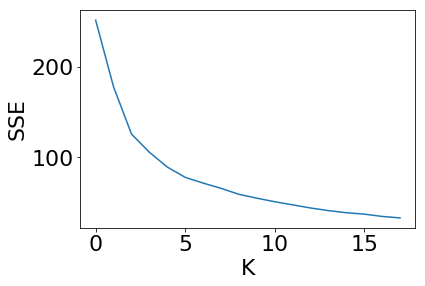

ps-sep,ba_m,pa_m,ps_mode


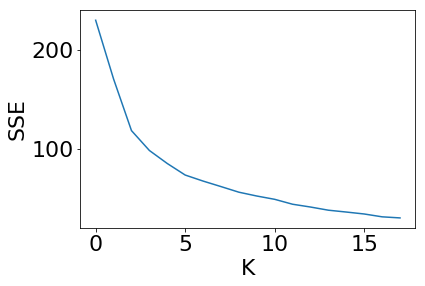

ps-apr,ba-sep,pa_m,ps_mode


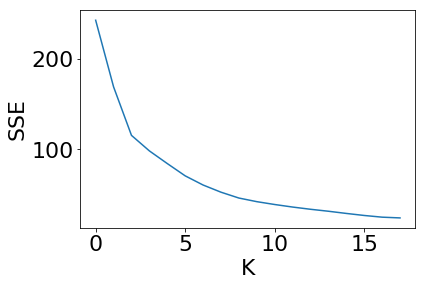

ps-apr,ba_m,pa_m,ps_mode


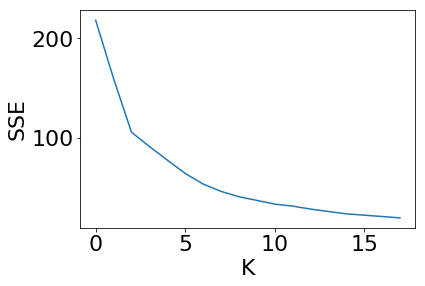

In [36]:
for c in dictio:
    print(c)
    plot_sse(dictio[c]['Sse'])

Sse:  186.5468256815639
Silhouette:  0.34733803626054793
{0: 3102, 1: 2082, 2: 589, 3: 436, 4: 1318, 5: 892, 6: 1581}


C:\Users\madda\Anaconda3\lib\site-packages\sklearn\utils\validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)


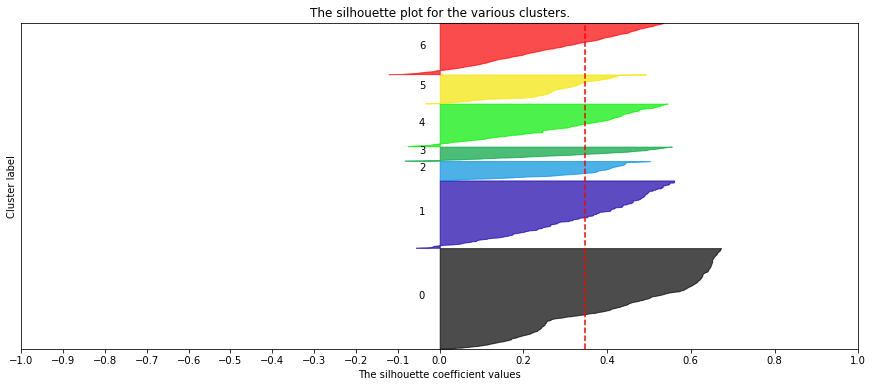

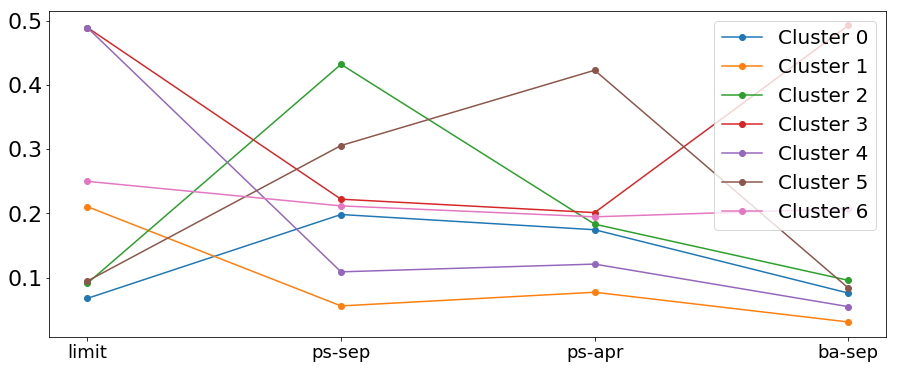

Sse:  179.6890229137152
Silhouette:  0.33183450901011075
{0: 877, 1: 1238, 2: 2052, 3: 1630, 4: 461, 5: 2835, 6: 907}


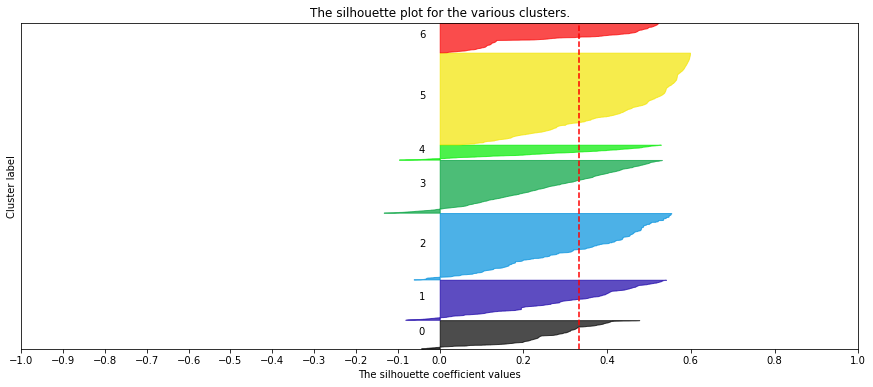

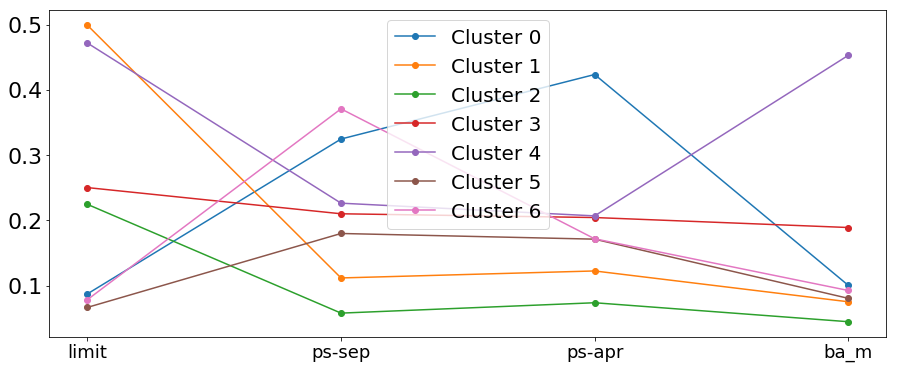

Sse:  132.9653265873179
Silhouette:  0.35877040077411887
{0: 1432, 1: 874, 2: 1216, 3: 1063, 4: 2774, 5: 936, 6: 1705}


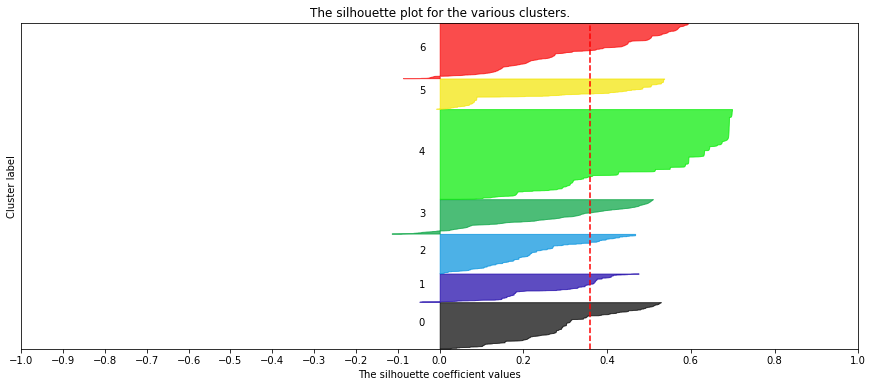

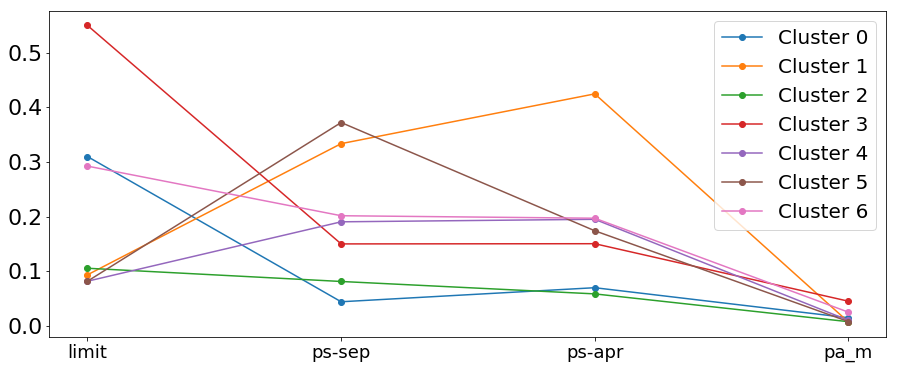

Sse:  168.67452047876077
Silhouette:  0.3535098943269707
{0: 778, 1: 1496, 2: 2753, 3: 1062, 4: 609, 5: 1365, 6: 1937}


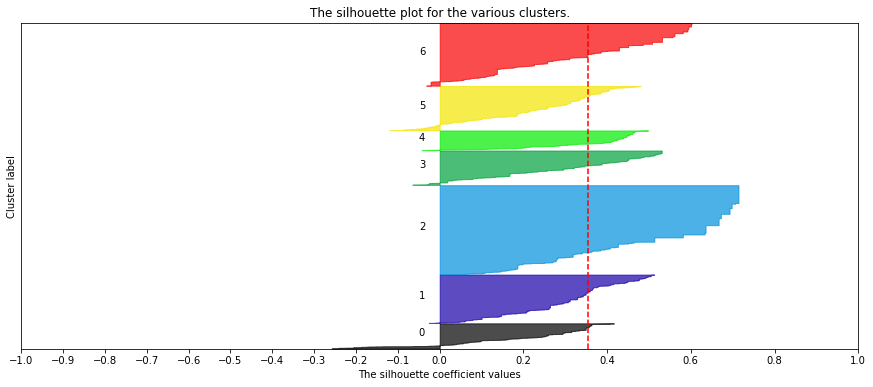

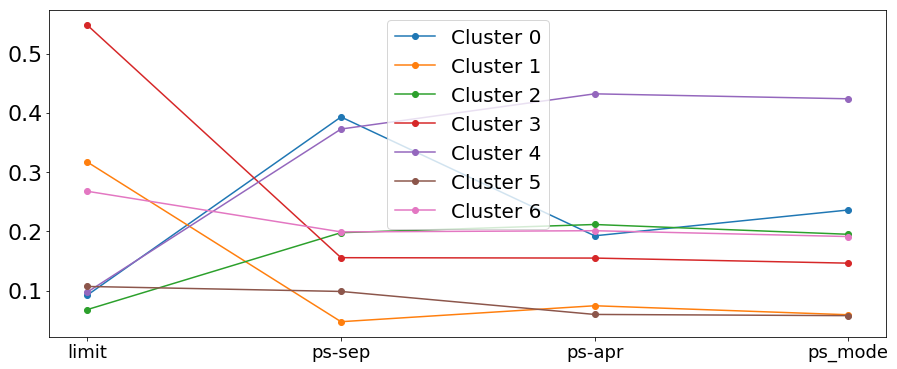

Sse:  123.06378806829119
Silhouette:  0.36656374356544047
{0: 1176, 1: 3256, 2: 407, 3: 1030, 4: 935, 5: 1307, 6: 1889}


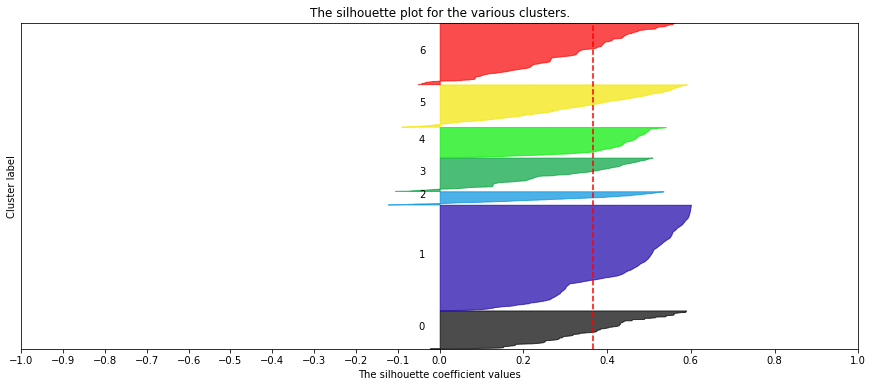

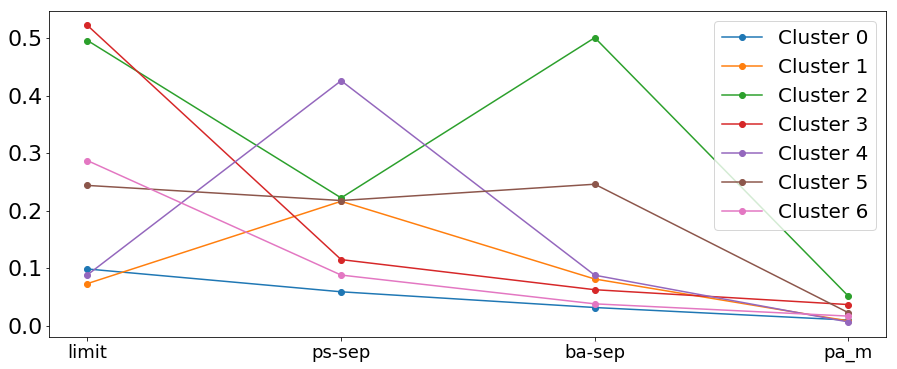

Sse:  171.47998269554512
Silhouette:  0.35878433223591016
{0: 2121, 1: 1346, 2: 809, 3: 443, 4: 1623, 5: 766, 6: 2892}


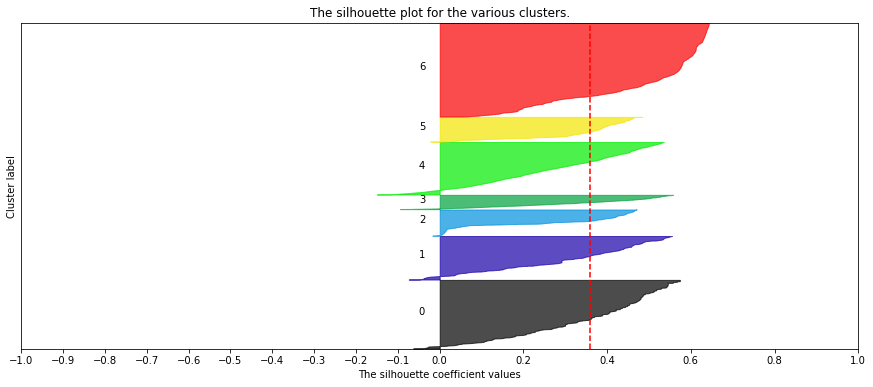

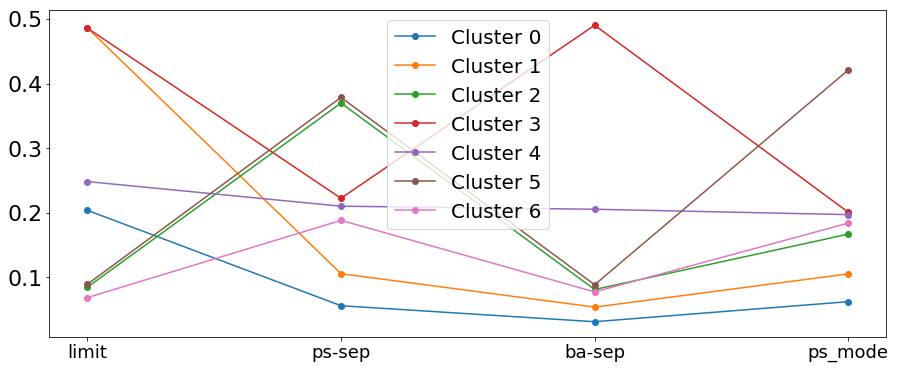

Sse:  118.93885542109099
Silhouette:  0.3676303469738269
{0: 346, 1: 3295, 2: 1866, 3: 934, 4: 1059, 5: 1320, 6: 1180}


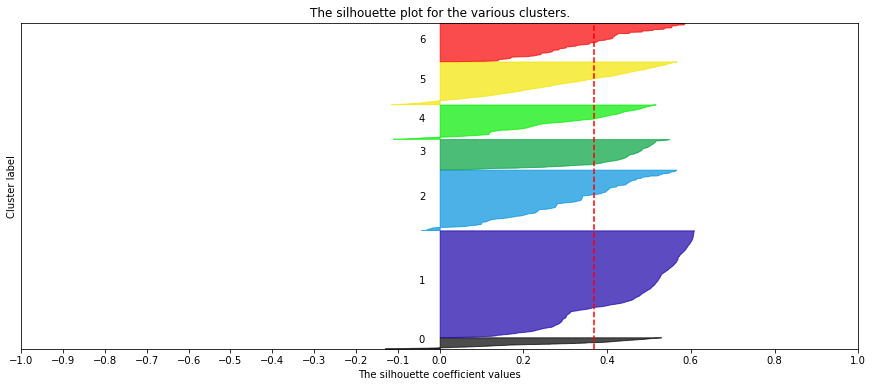

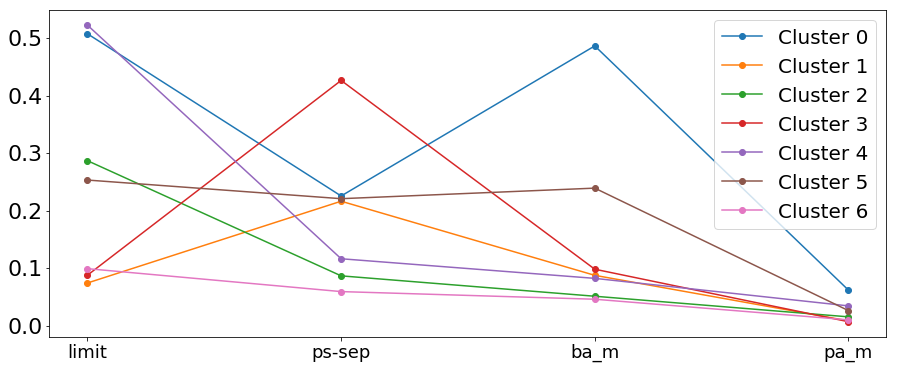

Sse:  164.7172889266622
Silhouette:  0.3419649604563395
{0: 1706, 1: 924, 2: 1139, 3: 1592, 4: 462, 5: 2894, 6: 1283}


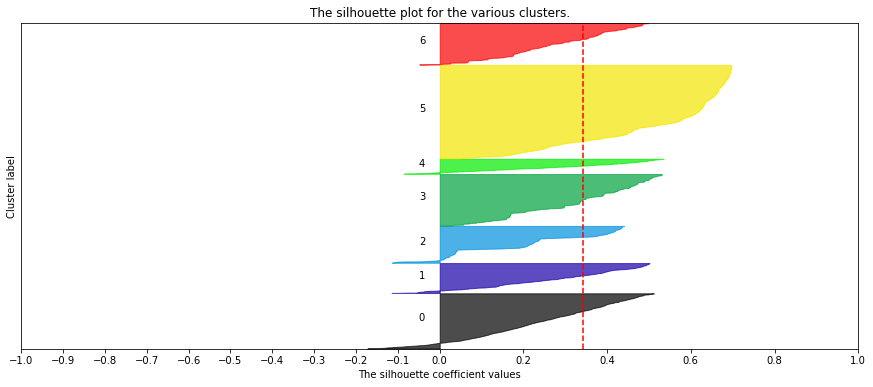

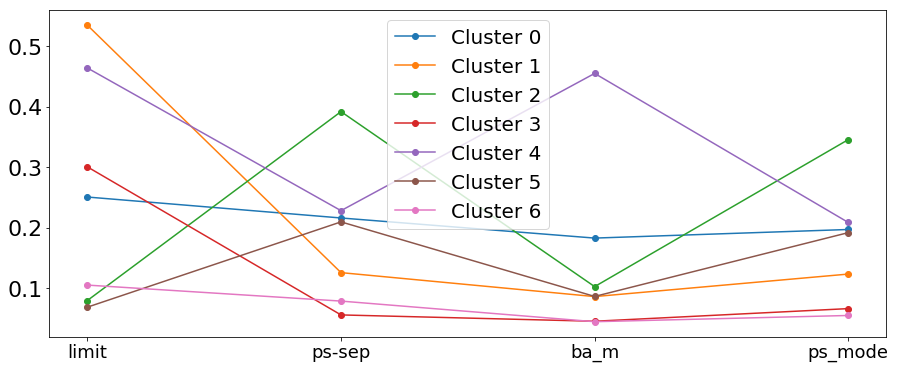

Sse:  118.47844616283835
Silhouette:  0.3949641244527241
{0: 1315, 1: 1087, 2: 784, 3: 1734, 4: 807, 5: 1545, 6: 2728}


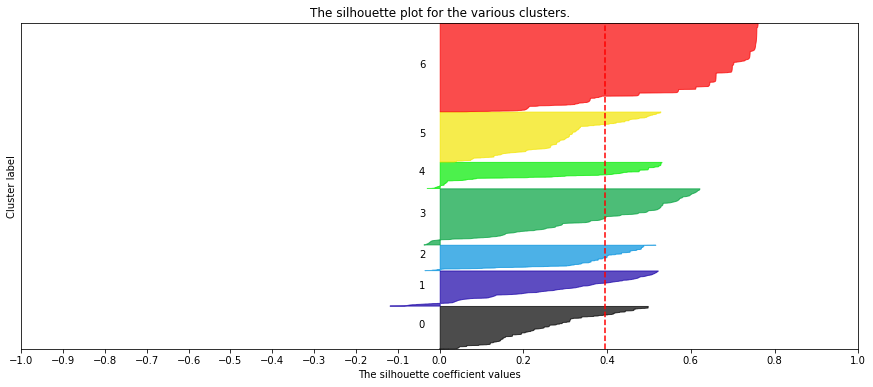

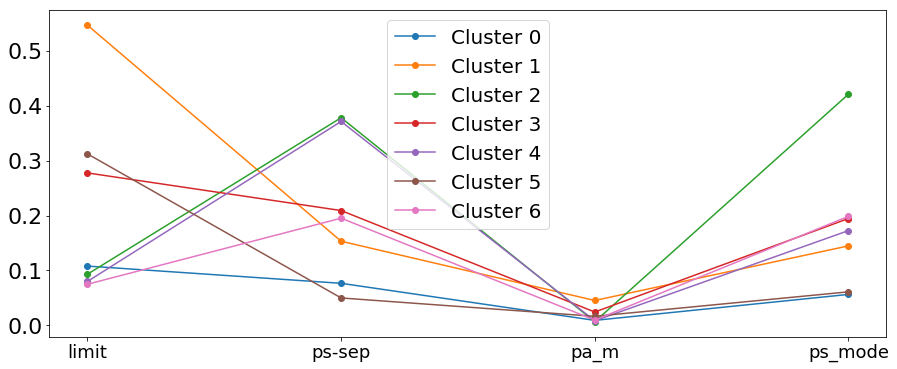

Sse:  112.43937612959134
Silhouette:  0.3973534918562289
{0: 3019, 1: 2073, 2: 1192, 3: 1093, 4: 1327, 5: 920, 6: 376}


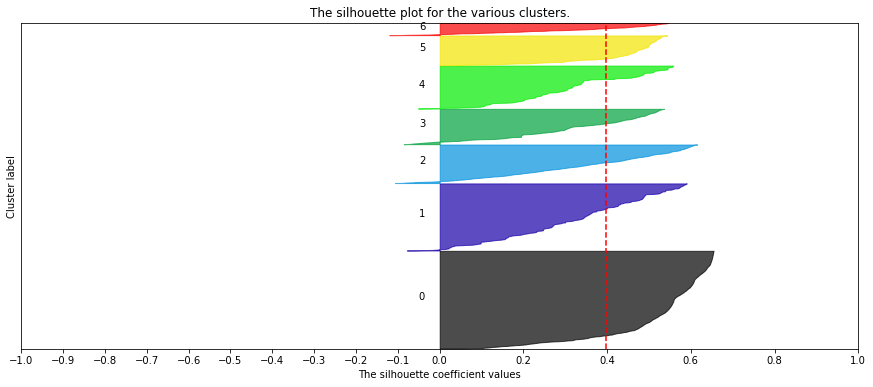

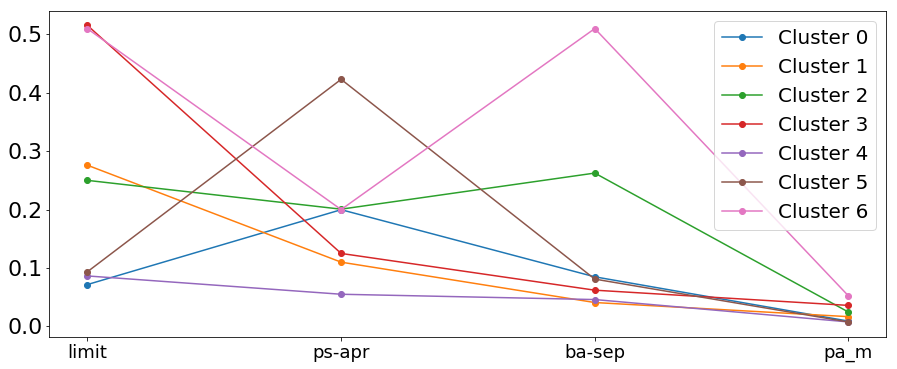

Sse:  157.74146152178275
Silhouette:  0.3686914239571778
{0: 1035, 1: 3194, 2: 416, 3: 1349, 4: 857, 5: 1761, 6: 1388}


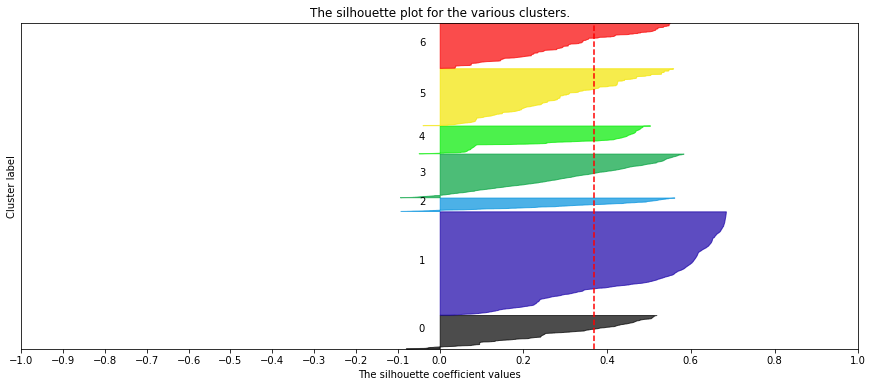

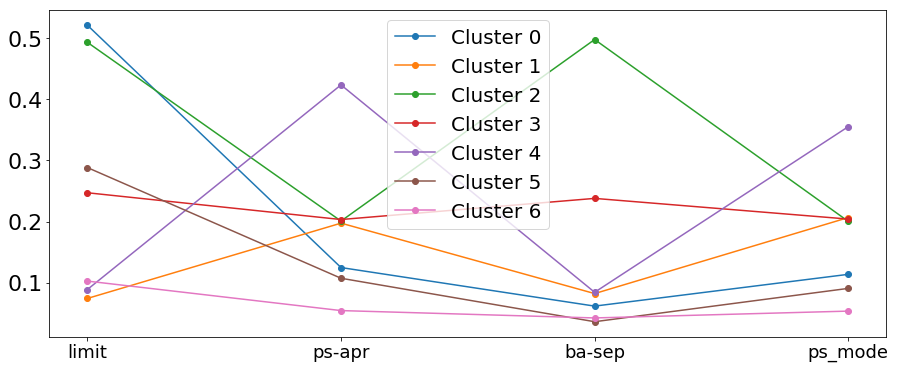

Sse:  106.22302602289696
Silhouette:  0.4061336822035089
{0: 1107, 1: 3032, 2: 1345, 3: 2056, 4: 338, 5: 1216, 6: 906}


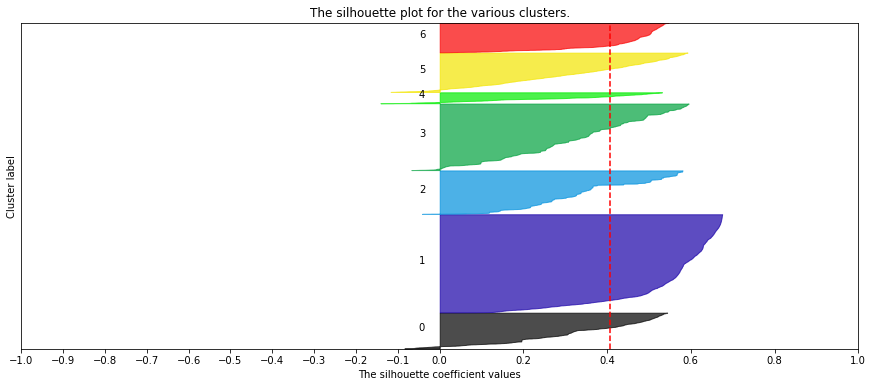

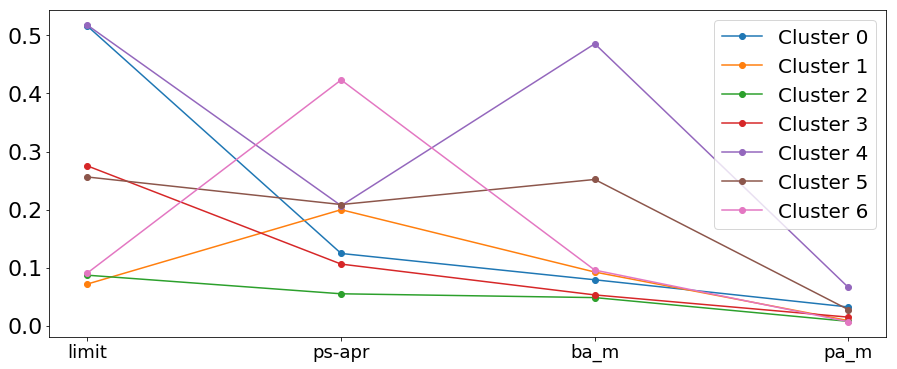

Sse:  149.4572633944945
Silhouette:  0.3753737025740788
{0: 1180, 1: 3057, 2: 460, 3: 1067, 4: 837, 5: 1697, 6: 1702}


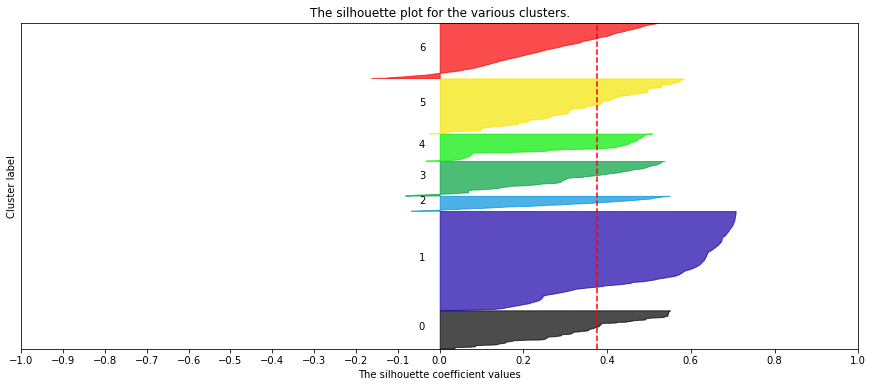

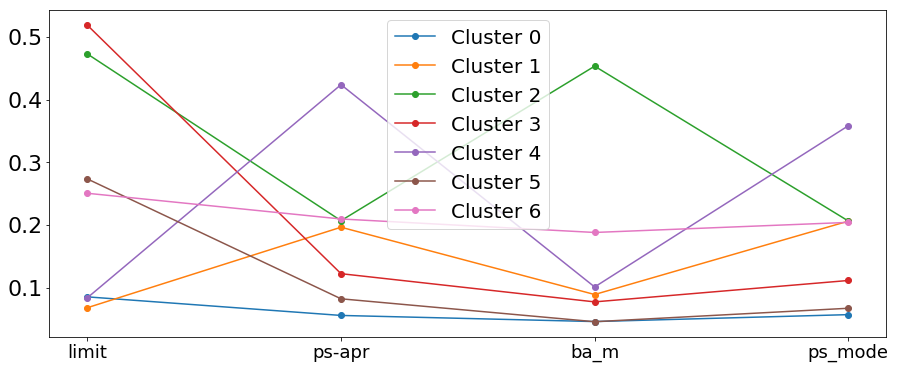

Sse:  108.97848784838158
Silhouette:  0.4161966120111261
{0: 3226, 1: 1507, 2: 1134, 3: 1878, 4: 22, 5: 1380, 6: 853}


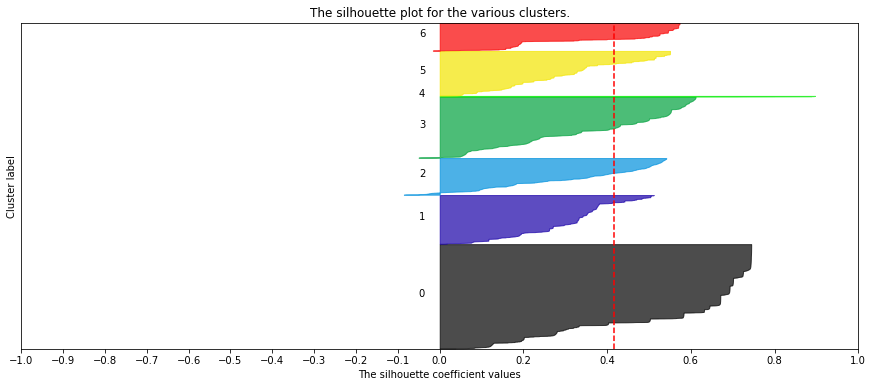

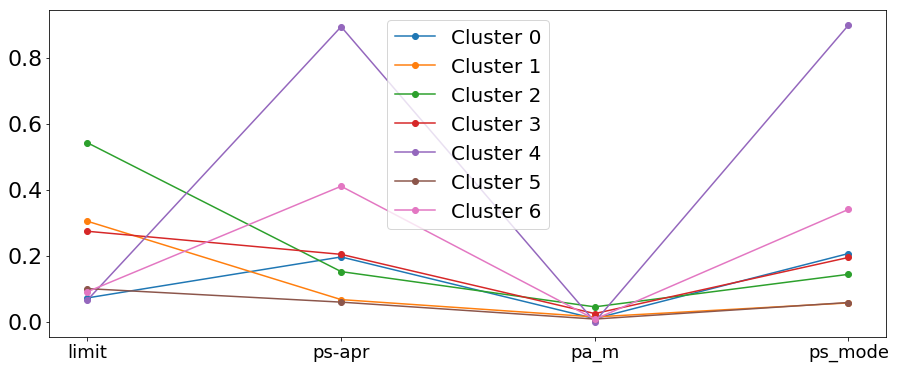

Sse:  108.74907103642332
Silhouette:  0.40653434048259285
{0: 1416, 1: 1283, 2: 1037, 3: 1974, 4: 397, 5: 3133, 6: 760}


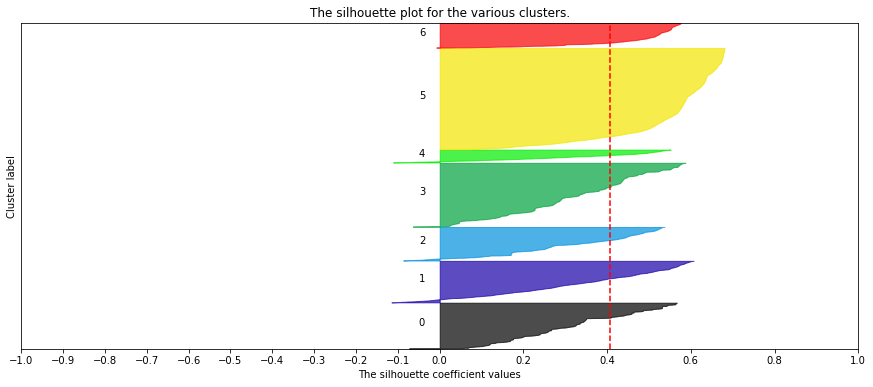

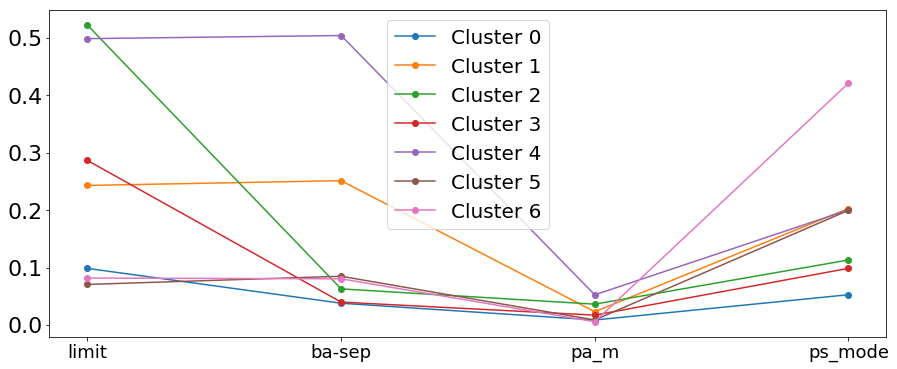

Sse:  102.94303694880216
Silhouette:  0.41610888320541906
{0: 3154, 1: 1111, 2: 356, 3: 2022, 4: 1296, 5: 745, 6: 1316}


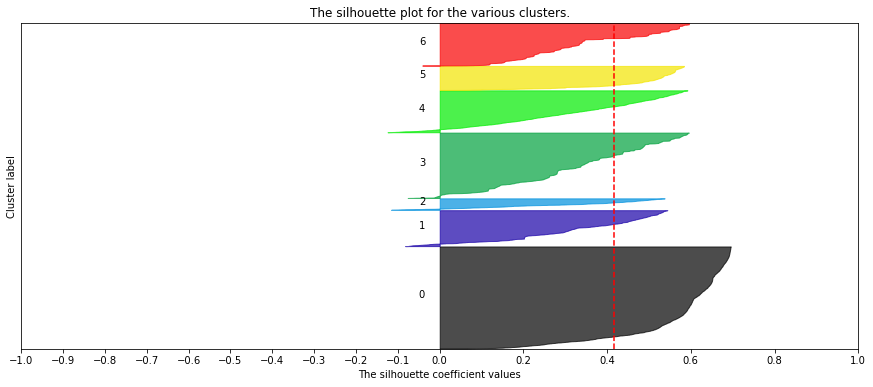

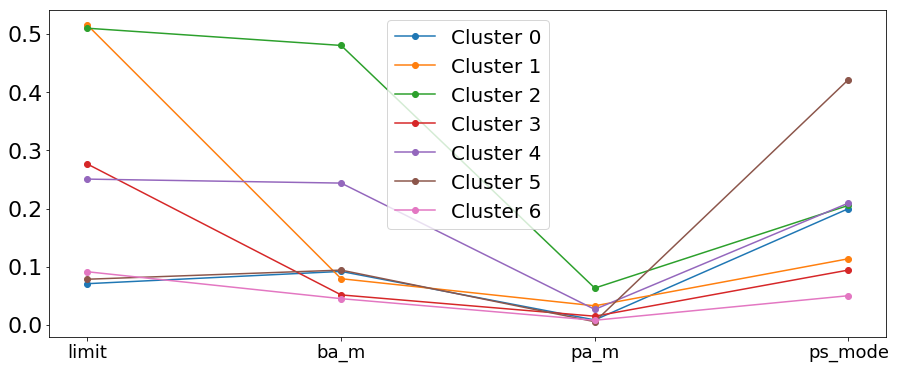

Sse:  93.57992448499445
Silhouette:  0.4186310124034354
{0: 890, 1: 3215, 2: 1950, 3: 1207, 4: 313, 5: 997, 6: 1428}


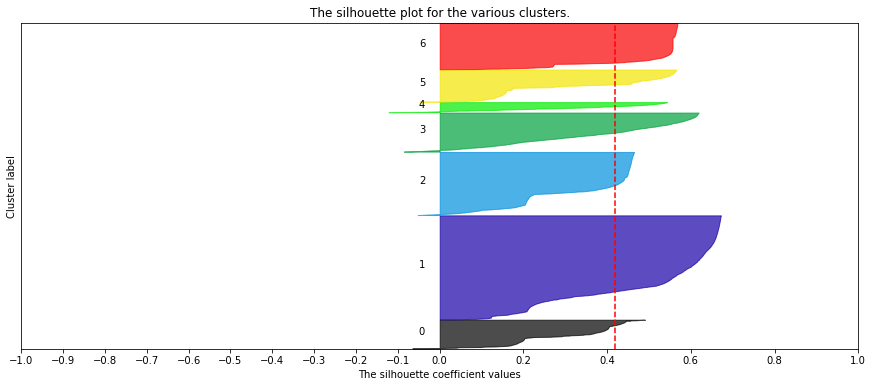

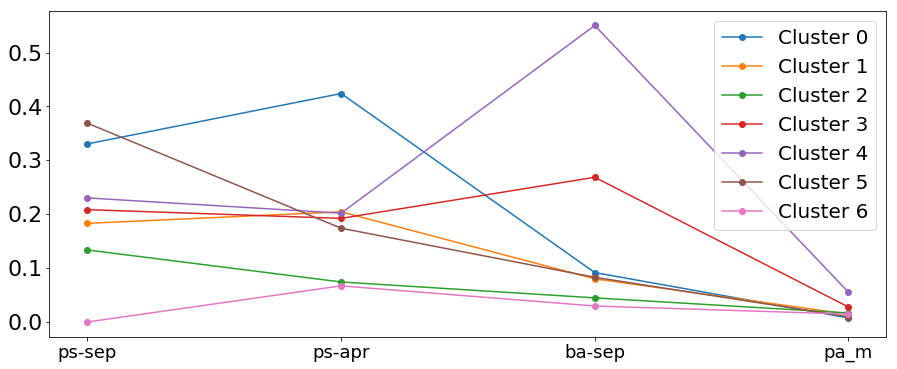

Sse:  125.68512973220588
Silhouette:  0.44021127770110696
{0: 646, 1: 3574, 2: 678, 3: 3004, 4: 305, 5: 1187, 6: 606}


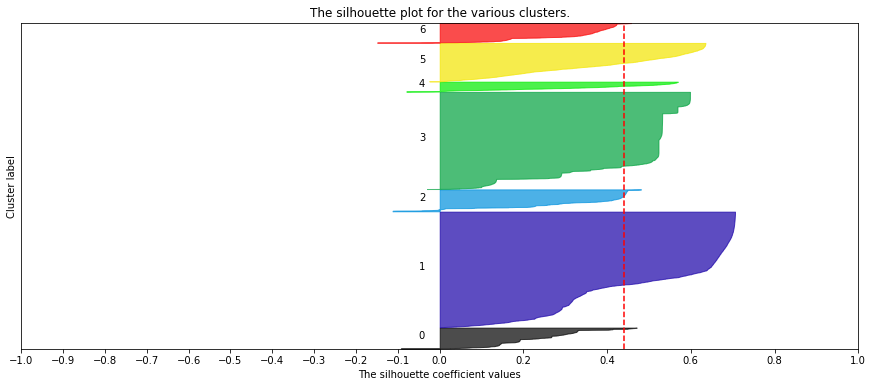

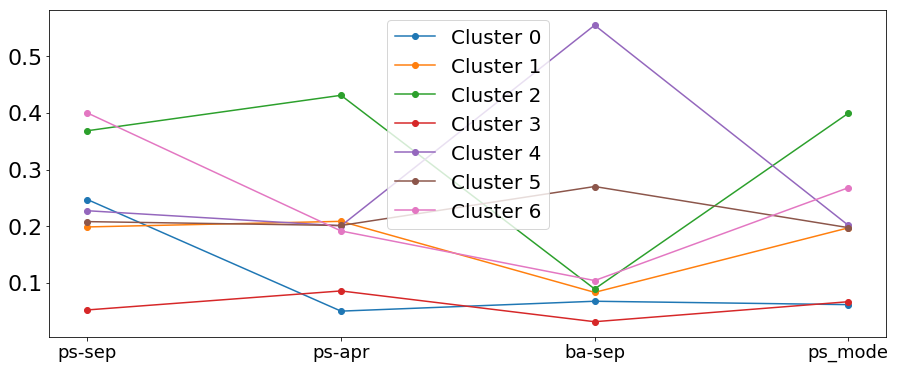

Sse:  88.86282716815032
Silhouette:  0.4395181036497535
{0: 406, 1: 1188, 2: 3027, 3: 1052, 4: 293, 5: 564, 6: 3470}


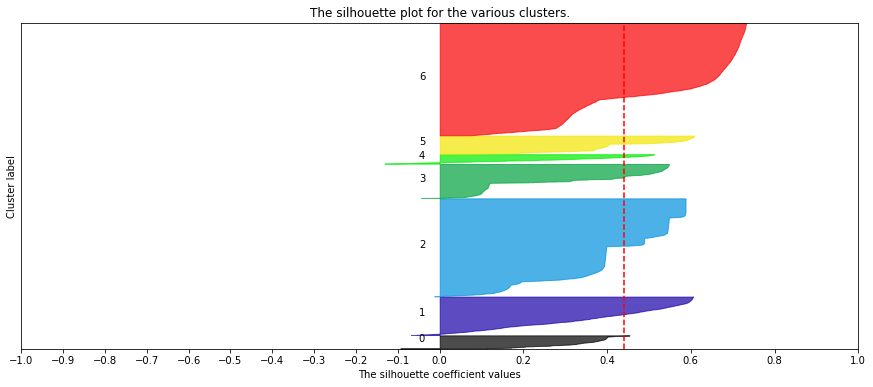

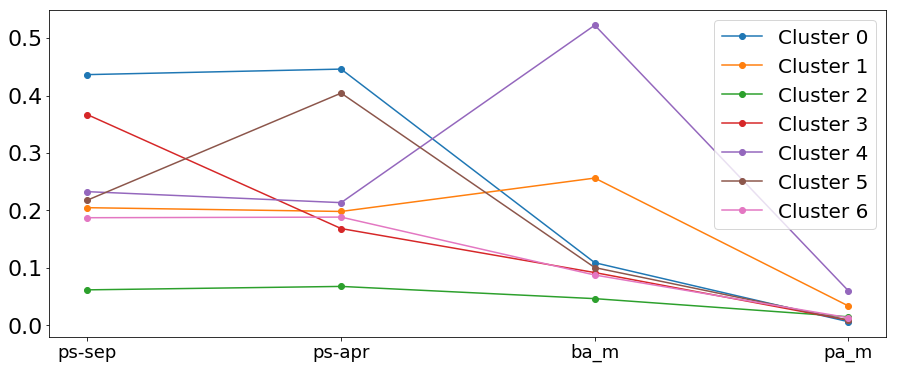

Sse:  118.80793040907108
Silhouette:  0.4472315379888265
{0: 3837, 1: 997, 2: 674, 3: 613, 4: 913, 5: 2027, 6: 939}


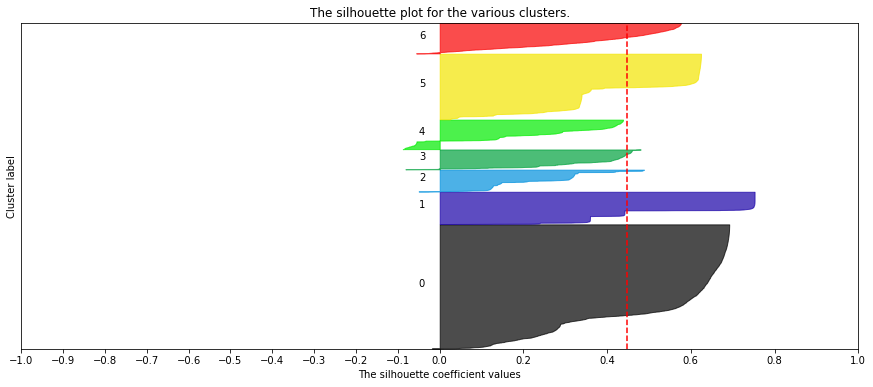

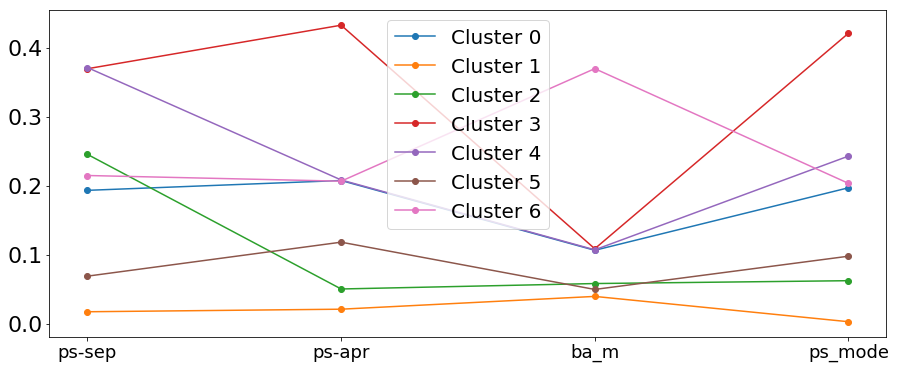

Sse:  76.78239704090458
Silhouette:  0.5531467956229815
{0: 2161, 1: 770, 2: 4403, 3: 22, 4: 931, 5: 410, 6: 1303}


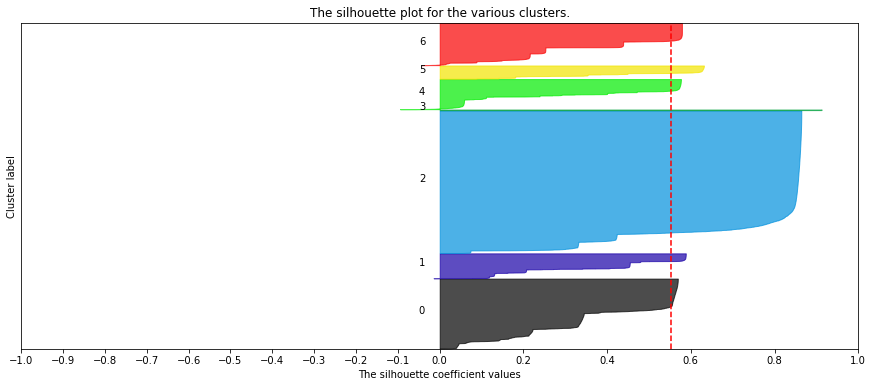

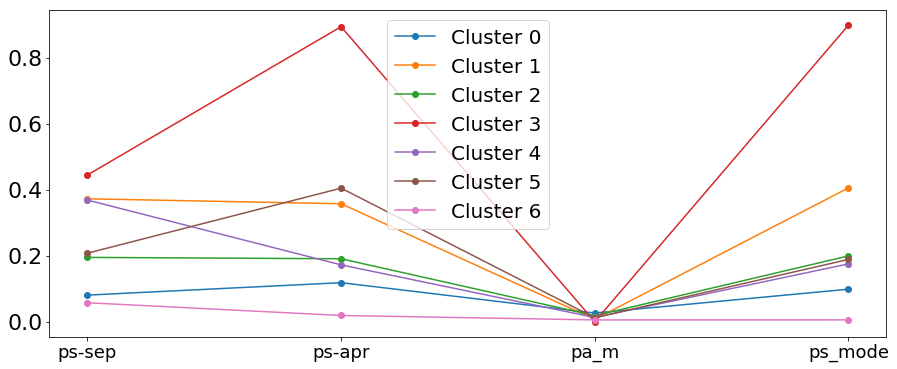

Sse:  78.07506709695889
Silhouette:  0.4774356663605617
{0: 3388, 1: 785, 2: 1956, 3: 309, 4: 1213, 5: 1443, 6: 906}


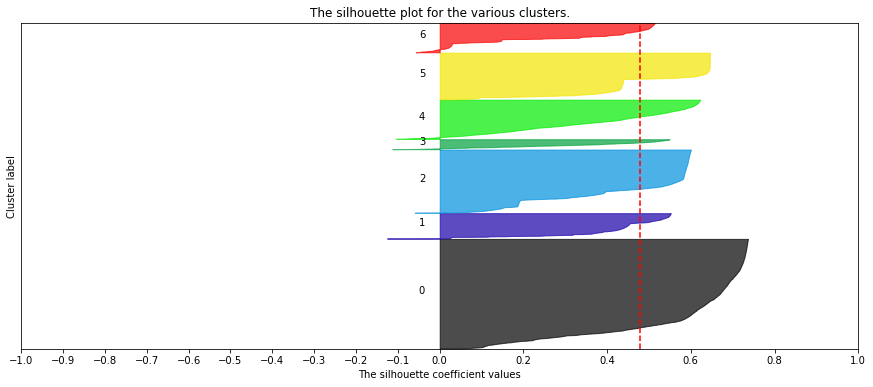

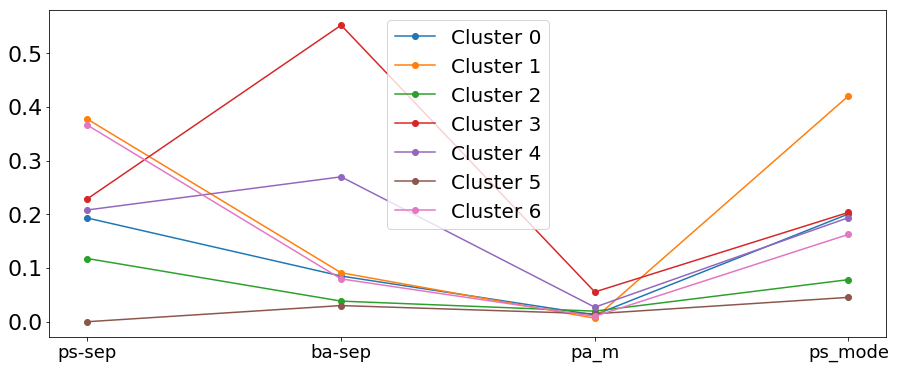

Sse:  73.32540445576524
Silhouette:  0.48604416901151287
{0: 2013, 1: 1202, 2: 296, 3: 778, 4: 3342, 5: 926, 6: 1443}


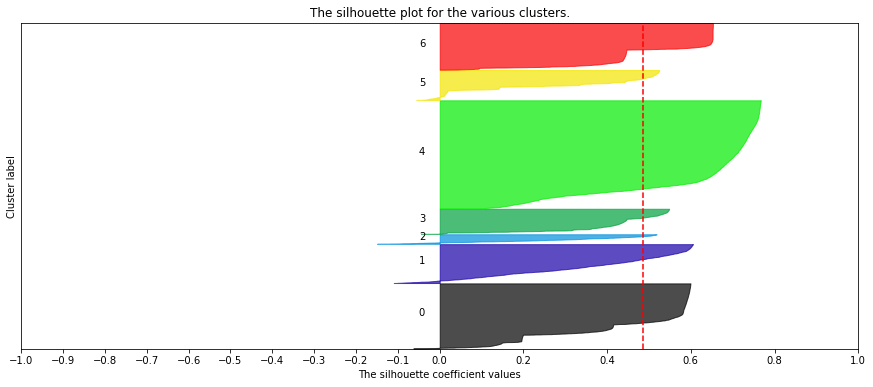

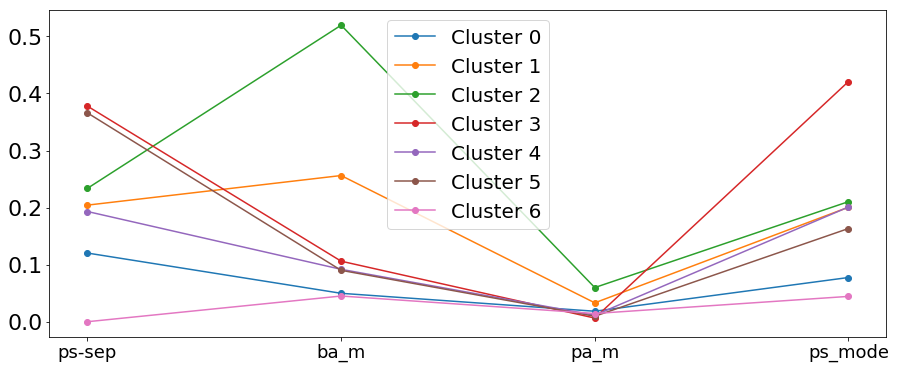

Sse:  70.5253093762063
Silhouette:  0.5069800393010483
{0: 1235, 1: 3737, 2: 1379, 3: 2355, 4: 599, 5: 310, 6: 385}


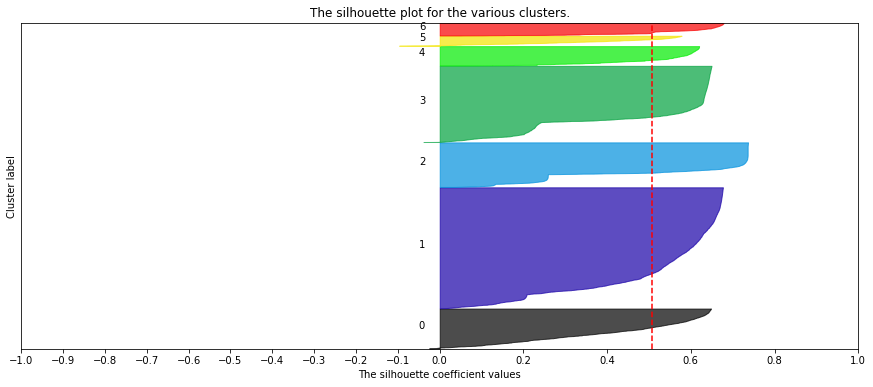

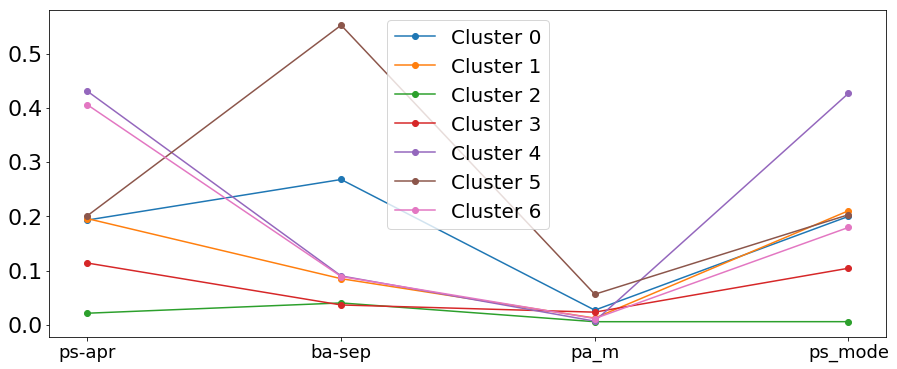

Sse:  64.56243345497114
Silhouette:  0.5228424105143124
{0: 1275, 1: 597, 2: 2422, 3: 3621, 4: 305, 5: 384, 6: 1396}


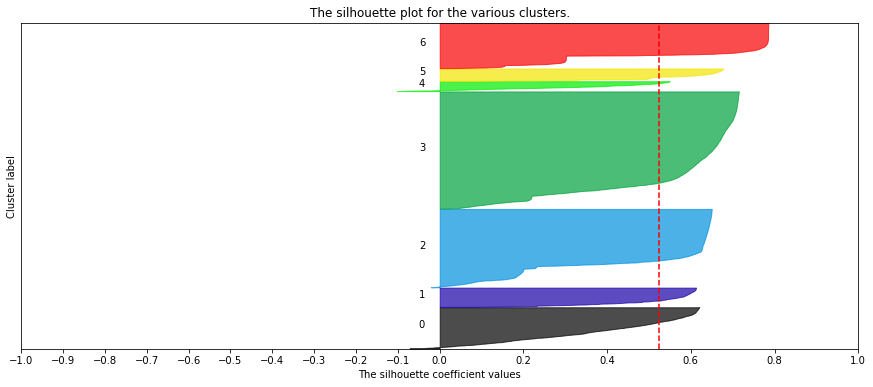

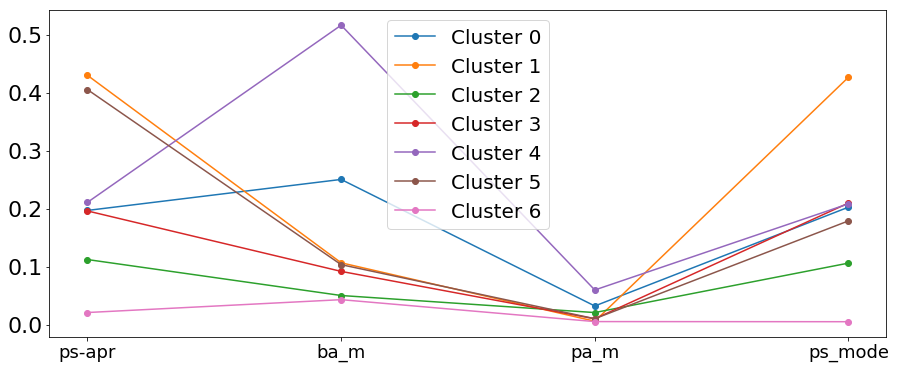

In [43]:
k=5
for c in dictio:
    print('Sse: ',dictio[c]['Sse'][k])
    analyze_km(new_data[c.split(',')],dictio[c]['Labels'][k],dictio[c]['Centers'][k],dictio[c]['Sil'][k])

In [21]:
data1['ps_mode']=new_data['ps_mode']

limit,ps-sep,ps-apr,ba-sep


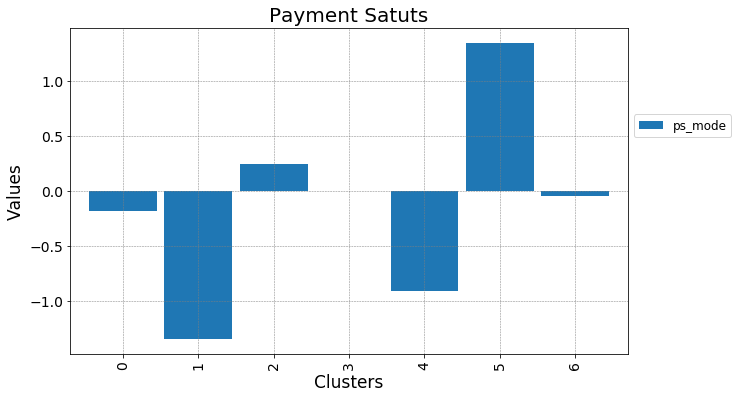

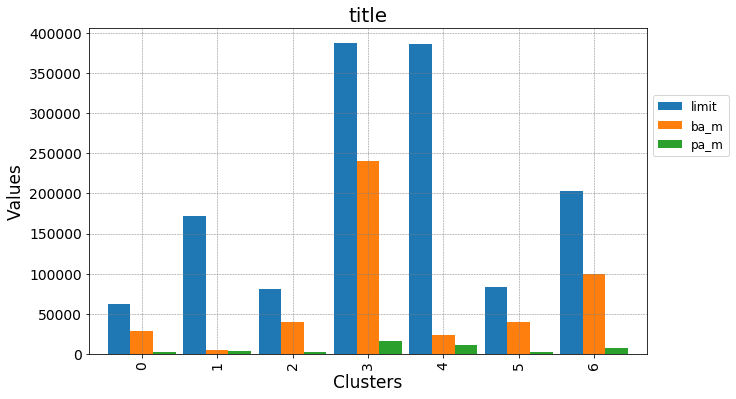

limit,ps-sep,ps-apr,ba_m


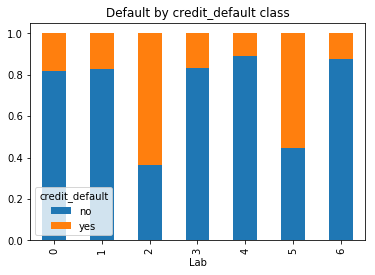

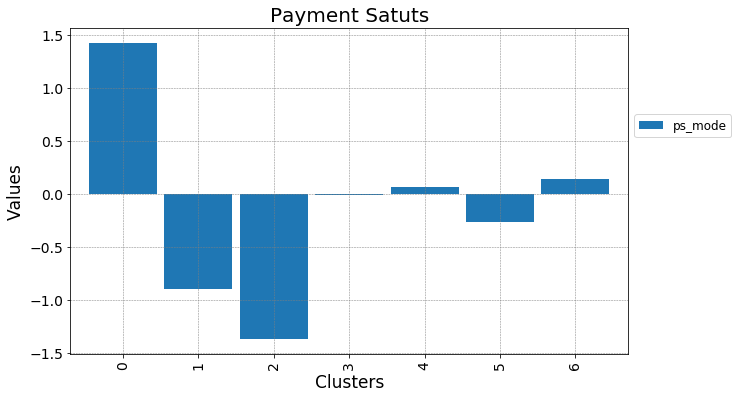

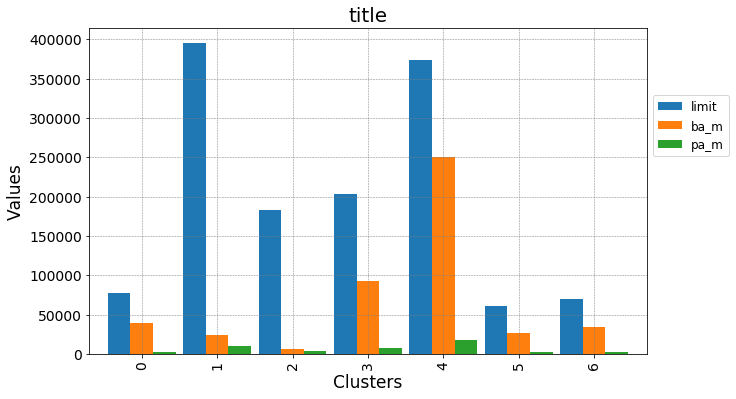

limit,ps-sep,ps-apr,pa_m


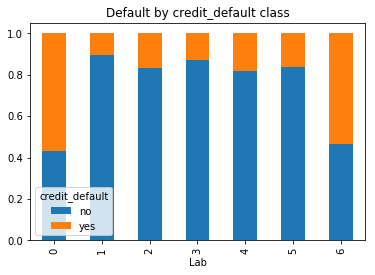

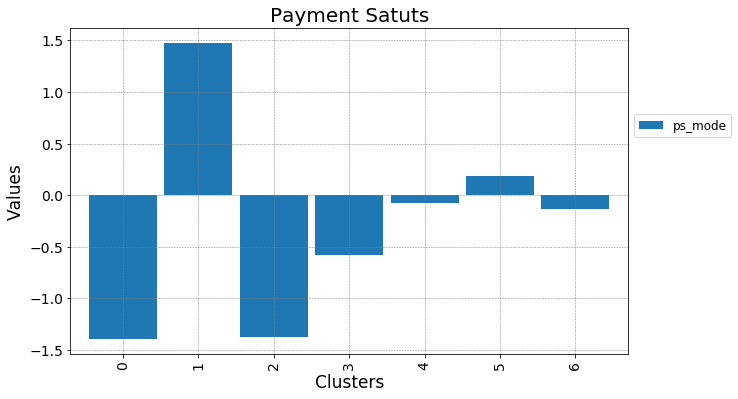

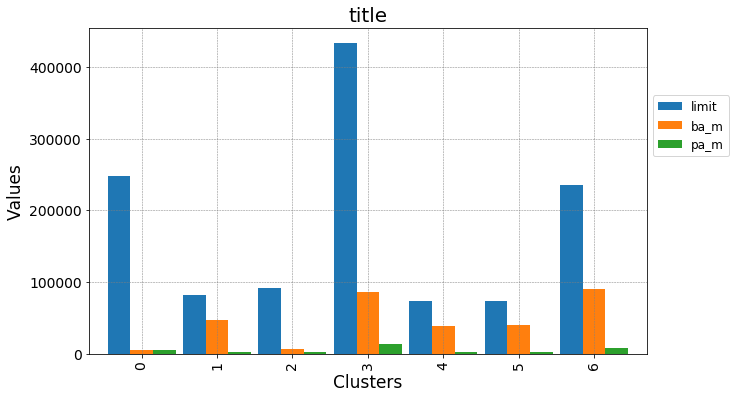

limit,ps-sep,ps-apr,ps_mode


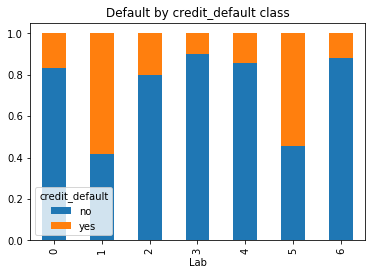

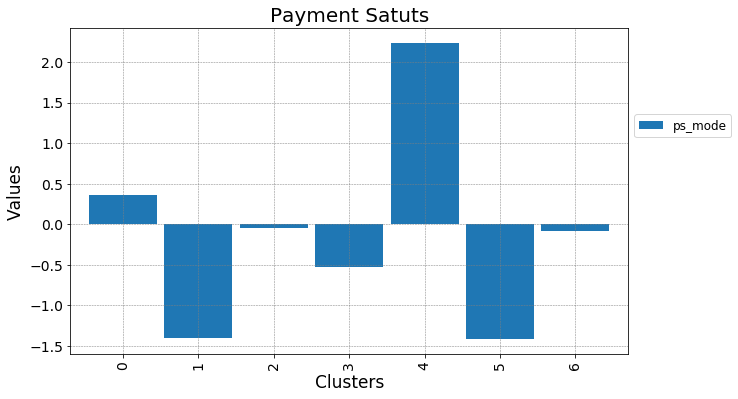

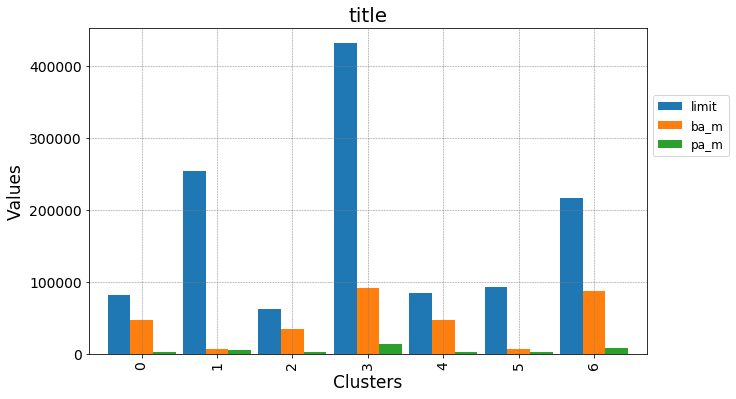

limit,ps-sep,ba-sep,pa_m


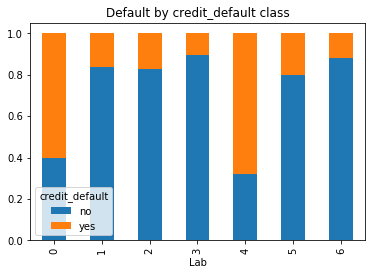

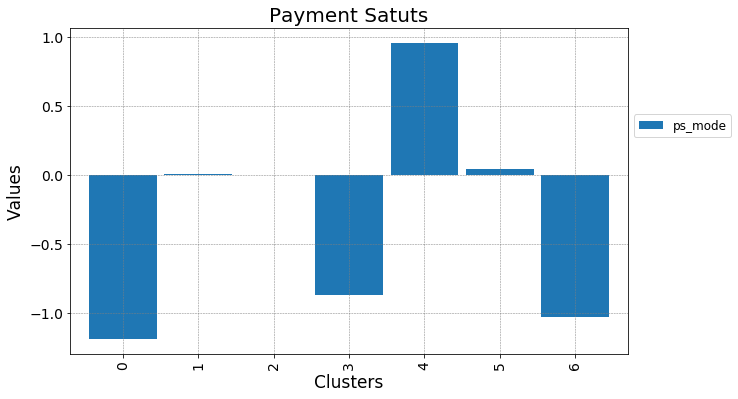

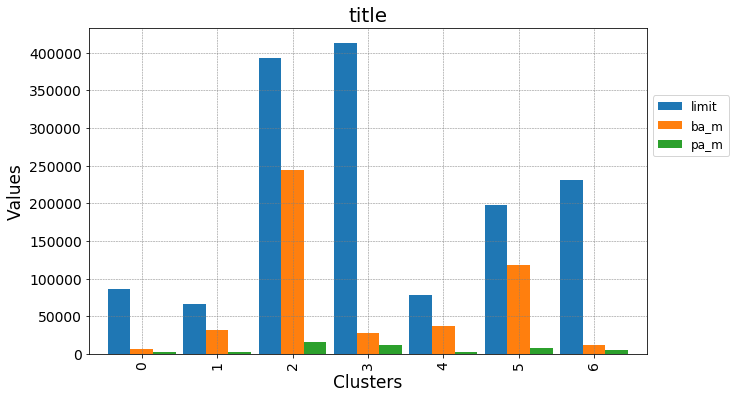

limit,ps-sep,ba-sep,ps_mode


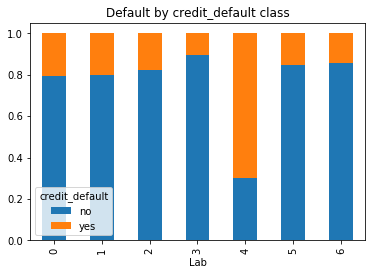

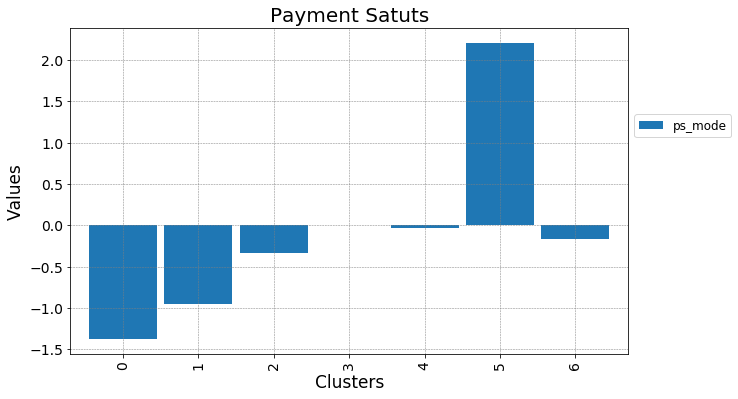

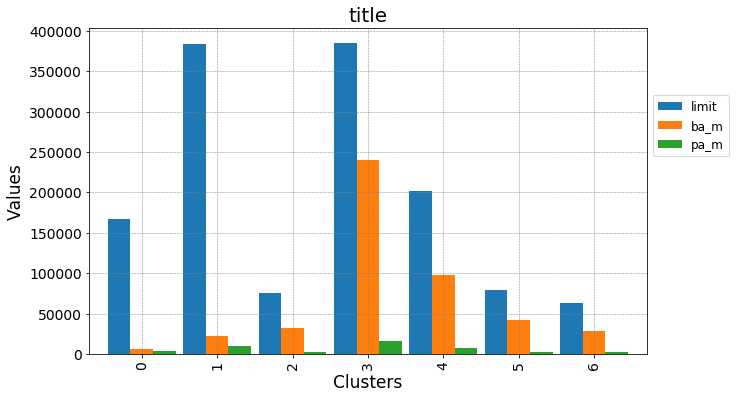

limit,ps-sep,ba_m,pa_m


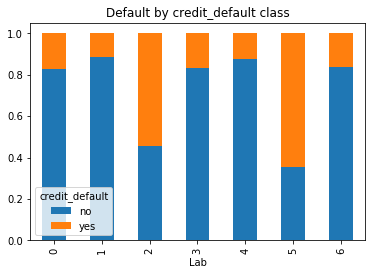

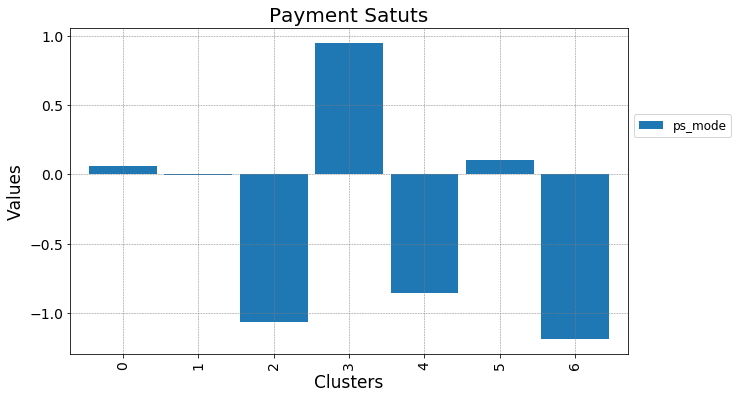

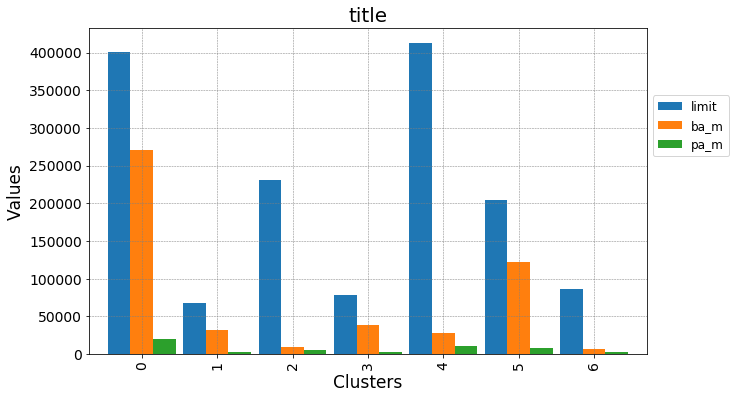

limit,ps-sep,ba_m,ps_mode


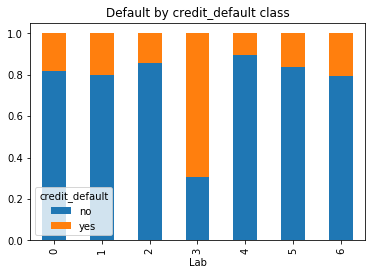

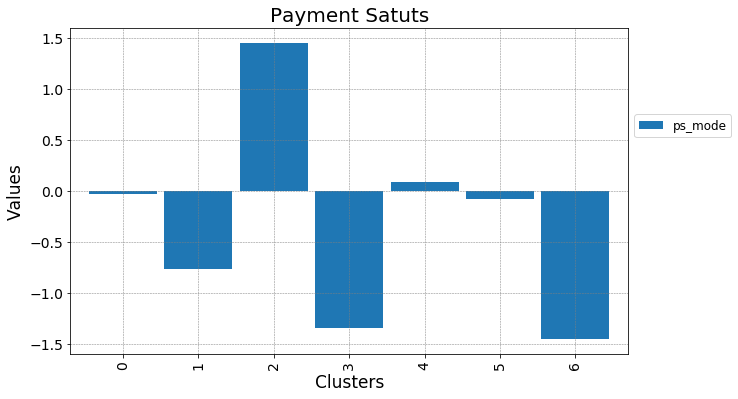

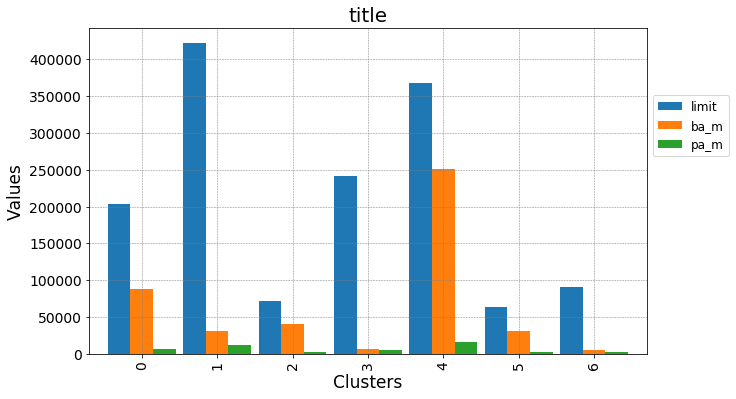

limit,ps-sep,pa_m,ps_mode


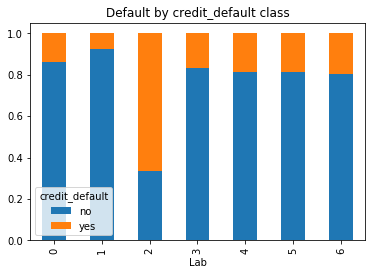

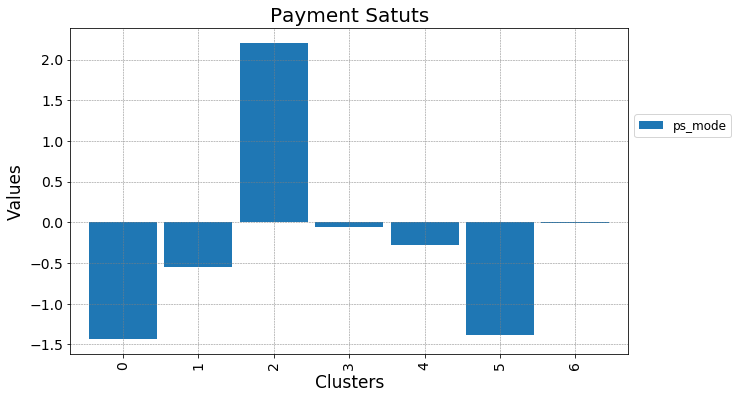

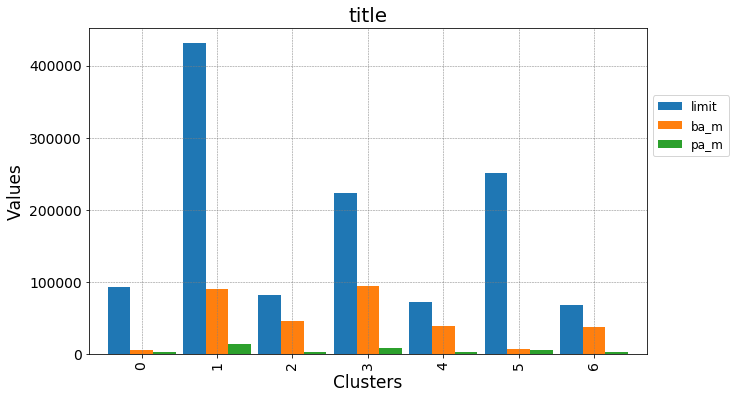

limit,ps-apr,ba-sep,pa_m


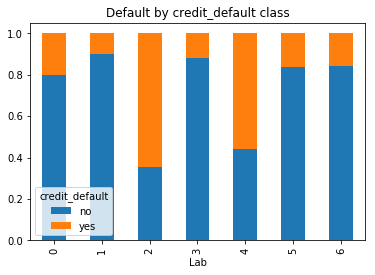

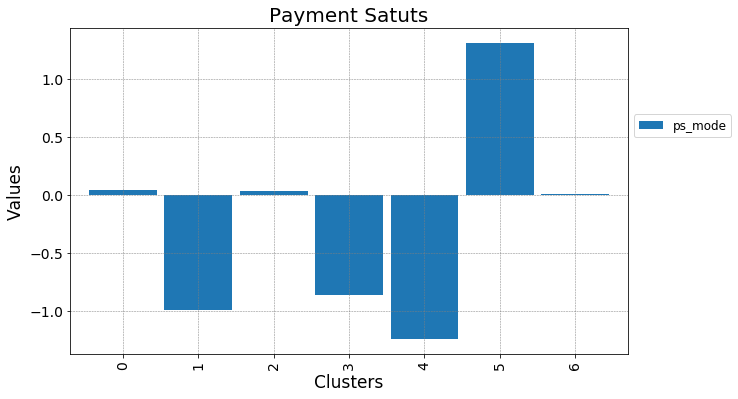

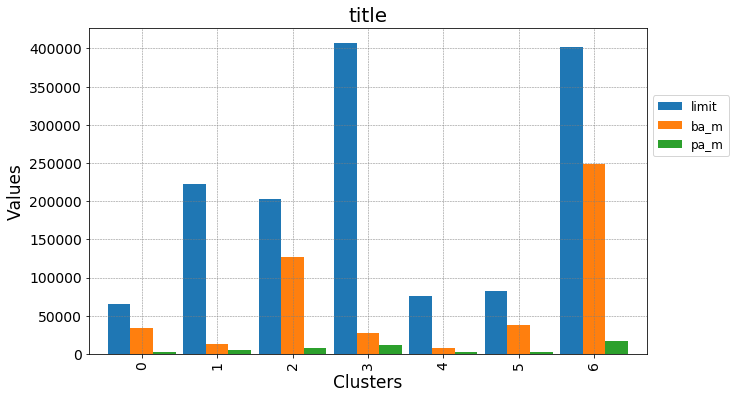

limit,ps-apr,ba-sep,ps_mode


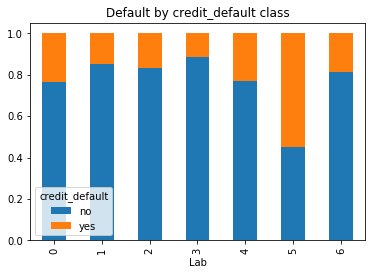

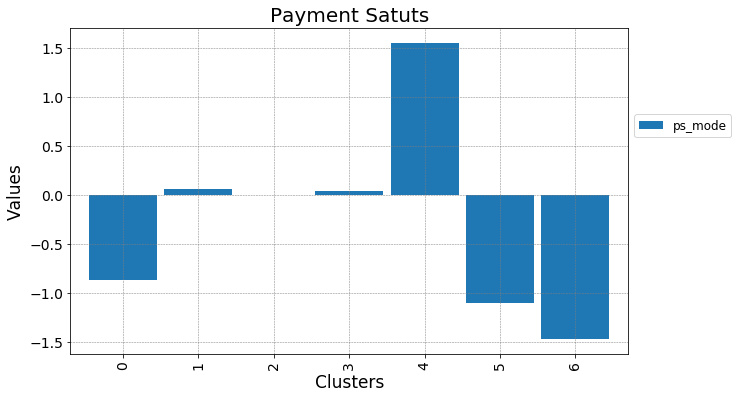

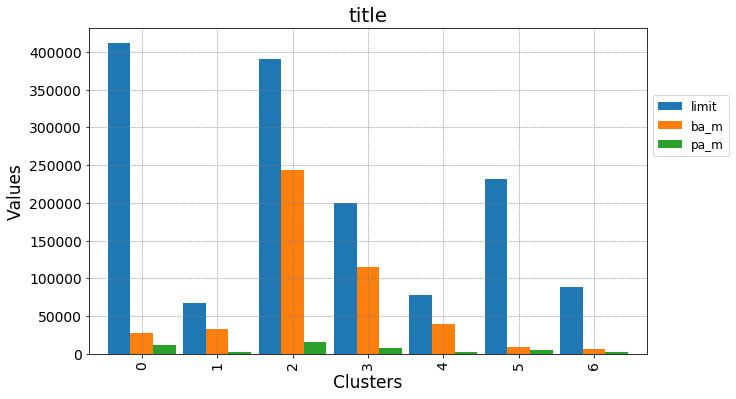

limit,ps-apr,ba_m,pa_m


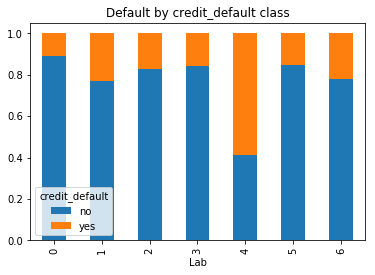

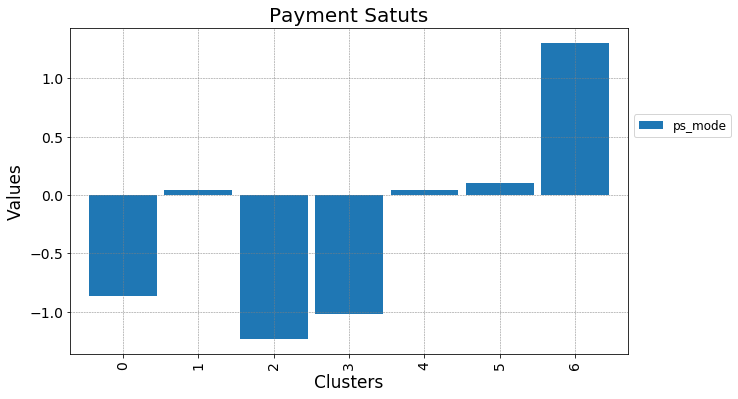

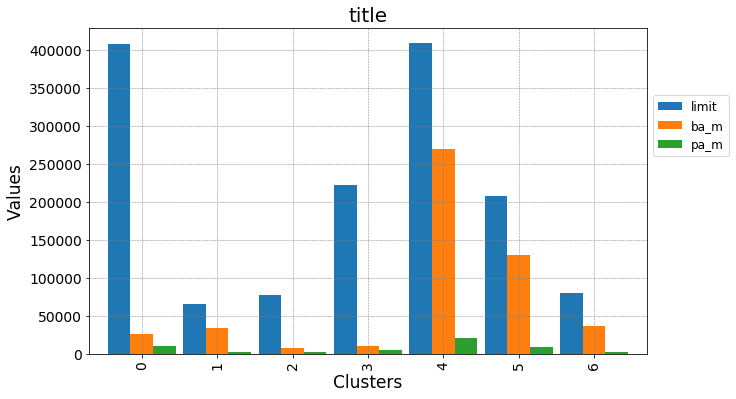

limit,ps-apr,ba_m,ps_mode


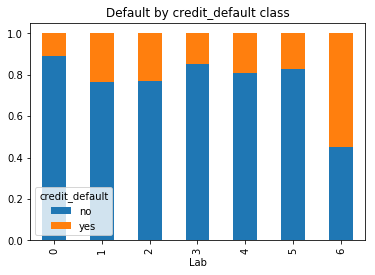

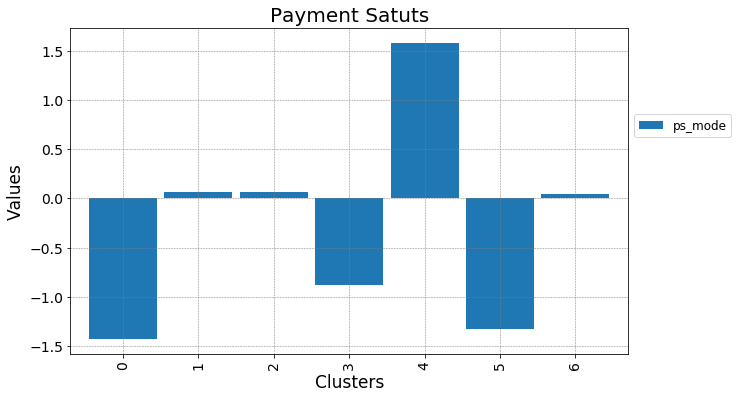

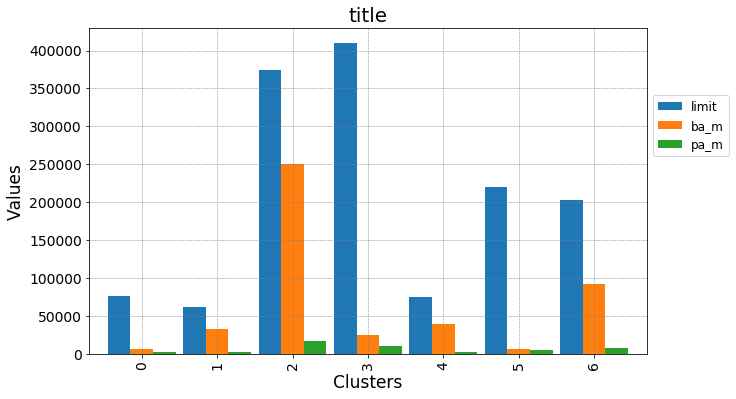

limit,ps-apr,pa_m,ps_mode


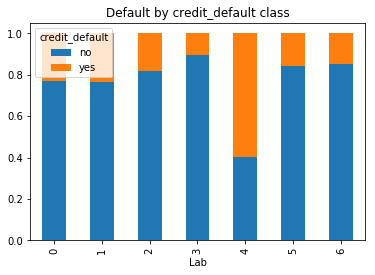

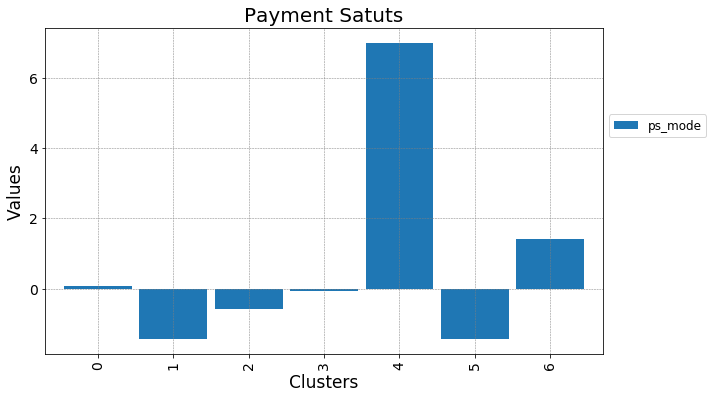

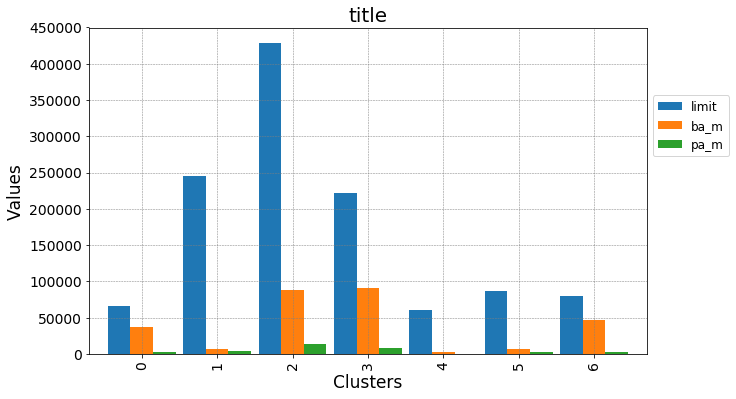

limit,ba-sep,pa_m,ps_mode


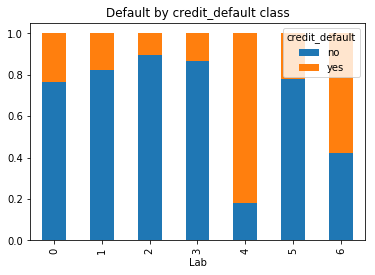

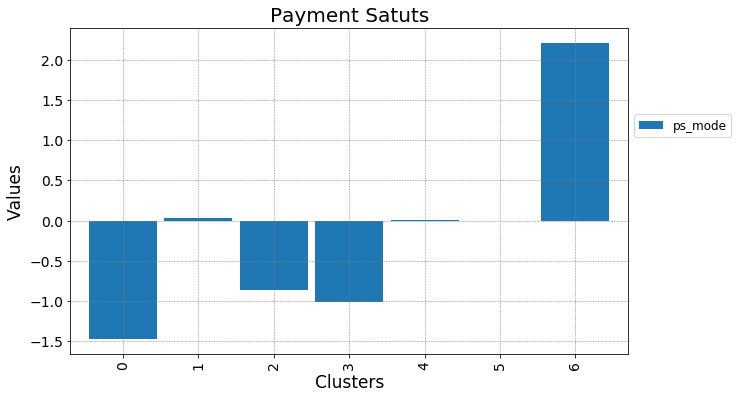

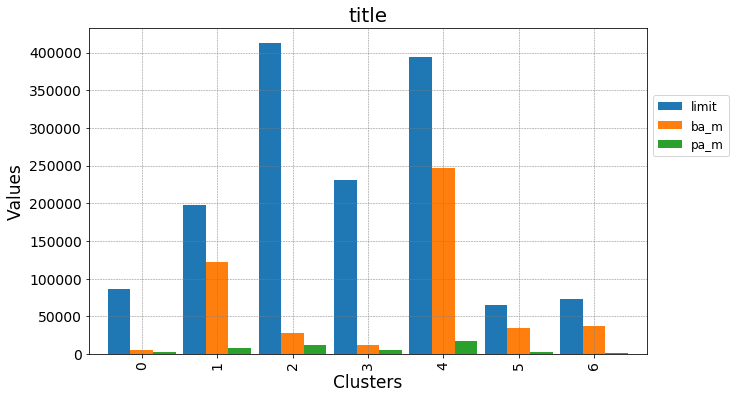

limit,ba_m,pa_m,ps_mode


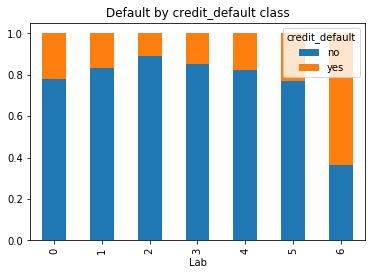

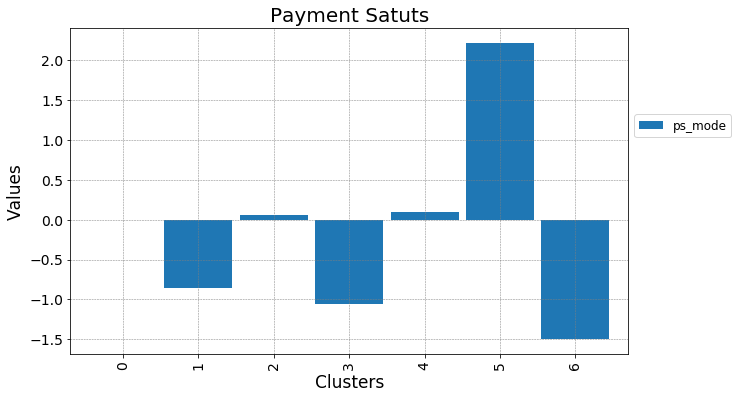

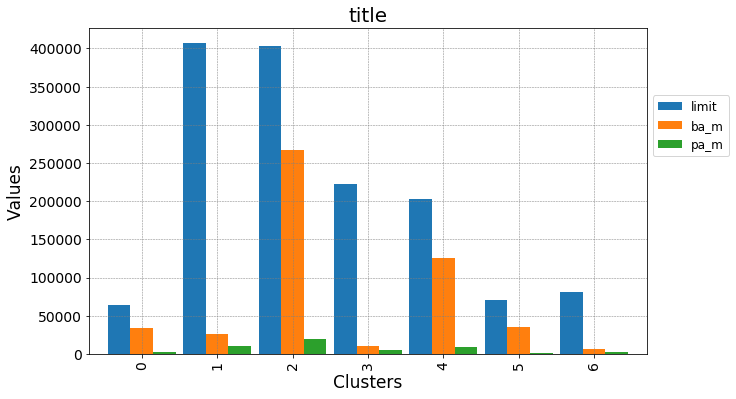

ps-sep,ps-apr,ba-sep,pa_m


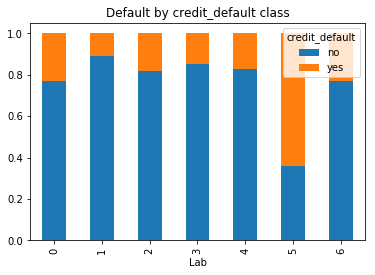

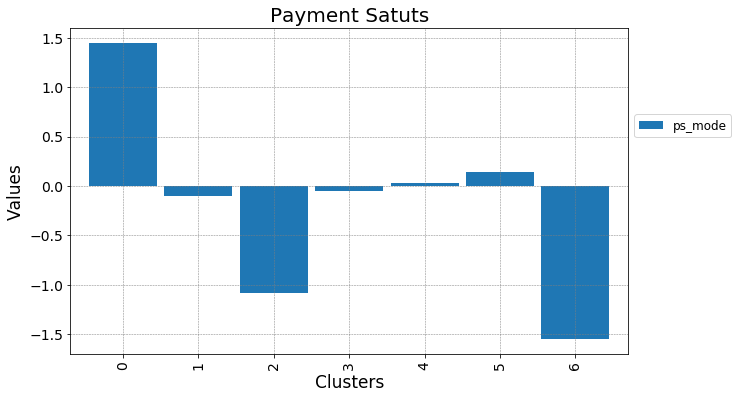

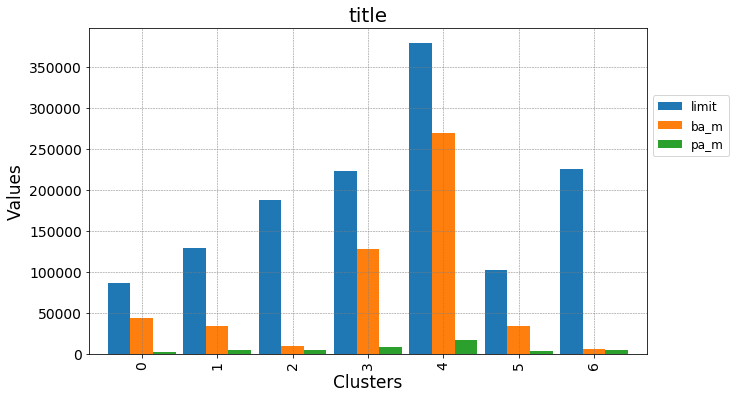

ps-sep,ps-apr,ba-sep,ps_mode


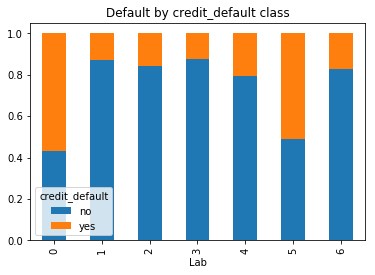

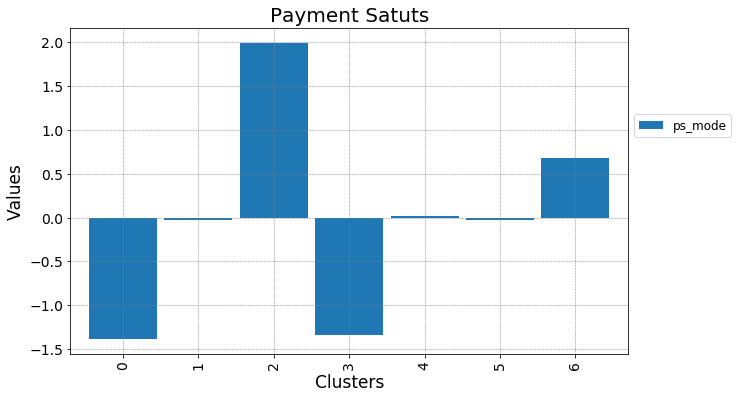

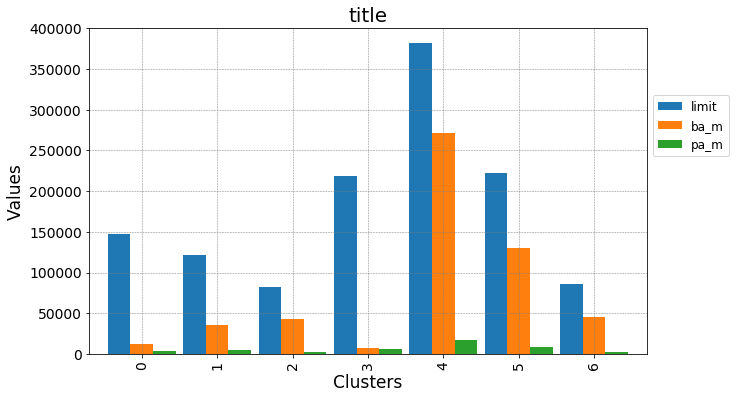

ps-sep,ps-apr,ba_m,pa_m


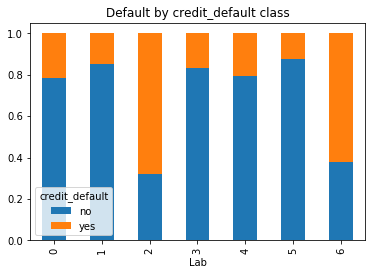

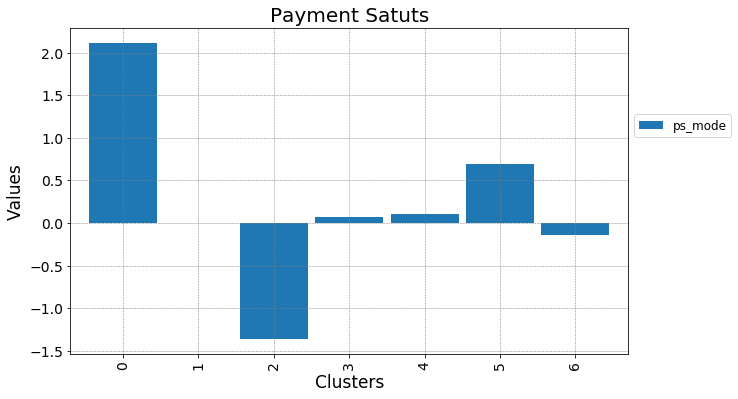

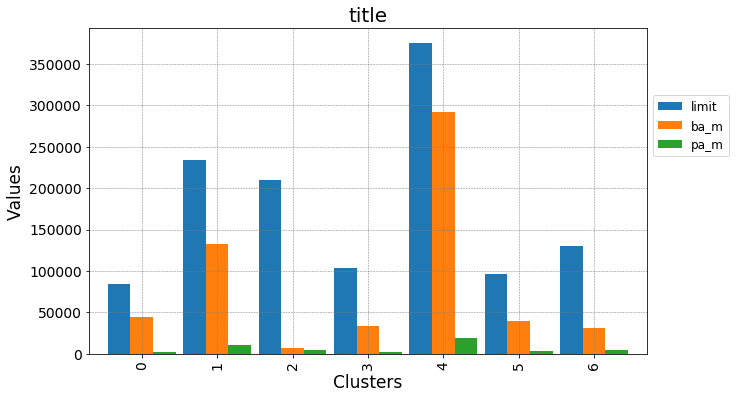

ps-sep,ps-apr,ba_m,ps_mode


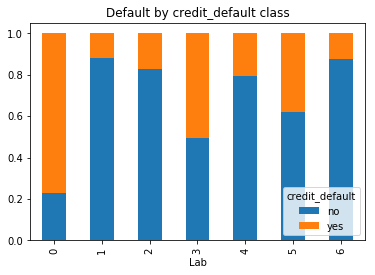

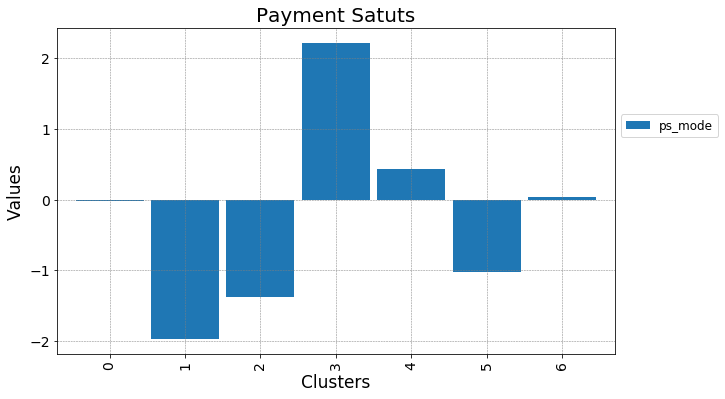

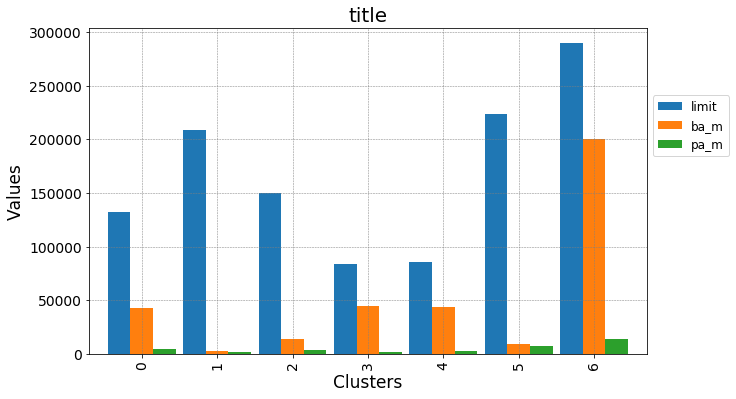

ps-sep,ps-apr,pa_m,ps_mode


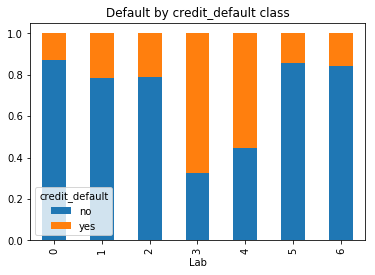

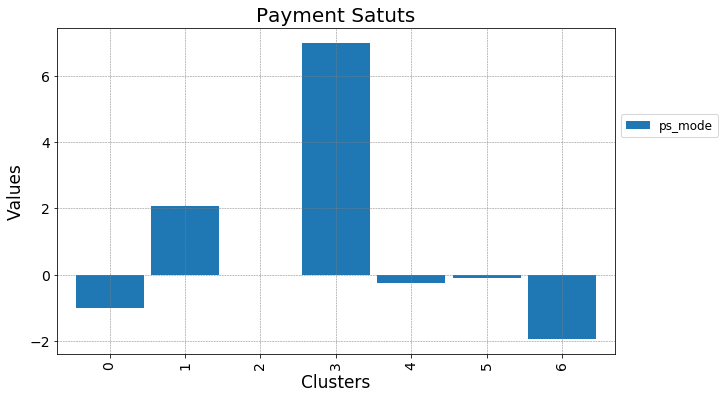

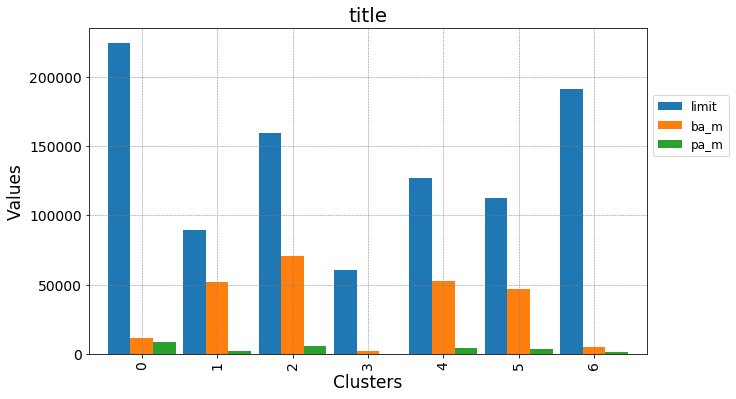

ps-sep,ba-sep,pa_m,ps_mode


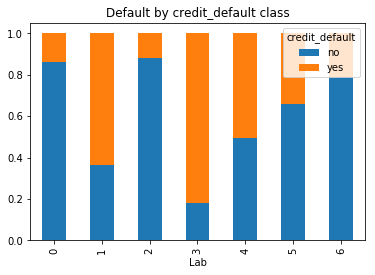

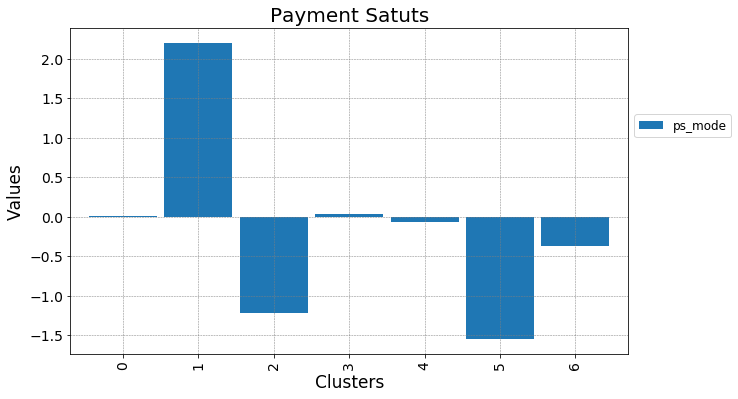

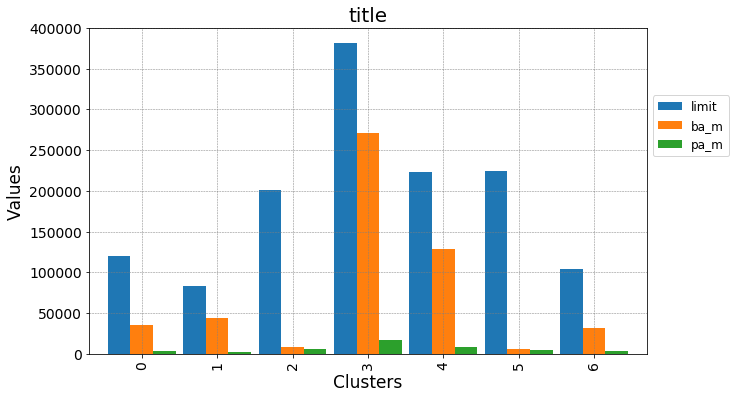

ps-sep,ba_m,pa_m,ps_mode


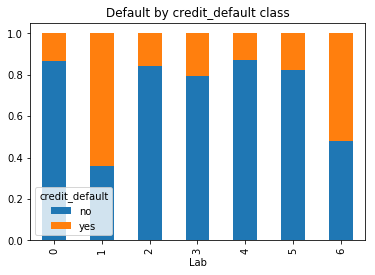

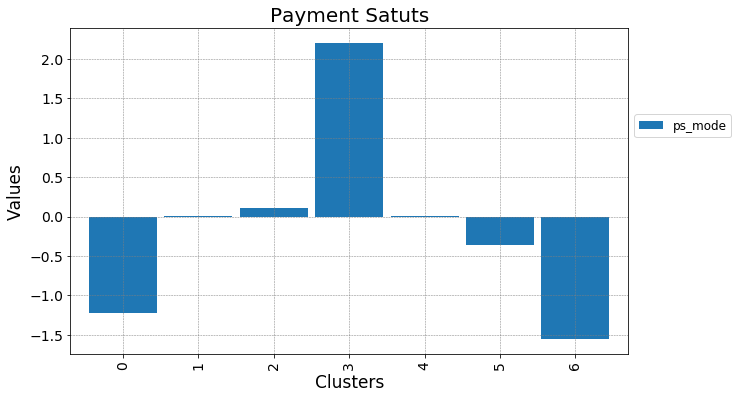

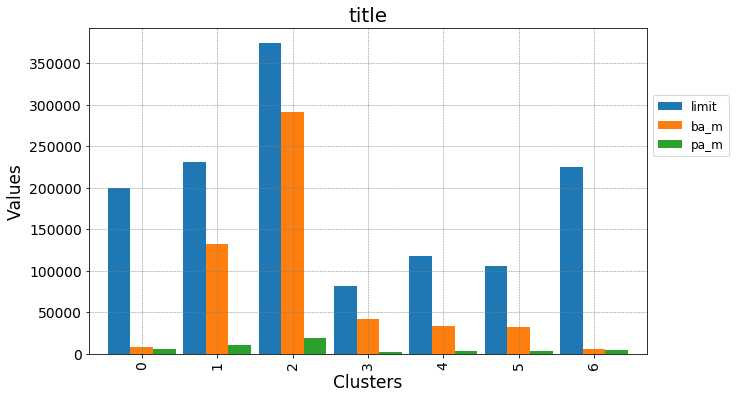

ps-apr,ba-sep,pa_m,ps_mode


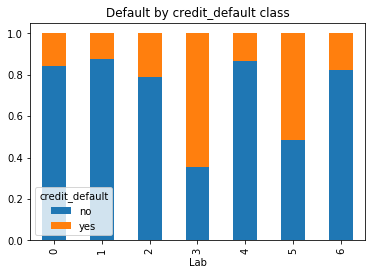

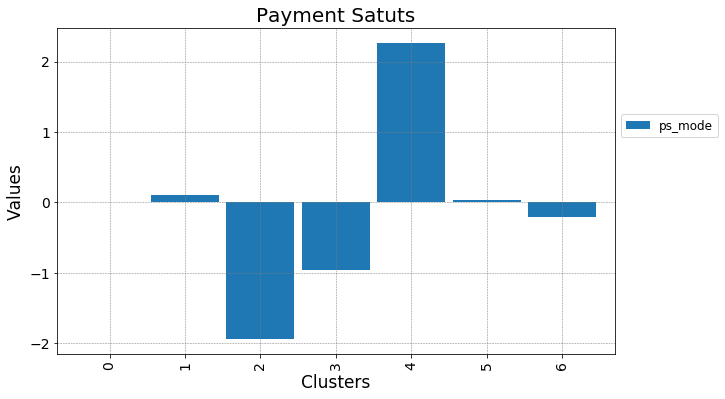

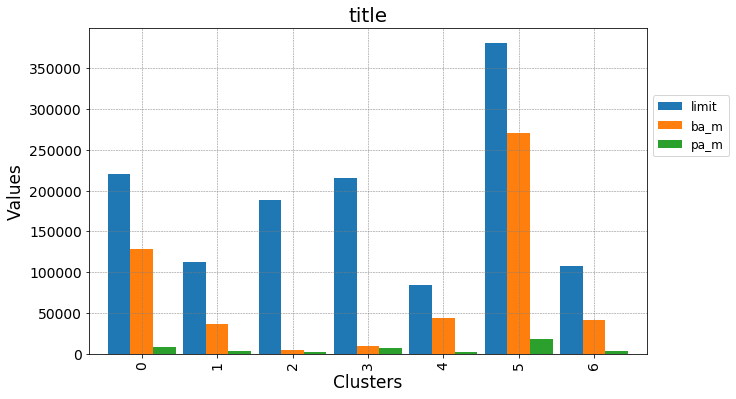

ps-apr,ba_m,pa_m,ps_mode


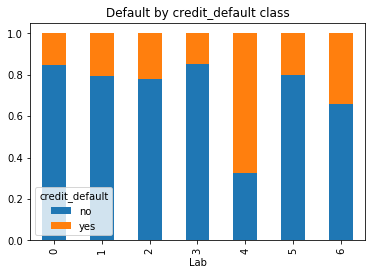

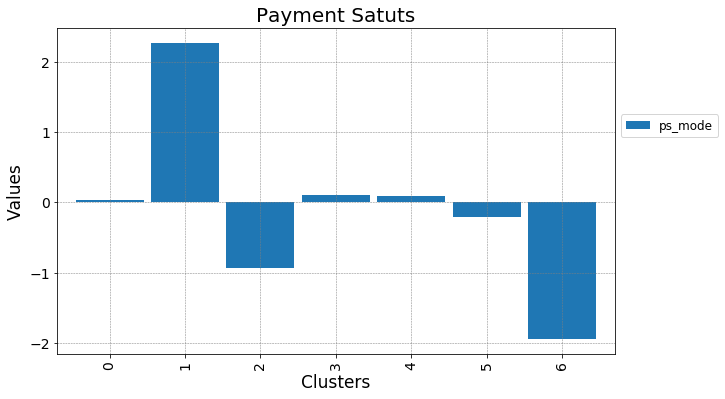

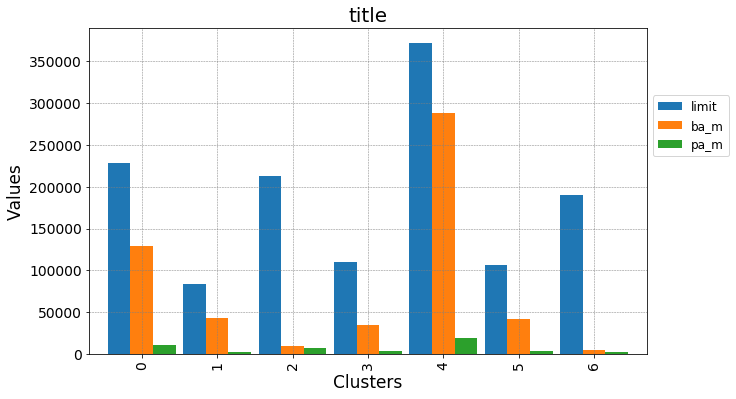

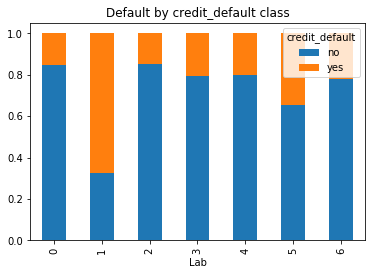

In [24]:
k=5
for c in dictio:
    print(c)
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')


limit,ps-sep,ps-apr,ba-sep


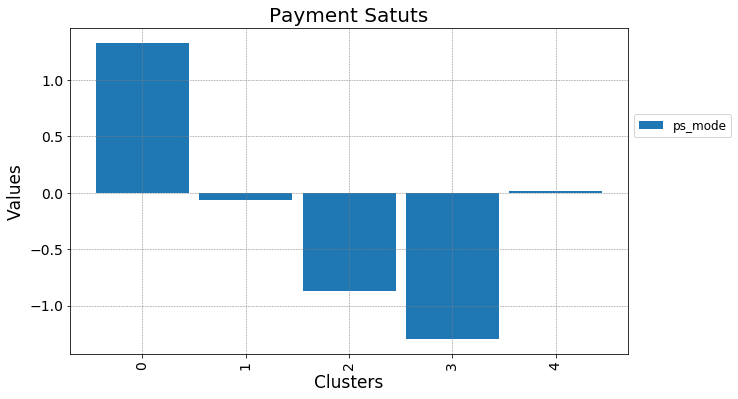

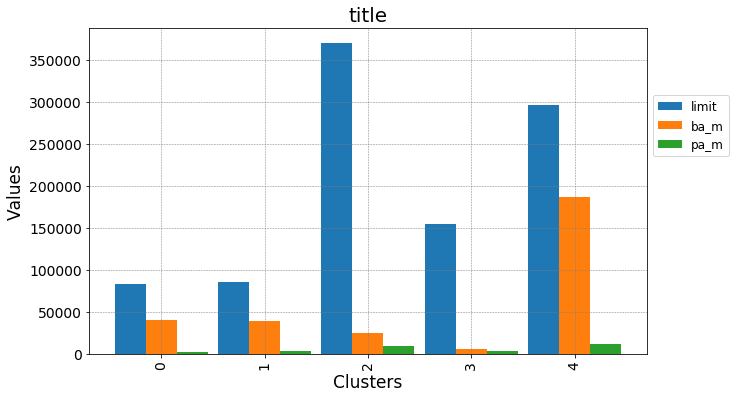

limit,ps-sep,ps-apr,ba_m


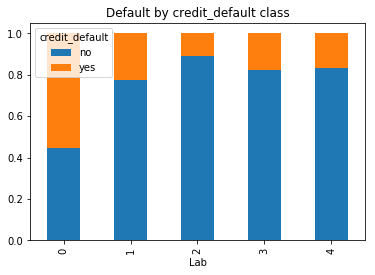

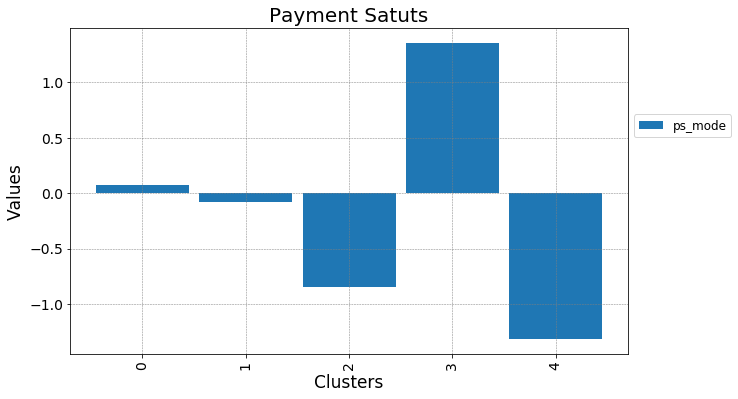

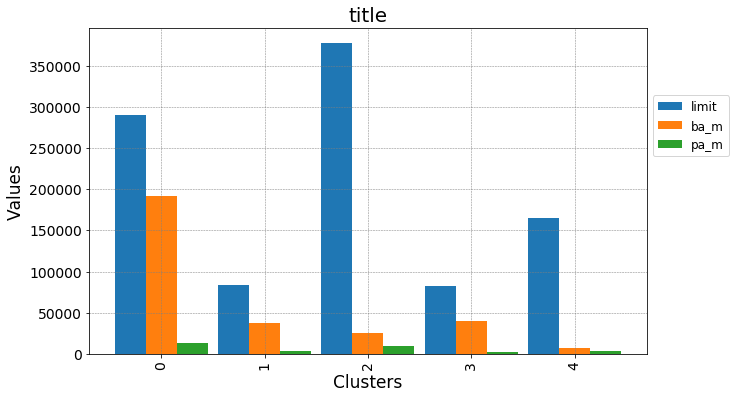

limit,ps-sep,ps-apr,pa_m


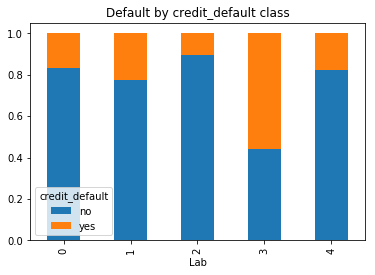

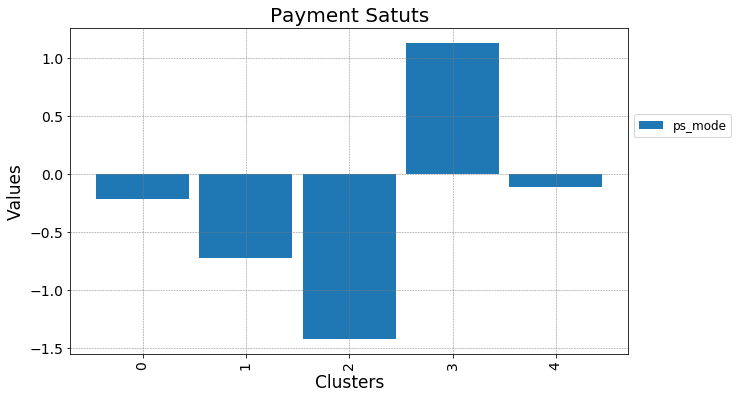

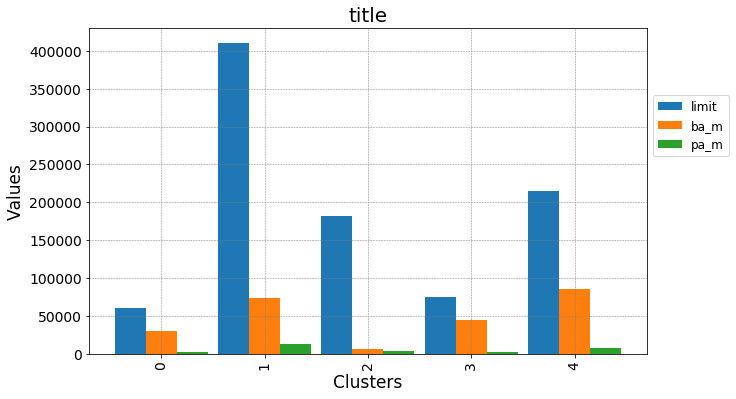

limit,ps-sep,ps-apr,ps_mode


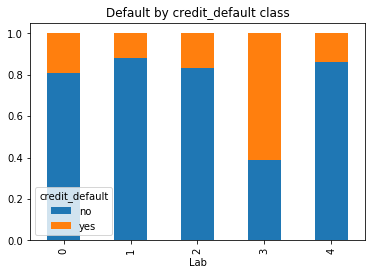

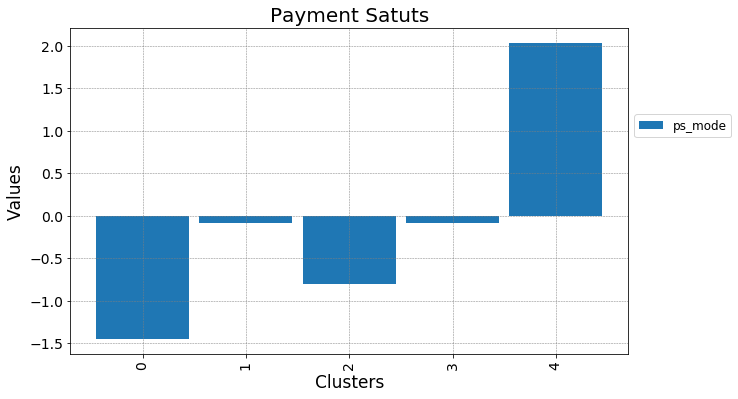

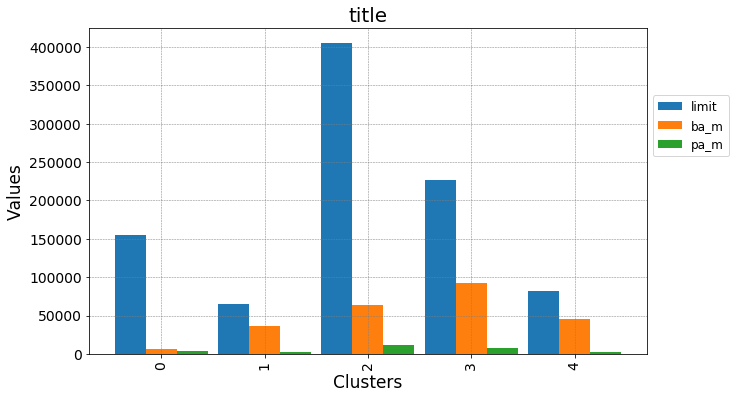

limit,ps-sep,ba-sep,pa_m


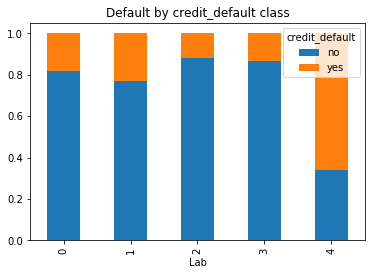

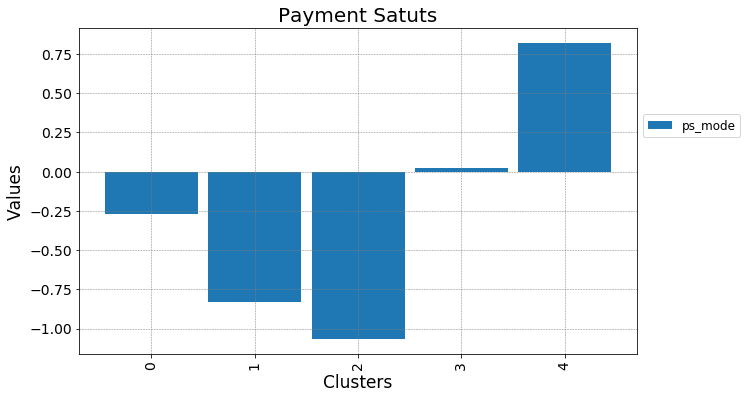

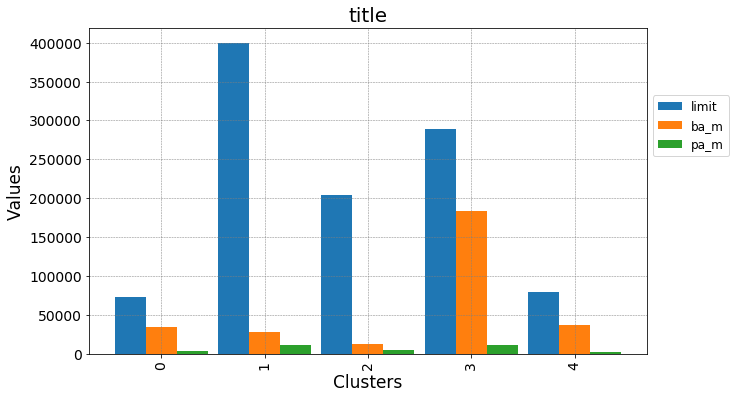

limit,ps-sep,ba-sep,ps_mode


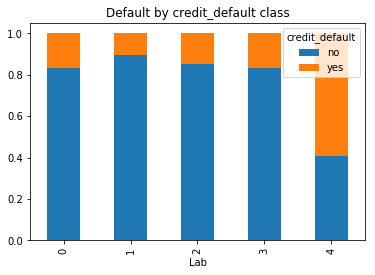

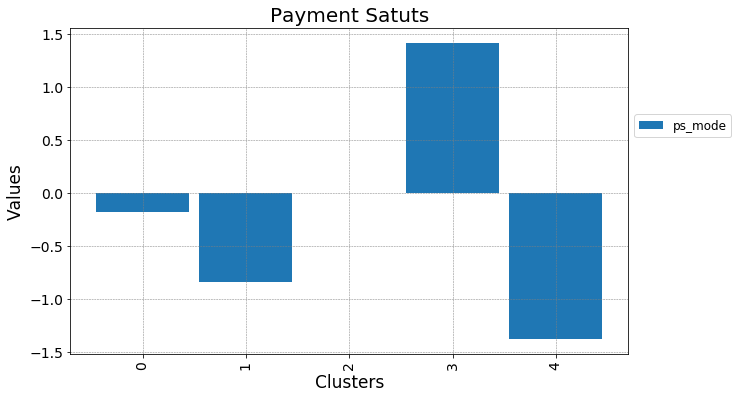

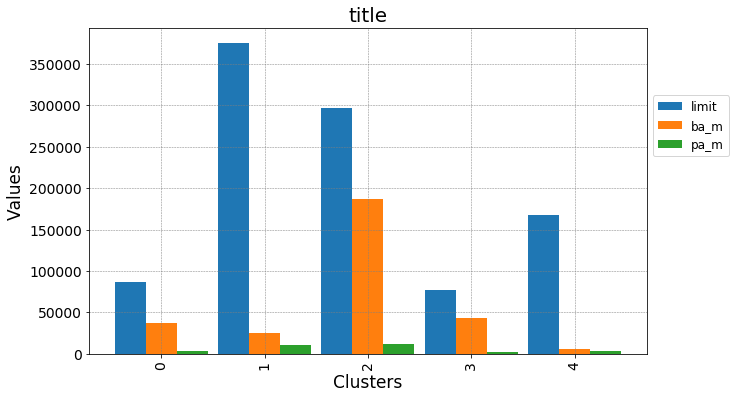

limit,ps-sep,ba_m,pa_m


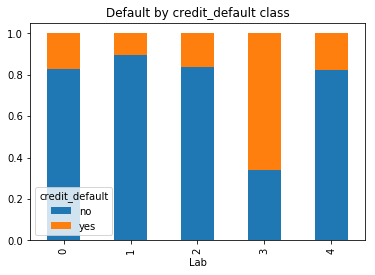

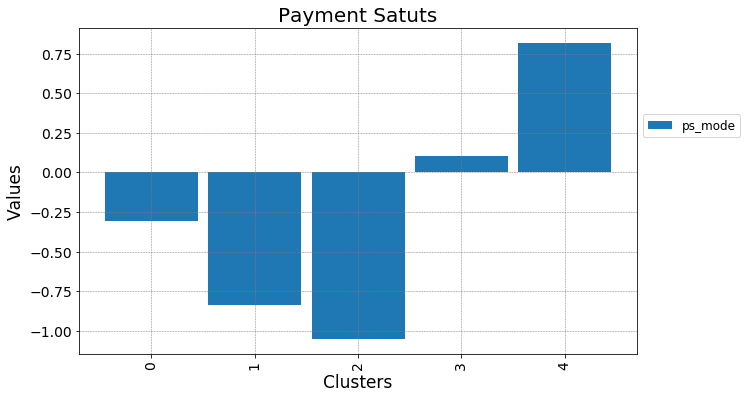

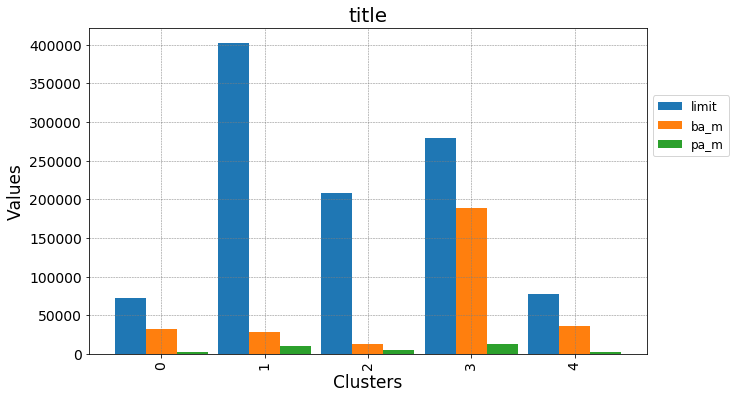

limit,ps-sep,ba_m,ps_mode


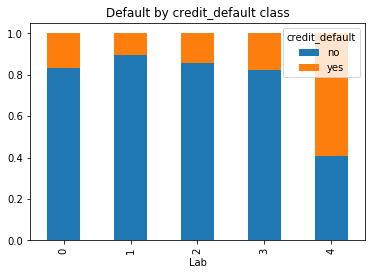

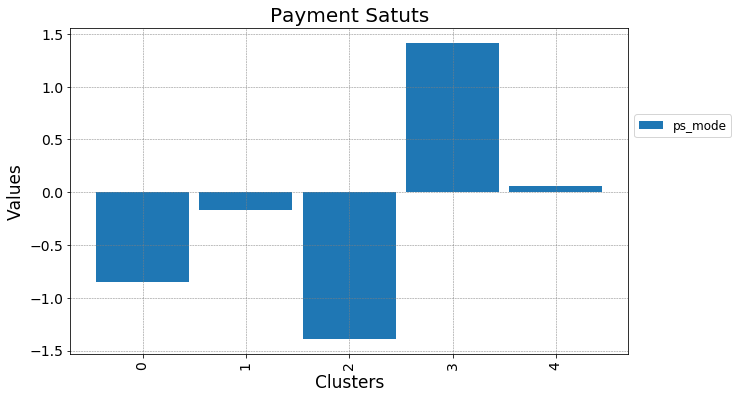

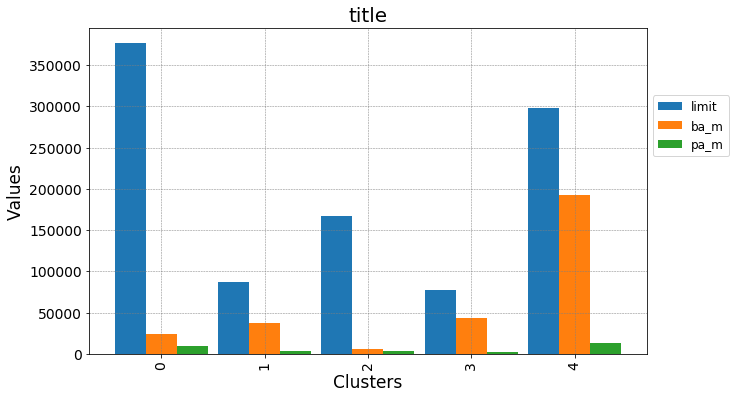

limit,ps-sep,pa_m,ps_mode


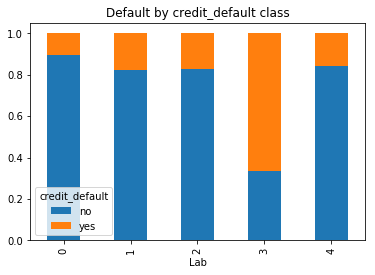

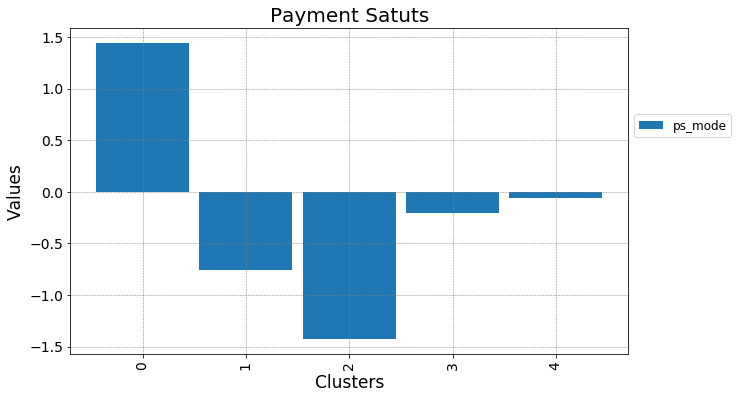

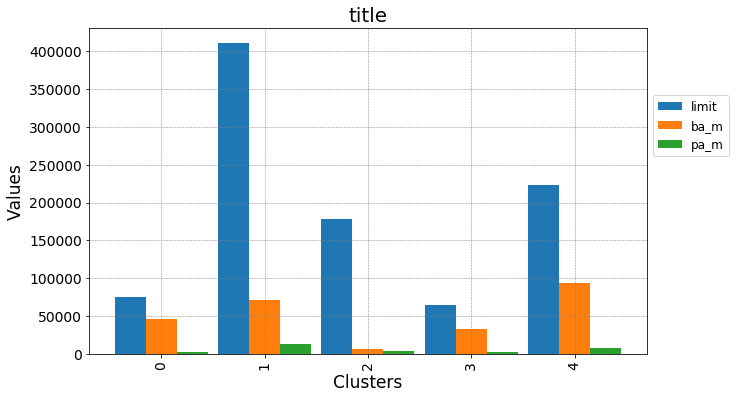

limit,ps-apr,ba-sep,pa_m


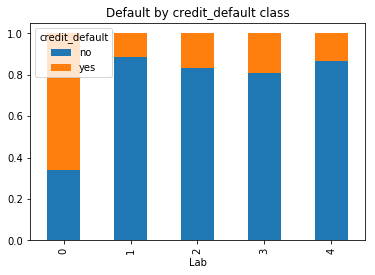

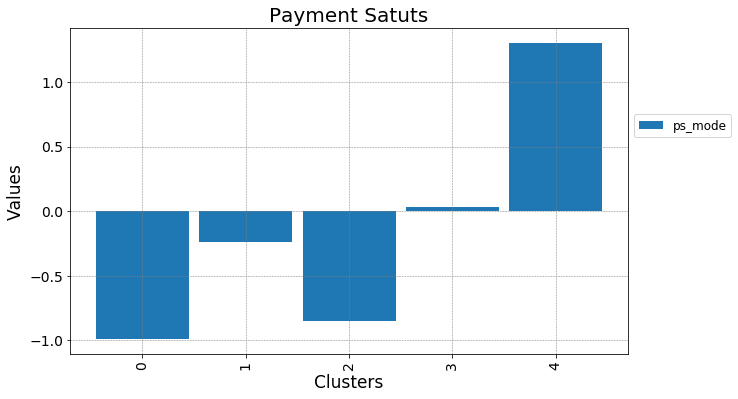

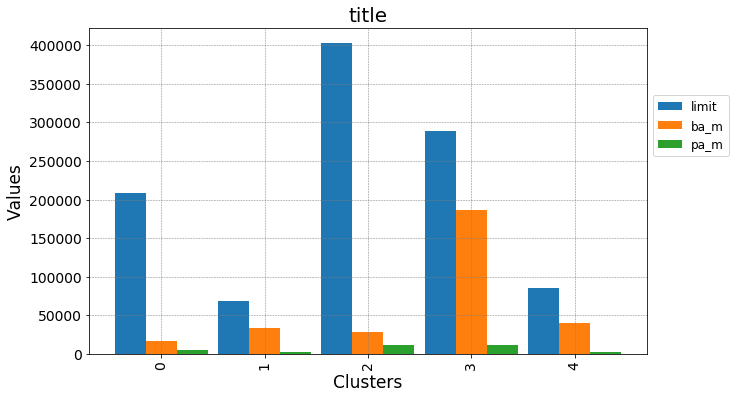

limit,ps-apr,ba-sep,ps_mode


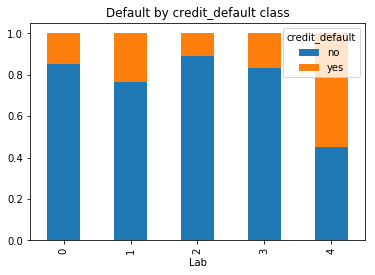

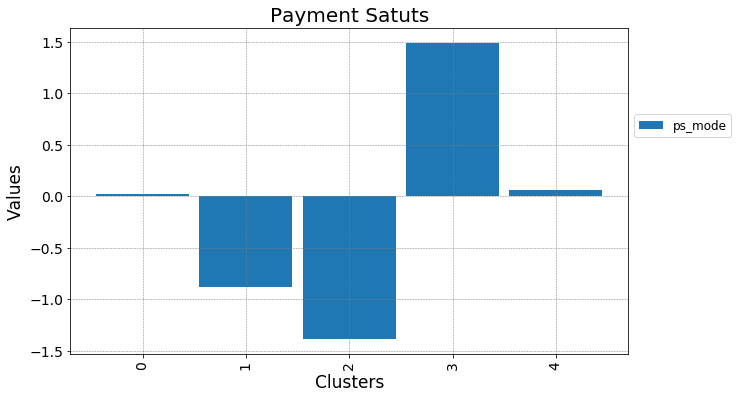

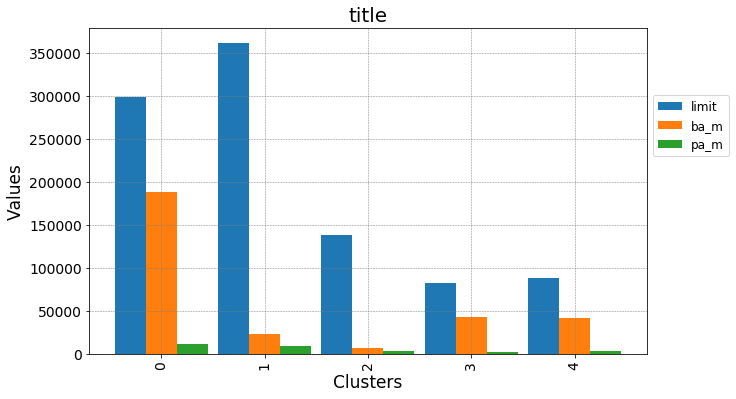

limit,ps-apr,ba_m,pa_m


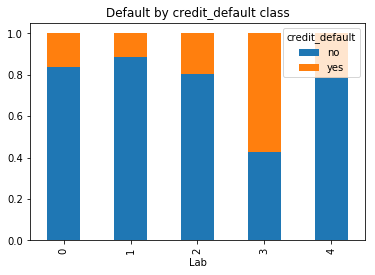

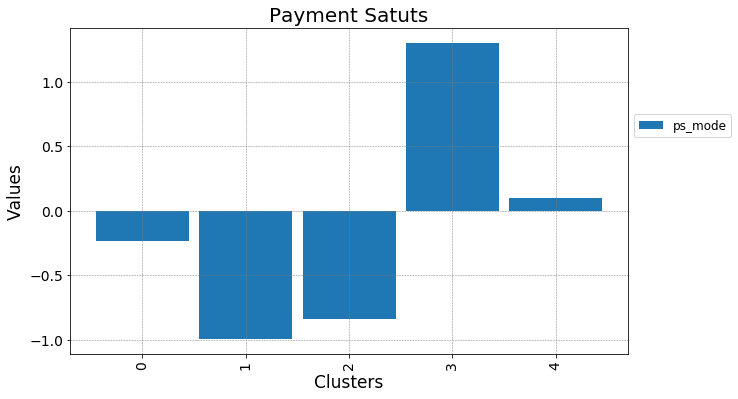

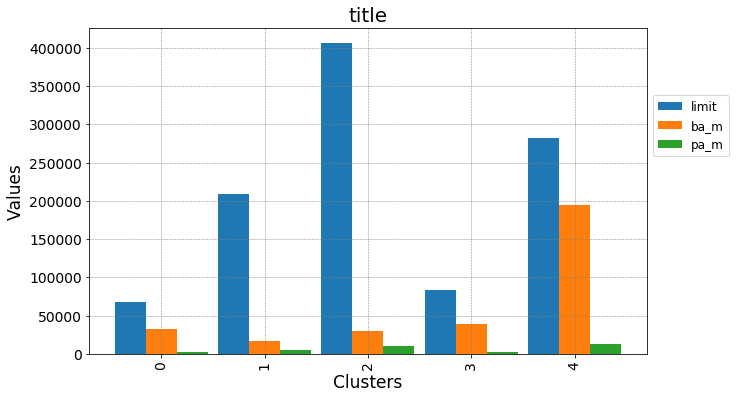

limit,ps-apr,ba_m,ps_mode


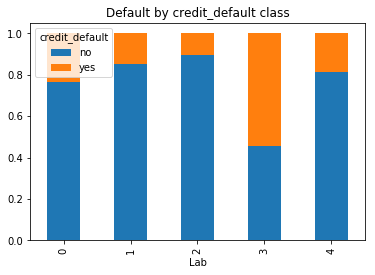

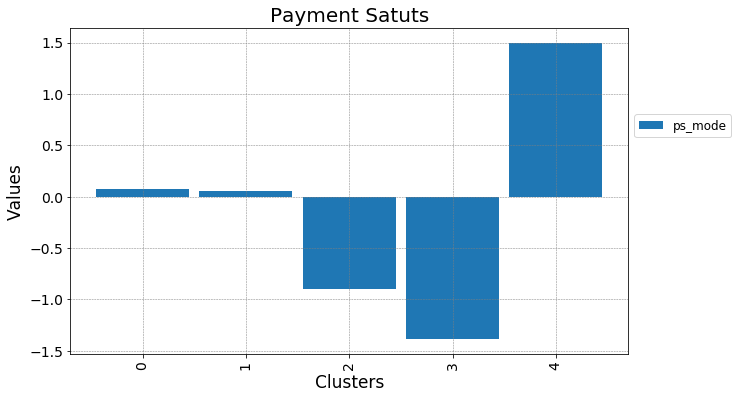

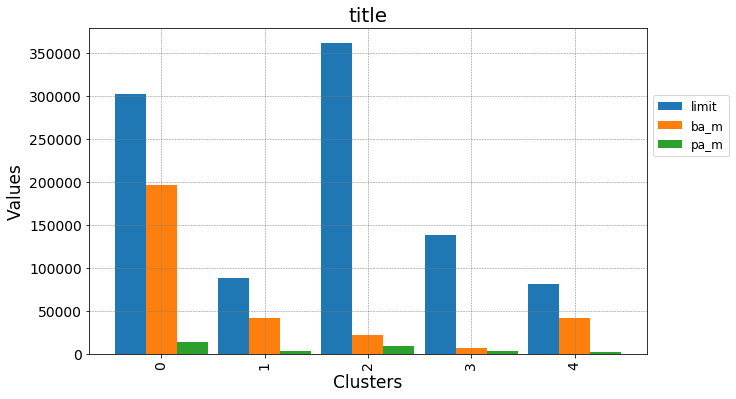

limit,ps-apr,pa_m,ps_mode


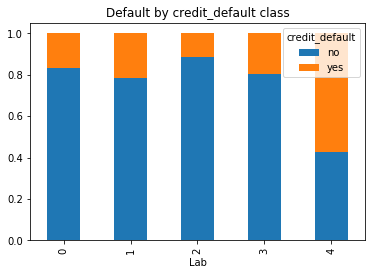

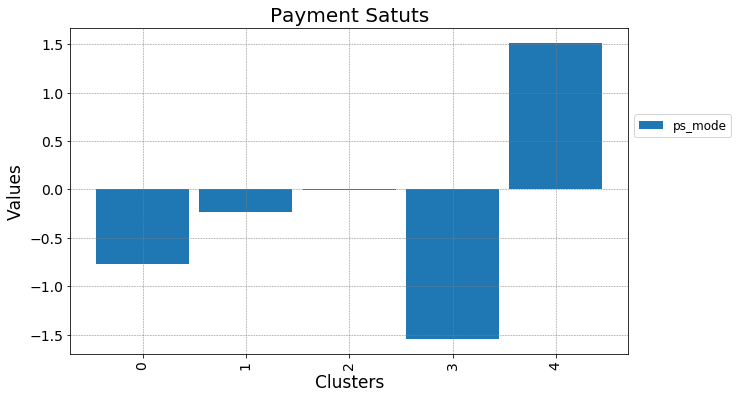

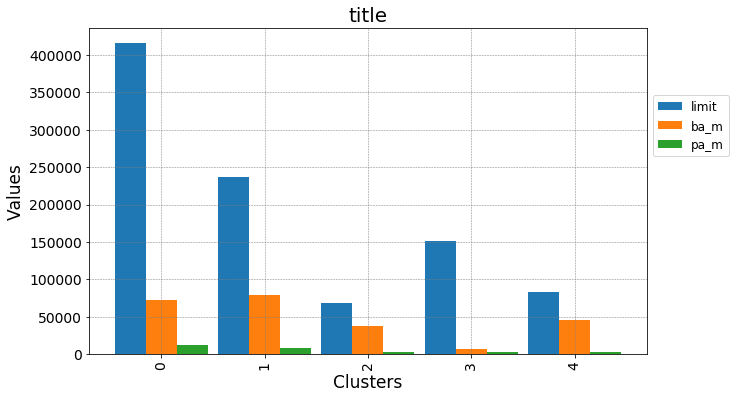

limit,ba-sep,pa_m,ps_mode


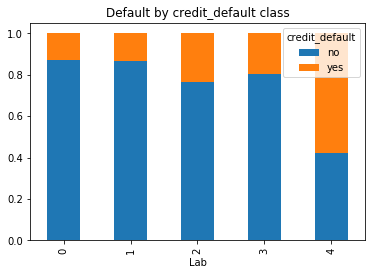

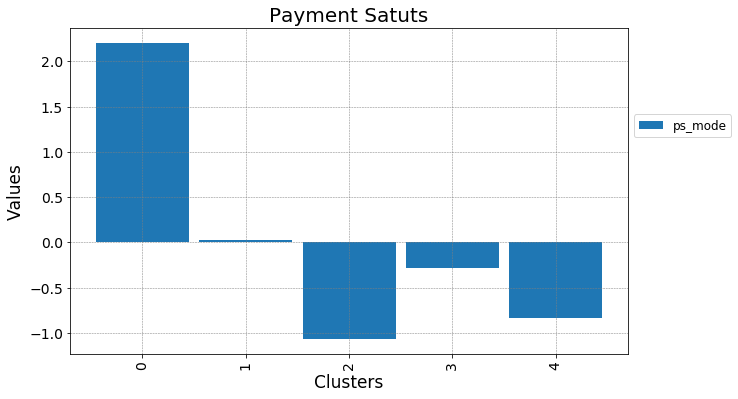

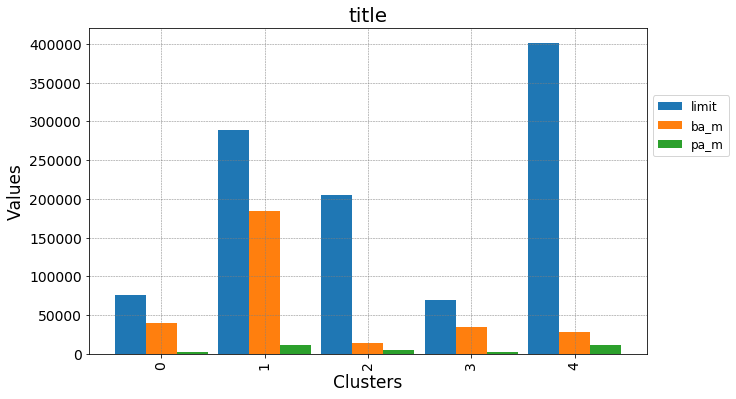

limit,ba_m,pa_m,ps_mode


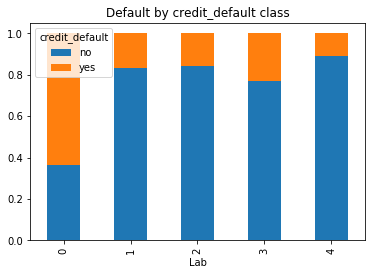

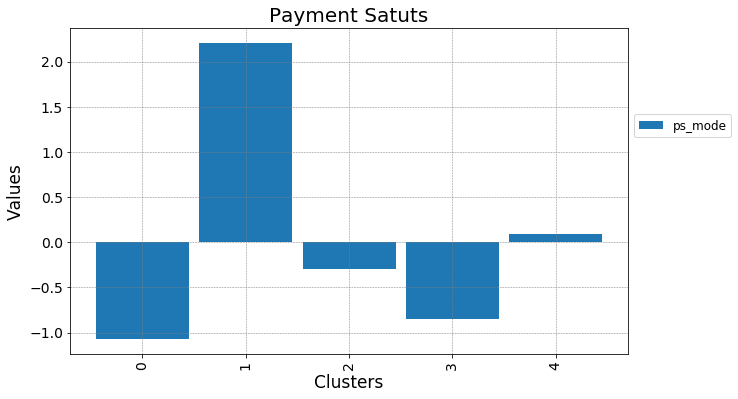

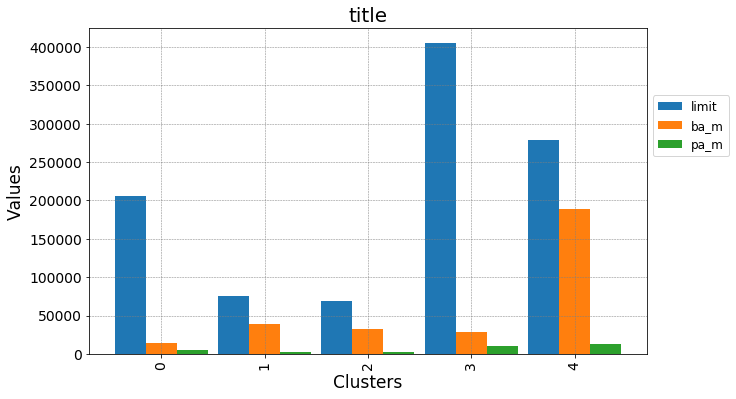

ps-sep,ps-apr,ba-sep,pa_m


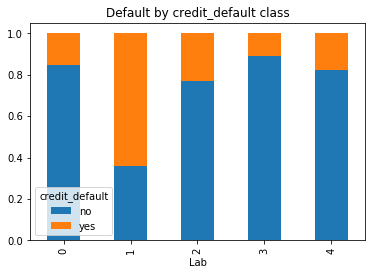

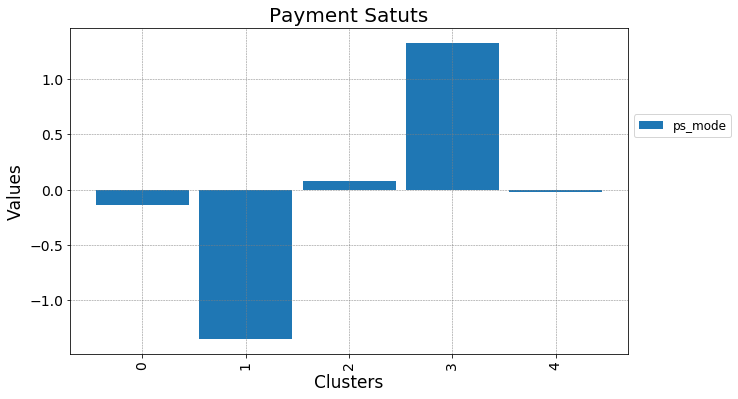

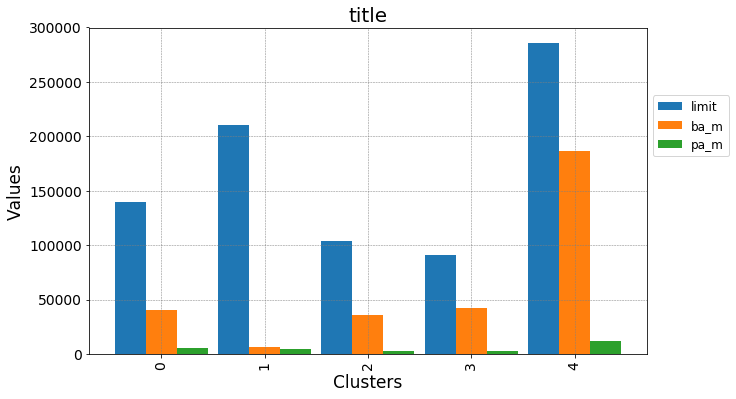

ps-sep,ps-apr,ba-sep,ps_mode


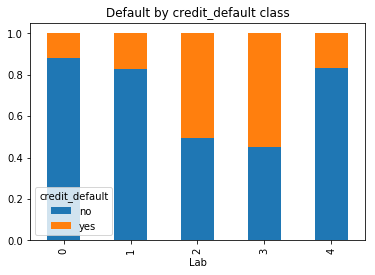

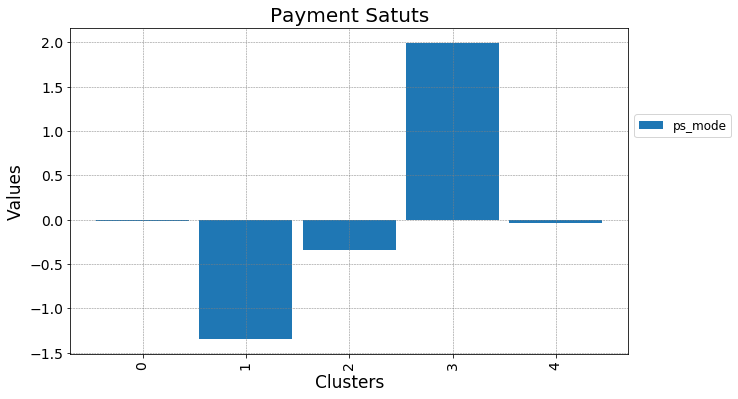

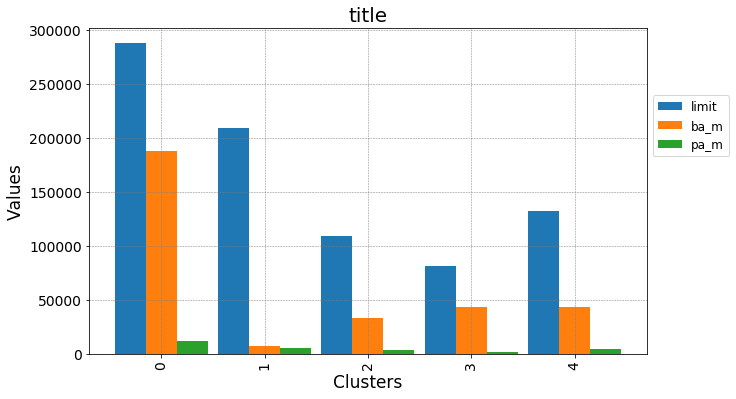

ps-sep,ps-apr,ba_m,pa_m


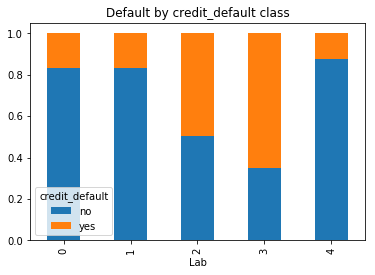

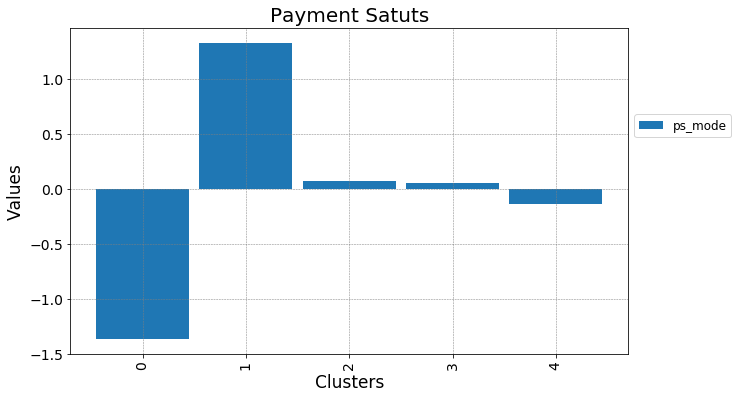

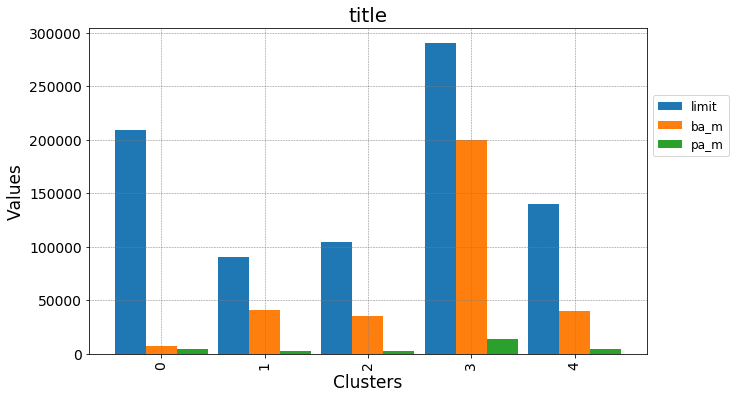

ps-sep,ps-apr,ba_m,ps_mode


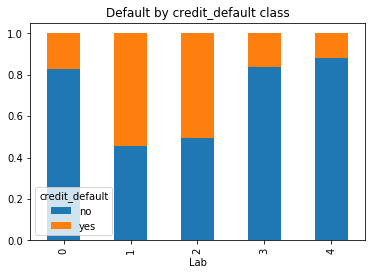

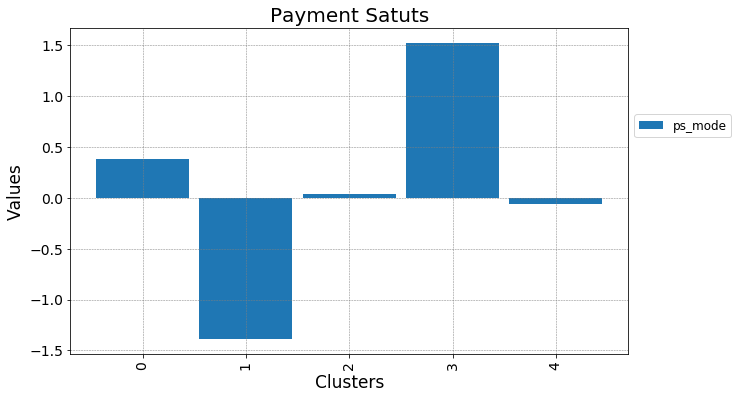

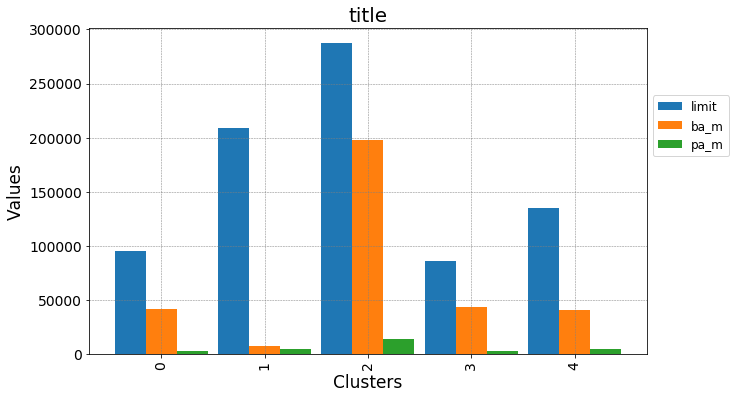

ps-sep,ps-apr,pa_m,ps_mode


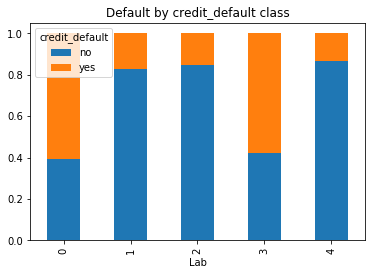

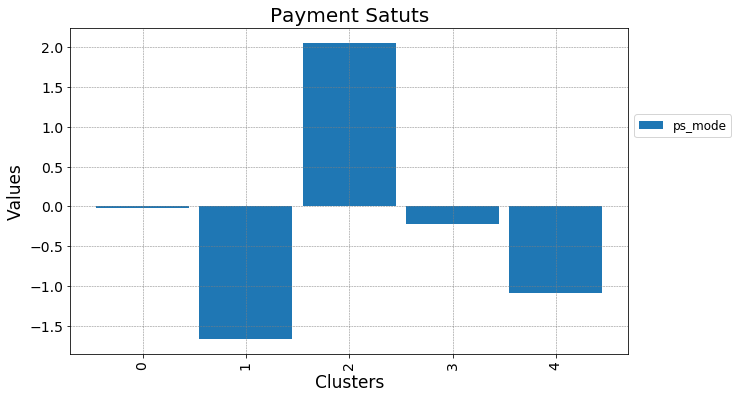

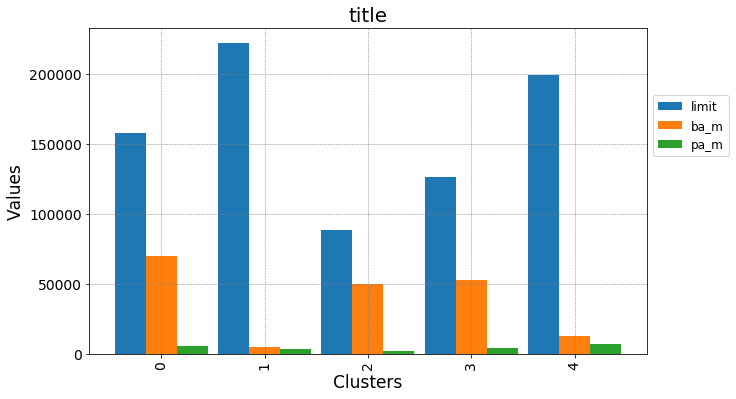

ps-sep,ba-sep,pa_m,ps_mode


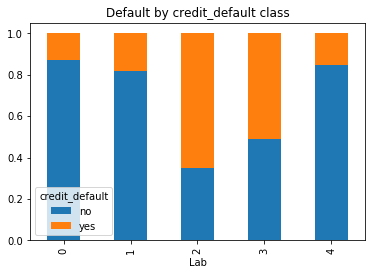

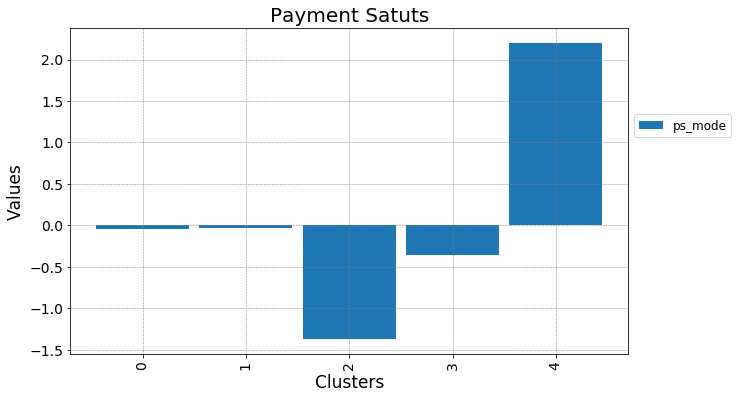

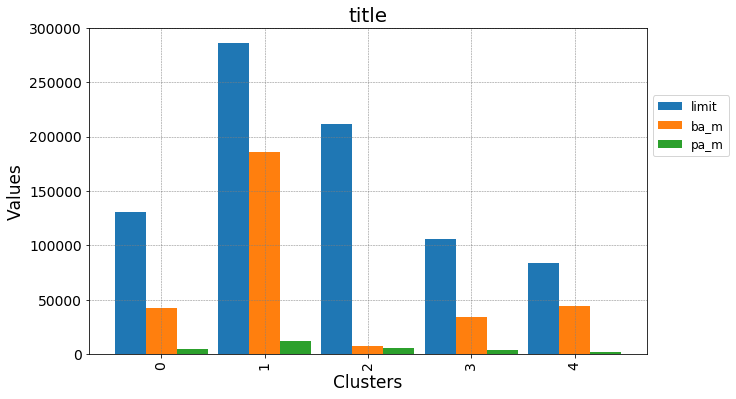

ps-sep,ba_m,pa_m,ps_mode


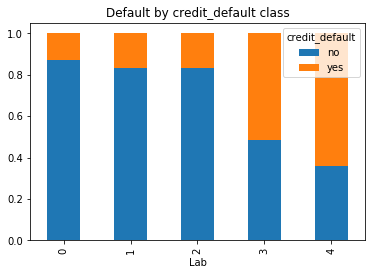

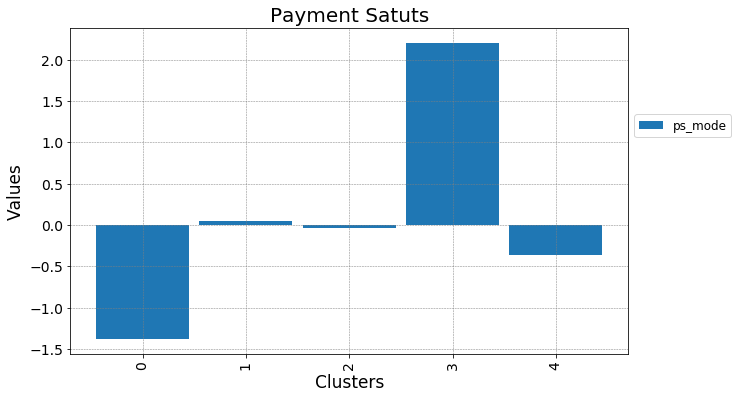

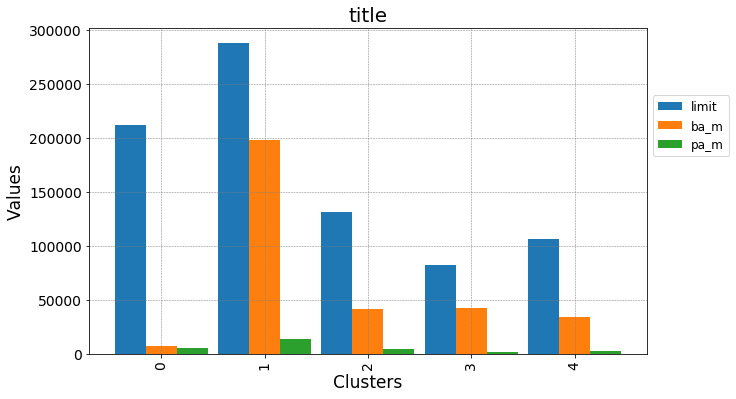

ps-apr,ba-sep,pa_m,ps_mode


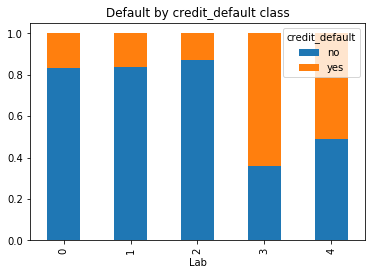

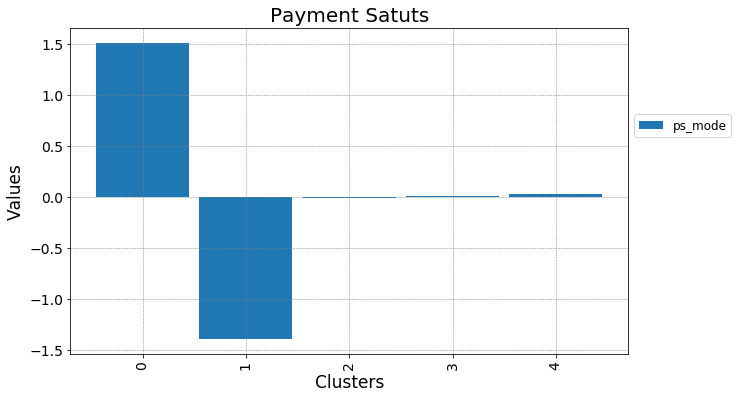

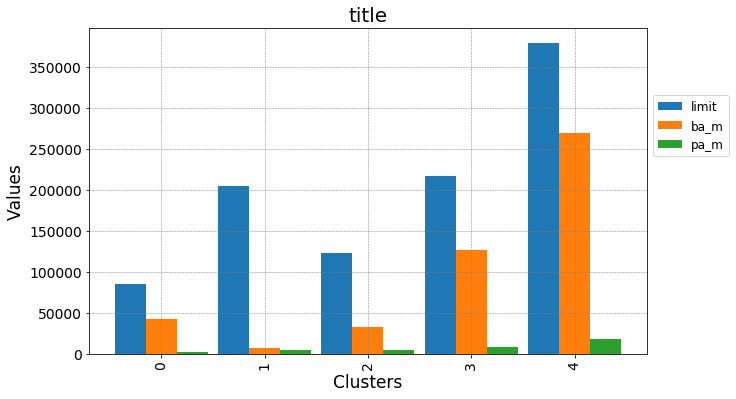

ps-apr,ba_m,pa_m,ps_mode


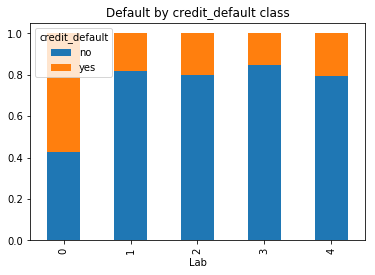

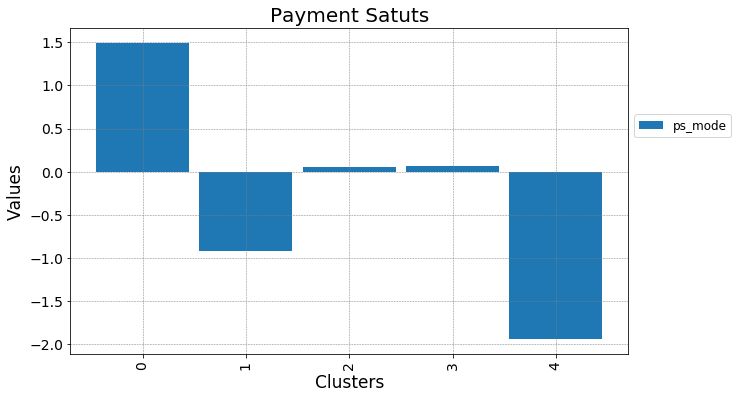

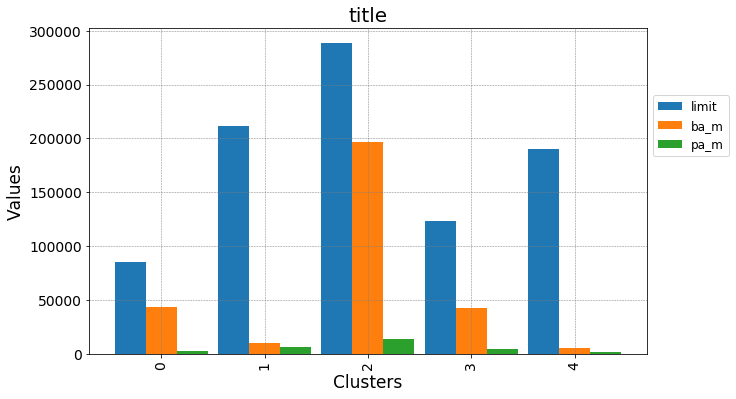

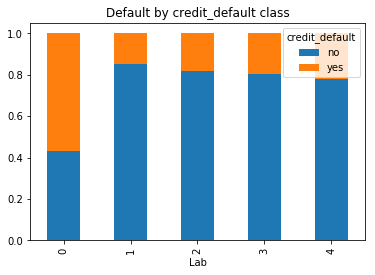

In [25]:
k=3
for c in dictio:
    print(c)
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')


limit,ps-sep,ps-apr,ba-sep


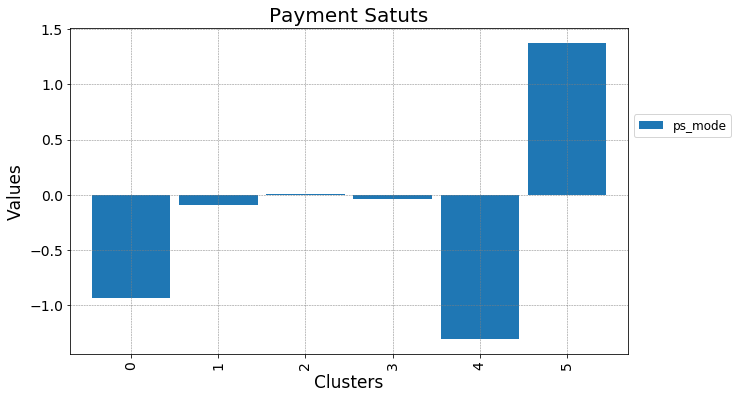

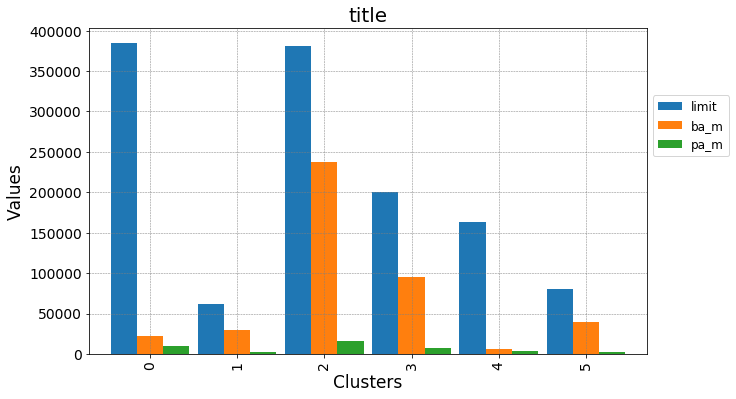

limit,ps-sep,ps-apr,ba_m


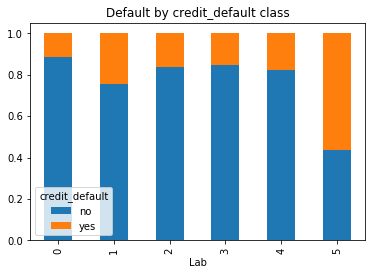

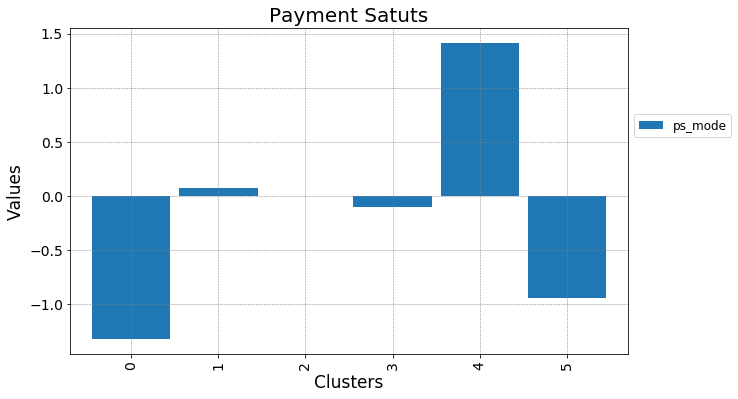

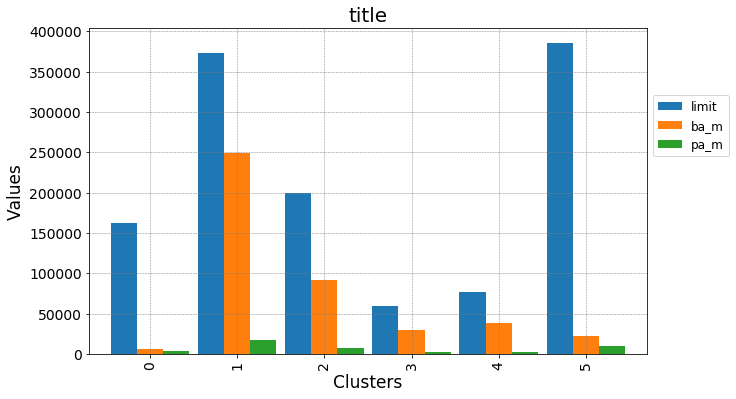

limit,ps-sep,ps-apr,pa_m


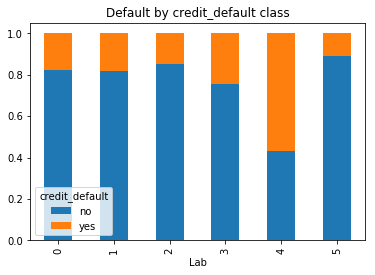

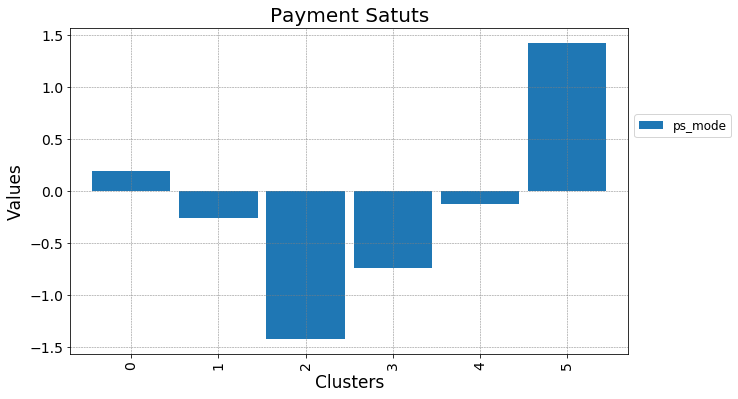

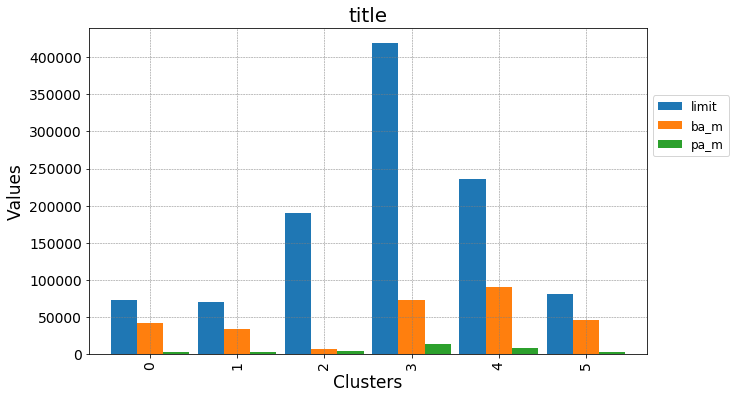

limit,ps-sep,ps-apr,ps_mode


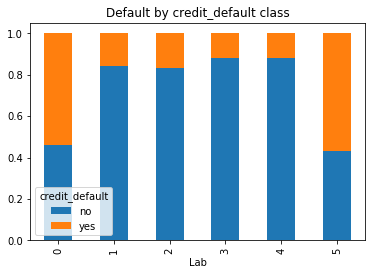

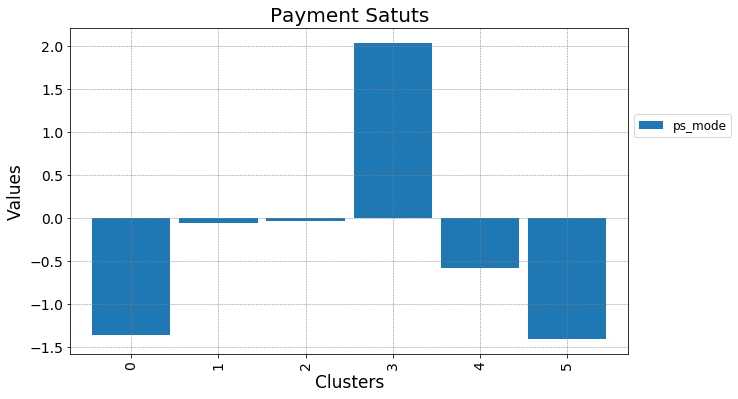

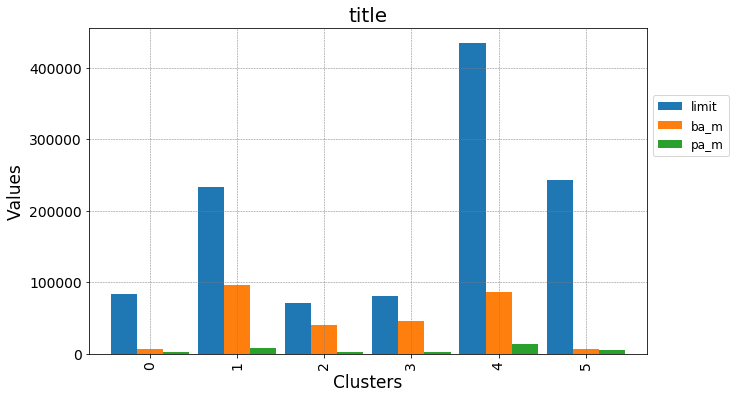

limit,ps-sep,ba-sep,pa_m


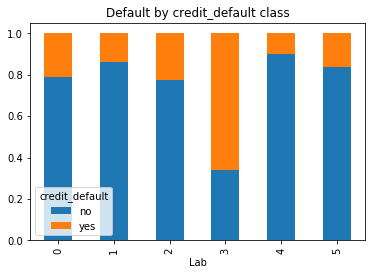

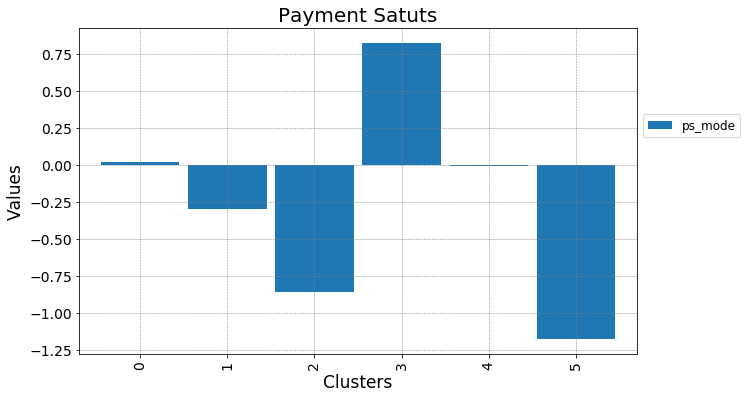

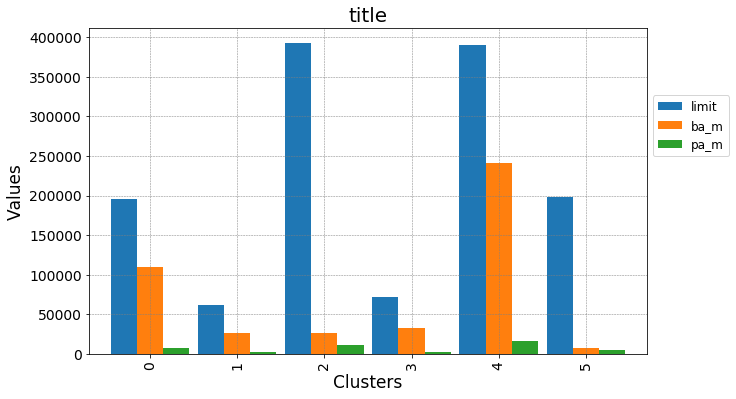

limit,ps-sep,ba-sep,ps_mode


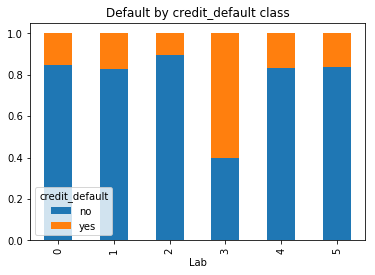

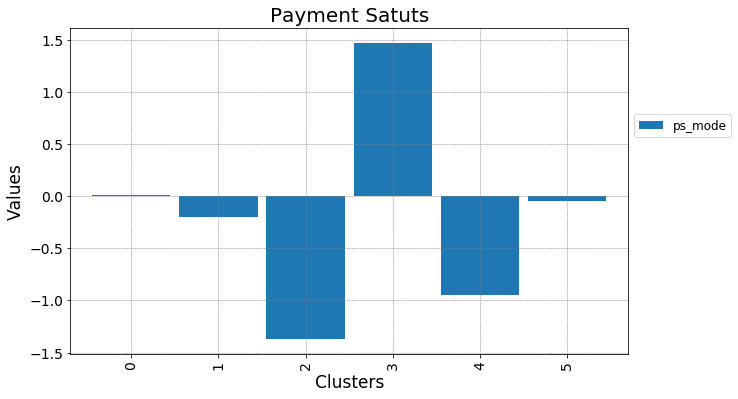

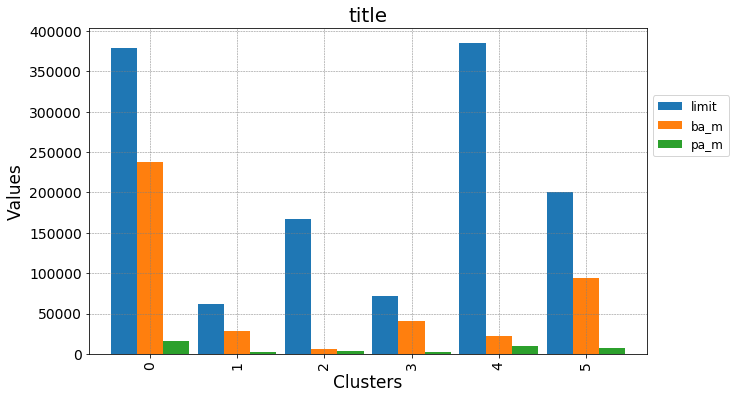

limit,ps-sep,ba_m,pa_m


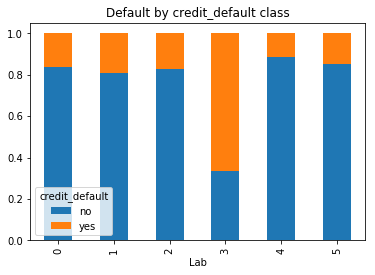

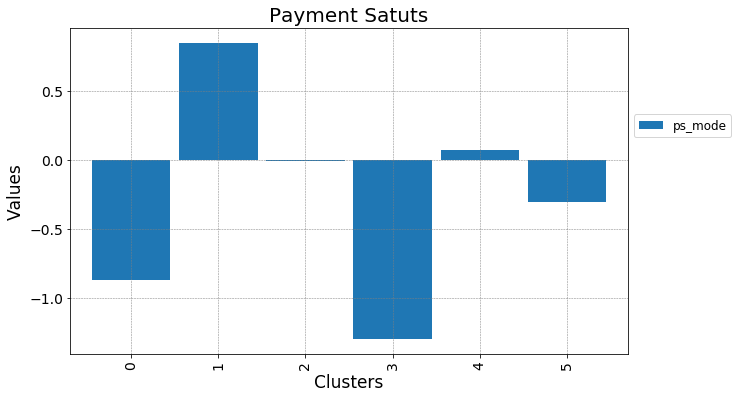

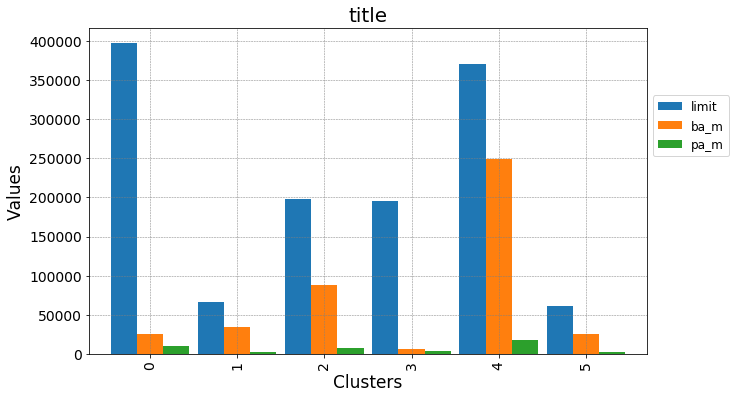

limit,ps-sep,ba_m,ps_mode


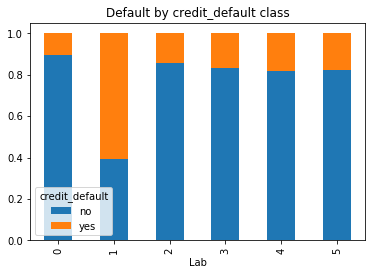

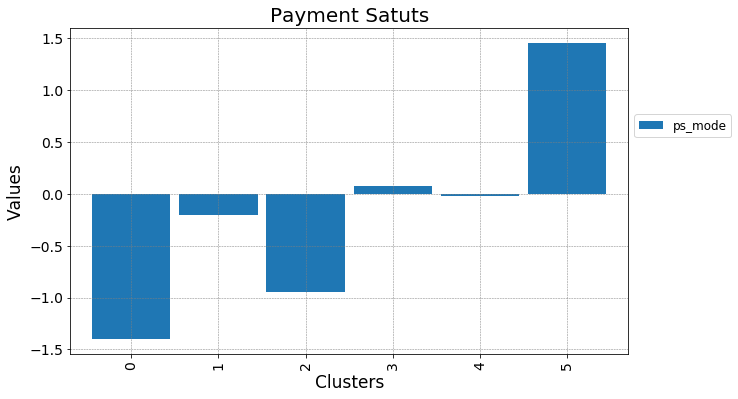

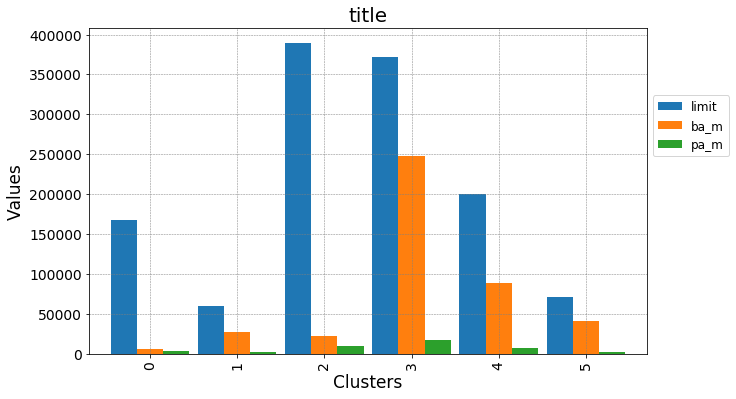

limit,ps-sep,pa_m,ps_mode


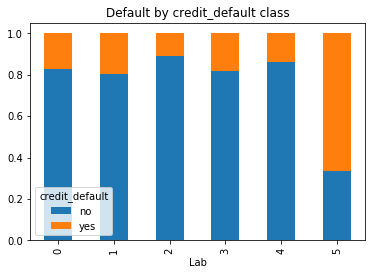

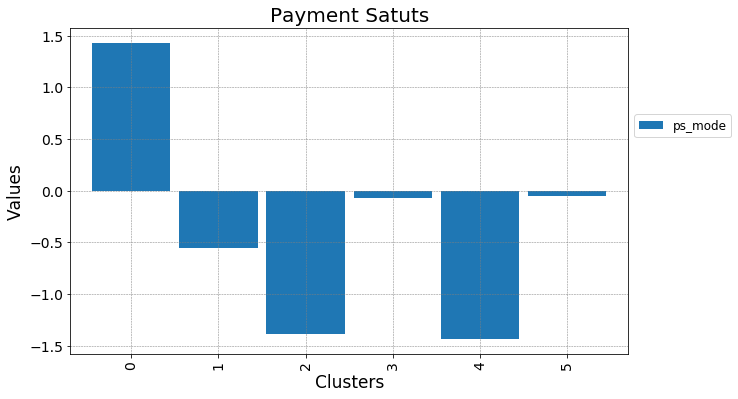

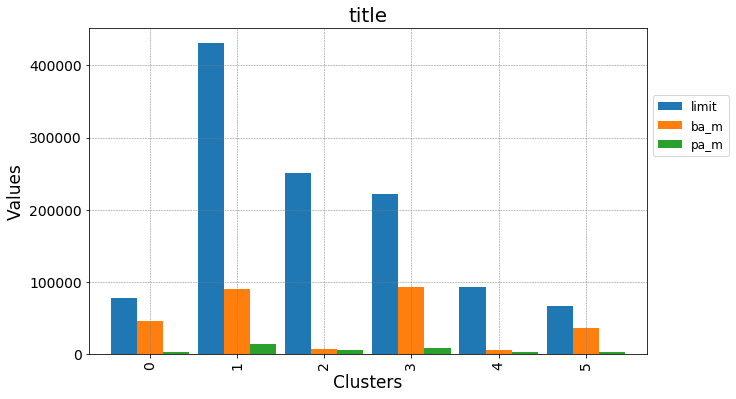

limit,ps-apr,ba-sep,pa_m


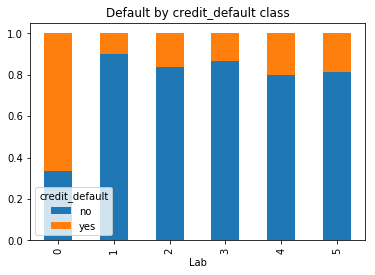

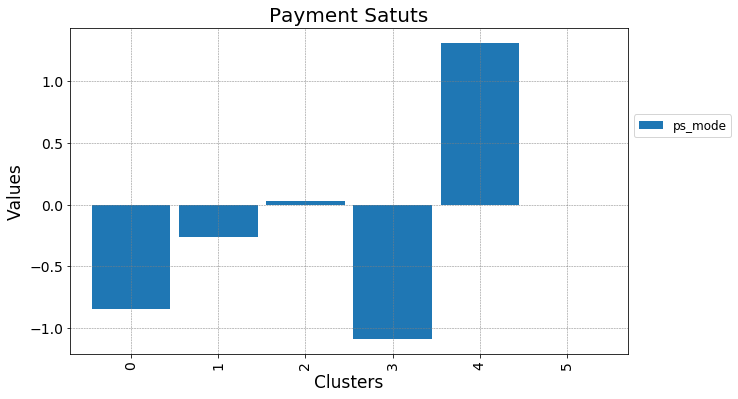

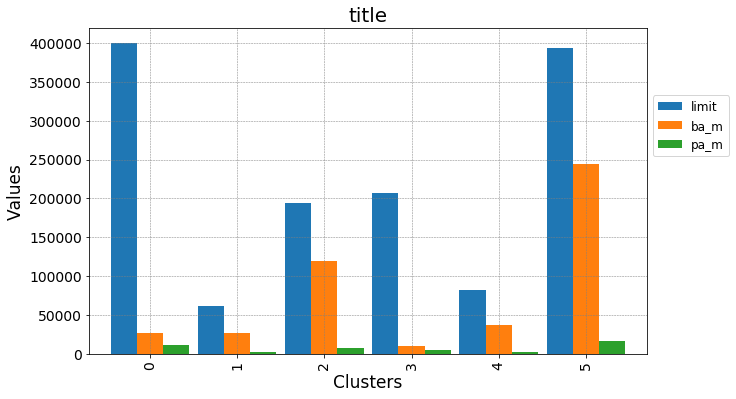

limit,ps-apr,ba-sep,ps_mode


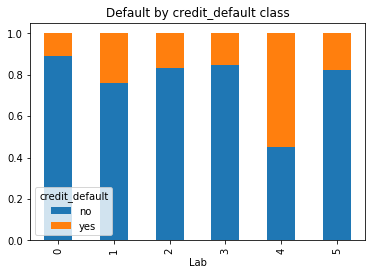

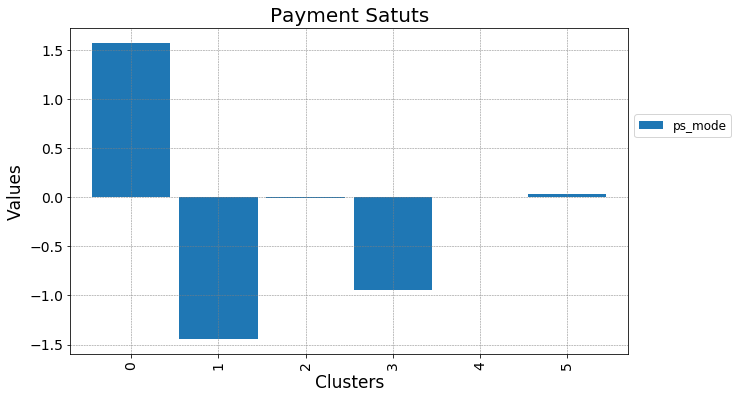

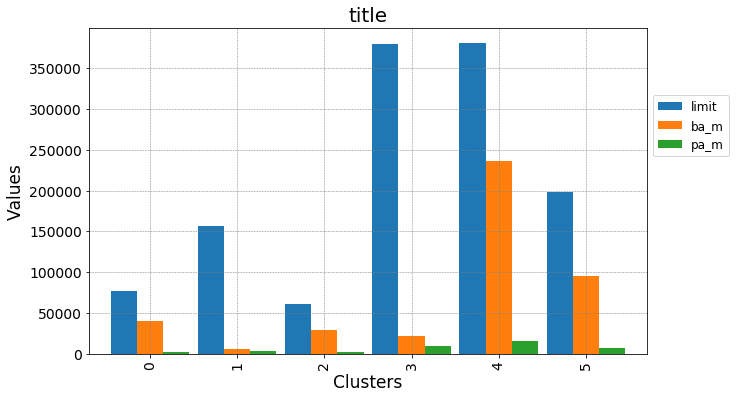

limit,ps-apr,ba_m,pa_m


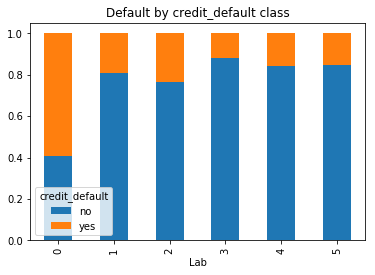

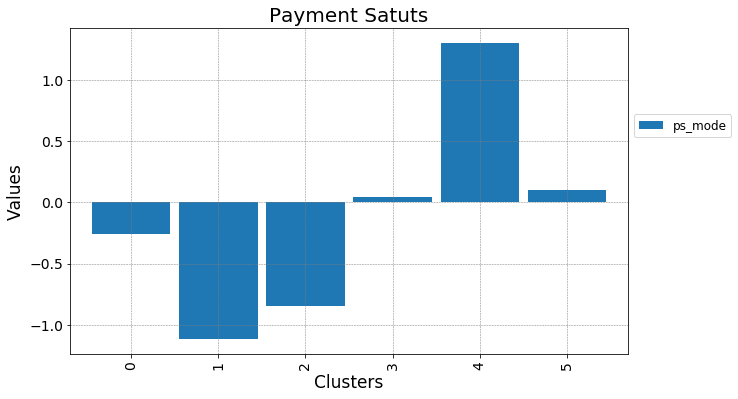

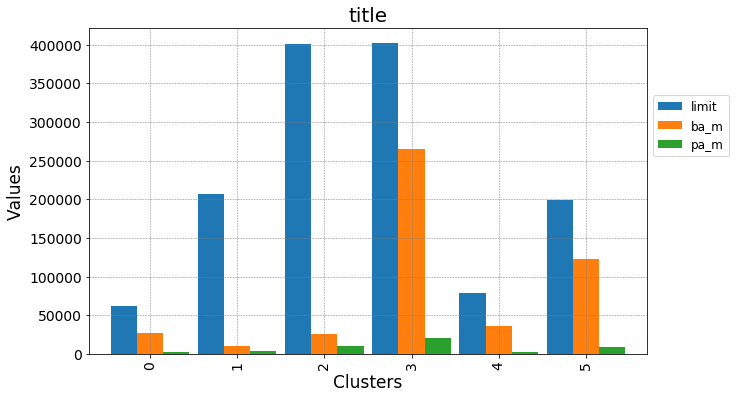

limit,ps-apr,ba_m,ps_mode


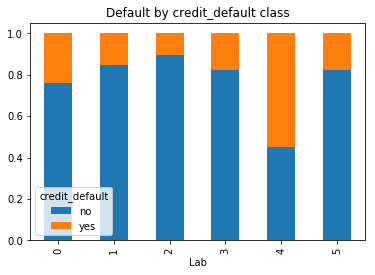

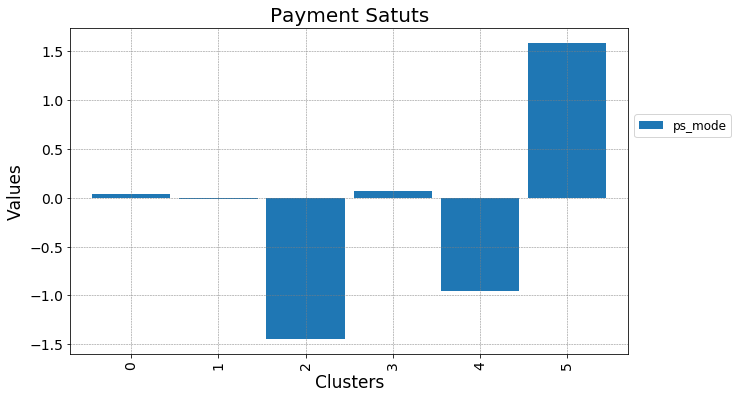

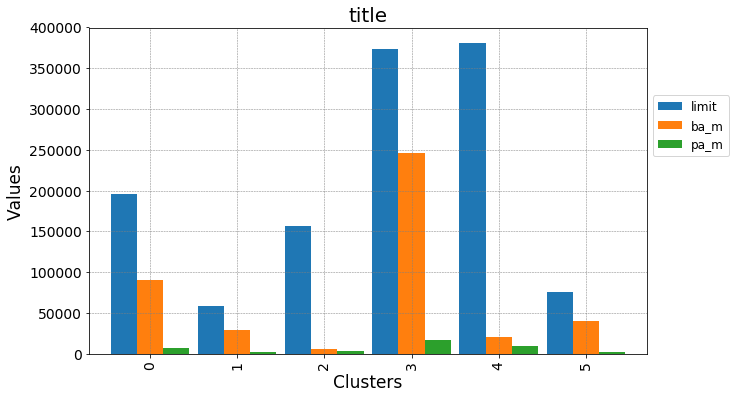

limit,ps-apr,pa_m,ps_mode


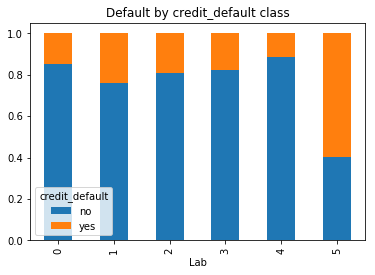

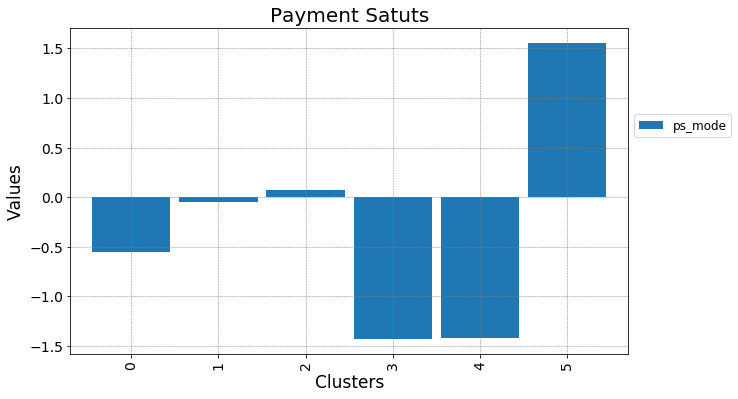

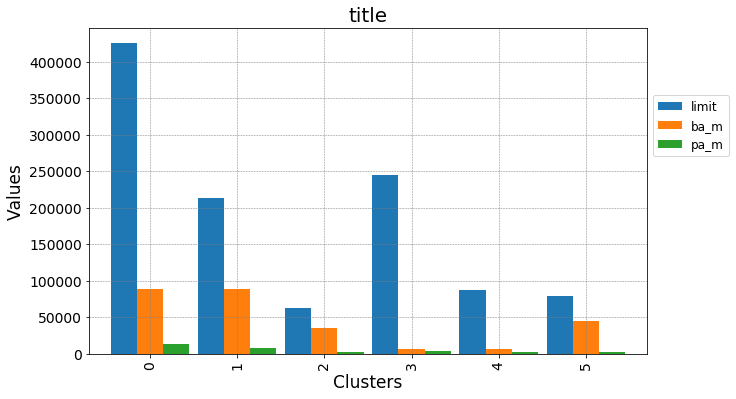

limit,ba-sep,pa_m,ps_mode


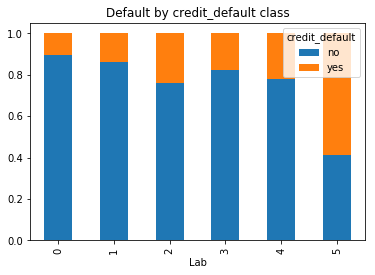

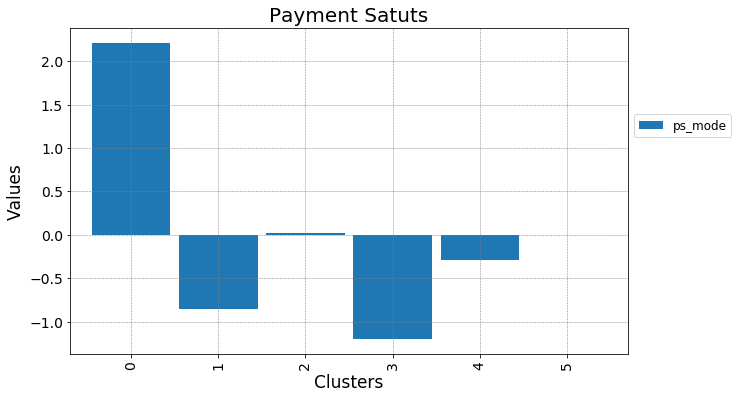

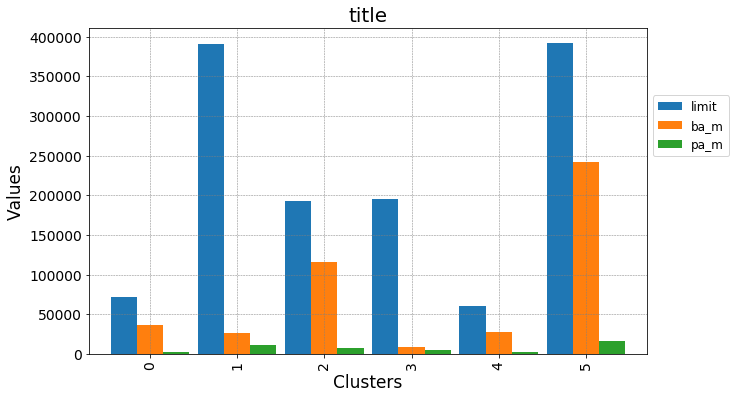

limit,ba_m,pa_m,ps_mode


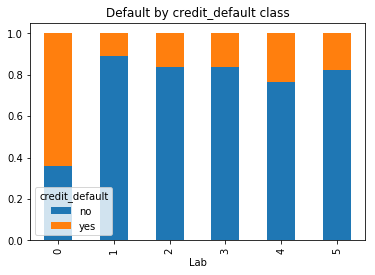

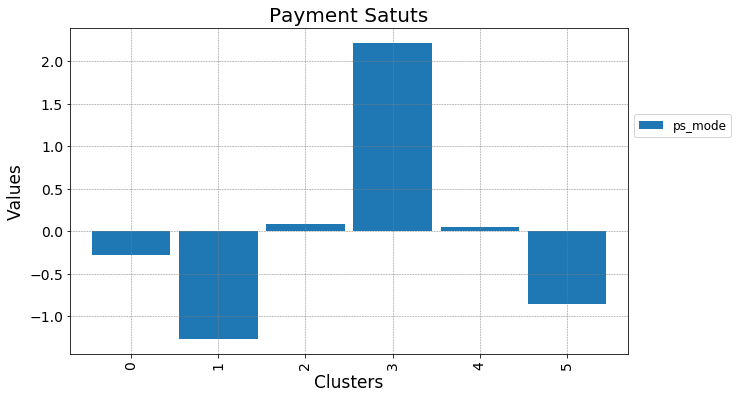

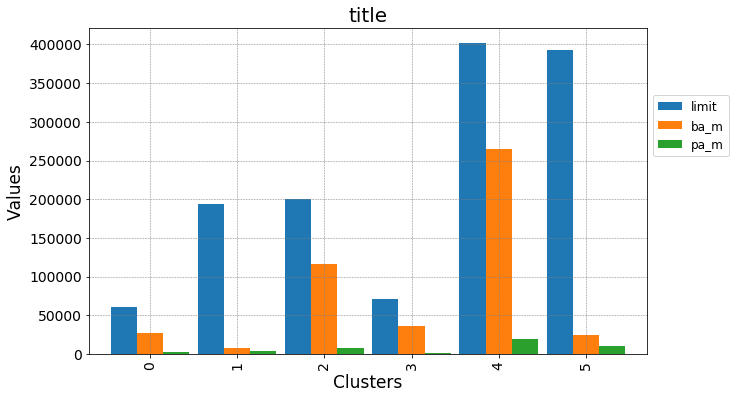

ps-sep,ps-apr,ba-sep,pa_m


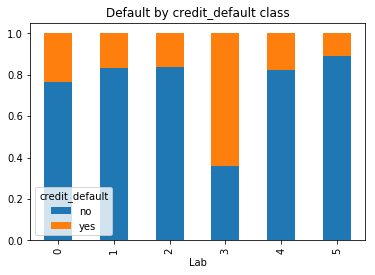

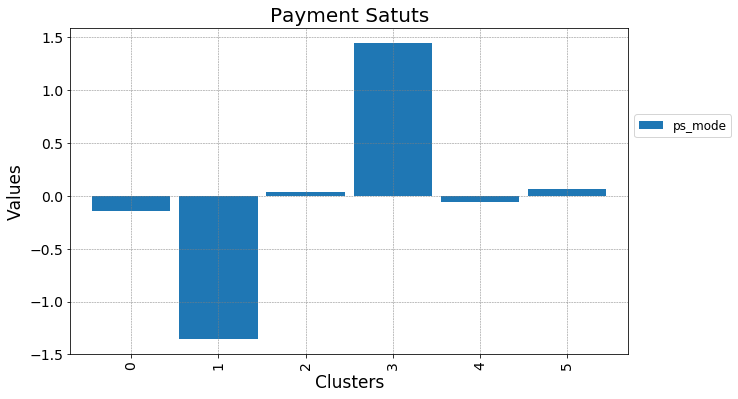

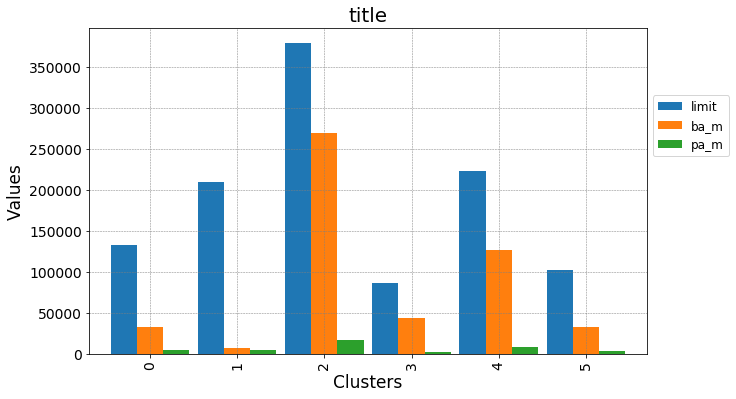

ps-sep,ps-apr,ba-sep,ps_mode


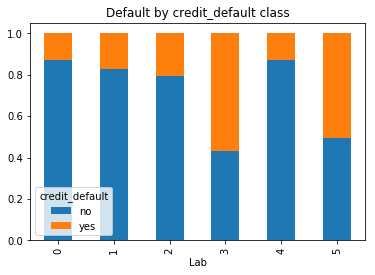

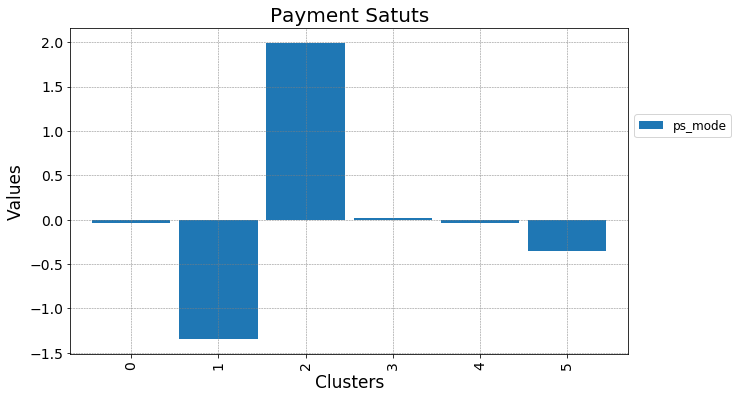

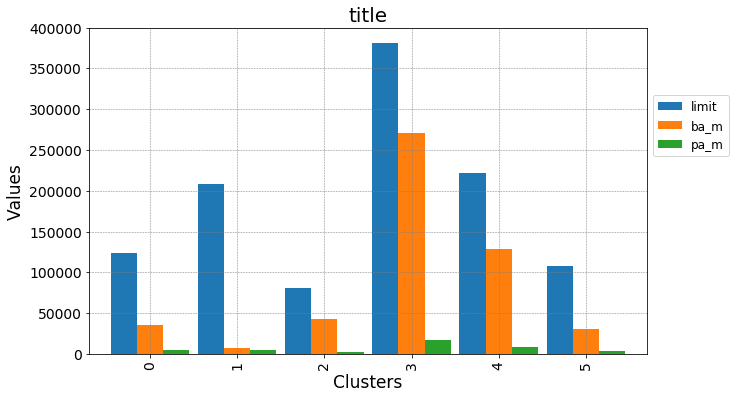

ps-sep,ps-apr,ba_m,pa_m


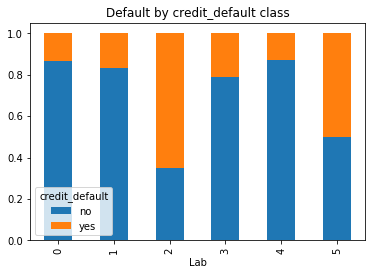

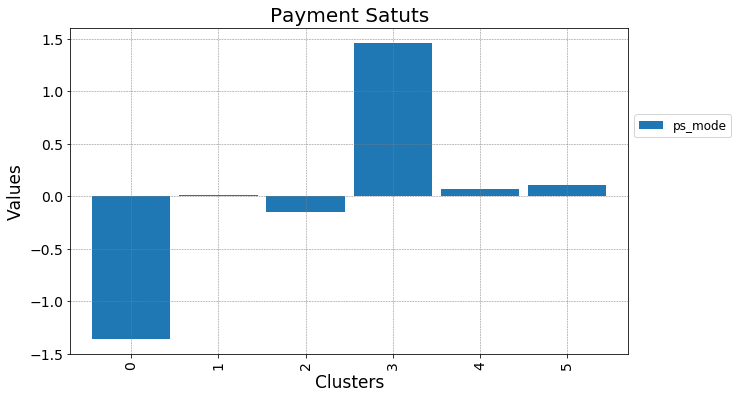

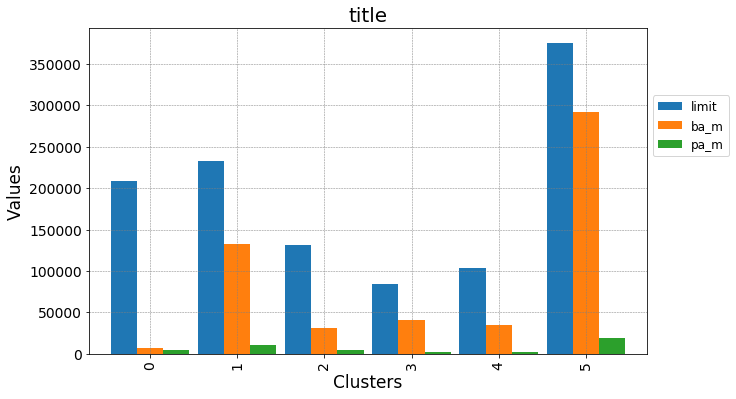

ps-sep,ps-apr,ba_m,ps_mode


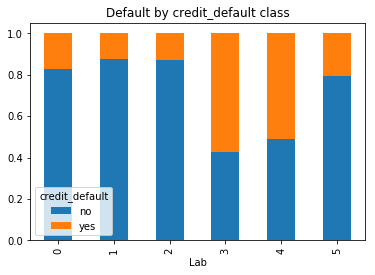

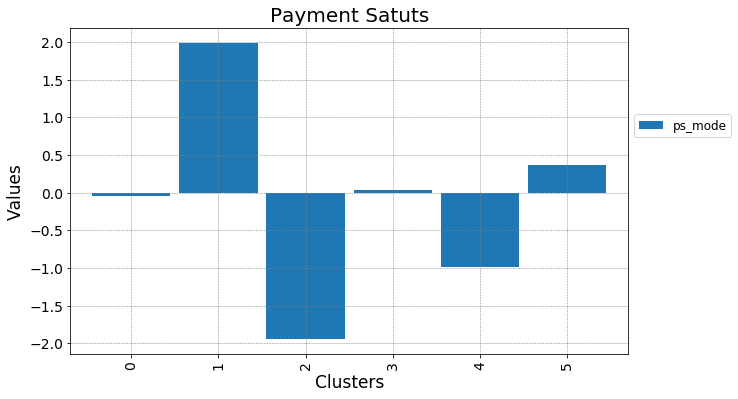

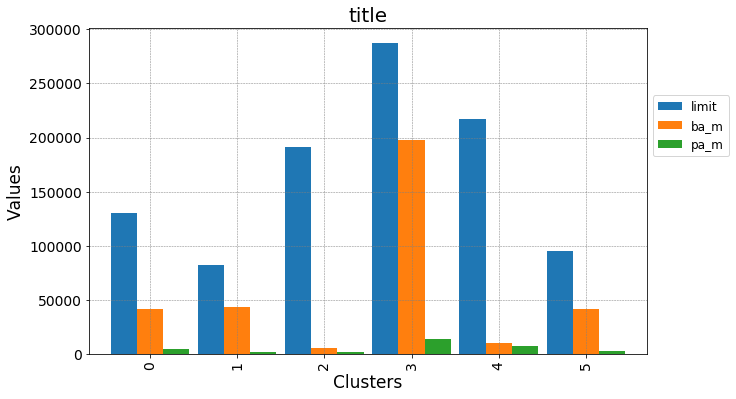

ps-sep,ps-apr,pa_m,ps_mode


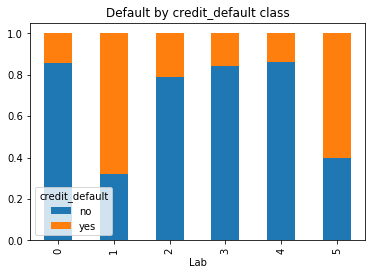

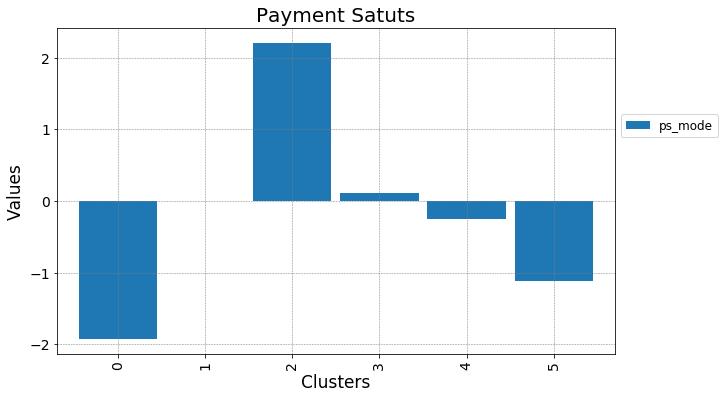

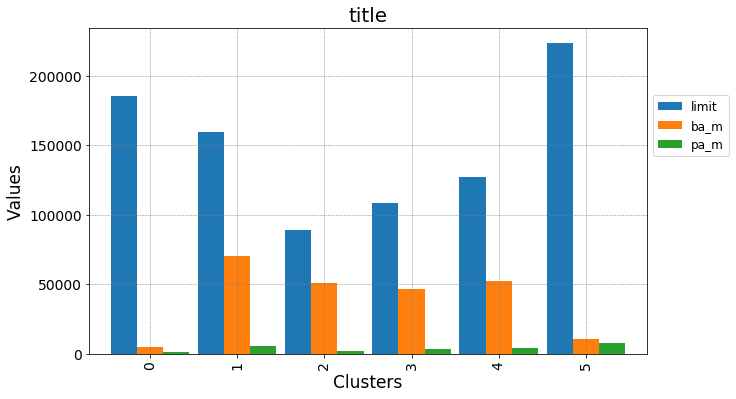

ps-sep,ba-sep,pa_m,ps_mode


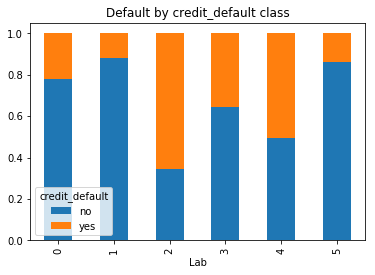

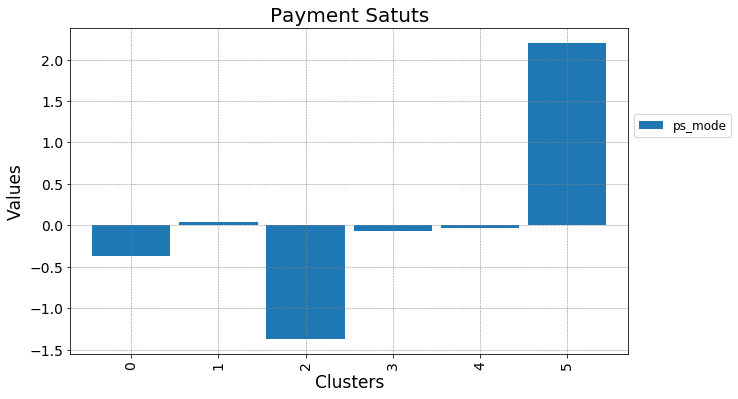

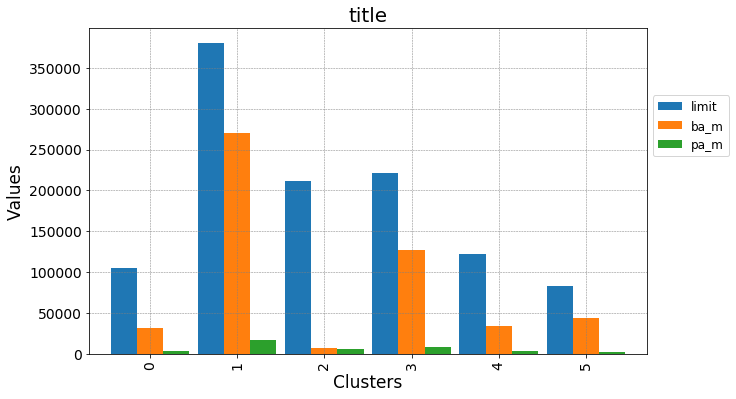

ps-sep,ba_m,pa_m,ps_mode


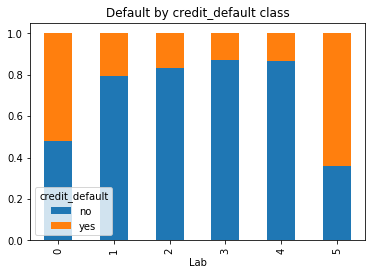

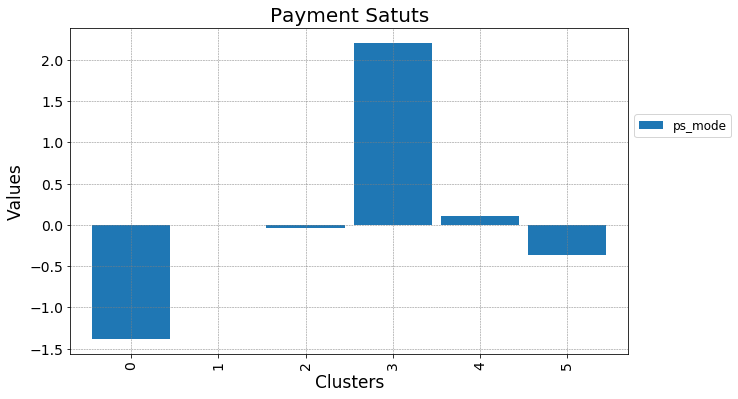

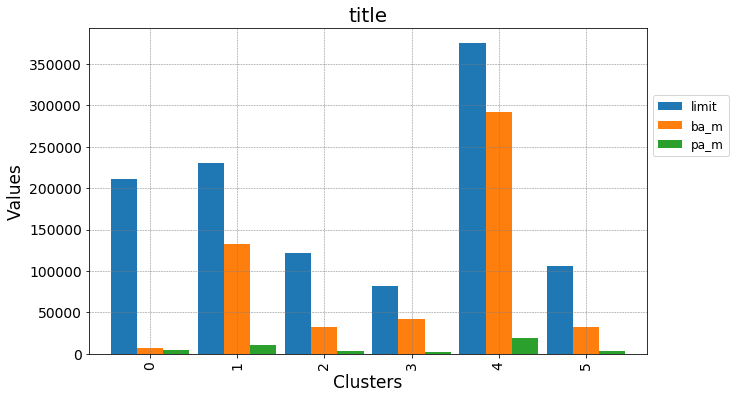

ps-apr,ba-sep,pa_m,ps_mode


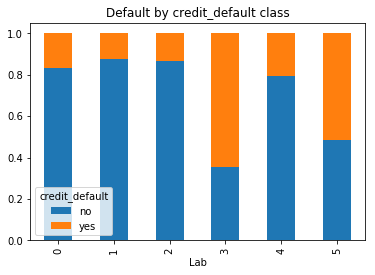

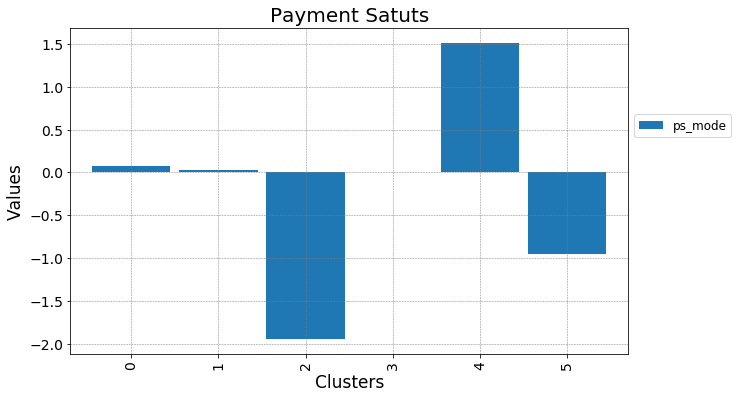

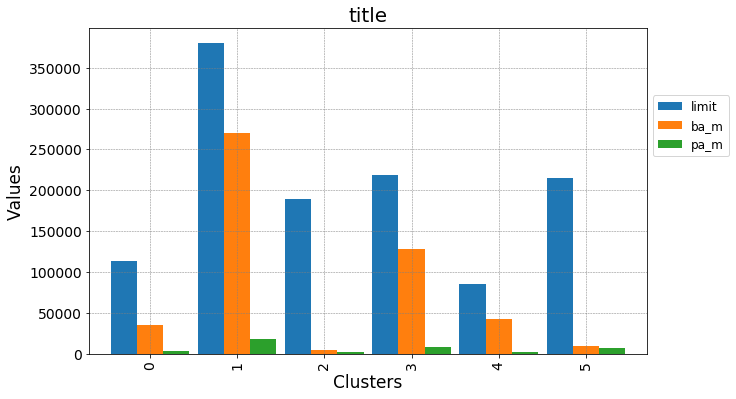

ps-apr,ba_m,pa_m,ps_mode


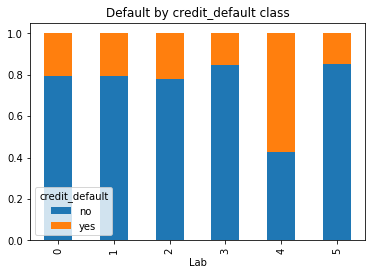

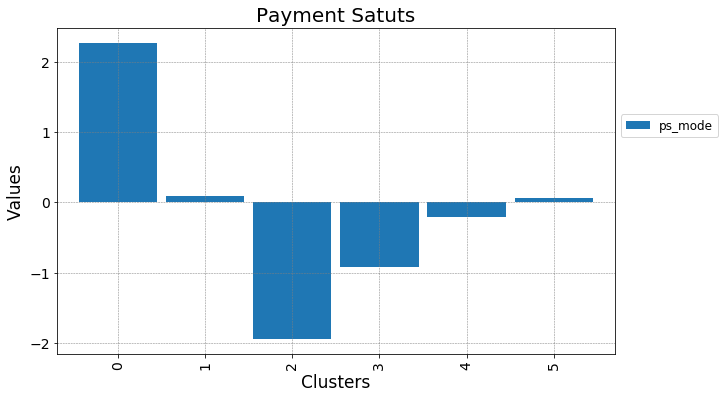

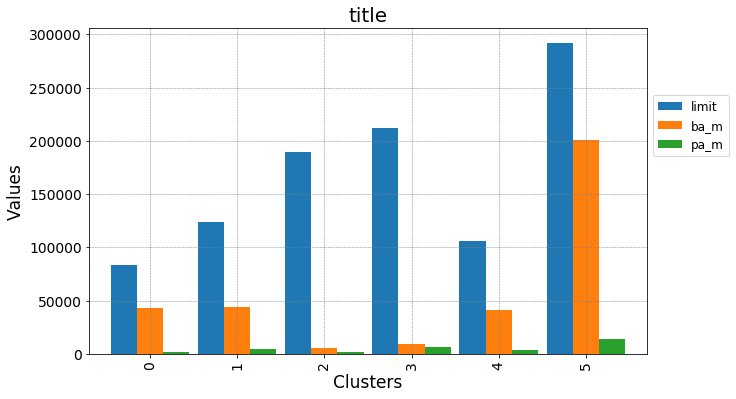

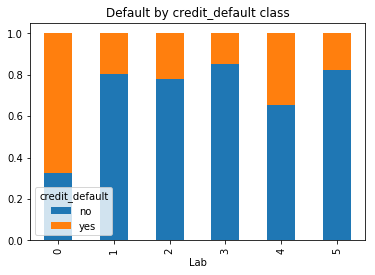

In [26]:
k=4
for c in dictio:
    print(c)
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')


In [27]:
dictio=pickle.load(open('KM-5','rb'))

limit,ps-sep,ps-apr,ba-sep,pa_m


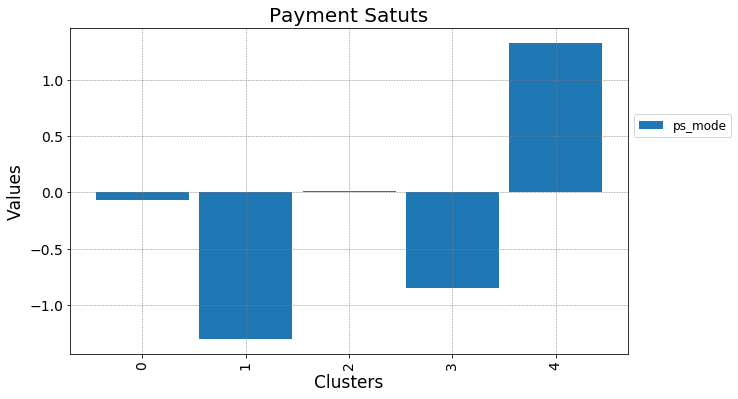

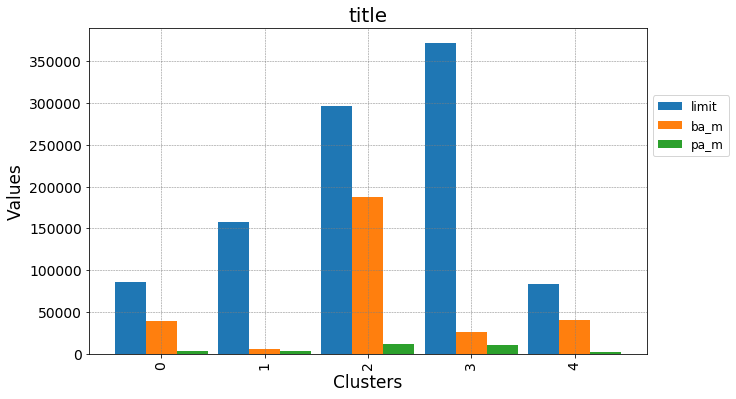

limit,ps-sep,ps-apr,ba-sep,ps_mode


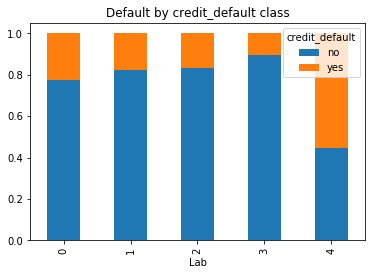

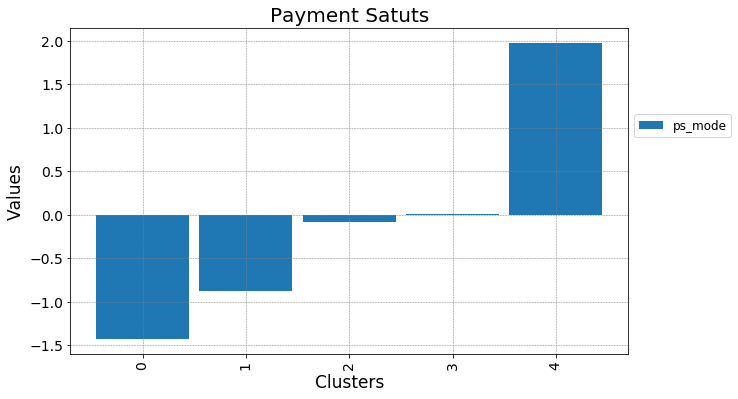

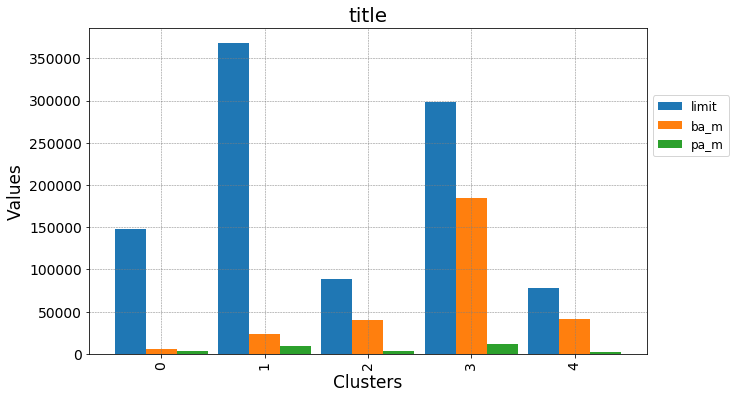

limit,ps-sep,ps-apr,ba_m,pa_m


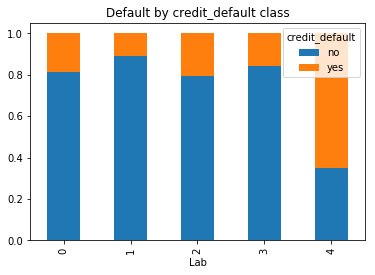

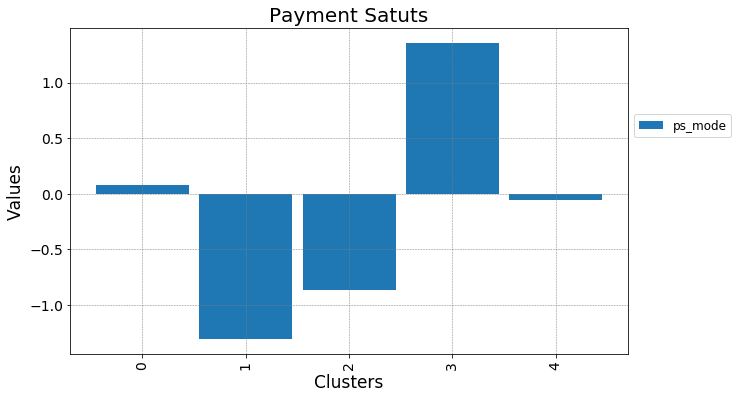

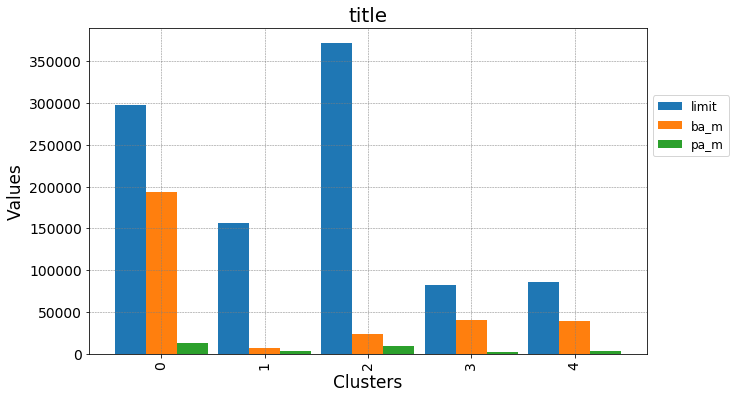

limit,ps-sep,ps-apr,ba_m,ps_mode


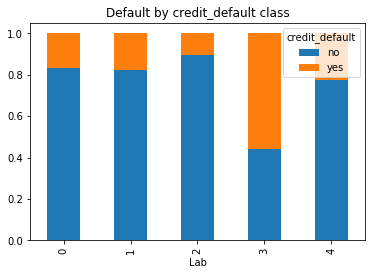

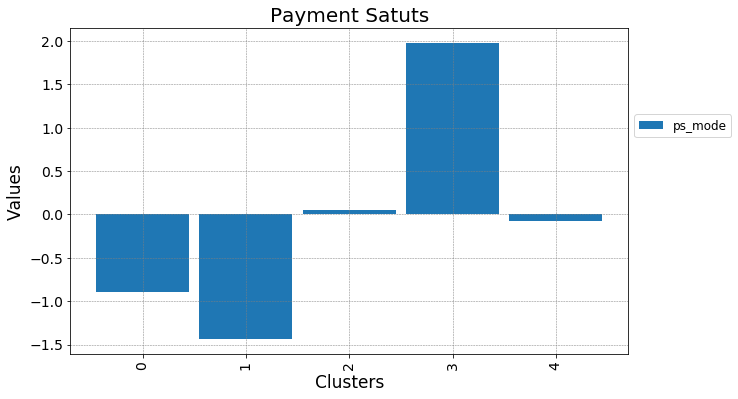

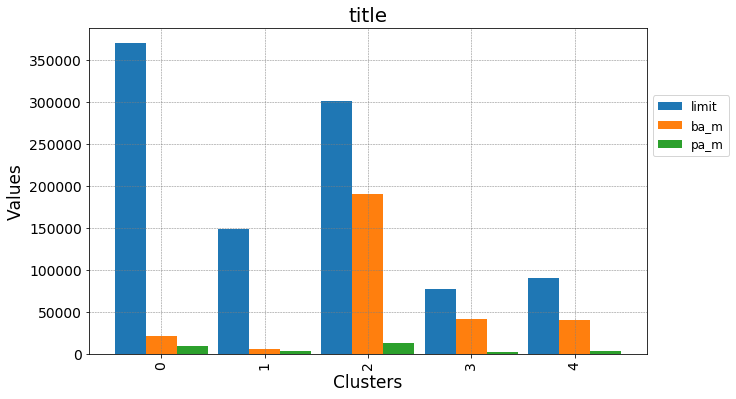

limit,ps-sep,ps-apr,pa_m,ps_mode


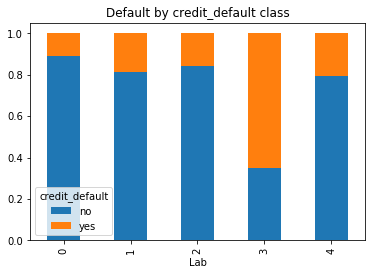

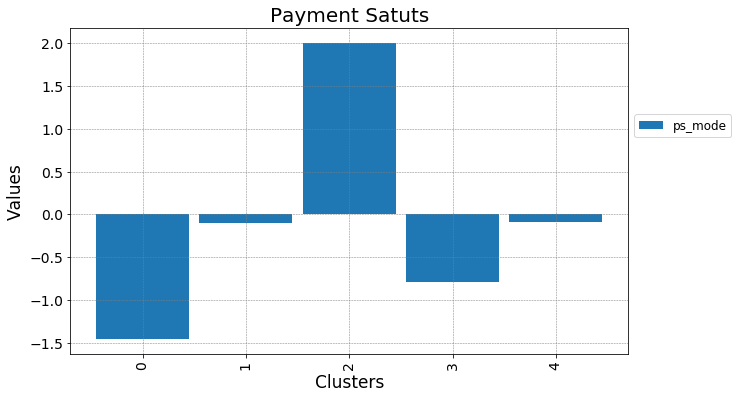

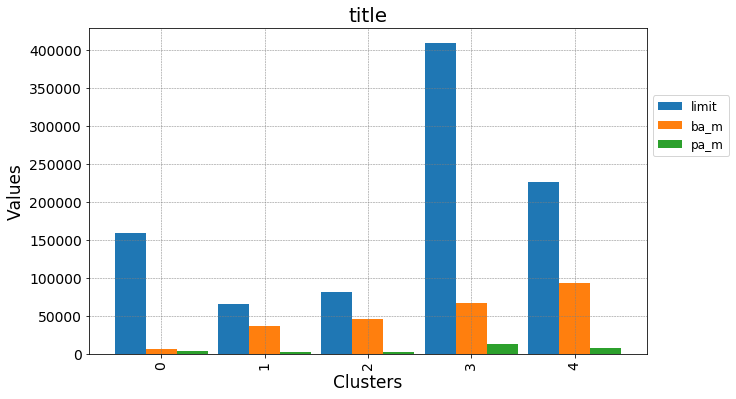

limit,ps-sep,ba-sep,pa_m,ps_mode


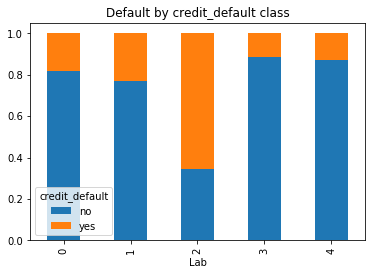

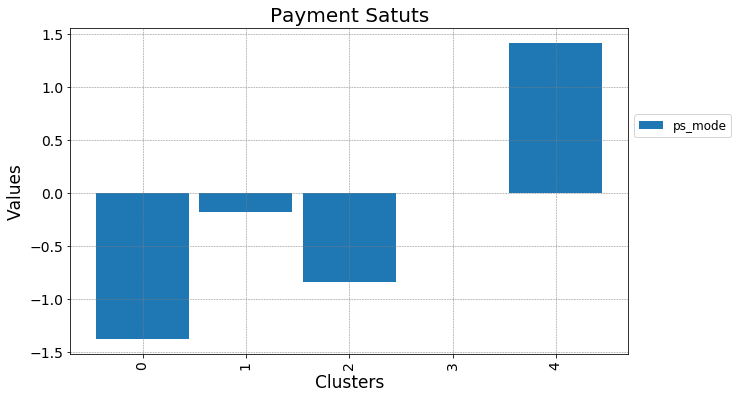

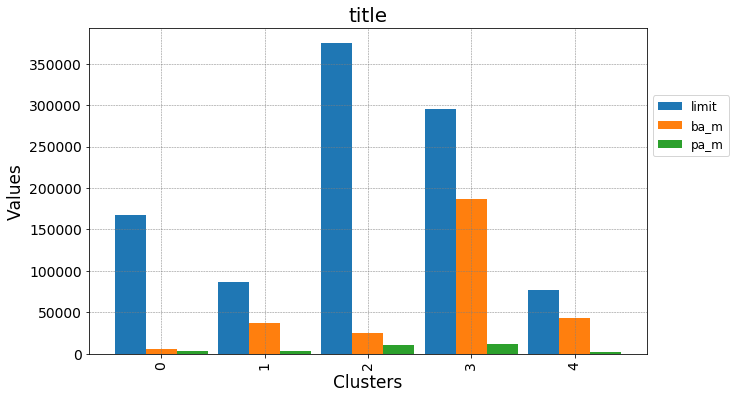

limit,ps-sep,ba_m,pa_m,ps_mode


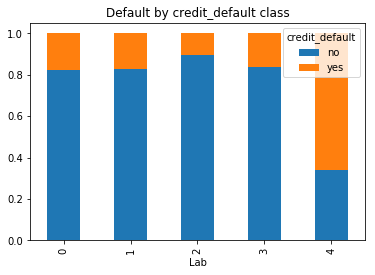

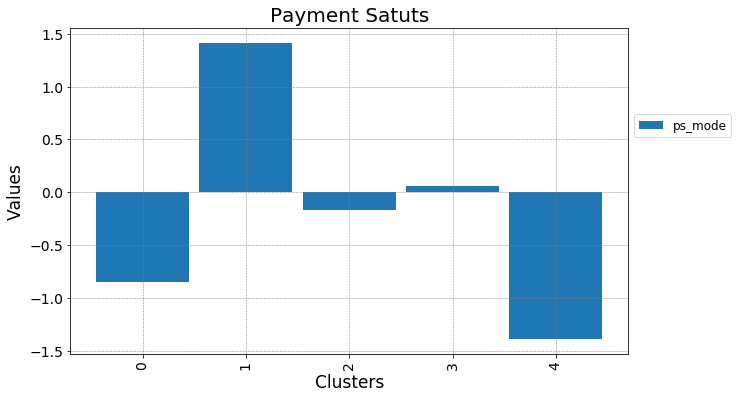

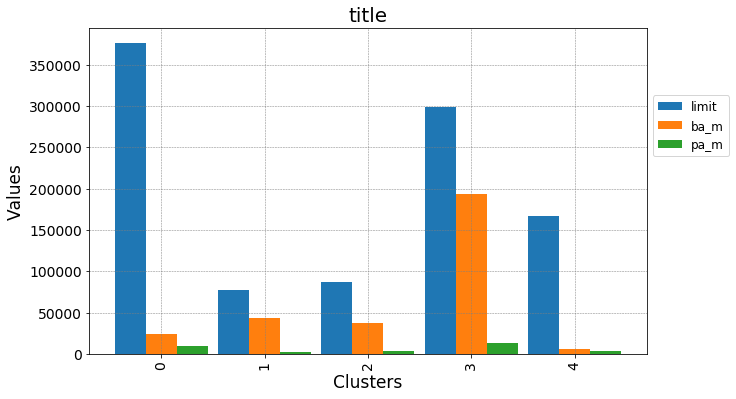

limit,ps-apr,ba-sep,pa_m,ps_mode


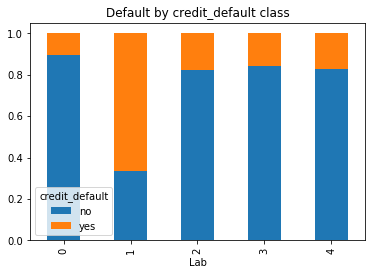

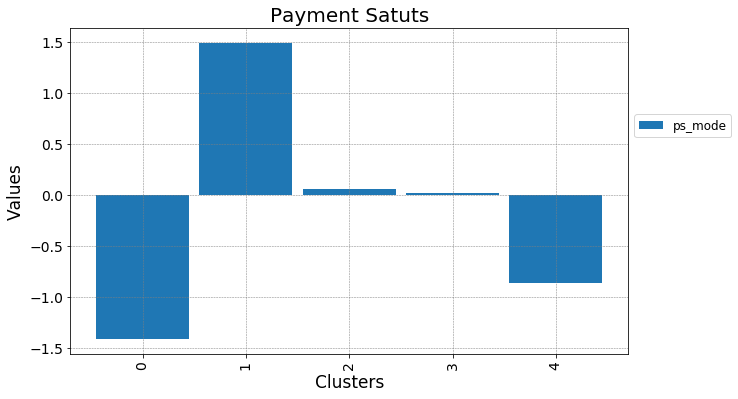

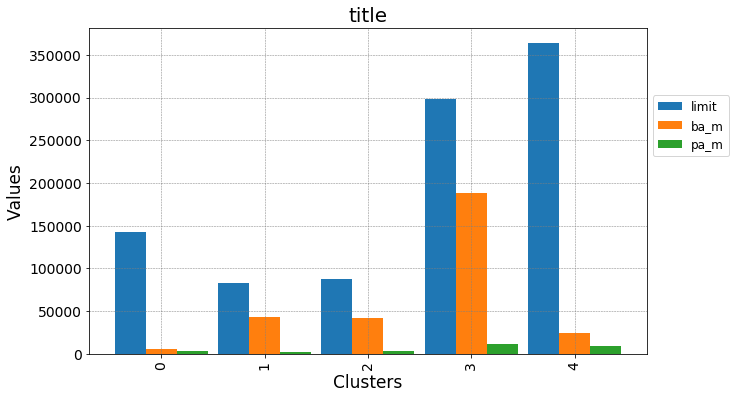

limit,ps-apr,ba_m,pa_m,ps_mode


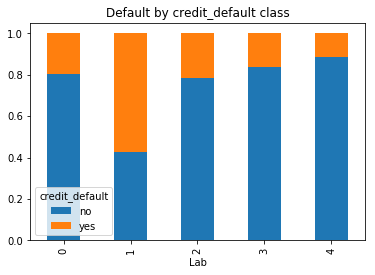

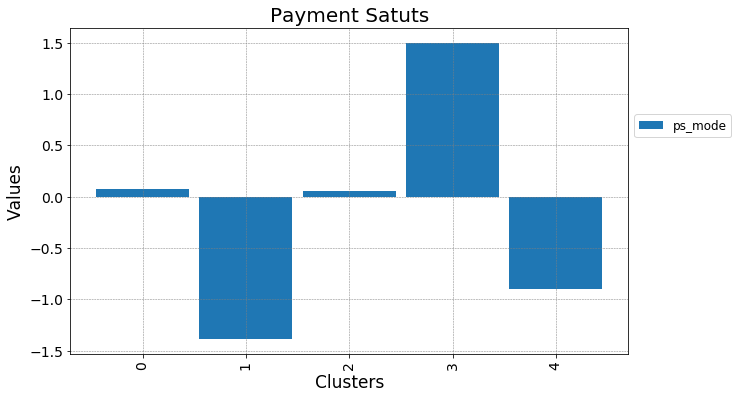

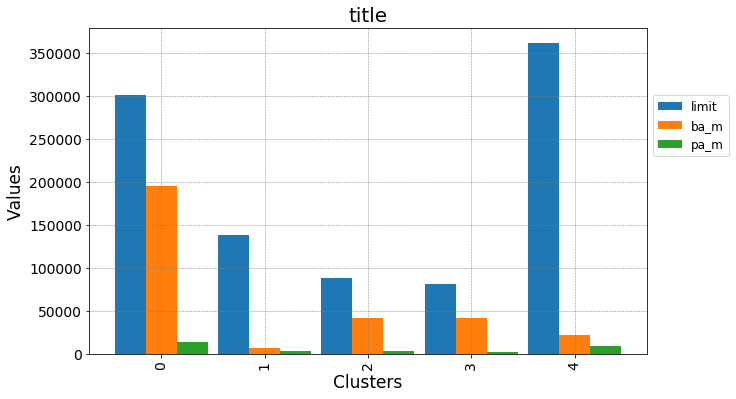

ps-sep,ps-apr,ba-sep,pa_m,ps_mode


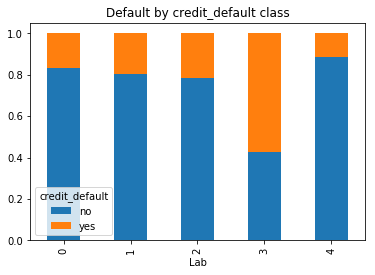

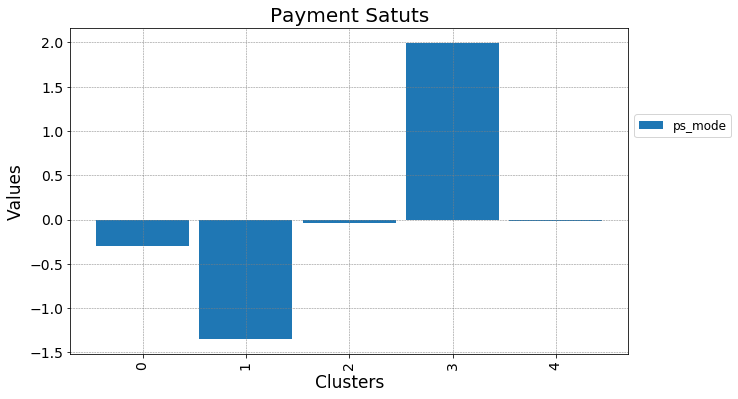

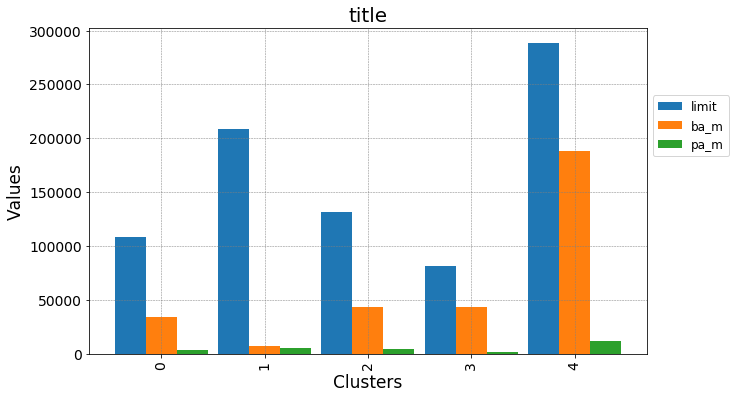

ps-sep,ps-apr,ba_m,pa_m,ps_mode


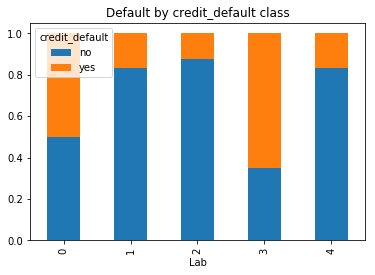

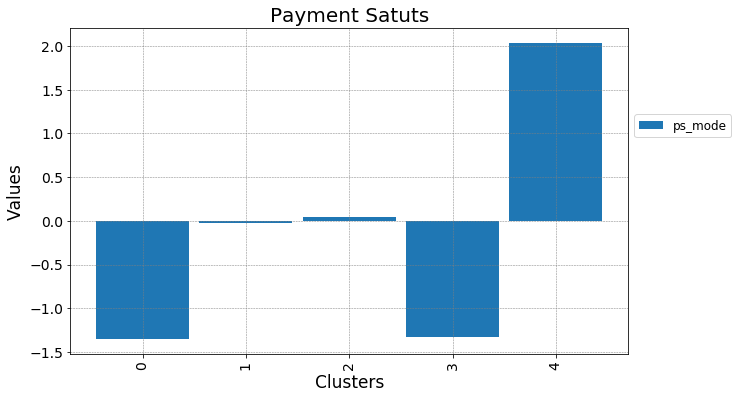

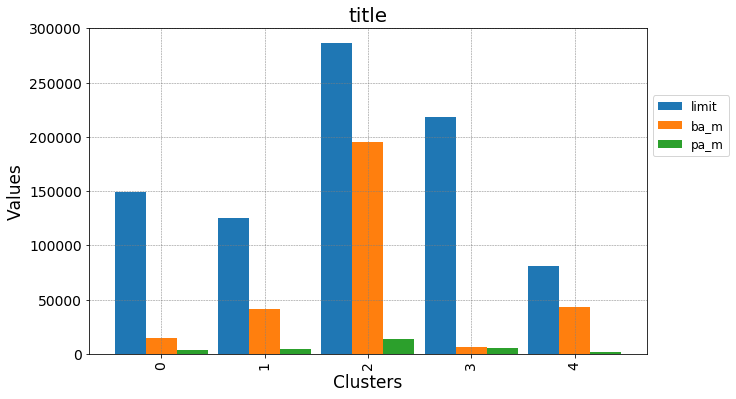

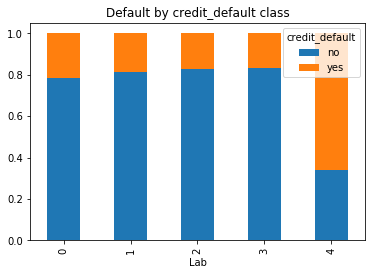

In [28]:
k=3
for c in dictio:
    print(c)
    
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')


limit,ps-sep,ps-apr,ba-sep,pa_m


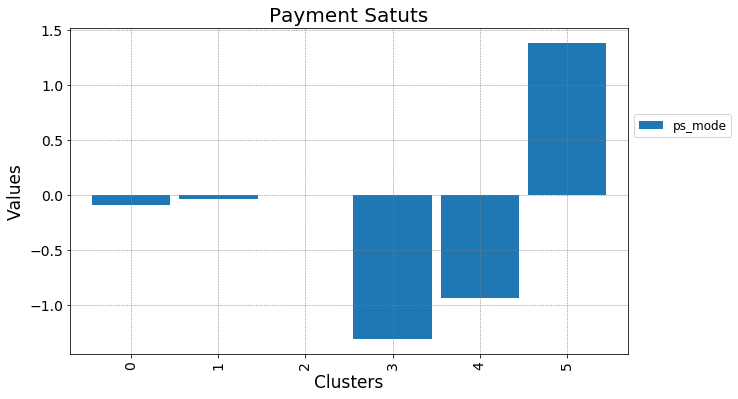

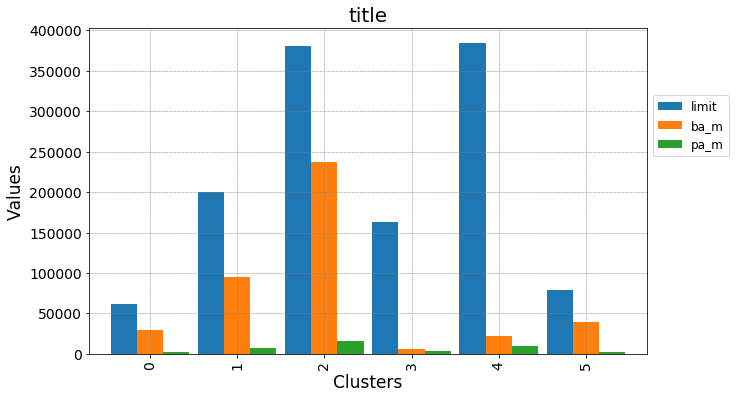

limit,ps-sep,ps-apr,ba-sep,ps_mode


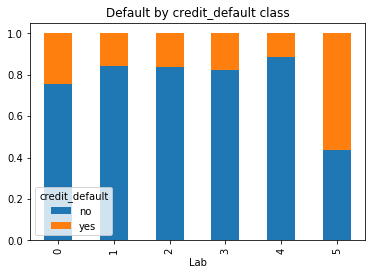

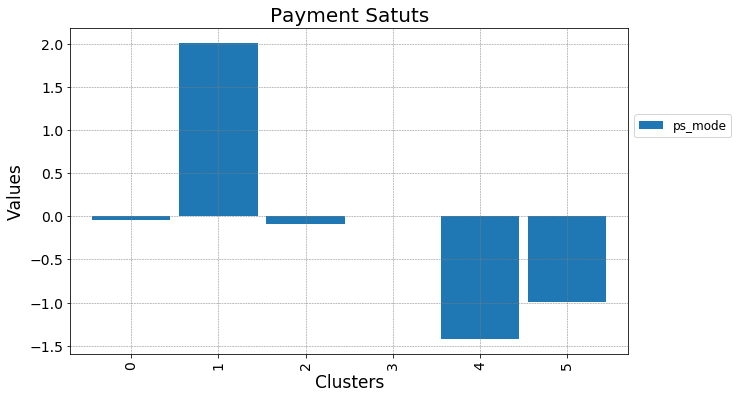

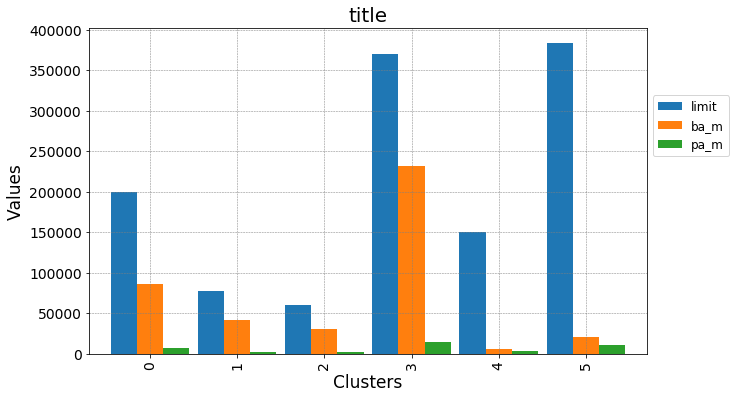

limit,ps-sep,ps-apr,ba_m,pa_m


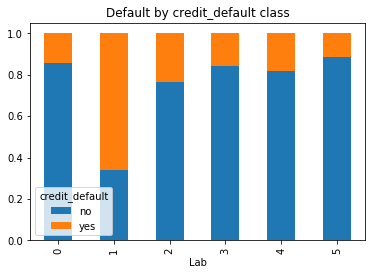

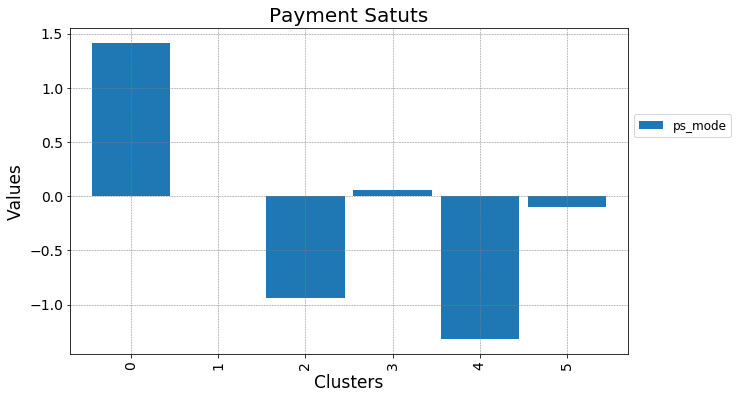

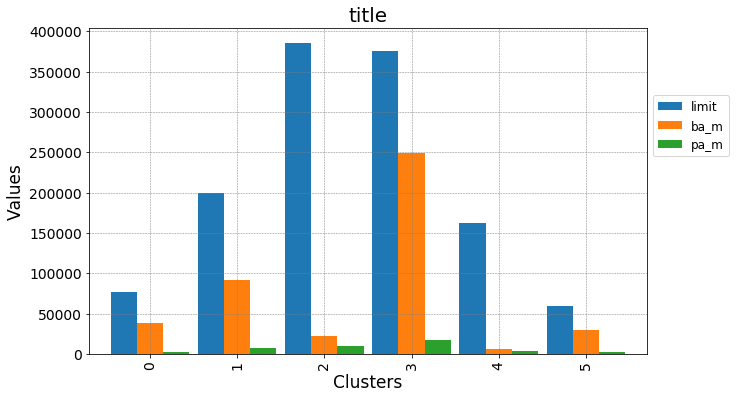

limit,ps-sep,ps-apr,ba_m,ps_mode


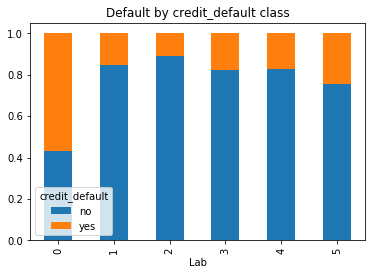

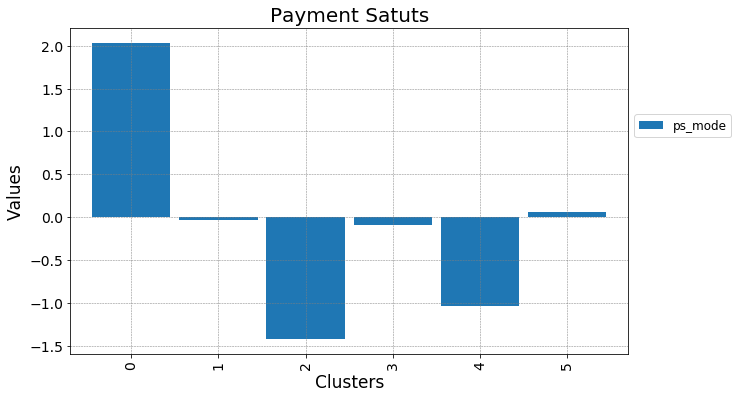

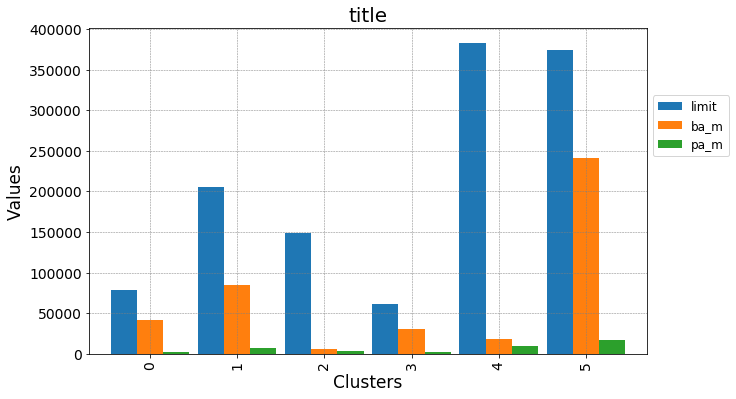

limit,ps-sep,ps-apr,pa_m,ps_mode


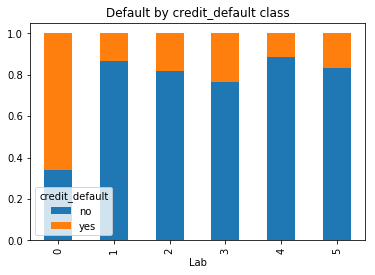

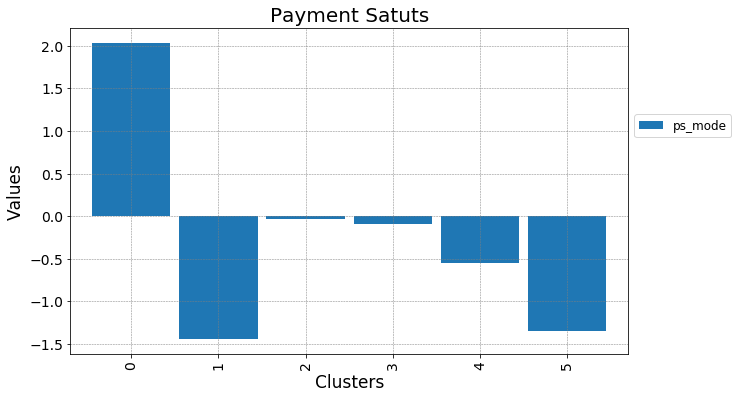

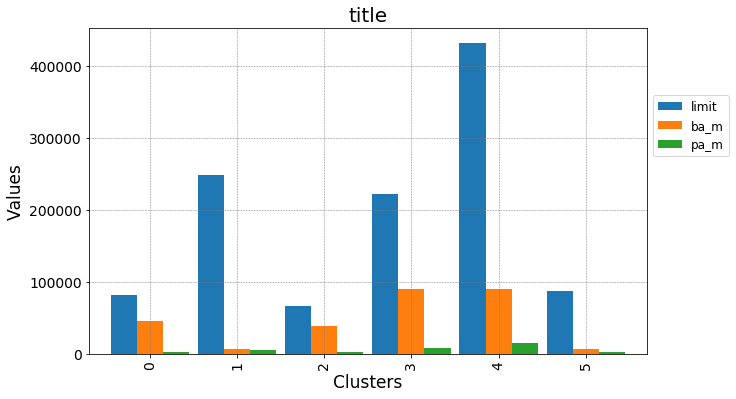

limit,ps-sep,ba-sep,pa_m,ps_mode


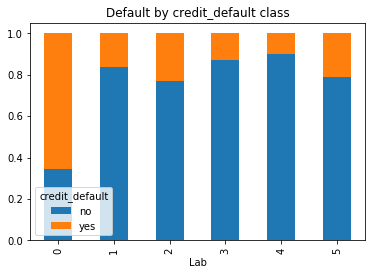

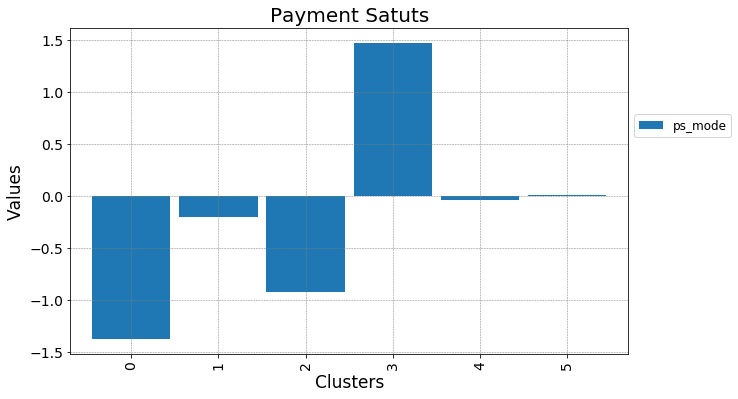

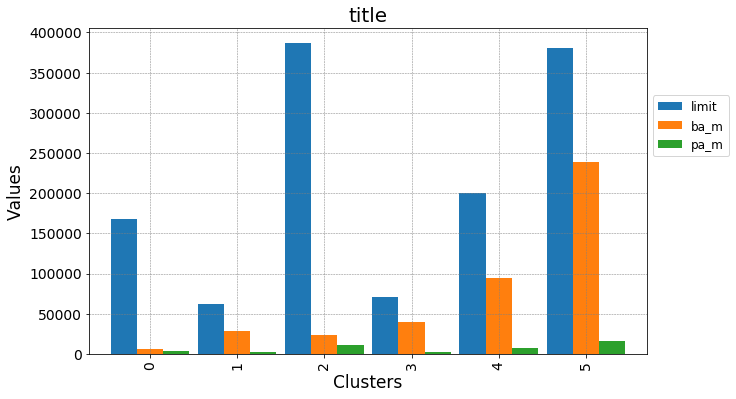

limit,ps-sep,ba_m,pa_m,ps_mode


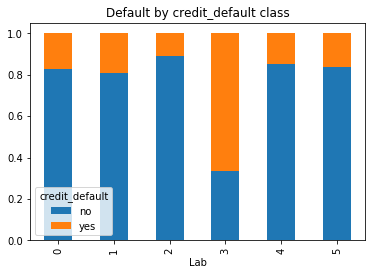

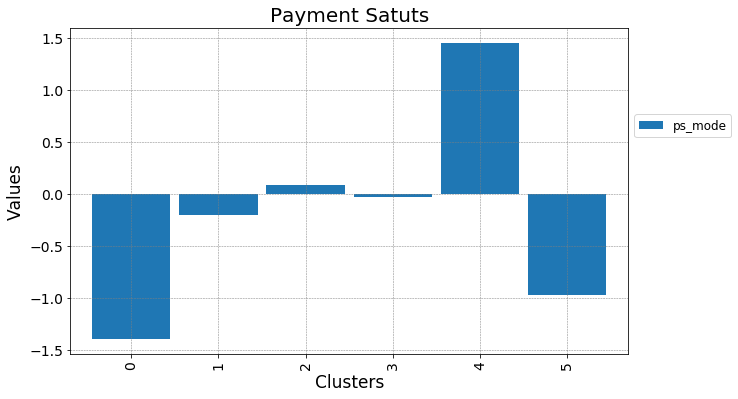

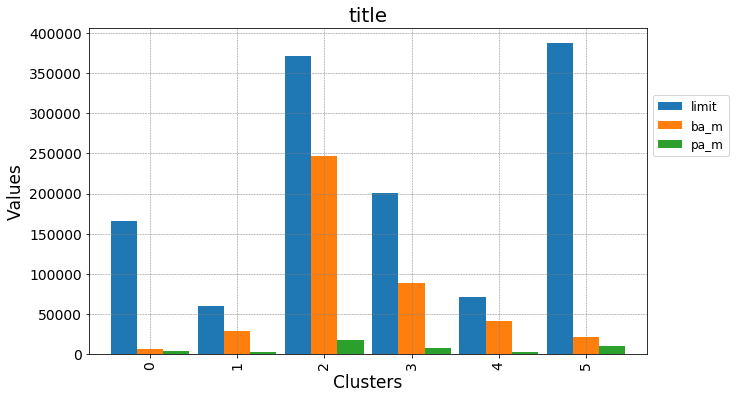

limit,ps-apr,ba-sep,pa_m,ps_mode


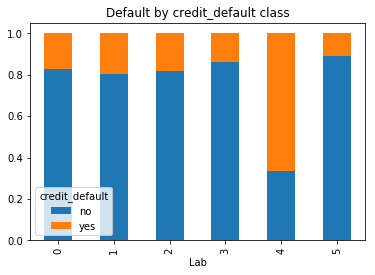

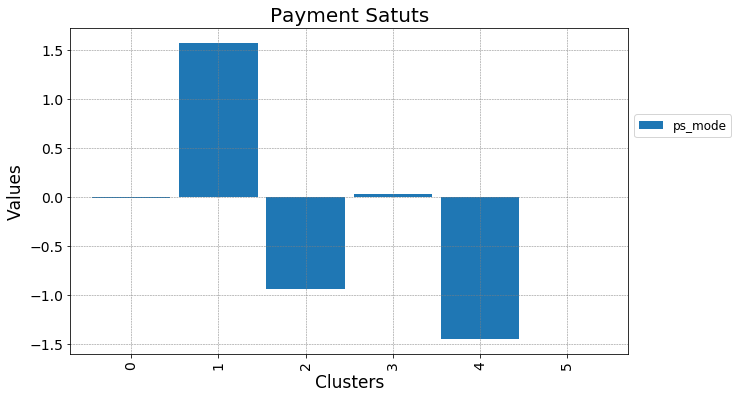

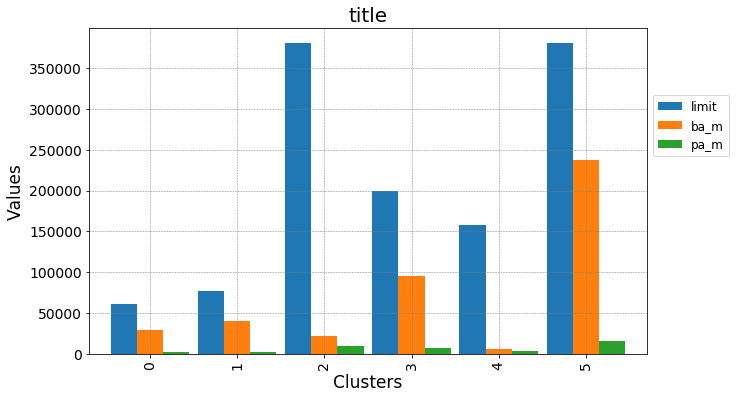

limit,ps-apr,ba_m,pa_m,ps_mode


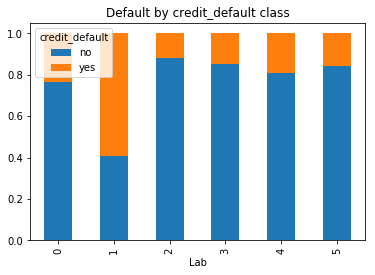

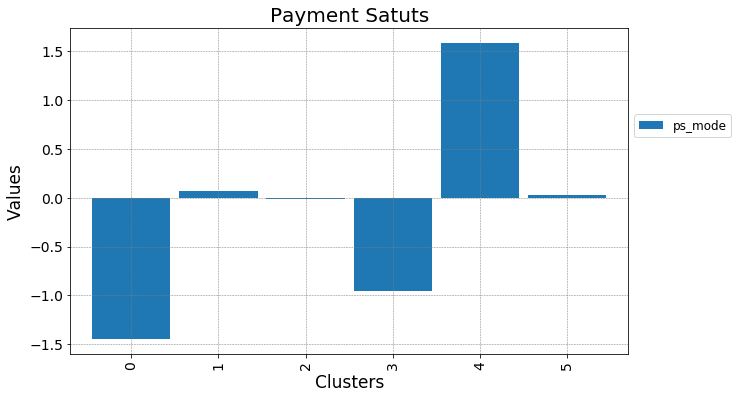

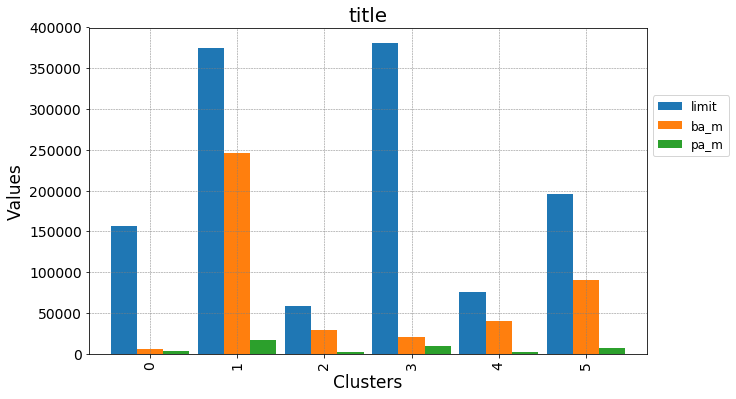

ps-sep,ps-apr,ba-sep,pa_m,ps_mode


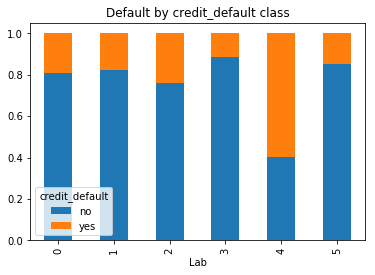

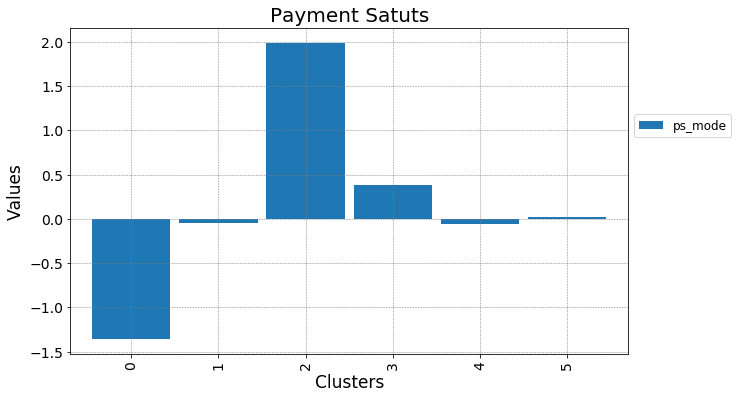

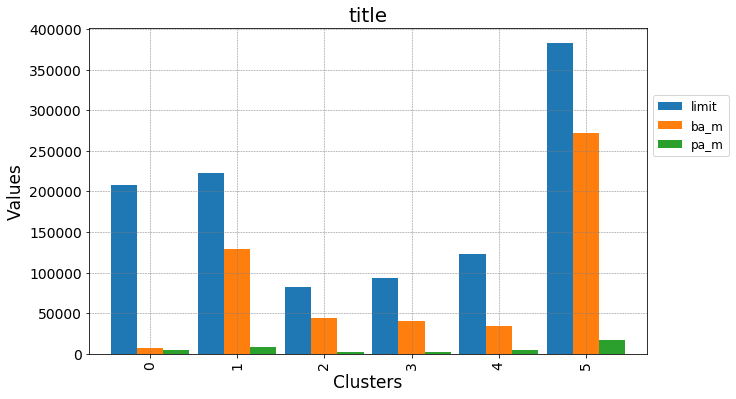

ps-sep,ps-apr,ba_m,pa_m,ps_mode


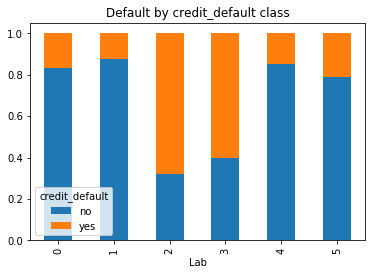

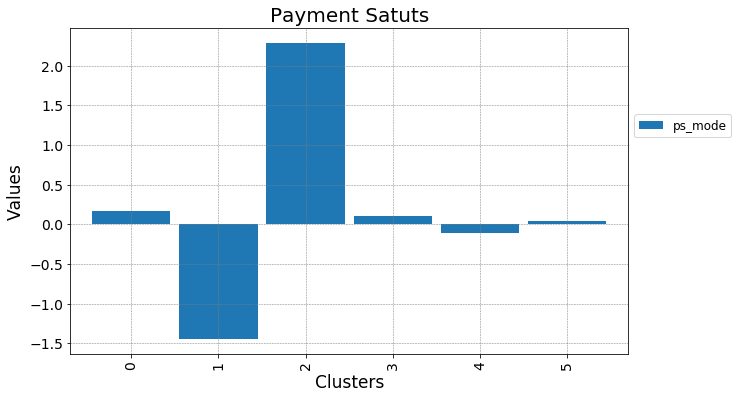

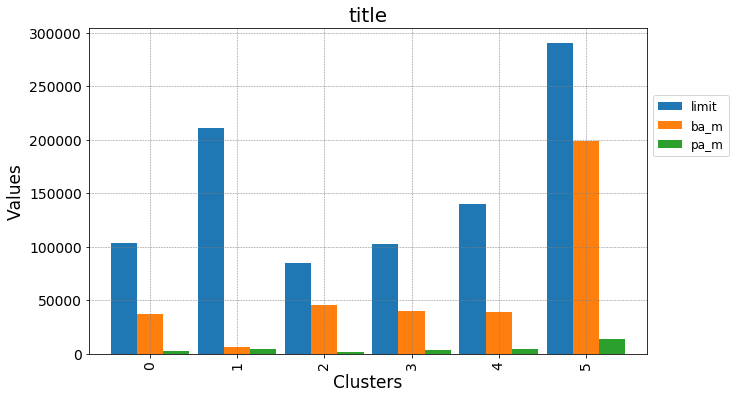

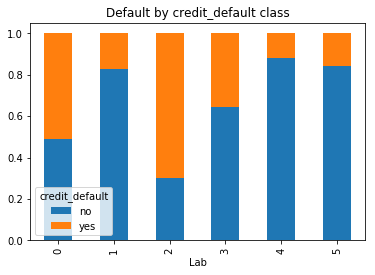

In [29]:
k=4
for c in dictio:
    print(c)
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')


limit,ps-sep,ps-apr,ba-sep,pa_m


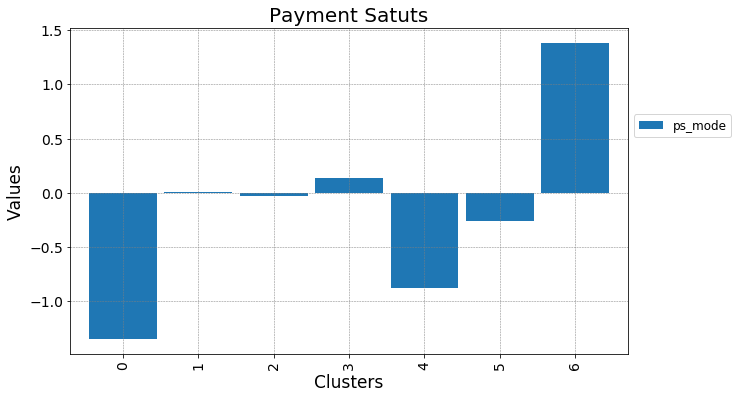

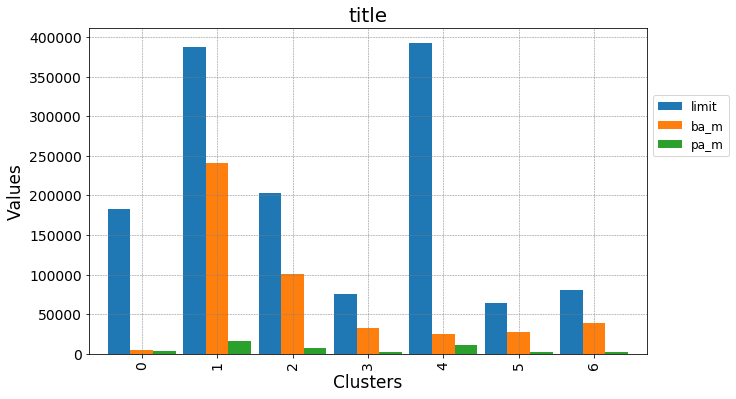

limit,ps-sep,ps-apr,ba-sep,ps_mode


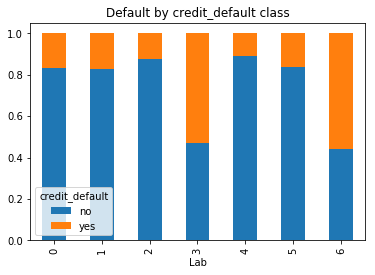

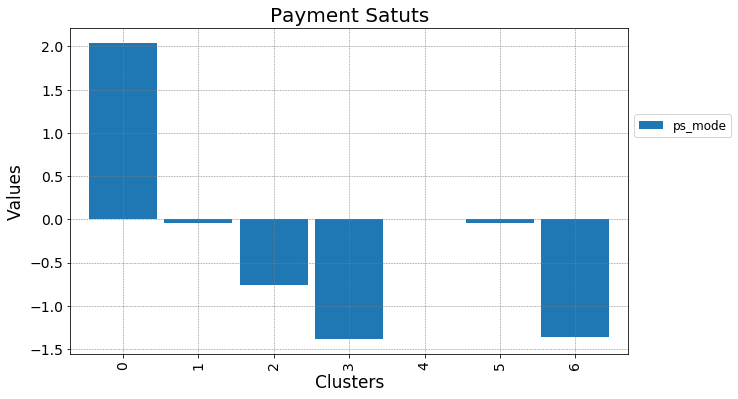

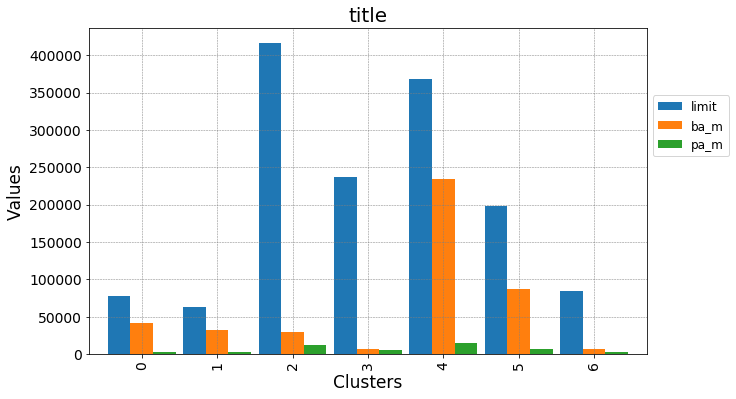

limit,ps-sep,ps-apr,ba_m,pa_m


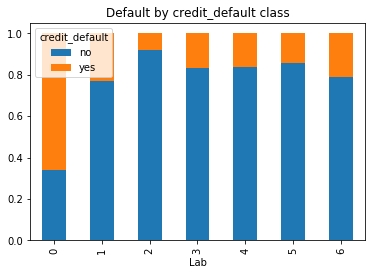

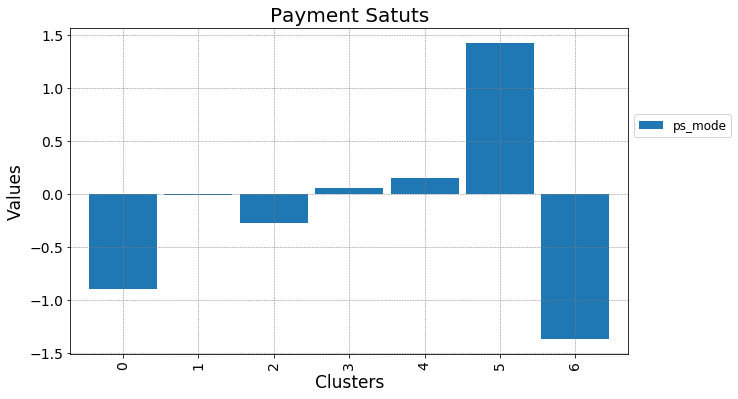

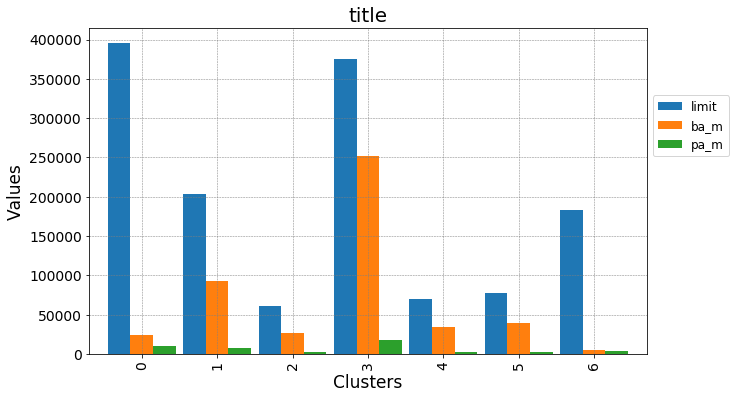

limit,ps-sep,ps-apr,ba_m,ps_mode


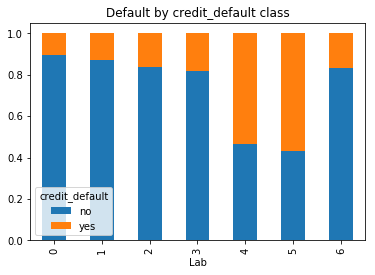

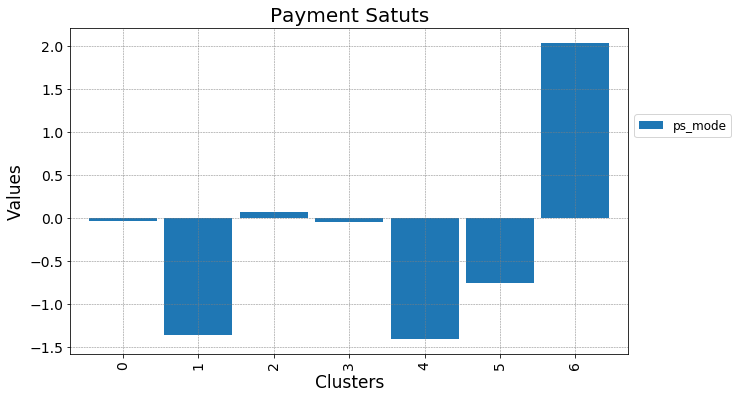

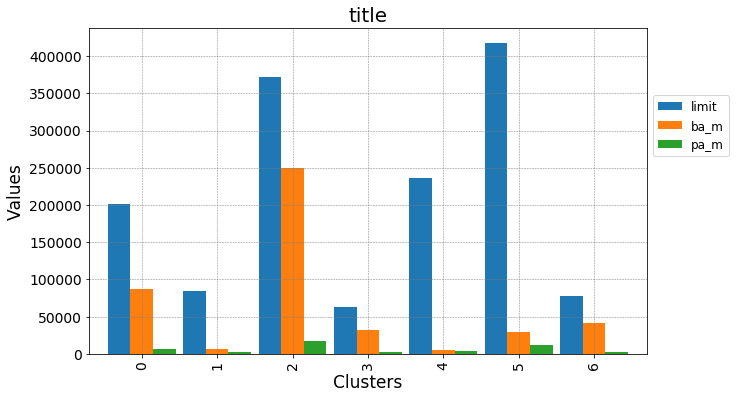

limit,ps-sep,ps-apr,pa_m,ps_mode


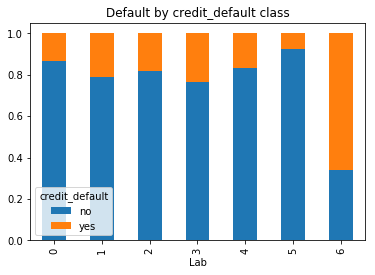

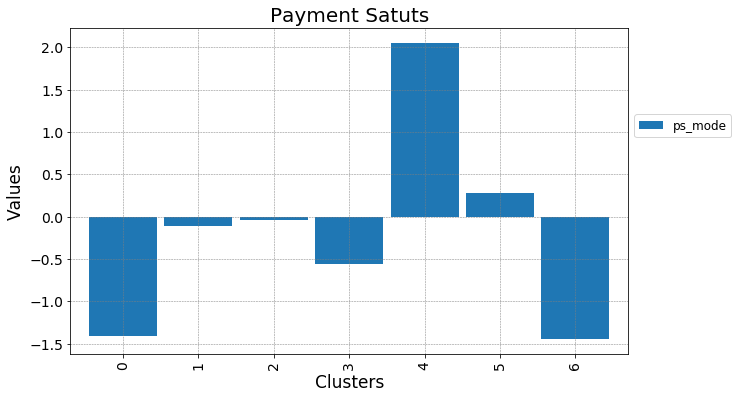

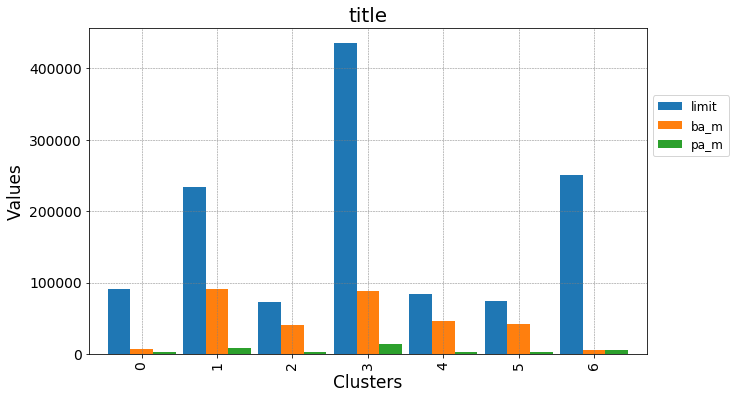

limit,ps-sep,ba-sep,pa_m,ps_mode


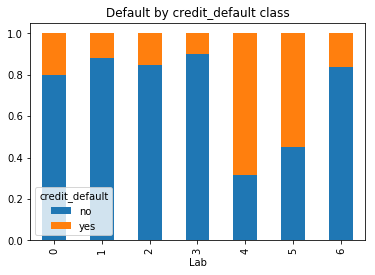

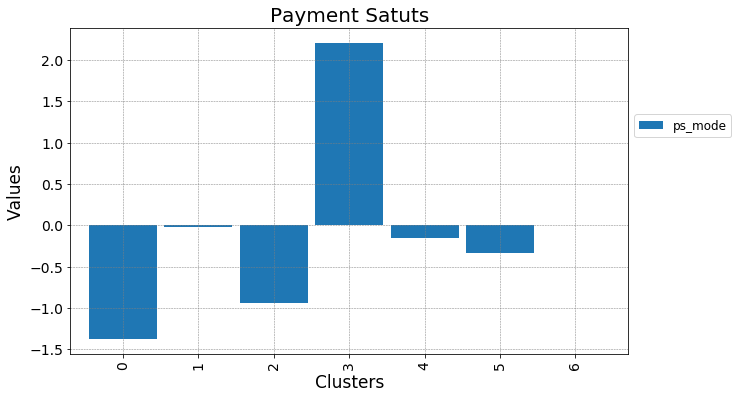

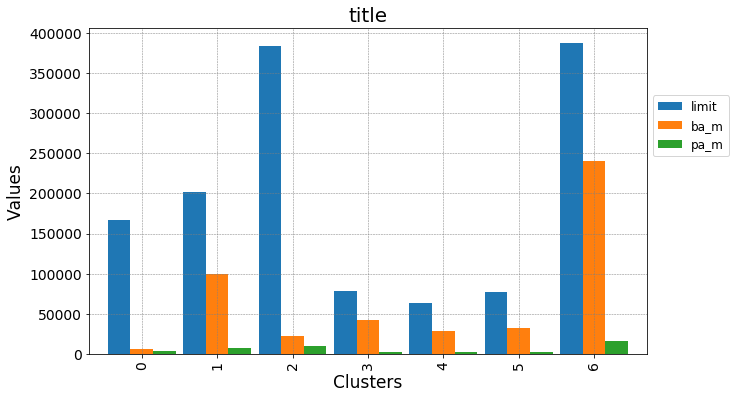

limit,ps-sep,ba_m,pa_m,ps_mode


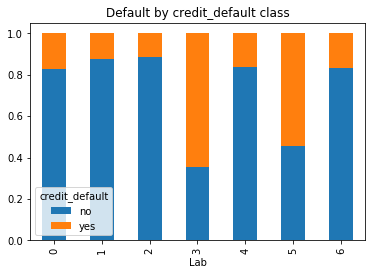

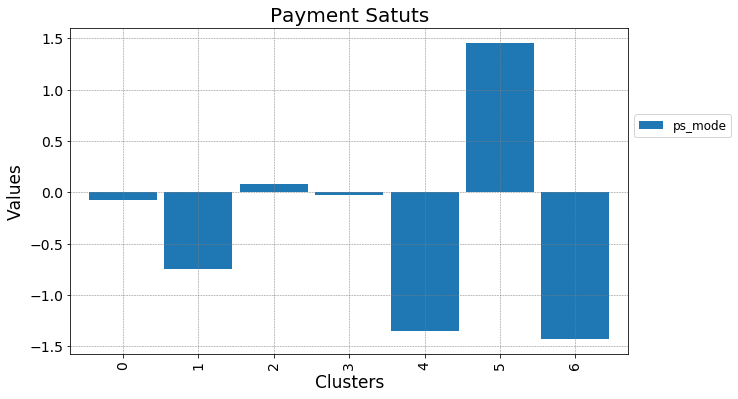

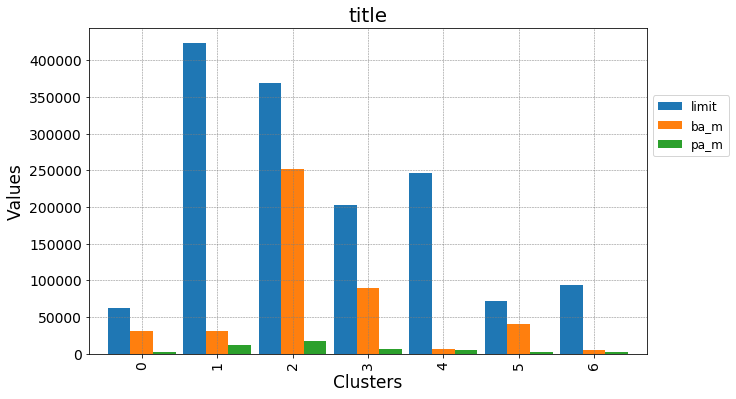

limit,ps-apr,ba-sep,pa_m,ps_mode


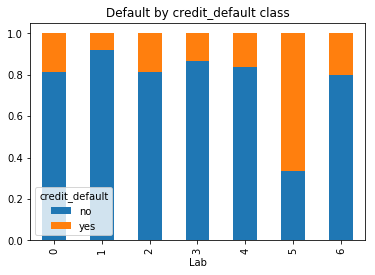

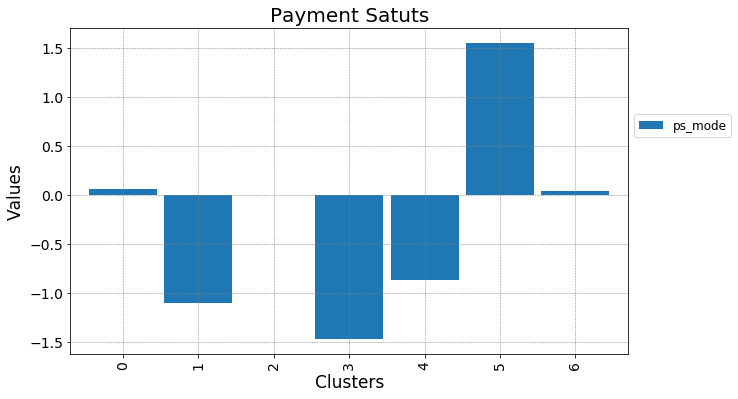

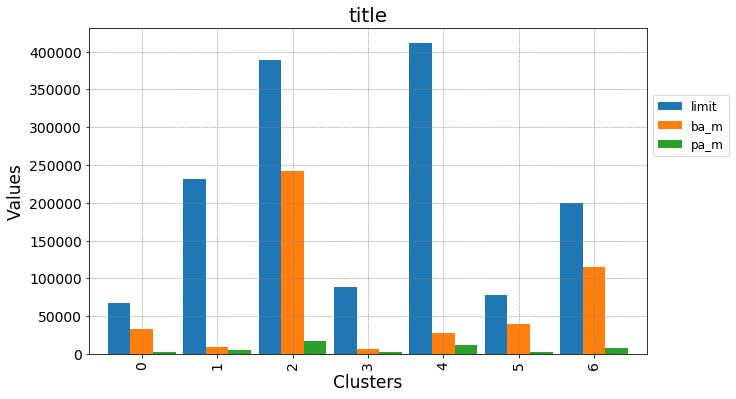

limit,ps-apr,ba_m,pa_m,ps_mode


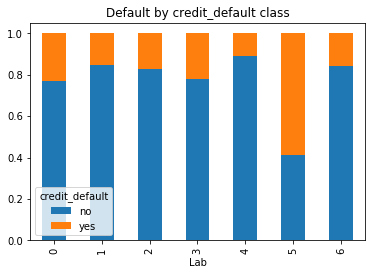

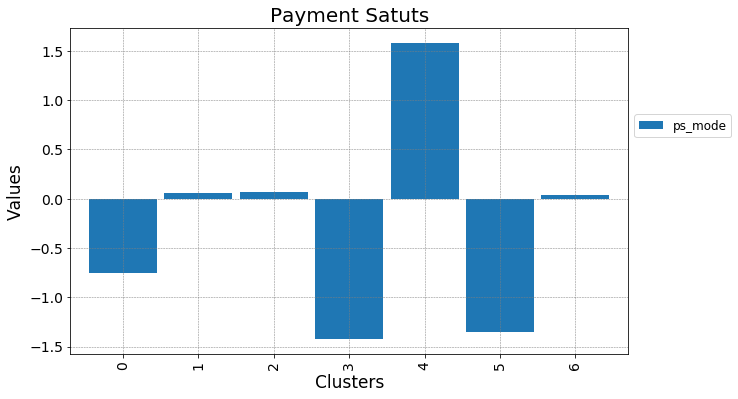

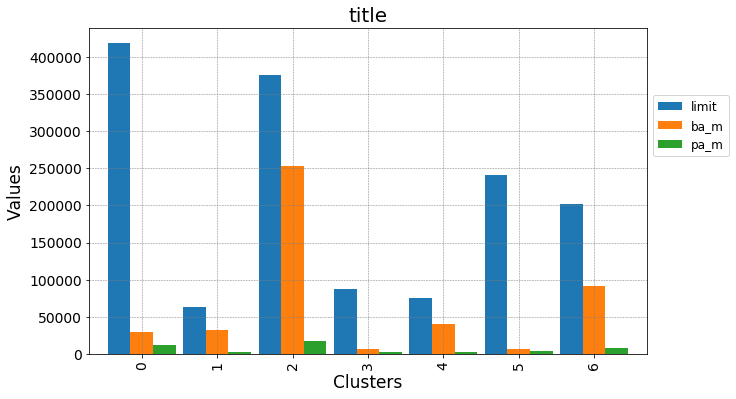

ps-sep,ps-apr,ba-sep,pa_m,ps_mode


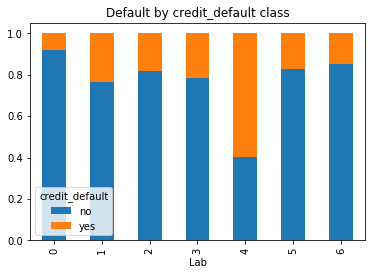

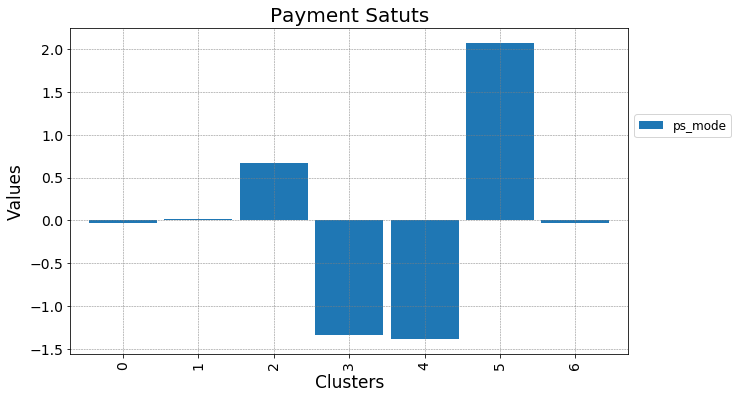

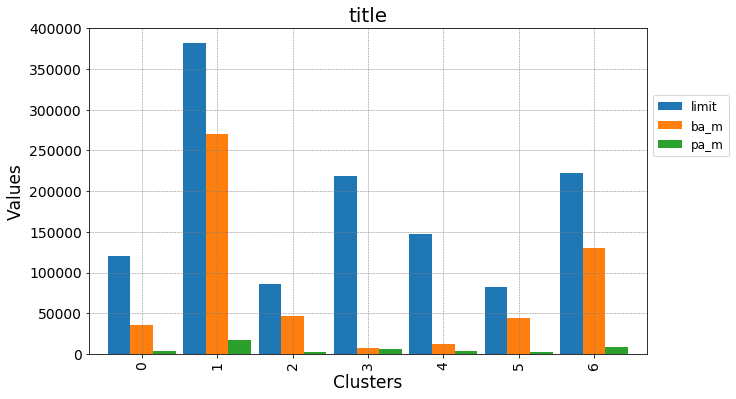

ps-sep,ps-apr,ba_m,pa_m,ps_mode


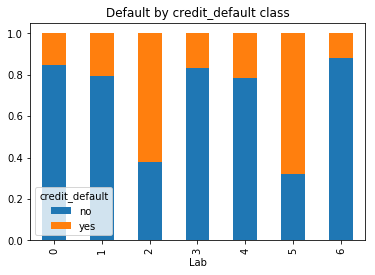

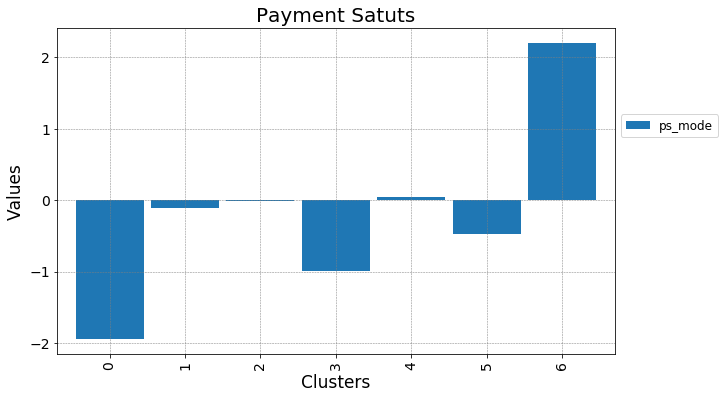

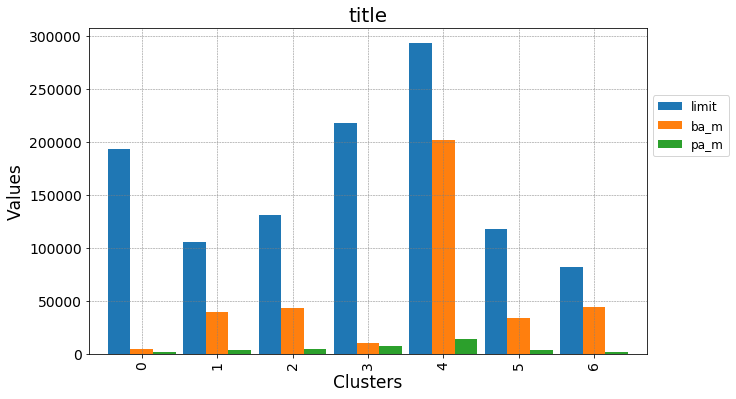

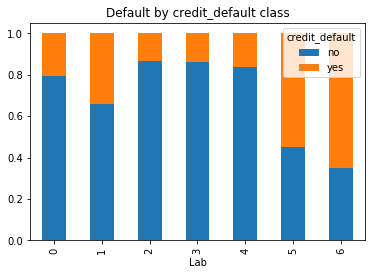

In [30]:
k=5
for c in dictio:
    print(c)
    lab=dictio[c]['Labels'][k]
    data1['Lab']=lab

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'ps_mode':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"Payment Satuts","Clusters","Values",True,"",result.index,0,90,False)

    result=pd.DataFrame(data1.groupby(['Lab'], as_index=False).agg({'limit':np.mean,
                    'ba_m':np.mean,
                    'pa_m':np.mean}))
    result.drop('Lab',axis=1,inplace=True)
    barChart(result,"title","Clusters","Values",True,"",result.index,0,90,False)

    crosstab = pd.crosstab( data1['Lab'], data1['credit_default'],normalize='index')
    crosstab.plot(kind='bar', stacked=True, title='Default by ' + str('credit_default') + ' class')
